# Starbucks Capstone Challenge

### Introduction

This data set contains simulated data that mimics customer behavior on the Starbucks rewards mobile app. Once every few days, Starbucks sends out an offer to users of the mobile app. An offer can be merely an advertisement for a drink or an actual offer such as a discount or BOGO (buy one get one free). Some users might not receive any offer during certain weeks. 

Not all users receive the same offer, and that is the challenge to solve with this data set.

Your task is to combine transaction, demographic and offer data to determine which demographic groups respond best to which offer type. This data set is a simplified version of the real Starbucks app because the underlying simulator only has one product whereas Starbucks actually sells dozens of products.

Every offer has a validity period before the offer expires. As an example, a BOGO offer might be valid for only 5 days. You'll see in the data set that informational offers have a validity period even though these ads are merely providing information about a product; for example, if an informational offer has 7 days of validity, you can assume the customer is feeling the influence of the offer for 7 days after receiving the advertisement.

You'll be given transactional data showing user purchases made on the app including the timestamp of purchase and the amount of money spent on a purchase. This transactional data also has a record for each offer that a user receives as well as a record for when a user actually views the offer. There are also records for when a user completes an offer. 

Keep in mind as well that someone using the app might make a purchase through the app without having received an offer or seen an offer.

### Example

To give an example, a user could receive a discount offer buy 10 dollars get 2 off on Monday. The offer is valid for 10 days from receipt. If the customer accumulates at least 10 dollars in purchases during the validity period, the customer completes the offer.

However, there are a few things to watch out for in this data set. Customers do not opt into the offers that they receive; in other words, a user can receive an offer, never actually view the offer, and still complete the offer. For example, a user might receive the "buy 10 dollars get 2 dollars off offer", but the user never opens the offer during the 10 day validity period. The customer spends 15 dollars during those ten days. There will be an offer completion record in the data set; however, the customer was not influenced by the offer because the customer never viewed the offer.

### Cleaning

This makes data cleaning especially important and tricky.

You'll also want to take into account that some demographic groups will make purchases even if they don't receive an offer. From a business perspective, if a customer is going to make a 10 dollar purchase without an offer anyway, you wouldn't want to send a buy 10 dollars get 2 dollars off offer. You'll want to try to assess what a certain demographic group will buy when not receiving any offers.

### Final Advice

Because this is a capstone project, you are free to analyze the data any way you see fit. For example, you could build a machine learning model that predicts how much someone will spend based on demographics and offer type. Or you could build a model that predicts whether or not someone will respond to an offer. Or, you don't need to build a machine learning model at all. You could develop a set of heuristics that determine what offer you should send to each customer (i.e., 75 percent of women customers who were 35 years old responded to offer A vs 40 percent from the same demographic to offer B, so send offer A).

# Data Sets

The data is contained in three files:

* portfolio.json - containing offer ids and meta data about each offer (duration, type, etc.)
* profile.json - demographic data for each customer
* transcript.json - records for transactions, offers received, offers viewed, and offers completed

Here is the schema and explanation of each variable in the files:

**portfolio.json**
* id (string) - offer id
* offer_type (string) - type of offer ie BOGO, discount, informational
* difficulty (int) - minimum required spend to complete an offer
* reward (int) - reward given for completing an offer
* duration (int) - time for offer to be open, in days
* channels (list of strings)

**profile.json**
* age (int) - age of the customer 
* became_member_on (int) - date when customer created an app account
* gender (str) - gender of the customer (note some entries contain 'O' for other rather than M or F)
* id (str) - customer id
* income (float) - customer's income

**transcript.json**
* event (str) - record description (ie transaction, offer received, offer viewed, etc.)
* person (str) - customer id
* time (int) - time in hours since start of test. The data begins at time t=0
* value - (dict of strings) - either an offer id or transaction amount depending on the record

**Note:** If you are using the workspace, you will need to go to the terminal and run the command `conda update pandas` before reading in the files. This is because the version of pandas in the workspace cannot read in the transcript.json file correctly, but the newest version of pandas can. You can access the termnal from the orange icon in the top left of this notebook.  

You can see how to access the terminal and how the install works using the two images below.  First you need to access the terminal:

<img src="pic1.png"/>

Then you will want to run the above command:

<img src="pic2.png"/>

Finally, when you enter back into the notebook (use the jupyter icon again), you should be able to run the below cell without any errors.

In [1]:
import pandas as pd
import numpy as np
import math
import json

# read in the json files
portfolio = pd.read_json('data/portfolio.json', orient='records', lines=True)
profile = pd.read_json('data/profile.json', orient='records', lines=True)
transcript = pd.read_json('data/transcript.json', orient='records', lines=True)

In [2]:
import datetime

import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
def assess_df(df):
    """
    Simple function to combine various pandas tools to view the data.
    includes info(), describe(), isnull().sum()
    
    Argument:
    Pandas DataFrame
    
    Output:
    
    Print out of DataFrame info, statistical description, and Null value count
    """
    
    pd.options.display.float_format = '{:.8f}'.format
    
    print("*DATAFRAME INFORMATION*")
    print(df.info())
    print()      
    # statistical description
    print("*STATISTICAL DESCRIPTION*")
    print(df.describe())
    print()
    # Count of null rows per column
    print("*MISSING VALUES COUNT*")
    print(df.isnull().sum())
    
assess_df(portfolio)

*DATAFRAME INFORMATION*
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   reward      10 non-null     int64 
 1   channels    10 non-null     object
 2   difficulty  10 non-null     int64 
 3   duration    10 non-null     int64 
 4   offer_type  10 non-null     object
 5   id          10 non-null     object
dtypes: int64(3), object(3)
memory usage: 608.0+ bytes
None

*STATISTICAL DESCRIPTION*
           reward  difficulty    duration
count 10.00000000 10.00000000 10.00000000
mean   4.20000000  7.70000000  6.50000000
std    3.58391468  5.83190459  2.32139805
min    0.00000000  0.00000000  3.00000000
25%    2.00000000  5.00000000  5.00000000
50%    4.00000000  8.50000000  7.00000000
75%    5.00000000 10.00000000  7.00000000
max   10.00000000 20.00000000 10.00000000

*MISSING VALUES COUNT*
reward        0
channels      0
difficulty    0
duration      0
of

In [4]:
portfolio.head()

,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7


In [5]:
assess_df(profile)

*DATAFRAME INFORMATION*
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   id                17000 non-null  object 
 3   became_member_on  17000 non-null  int64  
 4   income            14825 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 664.2+ KB
None

*STATISTICAL DESCRIPTION*
                 age  became_member_on          income
count 17000.00000000    17000.00000000  14825.00000000
mean     62.53141176 20167034.23411765  65404.99156830
std      26.73857995    11677.49996079  21598.29941023
min      18.00000000 20130729.00000000  30000.00000000
25%      45.00000000 20160526.00000000  49000.00000000
50%      58.00000000 20170802.00000000  64000.00000000
75%      73.00000000 20171230.00000000  80000.00000000
max

In [6]:
profile.head()

,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,nan
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.00000000
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,nan
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.00000000
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,nan


In [7]:
assess_df(transcript)

*DATAFRAME INFORMATION*
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306534 entries, 0 to 306533
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   person  306534 non-null  object
 1   event   306534 non-null  object
 2   value   306534 non-null  object
 3   time    306534 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 9.4+ MB
None

*STATISTICAL DESCRIPTION*
                 time
count 306534.00000000
mean     366.38293958
std      200.32631352
min        0.00000000
25%      186.00000000
50%      408.00000000
75%      528.00000000
max      714.00000000

*MISSING VALUES COUNT*
person    0
event     0
value     0
time      0
dtype: int64


In [8]:
transcript.head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [9]:
print('Portfolio: \n', portfolio.head(1))
print('Profile: \n', profile.head(1))
print('Transcript: \n', transcript.head(1))

Portfolio: 
    reward                 channels  difficulty  duration offer_type  \
0      10  [email, mobile, social]          10         7       bogo   

                                 id  
0  ae264e3637204a6fb9bb56bc8210ddfd  
Profile: 
   gender  age                                id  became_member_on  income
0   None  118  68be06ca386d4c31939f3a4f0e3dd783          20170212     nan
Transcript: 
                              person           event  \
0  78afa995795e4d85b5d9ceeca43f5fef  offer received   

                                              value  time  
0  {'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'}     0  


In [10]:
df1 = portfolio.copy()
df1.dropna(inplace=True)
offer_type_dummies = pd.get_dummies(df1['offer_type'], prefix = str('offer_type')+ '_')
channels_dummies = (df1['channels'].str.join(sep='|')
                    .str.get_dummies(sep='|')
                    .add_prefix(str('channels')+ '_')
                   )
df1 = df1.drop(['channels', 'offer_type'], axis=1)

df1 = df1.rename(columns = {'id': 'offer_id', 
                          'reward': 'offer_reward', 
                          'difficulty': 'offer_difficulty', 
                          'duration': 'offer_duration'})
df1 = pd.concat([df1, offer_type_dummies, channels_dummies], axis=1)

In [11]:
df3 = transcript.copy()
df3 = df3.rename(columns = {'person': 'user_id'})

df3["amount"] = df3["value"].apply(lambda x: x["amount"] 
                                   if "amount" in x 
                                   else np.nan)
df3["id"] = df3["value"].apply(lambda x: x["offer id"] 
                               if "offer id" in x 
                               else (x["offer_id"] 
                                     if "offer_id" in x 
                                     else np.nan))

df3 = df3.rename(columns = {'id': 'offer_id'})

df3.drop('value', axis=1)

,user_id,event,time,amount,offer_id
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0
...,...,...,...,...,...
306529,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59000000,NaN
306530,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53000000,NaN
306531,a00058cf10334a308c68e7631c529907,transaction,714,3.61000000,NaN
306532,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53000000,NaN


In [12]:
def clean_dataframe(df1 = portfolio, df2 = profile, df3 = transcript):
    
    '''
    Clean columns in dataframe

    Arguments:
        df1: portfolio DataFrame 
        df1: profile DataFrame 
        df1: transcript DataFrame 

    Output:
        df: Cleaned and concatenated DataFrames
    '''
    
    
    # Portfolio Dataframe cleaning
    # ['reward', 'channels', 'difficulty', 'duration', 'offer_type', 'id'] (duration is in days)
    df1 = df1.copy()
    df1.dropna(inplace=True)
    offer_type_dummies = pd.get_dummies(df1['offer_type'], prefix = str('offer_type')+ '_')
    channels_dummies = (df1['channels'].str.join(sep='|')
                        .str.get_dummies(sep='|')
                        .add_prefix(str('channels')+ '_')
                       )
    # df1 = df1.drop(['channels', 'offer_type'], axis=1) # keep columns for ease of visualization
    
    df1 = df1.rename(columns = {'id': 'offer_id', 
                              'reward': 'offer_reward', 
                              'difficulty': 'offer_difficulty', 
                              'duration': 'offer_duration'})
    df1 = pd.concat([df1, offer_type_dummies, channels_dummies], axis=1)

    # Profile Dataframe cleaning
    # ['gender', 'age', 'id', 'became_member_on', 'income']
    df2 = df2.copy()
    df2 = df2.dropna()
    df2['became_member_on'] = pd.to_datetime(df2['became_member_on'], 
                                             format = '%Y%m%d')
    df2 = df2.rename(columns = {'id': 'customer_id'}) 
    
    # Transcript Dataframe Cleaning
    # ['person', 'event', 'value', 'time'] (Time is in hours)
    df3 = df3.copy()
    df3 = df3.rename(columns = {'person': 'customer_id'})

    df3["amount"] = df3["value"].apply(lambda x: x["amount"] 
                                       if "amount" in x 
                                       else np.nan)
    df3["id"] = df3["value"].apply(lambda x: x["offer id"] 
                                   if "offer id" in x 
                                   else (x["offer_id"] 
                                         if "offer_id" in x 
                                         else np.nan))
    
    df3 = df3.rename(columns = {'id': 'offer_id'})
    df3['event_instance_days'] = df3['time']/24
    df3 = df3.drop('value', axis=1)
        
    df = pd.merge(df3, df2, how='left',on='customer_id')
    print(df.shape)
    df = pd.merge(df, df1, how='left', on='offer_id')
    print(df.shape)
    return df

In [13]:
df_combined = clean_dataframe()

(306534, 10)
(306534, 22)


In [227]:
pd.set_option('display.max_columns', 500)

In [228]:
pd.set_option('display.max_rows', 500)

In [17]:
print(df_combined.shape)
print(portfolio.shape[0] + profile.shape[0] + transcript.shape[0])
print(profile.id.nunique())
print(transcript.person.nunique())
print(df_combined.customer_id.nunique())
df_combined.sample(10)

(306534, 22)
323544
17000
17000
17000


,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
169152,df21032020524a05861095e57efcab46,offer viewed,414,nan,fafdcd668e3743c1bb461111dcafc2a4,17.25000000,F,55.00000000,2017-12-06,75000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
249938,b02abf5ae76a468c9d0c20d3f85fc7d4,offer received,576,nan,2298d6c36e964ae4a3e7e9706d1fb8c2,24.00000000,M,45.00000000,2017-04-12,96000.00000000,3.00000000,"[web, email, mobile, social]",7.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
33952,8d426eecc914405d9ff2b8da724986a7,transaction,60,1.11000000,NaN,2.50000000,NaN,nan,NaT,nan,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan
64461,ac48f0c8cf884d2cb2e9a607182d1138,offer received,168,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,7.00000000,M,62.00000000,2016-05-12,64000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
246120,f737e0998baf492e9ecee3649deb03f7,offer received,576,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,24.00000000,F,81.00000000,2015-07-29,88000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
153232,d438a838e9f74fa99c3a53f53d73afd4,offer received,408,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,17.00000000,F,53.00000000,2016-11-16,106000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
31707,ec894ba87ade4d5d8a980e0b51c7fcd0,transaction,54,28.87000000,NaN,2.25000000,F,38.00000000,2016-06-24,55000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan
199508,e1ebace31de14ee086f3080df454a37a,transaction,492,0.83000000,NaN,20.50000000,M,21.00000000,2015-08-01,40000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan
69285,4b4e9b38af2a492ebc9af02ea88a44b9,offer viewed,168,nan,5a8bc65990b245e5a138643cd4eb9837,7.00000000,F,48.00000000,2018-05-16,60000.00000000,0.00000000,"[email, mobile, social]",0.00000000,3.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000
127850,11bfe79e5bdb4db7b08b0a8d0314cc2f,offer viewed,342,nan,f19421c1d4aa40978ebb69ca19b0e20d,14.25000000,F,47.00000000,2017-12-21,33000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [18]:
df_combined.to_csv('data/processed_data.csv', index = False)

In [19]:
plt.style.use('seaborn-dark-palette')

In [20]:
gender = df_combined.groupby(['event','gender'])['customer_id'].count().sort_values()

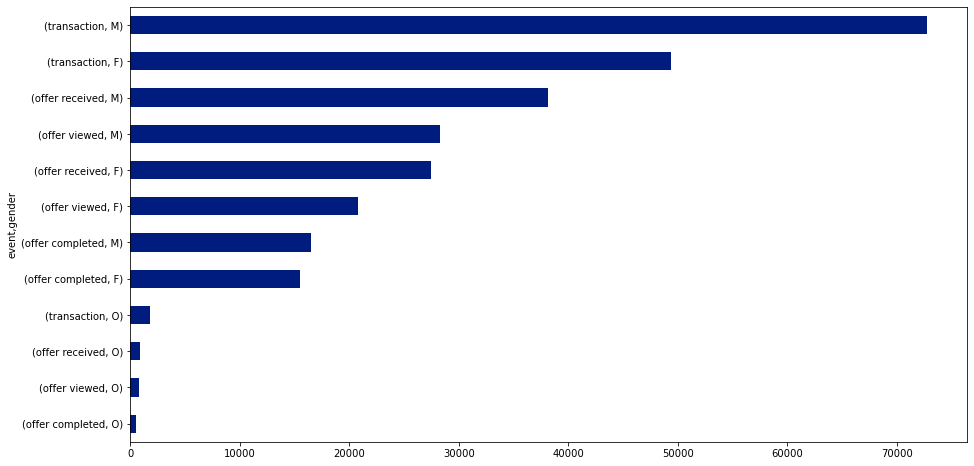

In [21]:
gender.plot.barh(figsize=(15,8));

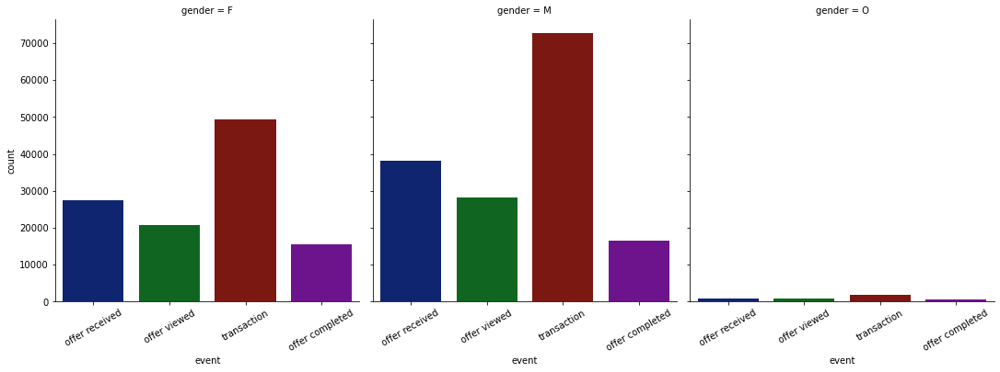

In [22]:
gender_event_plot = sns.catplot(data = df_combined, x = 'event', kind = 'count', col = 'gender', orient='h');
gender_event_plot.set_xticklabels(rotation=30);

In [23]:
import random

Text(0.5, 15.440000000000012, 'Age')

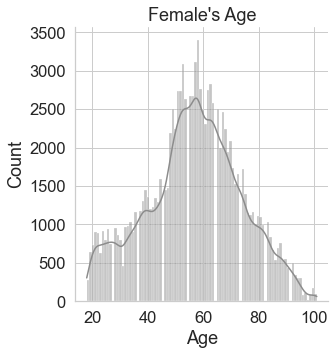

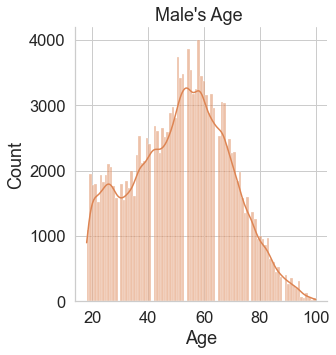

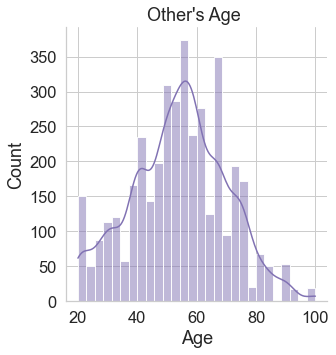

In [24]:
sns.set(style = 'whitegrid', font_scale = 1.5)
palette = sns.color_palette()

sns.displot(df_combined[df_combined['gender'] == 'F']['age'], color = palette[random.randint(0,9)], kde=True);
plt.title('Female\'s Age')
plt.xlabel('Age')
plt.ylabel('Count')

sns.displot(df_combined[df_combined['gender'] == 'M']['age'], color = palette[random.randint(0,9)],kde=True);
plt.title('Male\'s Age ')
plt.xlabel('Age')

sns.displot(df_combined[df_combined['gender'] == 'O']['age'], color = palette[random.randint(0,9)], kde=True);
plt.title('Other\'s Age ')
plt.xlabel('Age')

Text(0.5, 15.440000000000012, 'Income($)')

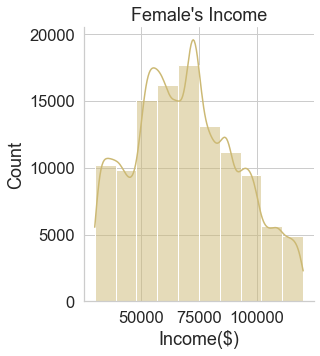

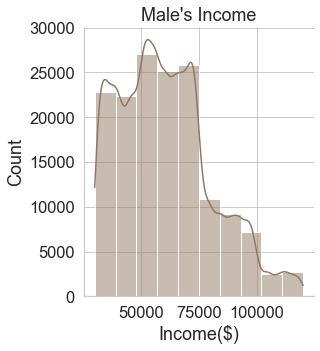

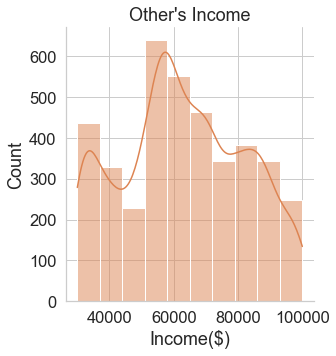

In [25]:
palette = sns.color_palette()

sns.displot(df_combined[df_combined['gender'] == 'F']['income'], bins = 10, color = palette[random.randint(0,9)], kde=True);
plt.title('Female\'s Income')
plt.xlabel('Income($)')
plt.ylabel('Count')

sns.displot(df_combined[df_combined['gender'] == 'M']['income'], bins = 10, color = palette[random.randint(0,9)], kde=True);
plt.title('Male\'s Income')
plt.xlabel('Income($)')

sns.displot(df_combined[df_combined['gender'] == 'O']['income'], bins = 10, color = palette[random.randint(0,9)], kde=True);
plt.title('Other\'s Income')
plt.xlabel('Income($)')

In [26]:
percentage = transcript['event'].value_counts()*100/len(transcript)
val_trans = percentage.values.tolist()
event_type = percentage.index.tolist()

import plotly.express as px
fig = px.pie(df_combined, 
             values = val_trans, 
             names = event_type, 
             color= event_type,
             color_discrete_map={'transaction':'lightcyan',
                                 'offer received':'cyan',
                                 'offer viewed':'royalblue',
                                 'offer completed':'darkblue'})

fig.show()

In [27]:
df_combined.head()

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.00000000,F,75.00000000,2017-05-09,100000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,NaN,nan,NaT,nan,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5,0.00000000,M,68.00000000,2018-04-26,70000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,NaN,nan,NaT,nan,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0,0.00000000,NaN,nan,NaT,nan,10.00000000,"[web, email, mobile, social]",10.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [206]:
subset = df_combined.loc[df_combined['offer_id']=='9b98b8c7a33c4b65b9aebfe6a799e6d9']

In [207]:
subset.loc[subset.customer_id=='087d0fcdbf294f7494a96d8d6a56cf41']

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
248901,087d0fcdbf294f7494a96d8d6a56cf41,offer received,576,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,24.00000000,F,26.00000000,2013-08-26,72000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
301678,087d0fcdbf294f7494a96d8d6a56cf41,offer viewed,690,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,28.75000000,F,26.00000000,2013-08-26,72000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
306348,087d0fcdbf294f7494a96d8d6a56cf41,offer completed,714,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,29.75000000,F,26.00000000,2013-08-26,72000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000


####  user 087d0fcdbf294f7494a96d8d6a56cf41 received a BOGO (9b98b8c7a33c4b65b9aebfe6a799e6d9) offer 26 days into the recording, which has a *duration* of 7 days (ending on the 33rd day of recording). She viewed the offer in 4.75 days then completed the offer in 5.75 from receiving. 

####  so the event_instance_days column could be logically interpreted for offer relevance as:
`((row[offer completed][event_instance_days] - row[offer received][event_instance_days]) < offer_duration)` 

####  it's very likely that this user was influenced by the BOGO offer since she used the offer within that duration period

In [231]:
duration_groupby = df_combined.groupby(['customer_id', 'offer_type', 'offer_id','event'])[['time', 'event_instance_days']].max().reset_index()

In [233]:
duration_groupby[duration_groupby.customer_id=='0009655768c64bdeb2e877511632db8f']

,customer_id,offer_type,offer_id,event,time,event_instance_days
0,0009655768c64bdeb2e877511632db8f,bogo,f19421c1d4aa40978ebb69ca19b0e20d,offer completed,414,17.25000000
1,0009655768c64bdeb2e877511632db8f,bogo,f19421c1d4aa40978ebb69ca19b0e20d,offer received,408,17.00000000
2,0009655768c64bdeb2e877511632db8f,bogo,f19421c1d4aa40978ebb69ca19b0e20d,offer viewed,456,19.00000000
3,0009655768c64bdeb2e877511632db8f,discount,2906b810c7d4411798c6938adc9daaa5,offer completed,576,24.00000000
4,0009655768c64bdeb2e877511632db8f,discount,2906b810c7d4411798c6938adc9daaa5,offer received,576,24.00000000
5,0009655768c64bdeb2e877511632db8f,discount,fafdcd668e3743c1bb461111dcafc2a4,offer completed,528,22.00000000
6,0009655768c64bdeb2e877511632db8f,discount,fafdcd668e3743c1bb461111dcafc2a4,offer received,504,21.00000000
7,0009655768c64bdeb2e877511632db8f,discount,fafdcd668e3743c1bb461111dcafc2a4,offer viewed,540,22.50000000
8,0009655768c64bdeb2e877511632db8f,informational,3f207df678b143eea3cee63160fa8bed,offer received,336,14.00000000
9,0009655768c64bdeb2e877511632db8f,informational,3f207df678b143eea3cee63160fa8bed,offer viewed,372,15.50000000


In [211]:
dftest = [[10,100,99],[20,280,300],[30,680,700]   ]
dftest = pd.DataFrame(dftest, columns = ['strike_price', 'ask','bid']) 
dftest = dftest.set_index('strike_price')

In [214]:
dftest

,ask,bid
strike_price,,
10,100,99
20,280,300
30,680,700


In [237]:
dftest['ask']-dftest['ask'].shift(-2)

strike_price
10   -580.00000000
20             nan
30             nan
Name: ask, dtype: float64

In [239]:
df_combined.head()

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.00000000,F,75.00000000,2017-05-09,100000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,NaN,nan,NaT,nan,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5,0.00000000,M,68.00000000,2018-04-26,70000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,NaN,nan,NaT,nan,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0,0.00000000,NaN,nan,NaT,nan,10.00000000,"[web, email, mobile, social]",10.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [246]:
df_combined.groupby(['customer_id', 'offer_id']).time.count()

customer_id                       offer_id                        
0009655768c64bdeb2e877511632db8f  2906b810c7d4411798c6938adc9daaa5    2
                                  3f207df678b143eea3cee63160fa8bed    2
                                  5a8bc65990b245e5a138643cd4eb9837    2
                                  f19421c1d4aa40978ebb69ca19b0e20d    3
                                  fafdcd668e3743c1bb461111dcafc2a4    3
                                                                     ..
fffad4f4828548d1b5583907f2e9906b  f19421c1d4aa40978ebb69ca19b0e20d    6
ffff82501cea40309d5fdd7edcca4a07  0b1e1539f2cc45b7b9fa7c272da2e1d7    3
                                  2906b810c7d4411798c6938adc9daaa5    9
                                  9b98b8c7a33c4b65b9aebfe6a799e6d9    3
                                  fafdcd668e3743c1bb461111dcafc2a4    3
Name: time, Length: 63288, dtype: int64

In [247]:
df_combined.loc[(df_combined.customer_id=='ffff82501cea40309d5fdd7edcca4a07') & (df_combined.offer_id=='2906b810c7d4411798c6938adc9daaa5')]

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
112214,ffff82501cea40309d5fdd7edcca4a07,offer received,336,nan,2906b810c7d4411798c6938adc9daaa5,14.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
133074,ffff82501cea40309d5fdd7edcca4a07,offer viewed,354,nan,2906b810c7d4411798c6938adc9daaa5,14.75000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
143788,ffff82501cea40309d5fdd7edcca4a07,offer completed,384,nan,2906b810c7d4411798c6938adc9daaa5,16.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
152030,ffff82501cea40309d5fdd7edcca4a07,offer received,408,nan,2906b810c7d4411798c6938adc9daaa5,17.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
168022,ffff82501cea40309d5fdd7edcca4a07,offer viewed,414,nan,2906b810c7d4411798c6938adc9daaa5,17.25000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
168024,ffff82501cea40309d5fdd7edcca4a07,offer completed,414,nan,2906b810c7d4411798c6938adc9daaa5,17.25000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
246495,ffff82501cea40309d5fdd7edcca4a07,offer received,576,nan,2906b810c7d4411798c6938adc9daaa5,24.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
258362,ffff82501cea40309d5fdd7edcca4a07,offer completed,576,nan,2906b810c7d4411798c6938adc9daaa5,24.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
262475,ffff82501cea40309d5fdd7edcca4a07,offer viewed,582,nan,2906b810c7d4411798c6938adc9daaa5,24.25000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000


In [305]:
df_event_groupby_offer_id = df_combined.groupby(['offer_id', 'customer_id']).event.count()>=3

In [263]:
# df_event_groupby_offer_id = df_event_groupby_offer_id.reset_index()

In [418]:
case_0 = df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True].index[13][0]

case2_0 = df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True].index[13][1]

In [419]:
case_example_c1e5 = df_combined.loc[(df_combined.offer_id==case_0) & (df_combined.customer_id==case2_0)]

In [420]:
case_example_c1e5.index

Int64Index([61255, 93086, 158728, 173252], dtype='int64')

In [422]:
test_case = df_combined.iloc[case_example_c1e5.index]

In [423]:
df_combined.loc[test_case.index,'offer valid'] = np.where(
    (test_case[test_case['event']=='offer completed']['time'].values[0] 
         > test_case[
             test_case['event']=='offer viewed']
         ['time'].values[0]), 1, 0)

In [424]:
df_combined.loc[test_case.index]

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer valid
61255,0196d2062b8d4d019b8d96292266e8a4,offer received,168,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,7.00000000,F,60.00000000,2018-03-22,51000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000
93086,0196d2062b8d4d019b8d96292266e8a4,offer completed,240,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,10.00000000,F,60.00000000,2018-03-22,51000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000
158728,0196d2062b8d4d019b8d96292266e8a4,offer received,408,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,17.00000000,F,60.00000000,2018-03-22,51000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000
173252,0196d2062b8d4d019b8d96292266e8a4,offer viewed,420,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,17.50000000,F,60.00000000,2018-03-22,51000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000


In [380]:
df_combined['offer_valid'] = np.nan

In [388]:
df_combined.loc[case_example_c1e5.index, 'offer_valid'] = 1

In [389]:
df_combined.loc[case_example_c1e5.index]['offer_valid']

153697   1.00000000
177937   1.00000000
258980   1.00000000
Name: offer_valid, dtype: float64

In [390]:
df_combined.loc[case_example_c1e5.index,'offer valid'] = np.where(
    (case_example_c1e5[case_example_c1e5['event']=='offer completed']['time'].values[0] 
         > case_example_c1e5[
             case_example_c1e5['event']=='offer viewed']
         ['time'].values[0]), 1, 0)

In [391]:
df_combined.loc[case_example_c1e5.index]

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid,offer valid
153697,0011e0d4e6b944f998e987f904e8c1e5,offer received,408,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,17.00000000,O,40.00000000,2018-01-09,57000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000
177937,0011e0d4e6b944f998e987f904e8c1e5,offer viewed,432,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,18.00000000,O,40.00000000,2018-01-09,57000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000
258980,0011e0d4e6b944f998e987f904e8c1e5,offer completed,576,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,24.00000000,O,40.00000000,2018-01-09,57000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000


In [450]:
df_combined.drop('offer valid', axis=1, inplace=True)

In [451]:
df_combined.head()

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.00000000,F,75.00000000,2017-05-09,100000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,NaN,nan,NaT,nan,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5,0.00000000,M,68.00000000,2018-04-26,70000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,NaN,nan,NaT,nan,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0,0.00000000,NaN,nan,NaT,nan,10.00000000,"[web, email, mobile, social]",10.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [550]:
df_event_groupby_offer_id_test = df_combined.groupby(['customer_id', 'offer_id']).event.count()>=3

In [551]:
df_event_groupby_offer_id_test.loc[df_event_groupby_offer_id_test==True]

customer_id                       offer_id                        
0009655768c64bdeb2e877511632db8f  f19421c1d4aa40978ebb69ca19b0e20d    True
                                  fafdcd668e3743c1bb461111dcafc2a4    True
00116118485d4dfda04fdbaba9a87b5c  f19421c1d4aa40978ebb69ca19b0e20d    True
0011e0d4e6b944f998e987f904e8c1e5  0b1e1539f2cc45b7b9fa7c272da2e1d7    True
                                  2298d6c36e964ae4a3e7e9706d1fb8c2    True
                                                                      ... 
fffad4f4828548d1b5583907f2e9906b  f19421c1d4aa40978ebb69ca19b0e20d    True
ffff82501cea40309d5fdd7edcca4a07  0b1e1539f2cc45b7b9fa7c272da2e1d7    True
                                  2906b810c7d4411798c6938adc9daaa5    True
                                  9b98b8c7a33c4b65b9aebfe6a799e6d9    True
                                  fafdcd668e3743c1bb461111dcafc2a4    True
Name: event, Length: 29529, dtype: bool

In [560]:
case = df_event_groupby_offer_id_test.loc[df_event_groupby_offer_id_test==True].index[0][1]
case2 = df_event_groupby_offer_id_test.loc[df_event_groupby_offer_id_test==True].index[0][0]
case_filter = df_combined.loc[(df_combined.offer_id==case) & (df_combined.customer_id==case2)]

In [507]:
df_combined['offer_valid'] = np.nan

In [561]:
case_filter

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid
153401,0009655768c64bdeb2e877511632db8f,offer received,408,nan,f19421c1d4aa40978ebb69ca19b0e20d,17.00000000,M,33.00000000,2017-04-21,72000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,nan
168413,0009655768c64bdeb2e877511632db8f,offer completed,414,nan,f19421c1d4aa40978ebb69ca19b0e20d,17.25000000,M,33.00000000,2017-04-21,72000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,nan
187554,0009655768c64bdeb2e877511632db8f,offer viewed,456,nan,f19421c1d4aa40978ebb69ca19b0e20d,19.00000000,M,33.00000000,2017-04-21,72000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,nan


In [532]:
df_combined.loc[37992, 'offer_valid']

nan

In [521]:
df_combined.loc[case_filter.index[0], 'offer_valid']

nan

In [519]:
case_filter.index[0]

10413

In [448]:
df_combined.loc[case_filter.index]

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer valid,offer_valid
10413,0494aa6671414fab9837fa3cd45e72bc,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000
37992,0494aa6671414fab9837fa3cd45e72bc,offer viewed,78,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,3.25000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000
51199,0494aa6671414fab9837fa3cd45e72bc,offer completed,150,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,6.25000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000
161099,0494aa6671414fab9837fa3cd45e72bc,offer received,408,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,17.00000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000
182082,0494aa6671414fab9837fa3cd45e72bc,offer completed,438,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,18.25000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000
211985,0494aa6671414fab9837fa3cd45e72bc,offer received,504,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,21.00000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000
291193,0494aa6671414fab9837fa3cd45e72bc,offer completed,648,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,27.00000000,F,71.00000000,2016-02-10,36000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,nan,1.00000000


In [794]:
grouplist = ['customer_id','event','offer_id', 'time','offer_type','offer_valid', 'channels']

In [719]:
df_event_groupby_offer_id_test = df_combined.groupby(['customer_id'])[grouplist]

In [722]:
df_event_groupby_offer_id_test.head()

,customer_id,event,offer_id,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,9b98b8c7a33c4b65b9aebfe6a799e6d9,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,0b1e1539f2cc45b7b9fa7c272da2e1d7,0
2,e2127556f4f64592b11af22de27a7932,offer received,2906b810c7d4411798c6938adc9daaa5,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,fafdcd668e3743c1bb461111dcafc2a4,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,4d5c57ea9a6940dd891ad53e9dbe8da0,0
...,...,...,...,...
302551,6a71281072f7470785e859df21d3c2c5,transaction,transaction_offer,696
302819,dd718ccfdb534078b6dac7ed3ea78673,transaction,transaction_offer,696
304101,76cce6e2462f4b08a83ba86758b85e95,transaction,transaction_offer,702
304128,8d7f019460c6461e9eb6d2022d8b84ef,transaction,transaction_offer,702


In [705]:
case = df_event_groupby_offer_id_test.loc[df_event_groupby_offer_id_test==True].index[2][0]
case2 = df_event_groupby_offer_id_test.loc[df_event_groupby_offer_id_test==True].index[8][1]
case_filter = df_combined.loc[(df_combined.customer_id==case) & (df_combined.offer_id==case2)]
case_filter = case_filter.sort_values(['customer_id', 'time', 'offer_id'])

In [706]:
case_filter

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid


In [765]:
customer_list = ['0009655768c64bdeb2e877511632db8f','00116118485d4dfda04fdbaba9a87b5c', 'ffff82501cea40309d5fdd7edcca4a07']

In [753]:
customer_test = df_combined.loc[df_combined.customer_id=='0009655768c64bdeb2e877511632db8f'].sort_values(['customer_id', 
                                                                                          'time', 
                                                                                          'offer_id'])

In [766]:
customer_test = df_combined.loc[df_combined.customer_id.isin(customer_list)].sort_values(['customer_id', 
                                                                                          'time', 
                                                                                          'offer_id'])

In [770]:
customer_test

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid
55972,0009655768c64bdeb2e877511632db8f,offer received,168,nan,5a8bc65990b245e5a138643cd4eb9837,7.00000000,M,33.00000000,2017-04-21,72000.00000000,0.00000000,"[email, mobile, social]",0.00000000,3.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000,nan
77705,0009655768c64bdeb2e877511632db8f,offer viewed,192,nan,5a8bc65990b245e5a138643cd4eb9837,8.00000000,M,33.00000000,2017-04-21,72000.00000000,0.00000000,"[email, mobile, social]",0.00000000,3.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000,nan
89291,0009655768c64bdeb2e877511632db8f,transaction,228,22.16000000,transaction_offer,9.50000000,M,33.00000000,2017-04-21,72000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
113605,0009655768c64bdeb2e877511632db8f,offer received,336,nan,3f207df678b143eea3cee63160fa8bed,14.00000000,M,33.00000000,2017-04-21,72000.00000000,0.00000000,"[web, email, mobile]",0.00000000,4.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,0.00000000,1.00000000,nan
139992,0009655768c64bdeb2e877511632db8f,offer viewed,372,nan,3f207df678b143eea3cee63160fa8bed,15.50000000,M,33.00000000,2017-04-21,72000.00000000,0.00000000,"[web, email, mobile]",0.00000000,4.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,0.00000000,1.00000000,nan
153401,0009655768c64bdeb2e877511632db8f,offer received,408,nan,f19421c1d4aa40978ebb69ca19b0e20d,17.00000000,M,33.00000000,2017-04-21,72000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000
168413,0009655768c64bdeb2e877511632db8f,offer completed,414,nan,f19421c1d4aa40978ebb69ca19b0e20d,17.25000000,M,33.00000000,2017-04-21,72000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000
168412,0009655768c64bdeb2e877511632db8f,transaction,414,8.57000000,transaction_offer,17.25000000,M,33.00000000,2017-04-21,72000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
187554,0009655768c64bdeb2e877511632db8f,offer viewed,456,nan,f19421c1d4aa40978ebb69ca19b0e20d,19.00000000,M,33.00000000,2017-04-21,72000.00000000,5.00000000,"[web, email, mobile, social]",5.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,nan
204340,0009655768c64bdeb2e877511632db8f,offer received,504,nan,fafdcd668e3743c1bb461111dcafc2a4,21.00000000,M,33.00000000,2017-04-21,72000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000


In [797]:
df_combined.loc[customer_test.index][grouplist].to_clipboard(sep='|')

In [768]:
range(len(customer_test))

range(0, 60)

In [780]:
testnumber = 6
df_combined.loc[customer_test.index[testnumber-1], 'offer_valid']

0.0

In [792]:
for i in range(len(customer_test)):
    print(i)
    
    if (customer_test.iloc[i]['event']=='transaction' 
    and customer_test.iloc[i]['time']==customer_test.iloc[i-1]['time']
    and customer_test.iloc[i-2]['event']=='offer viewed'):
        print('valid transaction influence')
        df_combined.loc[customer_test.index[i-3], 'offer_valid'] = 1
        df_combined.loc[customer_test.index[i-2], 'offer_valid'] = 1
        df_combined.loc[customer_test.index[i-1], 'offer_valid'] = 1
        df_combined.loc[customer_test.index[i], 'offer_valid'] = 1
    elif customer_test.iloc[i]['event']=='offer received':
        print('received')
        df_combined.loc[customer_test.index[i], 'offer_valid'] = 0
            
    elif customer_test.iloc[i]['event']=='offer viewed':
        print('viewed')
        df_combined.loc[customer_test.index[i], 'offer_valid'] = 0
            
    elif customer_test.iloc[i]['event']=='offer completed':
        print('completed')
        df_combined.loc[customer_test.index[i], 'offer_valid'] = 0
            
    elif (customer_test.iloc[i]['event']=='transaction'
    and customer_test.iloc[i-1]['offer_type']=='informational'):
        print('possible influencer')
        print(customer_test.iloc[i-1]['offer_id'])
        
        df_combined.loc[customer_test.index[i-2], 'offer_valid'] = 1
        df_combined.loc[customer_test.index[i-1], 'offer_valid'] = 1
        df_combined.loc[customer_test.index[i], 'offer_valid'] = 1
         
    else:
        print('uninfluenced transaction')
        df_combined.loc[customer_test.index[i], 'offer_valid'] = 0

0
received
1
viewed
2
possible influencer
5a8bc65990b245e5a138643cd4eb9837
3
received
4
viewed
5
received
6
completed
7
uninfluenced transaction
8
viewed
9
received
10
completed
11
uninfluenced transaction
12
viewed
13
uninfluenced transaction
14
received
15
completed
16
uninfluenced transaction
17
uninfluenced transaction
18
uninfluenced transaction
19
uninfluenced transaction
20
received
21
viewed
22
uninfluenced transaction
23
uninfluenced transaction
24
uninfluenced transaction
25
received
26
viewed
27
received
28
viewed
29
completed
30
valid transaction influence
31
uninfluenced transaction
32
uninfluenced transaction
33
received
34
viewed
35
completed
36
valid transaction influence
37
uninfluenced transaction
38
uninfluenced transaction
39
uninfluenced transaction
40
uninfluenced transaction
41
received
42
viewed
43
completed
44
valid transaction influence
45
received
46
viewed
47
completed
48
valid transaction influence
49
uninfluenced transaction
50
received
51
completed
52
uni

In [635]:
df_combined.loc[df_combined.customer_id=='ffff82501cea40309d5fdd7edcca4a07'].sort_values(['customer_id', 
                                                                                          'time', 
                                                                                          'offer_id'])

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid
1393,ffff82501cea40309d5fdd7edcca4a07,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000
15836,ffff82501cea40309d5fdd7edcca4a07,offer viewed,6,nan,fafdcd668e3743c1bb461111dcafc2a4,0.25000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000
32763,ffff82501cea40309d5fdd7edcca4a07,offer completed,60,nan,fafdcd668e3743c1bb461111dcafc2a4,2.50000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000
32762,ffff82501cea40309d5fdd7edcca4a07,transaction,60,16.06000000,transaction_offer,2.50000000,F,45.00000000,2016-11-25,62000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
37060,ffff82501cea40309d5fdd7edcca4a07,transaction,78,7.18000000,transaction_offer,3.25000000,F,45.00000000,2016-11-25,62000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
45575,ffff82501cea40309d5fdd7edcca4a07,transaction,120,9.12000000,transaction_offer,5.00000000,F,45.00000000,2016-11-25,62000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
54574,ffff82501cea40309d5fdd7edcca4a07,offer received,168,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,7.00000000,F,45.00000000,2016-11-25,62000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000
69626,ffff82501cea40309d5fdd7edcca4a07,offer viewed,174,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,7.25000000,F,45.00000000,2016-11-25,62000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000
79668,ffff82501cea40309d5fdd7edcca4a07,offer completed,198,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,8.25000000,F,45.00000000,2016-11-25,62000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000
79667,ffff82501cea40309d5fdd7edcca4a07,transaction,198,22.88000000,transaction_offer,8.25000000,F,45.00000000,2016-11-25,62000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan


In [603]:
test = ()

In [723]:
df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True]

customer_id                       offer_id                        
0009655768c64bdeb2e877511632db8f  f19421c1d4aa40978ebb69ca19b0e20d    True
                                  fafdcd668e3743c1bb461111dcafc2a4    True
00116118485d4dfda04fdbaba9a87b5c  f19421c1d4aa40978ebb69ca19b0e20d    True
0011e0d4e6b944f998e987f904e8c1e5  0b1e1539f2cc45b7b9fa7c272da2e1d7    True
                                  2298d6c36e964ae4a3e7e9706d1fb8c2    True
                                                                      ... 
fffad4f4828548d1b5583907f2e9906b  f19421c1d4aa40978ebb69ca19b0e20d    True
ffff82501cea40309d5fdd7edcca4a07  0b1e1539f2cc45b7b9fa7c272da2e1d7    True
                                  2906b810c7d4411798c6938adc9daaa5    True
                                  9b98b8c7a33c4b65b9aebfe6a799e6d9    True
                                  fafdcd668e3743c1bb461111dcafc2a4    True
Name: event, Length: 29529, dtype: bool

In [627]:
df_combined.offer_id = df_combined.offer_id.fillna('transaction_offer')

In [ ]:
df_event_groupby_offer_id_transaction_test = df_combined.groupby(['customer_id', 'offer_id']).event.count()>=3

In [614]:
df_event_groupby_offer_id = df_combined.groupby(['customer_id', 'offer_id']).event.count()>=3

for count in range(len(df_event_groupby_offer_id)):
    
    print(f'Case Filter Set: {count}')
    print('*' * 10)
    case = df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True].index[count][0]
    case2 = df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True].index[count][1]
    case_filter = df_combined.loc[(df_combined.customer_id==case) & (df_combined.offer_id==case2)]
    case_filter = case_filter.sort_values(['customer_id', 'offer_id', 'time'])
    
    j = ()
    k = ()
    
    try:
        for i in case_filter.itertuples():
            
            print(f'{i[0]}: i[2] is {i[2]}')
            print(f'i[3]: Time is {i[3]}')
            
            if i[2]=='offer received' and j == ():
                j = i
                k = i
                print(f'j: {j[0]} - {j[2]}')
                print()
            elif i[2]=='offer viewed':
                k = i
                print('offer observed')
                print(f'k: {k[0]} - {k[2]}')
                print()
            elif i[2]=='offer completed' and k[2] !="offer viewed":
                print('offer was completed but not valid: offer was not viewed')
                df_combined.loc[i[0], 'offer_valid'] = 0
                df_combined.loc[j[0], 'offer_valid'] = 0
                print()
                j = ()
                k = ()
                
            elif i[2]=='offer completed' and k == ():
                print('offer was completed but not valid: no previous viewing, last entry was offer completed')
                df_combined.loc[i[0], 'offer_valid'] = 0
                df_combined.loc[j[0], 'offer_valid'] = 0
                print()
                j = ()
                k = ()
    
            else:
                print('offer was completed and valid')
                df_combined.loc[i[0], 'offer_valid'] = 1
                df_combined.loc[j[0], 'offer_valid'] = 1
                df_combined.loc[k[0], 'offer_valid'] = 1
                print()
                j = ()
                k = ()
    except IndexError:
        print('!'*10)
        print(f'i[0]: {i[0]}')
        
        print('index error')
        print('!'*10)
        pass

Case Filter Set: 0
**********
153401: i[2] is offer received
i[3]: Time is 408
j: 153401 - offer received

168413: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

187554: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187554 - offer viewed

Case Filter Set: 1
**********
204340: i[2] is offer received
i[3]: Time is 504
j: 204340 - offer received

228423: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

233413: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233413 - offer viewed

Case Filter Set: 2
**********
56475: i[2] is offer received
i[3]: Time is 168
j: 56475 - offer received

85769: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85769 - offer viewed

248359: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

284472: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284472 - offer viewed

Case Filter Set: 3
**********
153697:


Case Filter Set: 26
**********
6626: i[2] is offer received
i[3]: Time is 0
j: 6626 - offer received

208185: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219109: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219109 - offer viewed

233339: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid
!!!!!!!!!!
i[0]: 233339
index error
!!!!!!!!!!
Case Filter Set: 27
**********
59824: i[2] is offer received
i[3]: Time is 168
j: 59824 - offer received

81760: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81760 - offer viewed

93945: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 28
**********
121986: i[2] is offer received
i[3]: Time is 336
j: 121986 - offer received

148728: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148728 - offer viewed

256331: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

276803: i[2] is offer viewed
i[3]: Time is 606
offer o

252933: i[2] is offer received
i[3]: Time is 576
j: 252933 - offer received

264276: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264276 - offer viewed

280924: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 53
**********
64611: i[2] is offer received
i[3]: Time is 168
j: 64611 - offer received

98840: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 98840 - offer viewed

102516: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

Case Filter Set: 54
**********
211552: i[2] is offer received
i[3]: Time is 504
j: 211552 - offer received

240929: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240929 - offer viewed

271218: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 55
**********
120836: i[2] is offer received
i[3]: Time is 336
j: 120836 - offer received

132260: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was n


264557: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264557 - offer viewed

305078: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid
!!!!!!!!!!
i[0]: 305078
index error
!!!!!!!!!!
Case Filter Set: 81
**********
158777: i[2] is offer received
i[3]: Time is 408
j: 158777 - offer received

166098: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166098 - offer viewed

176242: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

253246: i[2] is offer received
i[3]: Time is 576
j: 253246 - offer received

270809: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270809 - offer viewed

280985: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 82
**********
161134: i[2] is offer received
i[3]: Time is 408
j: 161134 - offer received

227830: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227830 - offer viewed

283940: i[2] is offer completed
i[3]: Time is 624
offer was compl

**********
57378: i[2] is offer received
i[3]: Time is 168
j: 57378 - offer received

102684: i[2] is offer viewed
i[3]: Time is 288
offer observed
k: 102684 - offer viewed

109935: i[2] is offer completed
i[3]: Time is 330
offer was completed and valid

Case Filter Set: 106
**********
115049: i[2] is offer received
i[3]: Time is 336
j: 115049 - offer received

130247: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130247 - offer viewed

143650: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 107
**********
65422: i[2] is offer received
i[3]: Time is 168
j: 65422 - offer received

69220: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69220 - offer viewed

87075: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 108
**********
123084: i[2] is offer received
i[3]: Time is 336
j: 123084 - offer received

139458: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139458 - offer viewe


Case Filter Set: 131
**********
118988: i[2] is offer received
i[3]: Time is 336
j: 118988 - offer received

125906: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125906 - offer viewed

125908: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

158812: i[2] is offer received
i[3]: Time is 408
j: 158812 - offer received

166118: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166118 - offer viewed

169961: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 132
**********
253283: i[2] is offer received
i[3]: Time is 576
j: 253283 - offer received

270820: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270820 - offer viewed

273523: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 133
**********
113134: i[2] is offer received
i[3]: Time is 336
j: 113134 - offer received

152926: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168280: 


125352: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125352 - offer viewed

125354: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 158
**********
853: i[2] is offer received
i[3]: Time is 0
j: 853 - offer received

26811: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26811 - offer viewed

155659: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

180981: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180981 - offer viewed

Case Filter Set: 159
**********
55147: i[2] is offer received
i[3]: Time is 168
j: 55147 - offer received

90761: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 90761 - offer viewed

101622: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

Case Filter Set: 160
**********
112758: i[2] is offer received
i[3]: Time is 336
j: 112758 - offer received

143842: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 143842 - offer viewed

15255

3485: i[2] is offer received
i[3]: Time is 0
j: 3485 - offer received

13477: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13477 - offer viewed

43553: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

114356: i[2] is offer received
i[3]: Time is 336
j: 114356 - offer received

124608: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124608 - offer viewed

135872: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 185
**********
157401: i[2] is offer received
i[3]: Time is 408
j: 157401 - offer received

172911: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172911 - offer viewed

175914: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 186
**********
247255: i[2] is offer received
i[3]: Time is 576
j: 247255 - offer received

274974: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

288174: i[2] is offer vie


286686: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 286686 - offer viewed

Case Filter Set: 211
**********
58117: i[2] is offer received
i[3]: Time is 168
j: 58117 - offer received

78105: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

101916: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 101916 - offer viewed

Case Filter Set: 212
**********
155561: i[2] is offer received
i[3]: Time is 408
j: 155561 - offer received

165029: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165029 - offer viewed

169051: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 213
**********
4891: i[2] is offer received
i[3]: Time is 0
j: 4891 - offer received

13808: i[2] is offer completed
i[3]: Time is 0
offer was completed but not valid: offer was not viewed

18923: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18923 - offer viewed

Case Filter Set: 214
**********
206103: 

159475: i[2] is offer received
i[3]: Time is 408
j: 159475 - offer received

196342: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 196342 - offer viewed

267894: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 239
**********
119313: i[2] is offer received
i[3]: Time is 336
j: 119313 - offer received

125998: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

207082: i[2] is offer received
i[3]: Time is 504
j: 207082 - offer received

236672: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

Case Filter Set: 240
**********
250653: i[2] is offer received
i[3]: Time is 576
j: 250653 - offer received

276276: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276276 - offer viewed

278650: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 241
**********
61659: i[2] is offer received
i[3]: Time is 

253567: i[2] is offer received
i[3]: Time is 576
j: 253567 - offer received

260723: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

264472: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264472 - offer viewed

Case Filter Set: 264
**********
64312: i[2] is offer received
i[3]: Time is 168
j: 64312 - offer received

71809: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71809 - offer viewed

90384: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 265
**********
11774: i[2] is offer received
i[3]: Time is 0
j: 11774 - offer received

22167: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22167 - offer viewed

27743: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 266
**********
122623: i[2] is offer received
i[3]: Time is 336
j: 122623 - offer received

135055: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135055 - off


Case Filter Set: 290
**********
208724: i[2] is offer received
i[3]: Time is 504
j: 208724 - offer received

234192: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234192 - offer viewed

260342: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 291
**********
118003: i[2] is offer received
i[3]: Time is 336
j: 118003 - offer received

138626: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138626 - offer viewed

146436: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 292
**********
252280: i[2] is offer received
i[3]: Time is 576
j: 252280 - offer received

260343: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

264090: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264090 - offer viewed

Case Filter Set: 293
**********
9290: i[2] is offer received
i[3]: Time is 0
j: 9290 - offer received

16726: i[2] is offer viewed
i[3]: Ti


253886: i[2] is offer received
i[3]: Time is 576
j: 253886 - offer received

267867: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267867 - offer viewed

297447: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 317
**********
8763: i[2] is offer received
i[3]: Time is 0
j: 8763 - offer received

17329: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17329 - offer viewed

25547: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 318
**********
154595: i[2] is offer received
i[3]: Time is 408
j: 154595 - offer received

219516: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

249087: i[2] is offer received
i[3]: Time is 576
j: 249087 - offer received

Case Filter Set: 319
**********
3936: i[2] is offer received
i[3]: Time is 0
j: 3936 - offer received

114842: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

205528: i[2

212903: i[2] is offer received
i[3]: Time is 504
j: 212903 - offer received

217989: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217989 - offer viewed

230148: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 344
**********
3908: i[2] is offer received
i[3]: Time is 0
j: 3908 - offer received

35945: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 35945 - offer viewed

51635: i[2] is offer completed
i[3]: Time is 156
offer was completed and valid

57153: i[2] is offer received
i[3]: Time is 168
j: 57153 - offer received

66979: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66979 - offer viewed

138093: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 345
**********
117216: i[2] is offer received
i[3]: Time is 336
j: 117216 - offer received

144510: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144510 - offer viewed

202653: i[2] is offer received
i[3]: Time is 50

158062: i[2] is offer received
i[3]: Time is 408
j: 158062 - offer received

165868: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165868 - offer viewed

188360: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

252523: i[2] is offer received
i[3]: Time is 576
j: 252523 - offer received

267479: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267479 - offer viewed

Case Filter Set: 370
**********
5167: i[2] is offer received
i[3]: Time is 0
j: 5167 - offer received

15995: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15995 - offer viewed

58396: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

89214: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89214 - offer viewed

202447: i[2] is offer received
i[3]: Time is 504
j: 202447 - offer received

228308: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228308 - offer viewed

250322: i[2] is offer received
i[3]: Time is 576
offer was completed and

115141: i[2] is offer received
i[3]: Time is 336
j: 115141 - offer received

124816: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124816 - offer viewed

142243: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 396
**********
154883: i[2] is offer received
i[3]: Time is 408
j: 154883 - offer received

172268: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172268 - offer viewed

180803: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 397
**********
57468: i[2] is offer received
i[3]: Time is 168
j: 57468 - offer received

67077: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67077 - offer viewed

67079: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 398
**********
205811: i[2] is offer received
i[3]: Time is 504
j: 205811 - offer received

215695: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215695 - offer viewed

249385

64131: i[2] is offer received
i[3]: Time is 168
j: 64131 - offer received

74468: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74468 - offer viewed

100083: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 421
**********
123455: i[2] is offer received
i[3]: Time is 336
j: 123455 - offer received

148912: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148912 - offer viewed

150584: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 422
**********
57289: i[2] is offer received
i[3]: Time is 168
j: 57289 - offer received

79408: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79408 - offer viewed

95093: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 423
**********
205641: i[2] is offer received
i[3]: Time is 504
j: 205641 - offer received

225040: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 225040 - offer viewed

230391: i[


182475: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 182475 - offer viewed

208734: i[2] is offer received
i[3]: Time is 504
j: 208734 - offer received

218250: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218250 - offer viewed

Case Filter Set: 446
**********
118012: i[2] is offer received
i[3]: Time is 336
j: 118012 - offer received

130044: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 130044 - offer viewed

141478: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 447
**********
60371: i[2] is offer received
i[3]: Time is 168
j: 60371 - offer received

77139: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77139 - offer viewed

96325: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 448
**********
122990: i[2] is offer received
i[3]: Time is 336
j: 122990 - offer received

135127: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135127 - offer viewed

208614: i[2] is offer received
i[3]: Time is 504
j: 208614 - offer received

218090: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218090 - offer viewed

230227: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 468
**********
10651: i[2] is offer received
i[3]: Time is 0
j: 10651 - offer received

49351: i[2] is offer viewed
i[3]: Time is 138
offer observed
k: 49351 - offer viewed

212224: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 469
**********
121529: i[2] is offer received
i[3]: Time is 336
j: 121529 - offer received

255841: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

283598: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283598 - offer viewed

Case Filter Set: 470
**********
65477: i[2] is offer received
i[3]: Time is 168
j: 65477 - offer received

79374: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79374 - offer viewed

213899: i[2] 

Case Filter Set: 493
**********
870: i[2] is offer received
i[3]: Time is 0
j: 870 - offer received

12845: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12845 - offer viewed

24343: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 494
**********
157524: i[2] is offer received
i[3]: Time is 408
j: 157524 - offer received

169592: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169592 - offer viewed

169594: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 495
**********
59222: i[2] is offer received
i[3]: Time is 168
j: 59222 - offer received

80437: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80437 - offer viewed

80439: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 496
**********
61229: i[2] is offer received
i[3]: Time is 168
j: 61229 - offer received

71109: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71109 - offer 


221855: i[2] is offer completed
i[3]: Time is 510
!!!!!!!!!!
i[0]: 221855
index error
!!!!!!!!!!
Case Filter Set: 520
**********
54126: i[2] is offer received
i[3]: Time is 168
j: 54126 - offer received

79587: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 79587 - offer viewed

246070: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

277278: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277278 - offer viewed

Case Filter Set: 521
**********
205738: i[2] is offer received
i[3]: Time is 504
j: 205738 - offer received

225977: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225977 - offer viewed

249313: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259388: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259388 - offer viewed

263222: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid
!!!!!!!!!!
i[0]: 263222
index error
!!!!!!!!!!
Case Filter Set: 522
**********
4153: i[2] is off

155687: i[2] is offer received
i[3]: Time is 408
j: 155687 - offer received

175515: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175515 - offer viewed

185792: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 546
**********
115912: i[2] is offer received
i[3]: Time is 336
j: 115912 - offer received

206592: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226184: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226184 - offer viewed

Case Filter Set: 547
**********
113678: i[2] is offer received
i[3]: Time is 336
j: 113678 - offer received

124383: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

127809: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127809 - offer viewed

Case Filter Set: 548
**********
58632: i[2] is offer received
i[3]: Time is 168
j: 58632 - offer received

78180: i[2] is offer completed
i[3]: Time is 192
offer was complet

160604: i[2] is offer received
i[3]: Time is 408
j: 160604 - offer received

170474: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170474 - offer viewed

176658: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 572
**********
6702: i[2] is offer received
i[3]: Time is 0
j: 6702 - offer received

21364: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21364 - offer viewed

42687: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 573
**********
251824: i[2] is offer received
i[3]: Time is 576
j: 251824 - offer received

263958: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263958 - offer viewed

278354: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 574
**********
1513: i[2] is offer received
i[3]: Time is 0
j: 1513 - offer received

37074: i[2] is offer viewed
i[3]: Time is 78
offer observed
k: 37074 - offer viewed

38373: i[2] is offer


69029: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69029 - offer viewed

77029: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

251143: i[2] is offer received
i[3]: Time is 576
j: 251143 - offer received

268581: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

271567: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271567 - offer viewed

Case Filter Set: 598
**********
156680: i[2] is offer received
i[3]: Time is 408
j: 156680 - offer received

167271: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167271 - offer viewed

207589: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

234973: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234973 - offer viewed

Case Filter Set: 599
**********
250365: i[2] is offer received
i[3]: Time is 576
j: 250365 - offer received

259723: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259723 - offer viewed


i[3]: Time is 660
offer was completed and valid

Case Filter Set: 620
**********
204727: i[2] is offer received
i[3]: Time is 504
j: 204727 - offer received

215332: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215332 - offer viewed

222705: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 621
**********
1253: i[2] is offer received
i[3]: Time is 0
j: 1253 - offer received

24389: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24389 - offer viewed

28012: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

202820: i[2] is offer received
i[3]: Time is 504
j: 202820 - offer received

214680: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214680 - offer viewed

214682: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 622
**********
246352: i[2] is offer received
i[3]: Time is 576
j: 246352 - offer received

258312: i[2] is offer viewed
i[3]: Time is 576
offe


Case Filter Set: 645
**********
117536: i[2] is offer received
i[3]: Time is 336
j: 117536 - offer received

129626: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129626 - offer viewed

129628: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 646
**********
251807: i[2] is offer received
i[3]: Time is 576
j: 251807 - offer received

271327: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271327 - offer viewed

279044: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 647
**********
151769: i[2] is offer received
i[3]: Time is 408
j: 151769 - offer received

189412: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189412 - offer viewed

200225: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 648
**********
111972: i[2] is offer received
i[3]: Time is 336
j: 111972 - offer received

133027: i[2] is offer viewed
i[3]: Time is 354
offer obs


54174: i[2] is offer received
i[3]: Time is 168
j: 54174 - offer received

Case Filter Set: 672
**********
202573: i[2] is offer received
i[3]: Time is 504
j: 202573 - offer received

228072: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228072 - offer viewed

230614: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 673
**********
65731: i[2] is offer received
i[3]: Time is 168
j: 65731 - offer received

69293: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69293 - offer viewed

257759: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

265579: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265579 - offer viewed

Case Filter Set: 674
**********
9075: i[2] is offer received
i[3]: Time is 0
j: 9075 - offer received

27343: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27343 - offer viewed

32216: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 6


Case Filter Set: 698
**********
64292: i[2] is offer received
i[3]: Time is 168
j: 64292 - offer received

68928: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68928 - offer viewed

74506: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 699
**********
161800: i[2] is offer received
i[3]: Time is 408
j: 161800 - offer received

167121: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167121 - offer viewed

201390: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 700
**********
11105: i[2] is offer received
i[3]: Time is 0
j: 11105 - offer received

25903: i[2] is offer completed
i[3]: Time is 30
offer was completed but not valid: offer was not viewed

27651: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27651 - offer viewed

Case Filter Set: 701
**********
206831: i[2] is offer received
i[3]: Time is 504
j: 206831 - offer received

219901: i[2] is offer viewed
i[3]: Time is 5

Case Filter Set: 725
**********
205021: i[2] is offer received
i[3]: Time is 504
j: 205021 - offer received

219370: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219370 - offer viewed

248571: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259110: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259110 - offer viewed

Case Filter Set: 726
**********
56690: i[2] is offer received
i[3]: Time is 168
j: 56690 - offer received

66852: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66852 - offer viewed

85809: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 727
**********
154251: i[2] is offer received
i[3]: Time is 408
j: 154251 - offer received

185543: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185543 - offer viewed

191819: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 728
**********
114481: i[2] is offer received
i[3]: Time is 336
j: 


291892: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 291892 - offer viewed

Case Filter Set: 756
**********
56403: i[2] is offer received
i[3]: Time is 168
j: 56403 - offer received

90937: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 90937 - offer viewed

133394: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 757
**********
204741: i[2] is offer received
i[3]: Time is 504
j: 204741 - offer received

215336: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215336 - offer viewed

231034: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 758
**********
248285: i[2] is offer received
i[3]: Time is 576
j: 248285 - offer received

277695: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277695 - offer viewed

277697: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 759
**********
153796: i[2] is offer received
i[3]: Time is 408


54478: i[2] is offer received
i[3]: Time is 168
j: 54478 - offer received

66200: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66200 - offer viewed

75027: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 782
**********
112125: i[2] is offer received
i[3]: Time is 336
j: 112125 - offer received

135463: i[2] is offer completed
i[3]: Time is 360
offer was completed but not valid: offer was not viewed

149093: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149093 - offer viewed

151941: i[2] is offer received
i[3]: Time is 408
j: 151941 - offer received

163835: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163835 - offer viewed

171499: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 783
**********
250203: i[2] is offer received
i[3]: Time is 576
j: 250203 - offer received

284794: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284794 - offer viewed

292182: i[2]


254342: i[2] is offer received
i[3]: Time is 576
j: 254342 - offer received

261017: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

278809: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278809 - offer viewed

Case Filter Set: 807
**********
9606: i[2] is offer received
i[3]: Time is 0
j: 9606 - offer received

86692: i[2] is offer completed
i[3]: Time is 216
offer was completed but not valid: offer was not viewed

160270: i[2] is offer received
i[3]: Time is 408
j: 160270 - offer received

179346: i[2] is offer completed
i[3]: Time is 432
offer was completed but not valid: offer was not viewed

211173: i[2] is offer received
i[3]: Time is 504
j: 211173 - offer received

240867: i[2] is offer completed
i[3]: Time is 558
offer was completed but not valid: offer was not viewed

Case Filter Set: 808
**********
5826: i[2] is offer received
i[3]: Time is 0
j: 5826 - offer received

23217: i[2] is offer viewed
i[3]: Time is 24
of

j: 122630 - offer received

182369: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

213384: i[2] is offer received
i[3]: Time is 504
j: 213384 - offer received

237218: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 237218 - offer viewed

293004: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 837
**********
256976: i[2] is offer received
i[3]: Time is 576
j: 256976 - offer received

271607: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271607 - offer viewed

291398: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 838
**********
64971: i[2] is offer received
i[3]: Time is 168
j: 64971 - offer received

71955: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71955 - offer viewed

77069: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 839
**********
162452: i[2] is offer received
i[3]:

61979: i[2] is offer received
i[3]: Time is 168
j: 61979 - offer received

71292: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71292 - offer viewed

74029: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

159435: i[2] is offer received
i[3]: Time is 408
j: 159435 - offer received

194478: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194478 - offer viewed

194480: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 863
**********
844: i[2] is offer received
i[3]: Time is 0
j: 844 - offer received

26232: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26232 - offer viewed

38303: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

151461: i[2] is offer received
i[3]: Time is 408
j: 151461 - offer received

185047: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185047 - offer viewed

230584: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Ca

**********
117601: i[2] is offer received
i[3]: Time is 336
j: 117601 - offer received

125501: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125501 - offer viewed

157403: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 889
**********
208309: i[2] is offer received
i[3]: Time is 504
j: 208309 - offer received

229237: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229237 - offer viewed

288866: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 890
**********
123329: i[2] is offer received
i[3]: Time is 336
j: 123329 - offer received

132772: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132772 - offer viewed

143555: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 891
**********
163040: i[2] is offer received
i[3]: Time is 408
j: 163040 - offer received

167555: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167555 - offer


Case Filter Set: 914
**********
62682: i[2] is offer received
i[3]: Time is 168
j: 62682 - offer received

98661: i[2] is offer completed
i[3]: Time is 264
offer was completed but not valid: offer was not viewed

160145: i[2] is offer received
i[3]: Time is 408
j: 160145 - offer received

Case Filter Set: 915
**********
9476: i[2] is offer received
i[3]: Time is 0
j: 9476 - offer received

14819: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14819 - offer viewed

211051: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

236850: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236850 - offer viewed

Case Filter Set: 916
**********
120329: i[2] is offer received
i[3]: Time is 336
j: 120329 - offer received

141046: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141046 - offer viewed

143067: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 917
**********
247460: i[2] is offer received
i[3]: Time is

254158: i[2] is offer received
i[3]: Time is 576
j: 254158 - offer received

260950: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

278764: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278764 - offer viewed

Case Filter Set: 939
**********
119863: i[2] is offer received
i[3]: Time is 336
j: 119863 - offer received

132076: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132076 - offer viewed

140975: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 940
**********
153038: i[2] is offer received
i[3]: Time is 408
j: 153038 - offer received

170215: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170215 - offer viewed

260948: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 941
**********
210602: i[2] is offer received
i[3]: Time is 504
j: 210602 - offer received

224179: i[2] is offer viewed
i[3]: Time is 516
offer observed
k


Case Filter Set: 968
**********
160056: i[2] is offer received
i[3]: Time is 408
j: 160056 - offer received

179292: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179292 - offer viewed

210965: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221022: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221022 - offer viewed

224294: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid
!!!!!!!!!!
i[0]: 224294
index error
!!!!!!!!!!
Case Filter Set: 969
**********
9389: i[2] is offer received
i[3]: Time is 0
j: 9389 - offer received

17470: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17470 - offer viewed

40442: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 970
**********
59620: i[2] is offer received
i[3]: Time is 168
j: 59620 - offer received

151464: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

165529: i[2] is offer viewed
i[3]: Time is 408
offer o


Case Filter Set: 993
**********
253026: i[2] is offer received
i[3]: Time is 576
j: 253026 - offer received

270768: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270768 - offer viewed

270770: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 994
**********
247729: i[2] is offer received
i[3]: Time is 576
j: 247729 - offer received

295057: i[2] is offer completed
i[3]: Time is 666
offer was completed but not valid: offer was not viewed

298212: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298212 - offer viewed

Case Filter Set: 995
**********
8537: i[2] is offer received
i[3]: Time is 0
j: 8537 - offer received

36467: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 36467 - offer viewed

36469: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

119382: i[2] is offer received
i[3]: Time is 336
j: 119382 - offer received

194439: i[2] is offer completed
i[3]: Time is 474
offer was completed but


Case Filter Set: 1018
**********
114078: i[2] is offer received
i[3]: Time is 336
j: 114078 - offer received

124519: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124519 - offer viewed

127909: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

204789: i[2] is offer received
i[3]: Time is 504
j: 204789 - offer received

219292: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219292 - offer viewed

266391: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 1019
**********
153847: i[2] is offer received
i[3]: Time is 408
j: 153847 - offer received

168555: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

175102: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175102 - offer viewed

Case Filter Set: 1020
**********
12221: i[2] is offer received
i[3]: Time is 0
j: 12221 - offer received

20215: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 


178594: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178594 - offer viewed

Case Filter Set: 1042
**********
252381: i[2] is offer received
i[3]: Time is 576
j: 252381 - offer received

260041: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260041 - offer viewed

275827: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 1043
**********
116730: i[2] is offer received
i[3]: Time is 336
j: 116730 - offer received

132376: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132376 - offer viewed

143233: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 1044
**********
121925: i[2] is offer received
i[3]: Time is 336
j: 121925 - offer received

161961: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

224749: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224749 - offer viewed

Case Filter Set: 1045
**********
11275: i[2] is offer received
i[3]: Time i


Case Filter Set: 1072
**********
9964: i[2] is offer received
i[3]: Time is 0
j: 9964 - offer received

19848: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19848 - offer viewed

21870: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

255125: i[2] is offer received
i[3]: Time is 576
j: 255125 - offer received

264871: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264871 - offer viewed

276576: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 1073
**********
211528: i[2] is offer received
i[3]: Time is 504
j: 211528 - offer received

229863: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229863 - offer viewed

276575: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 1074
**********
63160: i[2] is offer received
i[3]: Time is 168
j: 63160 - offer received

76736: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not 

2241: i[2] is offer received
i[3]: Time is 0
j: 2241 - offer received

35784: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 35784 - offer viewed

47754: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

Case Filter Set: 1097
**********
55439: i[2] is offer received
i[3]: Time is 168
j: 55439 - offer received

72637: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72637 - offer viewed

89226: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 1098
**********
10629: i[2] is offer received
i[3]: Time is 0
j: 10629 - offer received

32417: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32417 - offer viewed

212196: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

227443: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227443 - offer viewed

Case Filter Set: 1099
**********
6083: i[2] is offer received
i[3]: Time is 0
j: 6083 - offer received

30730: i[2] is offer viewed

210456: i[2] is offer received
i[3]: Time is 504
j: 210456 - offer received

217249: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217249 - offer viewed

227063: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 1127
**********
121389: i[2] is offer received
i[3]: Time is 336
j: 121389 - offer received

126578: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126578 - offer viewed

126580: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 1128
**********
255707: i[2] is offer received
i[3]: Time is 576
j: 255707 - offer received

279062: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279062 - offer viewed

279064: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 1129
**********
2844: i[2] is offer received
i[3]: Time is 0
j: 2844 - offer received

16123: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16123 - offer viewed

44589: i


106575: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 106575 - offer viewed

118338: i[2] is offer received
i[3]: Time is 336
j: 118338 - offer received

134193: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134193 - offer viewed

165903: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 1152
**********
63429: i[2] is offer received
i[3]: Time is 168
j: 63429 - offer received

83056: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83056 - offer viewed

86800: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 1153
**********
211805: i[2] is offer received
i[3]: Time is 504
j: 211805 - offer received

227351: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227351 - offer viewed

232443: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 1154
**********
10241: i[2] is offer received
i[3]: Time is 0
j: 10241 - offer received

17625:


28492: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28492 - offer viewed

Case Filter Set: 1178
**********
119449: i[2] is offer received
i[3]: Time is 336
j: 119449 - offer received

159256: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

232111: i[2] is offer completed
i[3]: Time is 534
!!!!!!!!!!
i[0]: 232111
index error
!!!!!!!!!!
Case Filter Set: 1179
**********
62298: i[2] is offer received
i[3]: Time is 168
j: 62298 - offer received

119950: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

138959: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138959 - offer viewed

Case Filter Set: 1180
**********
254230: i[2] is offer received
i[3]: Time is 576
j: 254230 - offer received

273738: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273738 - offer viewed

276399: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 1181
**********
64696: i[2] is offer received
i[3]: Tim


166234: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166234 - offer viewed

Case Filter Set: 1207
**********
160478: i[2] is offer received
i[3]: Time is 408
j: 160478 - offer received

179387: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179387 - offer viewed

278918: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 1208
**********
10289: i[2] is offer received
i[3]: Time is 0
j: 10289 - offer received

21923: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21923 - offer viewed

29220: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 1209
**********
160968: i[2] is offer received
i[3]: Time is 408
j: 160968 - offer received

166850: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

186694: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186694 - offer viewed

Case Filter Set: 1210
**********
63489: i[2] is offer rec


117130: i[2] is offer received
i[3]: Time is 336
j: 117130 - offer received

123665: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123665 - offer viewed

123667: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 1235
**********
114779: i[2] is offer received
i[3]: Time is 336
j: 114779 - offer received

133526: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133526 - offer viewed

144121: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 1236
**********
154534: i[2] is offer received
i[3]: Time is 408
j: 154534 - offer received

168771: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

172156: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172156 - offer viewed

205465: i[2] is offer received
i[3]: Time is 504
j: 205465 - offer received

219504: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219504 - offer viewed

2379

j: 56809 - offer received

70123: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70123 - offer viewed

75522: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 1260
**********
154214: i[2] is offer received
i[3]: Time is 408
j: 154214 - offer received

164586: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164586 - offer viewed

164588: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

248702: i[2] is offer received
i[3]: Time is 576
j: 248702 - offer received

259164: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259164 - offer viewed

263077: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 1261
**********
114450: i[2] is offer received
i[3]: Time is 336
j: 114450 - offer received

130913: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130913 - offer viewed

130915: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Cas

11762: i[2] is offer received
i[3]: Time is 0
j: 11762 - offer received

19902: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19902 - offer viewed

23887: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

207570: i[2] is offer received
i[3]: Time is 504
j: 207570 - offer received

217695: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217695 - offer viewed

221249: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 1288
**********
59200: i[2] is offer received
i[3]: Time is 168
j: 59200 - offer received

68707: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68707 - offer viewed

88598: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 1289
**********
54252: i[2] is offer received
i[3]: Time is 168
j: 54252 - offer received

74988: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 74988 - offer viewed

93791: i[2] is offer completed
i[3]: Time is 246



Case Filter Set: 1312
**********
118963: i[2] is offer received
i[3]: Time is 336
j: 118963 - offer received

124148: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

209718: i[2] is offer received
i[3]: Time is 504
j: 209718 - offer received

Case Filter Set: 1313
**********
8129: i[2] is offer received
i[3]: Time is 0
j: 8129 - offer received

13150: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13150 - offer viewed

24509: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

61317: i[2] is offer received
i[3]: Time is 168
j: 61317 - offer received

72615: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72615 - offer viewed

77593: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 1314
**********
158789: i[2] is offer received
i[3]: Time is 408
j: 158789 - offer received

171691: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171691 - offer viewed



248835: i[2] is offer received
i[3]: Time is 576
j: 248835 - offer received

261335: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261335 - offer viewed

261337: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 1337
**********
1365: i[2] is offer received
i[3]: Time is 0
j: 1365 - offer received

12958: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12958 - offer viewed

152002: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 1338
**********
112185: i[2] is offer received
i[3]: Time is 336
j: 112185 - offer received

130460: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130460 - offer viewed

139773: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 1339
**********
6867: i[2] is offer received
i[3]: Time is 0
j: 6867 - offer received

49054: i[2] is offer completed
i[3]: Time is 138
offer was completed but not valid: offer was not view


Case Filter Set: 1366
**********
111371: i[2] is offer received
i[3]: Time is 336
j: 111371 - offer received

191300: i[2] is offer completed
i[3]: Time is 468
offer was completed but not valid: offer was not viewed

245663: i[2] is offer received
i[3]: Time is 576
j: 245663 - offer received

304395: i[2] is offer completed
i[3]: Time is 708
offer was completed but not valid: offer was not viewed

Case Filter Set: 1367
**********
53711: i[2] is offer received
i[3]: Time is 168
j: 53711 - offer received

74902: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not viewed

77299: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77299 - offer viewed

Case Filter Set: 1368
**********
57828: i[2] is offer received
i[3]: Time is 168
j: 57828 - offer received

67190: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67190 - offer viewed

89545: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 1369
**

249547: i[2] is offer received
i[3]: Time is 576
j: 249547 - offer received

263404: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

275566: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275566 - offer viewed

Case Filter Set: 1396
**********
60510: i[2] is offer received
i[3]: Time is 168
j: 60510 - offer received

97139: i[2] is offer viewed
i[3]: Time is 258
offer observed
k: 97139 - offer viewed

208880: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229346: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229346 - offer viewed

252426: i[2] is offer received
i[3]: Time is 576
j: 252426 - offer received

276037: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276037 - offer viewed

297271: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 1397
**********
117604: i[2] is offer received
i[3]: Time is 336
j: 117604 - offer received

134049: i[

j: 6420 - offer received

14128: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14128 - offer viewed

21311: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 1421
**********
117284: i[2] is offer received
i[3]: Time is 336
j: 117284 - offer received

128691: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128691 - offer viewed

138509: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 1422
**********
151068: i[2] is offer received
i[3]: Time is 408
j: 151068 - offer received

189276: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189276 - offer viewed

227956: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 1423
**********
449: i[2] is offer received
i[3]: Time is 0
j: 449 - offer received

202019: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

218511: i[2] is offer completed
i[3]: Time is 510
!!!!!!!!!!
i[0]: 2185


Case Filter Set: 1450
**********
63817: i[2] is offer received
i[3]: Time is 168
j: 63817 - offer received

71696: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71696 - offer viewed

71698: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

161303: i[2] is offer received
i[3]: Time is 408
j: 161303 - offer received

166966: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

173904: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173904 - offer viewed

Case Filter Set: 1451
**********
121492: i[2] is offer received
i[3]: Time is 336
j: 121492 - offer received

146931: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 146931 - offer viewed

166965: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 1452
**********
54097: i[2] is offer received
i[3]: Time is 168
j: 54097 - offer received

83561: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83


179189: i[2] is offer completed
i[3]: Time is 432
!!!!!!!!!!
i[0]: 179189
index error
!!!!!!!!!!
Case Filter Set: 1474
**********
154043: i[2] is offer received
i[3]: Time is 408
j: 154043 - offer received

179187: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179187 - offer viewed

179190: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 1475
**********
254122: i[2] is offer received
i[3]: Time is 576
j: 254122 - offer received

278757: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278757 - offer viewed

289211: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 1476
**********
60097: i[2] is offer received
i[3]: Time is 168
j: 60097 - offer received

78434: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

108474: i[2] is offer viewed
i[3]: Time is 318
offer observed
k: 108474 - offer viewed

208457: i[2] is offer received
i[3]: Time 


Case Filter Set: 1502
**********
119563: i[2] is offer received
i[3]: Time is 336
j: 119563 - offer received

126055: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126055 - offer viewed

210310: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229640: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229640 - offer viewed

Case Filter Set: 1503
**********
10793: i[2] is offer received
i[3]: Time is 0
j: 10793 - offer received

33799: i[2] is offer completed
i[3]: Time is 60
offer was completed but not valid: offer was not viewed

36706: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 36706 - offer viewed

63983: i[2] is offer received
i[3]: Time is 168
j: 63983 - offer received

71723: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71723 - offer viewed

109769: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

121664: i[2] is offer received
i[3]: Time is 336
j: 121664 - offer received

150355: i[2] is of


221388: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221388 - offer viewed

245887: i[2] is offer received
i[3]: Time is 576
j: 245887 - offer received

261505: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261505 - offer viewed

Case Filter Set: 1526
**********
54783: i[2] is offer received
i[3]: Time is 168
j: 54783 - offer received

72513: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72513 - offer viewed

152222: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171572: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171572 - offer viewed

Case Filter Set: 1527
**********
112407: i[2] is offer received
i[3]: Time is 336
j: 112407 - offer received

124017: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124017 - offer viewed

143807: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 1528
**********
1581: i[2] is offer received
i[3]: Time is 0
j: 1581 - offer received

2


244250: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 244250 - offer viewed

Case Filter Set: 1554
**********
203138: i[2] is offer received
i[3]: Time is 504
j: 203138 - offer received

218839: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218839 - offer viewed

269204: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 1555
**********
1562: i[2] is offer received
i[3]: Time is 0
j: 1562 - offer received

15864: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15864 - offer viewed

22571: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 1556
**********
54759: i[2] is offer received
i[3]: Time is 168
j: 54759 - offer received

66297: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66297 - offer viewed

66299: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 1557
**********
152201: i[2] is offer received
i[3]: Time is 408
j: 152201

203758: i[2] is offer received
i[3]: Time is 504
j: 203758 - offer received

214994: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214994 - offer viewed

241660: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 1582
**********
161199: i[2] is offer received
i[3]: Time is 408
j: 161199 - offer received

172720: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172720 - offer viewed

255698: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259928: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259928 - offer viewed

Case Filter Set: 1583
**********
155177: i[2] is offer received
i[3]: Time is 408
j: 155177 - offer received

172360: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172360 - offer viewed

172362: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 1584
**********
59252: i[2] is offer received
i[3]: Time is 168
j: 59252 - offer received

7


Case Filter Set: 1605
**********
202690: i[2] is offer received
i[3]: Time is 504
j: 202690 - offer received

218709: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218709 - offer viewed

246226: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

281989: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 281989 - offer viewed

Case Filter Set: 1606
**********
6722: i[2] is offer received
i[3]: Time is 0
j: 6722 - offer received

16950: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16950 - offer viewed

21370: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 1607
**********
59918: i[2] is offer received
i[3]: Time is 168
j: 59918 - offer received

78404: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78404 - offer viewed

89809: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

251847: i[2] is offer received
i[3]: Time is 576
j: 251847 - offer received

273241: i[2] is


205412: i[2] is offer received
i[3]: Time is 504
j: 205412 - offer received

225906: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225906 - offer viewed

231170: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 1633
**********
248969: i[2] is offer received
i[3]: Time is 576
j: 248969 - offer received

275342: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

288424: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288424 - offer viewed

Case Filter Set: 1634
**********
57060: i[2] is offer received
i[3]: Time is 168
j: 57060 - offer received

75572: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75572 - offer viewed

124717: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 1635
**********
4199: i[2] is offer received
i[3]: Time is 0
j: 4199 - offer received

16409: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16409 -

Case Filter Set: 1659
**********
156476: i[2] is offer received
i[3]: Time is 408
j: 156476 - offer received

165500: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165500 - offer viewed

207915: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

223489: i[2] is offer completed
i[3]: Time is 516
!!!!!!!!!!
i[0]: 223489
index error
!!!!!!!!!!
Case Filter Set: 1660
**********
111374: i[2] is offer received
i[3]: Time is 336
j: 111374 - offer received

202114: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

268970: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268970 - offer viewed

285997: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid
!!!!!!!!!!
i[0]: 285997
index error
!!!!!!!!!!
Case Filter Set: 1661
**********
547: i[2] is offer received
i[3]: Time is 0
j: 547 - offer received

32672: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 32672 - offer viewed

151165: i[2] is offer received
i[


235094: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 235094 - offer viewed

277015: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid
!!!!!!!!!!
i[0]: 277015
index error
!!!!!!!!!!
Case Filter Set: 1683
**********
115805: i[2] is offer received
i[3]: Time is 336
j: 115805 - offer received

146106: i[2] is offer completed
i[3]: Time is 390
offer was completed but not valid: offer was not viewed

202401: i[2] is offer received
i[3]: Time is 504
j: 202401 - offer received

250056: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263437: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263437 - offer viewed

292157: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid
!!!!!!!!!!
i[0]: 292157
index error
!!!!!!!!!!
Case Filter Set: 1684
**********
155571: i[2] is offer received
i[3]: Time is 408
j: 155571 - offer received

178333: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178333 - offer viewe

10794: i[2] is offer received
i[3]: Time is 0
j: 10794 - offer received

15110: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15110 - offer viewed

212368: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

224611: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224611 - offer viewed

Case Filter Set: 1707
**********
205399: i[2] is offer received
i[3]: Time is 504
j: 205399 - offer received

225901: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225901 - offer viewed

225903: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 1708
**********
248955: i[2] is offer received
i[3]: Time is 576
j: 248955 - offer received

259255: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

269746: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269746 - offer viewed

Case Filter Set: 1709
**********
113060: i[2] is offer received
i[3]: Time is 336
j: 113060


Case Filter Set: 1735
**********
9473: i[2] is offer received
i[3]: Time is 0
j: 9473 - offer received

35177: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 35177 - offer viewed

50214: i[2] is offer completed
i[3]: Time is 144
offer was completed and valid

120325: i[2] is offer received
i[3]: Time is 336
j: 120325 - offer received

236849: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236849 - offer viewed

Case Filter Set: 1736
**********
255434: i[2] is offer received
i[3]: Time is 576
j: 255434 - offer received

268250: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268250 - offer viewed

276639: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 1737
**********
10255: i[2] is offer received
i[3]: Time is 0
j: 10255 - offer received

45234: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 45234 - offer viewed

211821: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

240965: i[2] i

112442: i[2] is offer received
i[3]: Time is 336
j: 112442 - offer received

145629: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145629 - offer viewed

147460: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 1763
**********
10357: i[2] is offer received
i[3]: Time is 0
j: 10357 - offer received

17642: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17642 - offer viewed

27550: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 1764
**********
161047: i[2] is offer received
i[3]: Time is 408
j: 161047 - offer received

186703: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186703 - offer viewed

236988: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 1765
**********
255545: i[2] is offer received
i[3]: Time is 576
j: 255545 - offer received

261384: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261384 - offer viewed

271311: 


Case Filter Set: 1791
**********
65014: i[2] is offer received
i[3]: Time is 168
j: 65014 - offer received

70088: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70088 - offer viewed

257027: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263025: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263025 - offer viewed

Case Filter Set: 1792
**********
8096: i[2] is offer received
i[3]: Time is 0
j: 8096 - offer received

31975: i[2] is offer completed
i[3]: Time is 54
offer was completed but not valid: offer was not viewed

61280: i[2] is offer received
i[3]: Time is 168
j: 61280 - offer received

76199: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not viewed

Case Filter Set: 1793
**********
117987: i[2] is offer received
i[3]: Time is 336
j: 117987 - offer received

136501: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136501 - offer viewed

140684: i[2] is offer completed
i[3]: Time is 372


Case Filter Set: 1819
**********
160784: i[2] is offer received
i[3]: Time is 408
j: 160784 - offer received

188808: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188808 - offer viewed

198125: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 1820
**********
211684: i[2] is offer received
i[3]: Time is 504
j: 211684 - offer received

221211: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

229893: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229893 - offer viewed

Case Filter Set: 1821
**********
209103: i[2] is offer received
i[3]: Time is 504
j: 209103 - offer received

216773: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216773 - offer viewed

216775: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

252643: i[2] is offer received
i[3]: Time is 576
j: 252643 - offer received

260451: i[2] is offer viewed
i[3]: Time is 576
offer observ


Case Filter Set: 1846
**********
60574: i[2] is offer received
i[3]: Time is 168
j: 60574 - offer received

76245: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76245 - offer viewed

82572: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 1847
**********
7375: i[2] is offer received
i[3]: Time is 0
j: 7375 - offer received

14341: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14341 - offer viewed

36347: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 1848
**********
112337: i[2] is offer received
i[3]: Time is 336
j: 112337 - offer received

135509: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135509 - offer viewed

152151: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

174688: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174688 - offer viewed

Case Filter Set: 1849
**********
61490: i[2] is offer received
i[3]: Time is 168
j: 61490 - 


278284: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278284 - offer viewed

Case Filter Set: 1874
**********
6240: i[2] is offer received
i[3]: Time is 0
j: 6240 - offer received

14092: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14092 - offer viewed

34806: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

Case Filter Set: 1875
**********
56250: i[2] is offer received
i[3]: Time is 168
j: 56250 - offer received

71001: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71001 - offer viewed

113121: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

176098: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176098 - offer viewed

207530: i[2] is offer received
i[3]: Time is 504
j: 207530 - offer received

234253: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234253 - offer viewed

Case Filter Set: 1876
**********
59485: i[2] is offer received
i[3]: Time is 168
j: 59485 - offer received

88020: i[


289105: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289105 - offer viewed

Case Filter Set: 1899
**********
250465: i[2] is offer received
i[3]: Time is 576
j: 250465 - offer received

267467: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267467 - offer viewed

276053: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 1900
**********
204561: i[2] is offer received
i[3]: Time is 504
j: 204561 - offer received

243674: i[2] is offer completed
i[3]: Time is 570
offer was completed but not valid: offer was not viewed

258949: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258949 - offer viewed

Case Filter Set: 1901
**********
56198: i[2] is offer received
i[3]: Time is 168
j: 56198 - offer received

79904: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 79904 - offer viewed

89317: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 1902
**********
114916: i[2] is offe


Case Filter Set: 1929
**********
8637: i[2] is offer received
i[3]: Time is 0
j: 8637 - offer received

14640: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14640 - offer viewed

210219: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

227006: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227006 - offer viewed

273623: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid
!!!!!!!!!!
i[0]: 273623
index error
!!!!!!!!!!
Case Filter Set: 1930
**********
207020: i[2] is offer received
i[3]: Time is 504
j: 207020 - offer received

236177: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236177 - offer viewed

284844: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 1931
**********
5451: i[2] is offer received
i[3]: Time is 0
j: 5451 - offer received

40073: i[2] is offer completed
i[3]: Time is 90
offer was completed but not valid: offer was not viewed

44823: i[2] is offer viewed



273578: i[2] is offer completed
i[3]: Time is 600
!!!!!!!!!!
i[0]: 273578
index error
!!!!!!!!!!
Case Filter Set: 1957
**********
53908: i[2] is offer received
i[3]: Time is 168
j: 53908 - offer received

81511: i[2] is offer completed
i[3]: Time is 204
offer was completed but not valid: offer was not viewed

104908: i[2] is offer viewed
i[3]: Time is 300
offer observed
k: 104908 - offer viewed

Case Filter Set: 1958
**********
245864: i[2] is offer received
i[3]: Time is 576
j: 245864 - offer received

269017: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269017 - offer viewed

269019: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 1959
**********
151367: i[2] is offer received
i[3]: Time is 408
j: 151367 - offer received

167817: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167817 - offer viewed

182693: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 1960
**********
755: i[2]


133441: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133441 - offer viewed

Case Filter Set: 1982
**********
11357: i[2] is offer received
i[3]: Time is 0
j: 11357 - offer received

20097: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20097 - offer viewed

29351: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

64546: i[2] is offer received
i[3]: Time is 168
j: 64546 - offer received

71842: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71842 - offer viewed

102510: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

Case Filter Set: 1983
**********
122208: i[2] is offer received
i[3]: Time is 336
j: 122208 - offer received

126805: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126805 - offer viewed

186886: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 1984
**********
55241: i[2] is offer received
i[3]: Time is 168
j: 55241 - offer received

93888: i[2] 


251753: i[2] is offer received
i[3]: Time is 576
j: 251753 - offer received

267262: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267262 - offer viewed

267265: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 2009
**********
59823: i[2] is offer received
i[3]: Time is 168
j: 59823 - offer received

67728: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67728 - offer viewed

78387: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 2010
**********
117474: i[2] is offer received
i[3]: Time is 336
j: 117474 - offer received

134028: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134028 - offer viewed

140597: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 2011
**********
114959: i[2] is offer received
i[3]: Time is 336
j: 114959 - offer received

141542: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141542 - offer viewed

19


Case Filter Set: 2037
**********
818: i[2] is offer received
i[3]: Time is 0
j: 818 - offer received

12838: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12838 - offer viewed

18221: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 2038
**********
111642: i[2] is offer received
i[3]: Time is 336
j: 111642 - offer received

147340: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 147340 - offer viewed

195157: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

245926: i[2] is offer received
i[3]: Time is 576
j: 245926 - offer received

279608: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279608 - offer viewed

Case Filter Set: 2039
**********
255017: i[2] is offer received
i[3]: Time is 576
j: 255017 - offer received

273913: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273913 - offer viewed

287448: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter

211425: i[2] is offer received
i[3]: Time is 504
j: 211425 - offer received

229690: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229690 - offer viewed

229692: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 2063
**********
120711: i[2] is offer received
i[3]: Time is 336
j: 120711 - offer received

126131: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126131 - offer viewed

186441: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 2064
**********
56460: i[2] is offer received
i[3]: Time is 168
j: 56460 - offer received

86341: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86341 - offer viewed

92982: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 2065
**********
248774: i[2] is offer received
i[3]: Time is 576
j: 248774 - offer received

259195: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259195 - offer viewed

272

**********
152193: i[2] is offer received
i[3]: Time is 408
j: 152193 - offer received

168080: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168080 - offer viewed

171565: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 2093
**********
3872: i[2] is offer received
i[3]: Time is 0
j: 3872 - offer received

154535: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

164683: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164683 - offer viewed

168773: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid
!!!!!!!!!!
i[0]: 168773
index error
!!!!!!!!!!
Case Filter Set: 2094
**********
205466: i[2] is offer received
i[3]: Time is 504
j: 205466 - offer received

222902: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222902 - offer viewed

239961: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 2095
**********
249027: i[2] is offer received
i

j: 120262 - offer received

160083: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

166545: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166545 - offer viewed

198038: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid
!!!!!!!!!!
i[0]: 198038
index error
!!!!!!!!!!
Case Filter Set: 2121
**********
9415: i[2] is offer received
i[3]: Time is 0
j: 9415 - offer received

27399: i[2] is offer completed
i[3]: Time is 36
offer was completed but not valid: offer was not viewed

98654: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 98654 - offer viewed

Case Filter Set: 2122
**********
60255: i[2] is offer received
i[3]: Time is 168
j: 60255 - offer received

82189: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82189 - offer viewed

155779: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

187967: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187967 - offer viewed

197493: i[2] is offe


119775: i[2] is offer received
i[3]: Time is 336
j: 119775 - offer received

126114: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

144901: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144901 - offer viewed

Case Filter Set: 2149
**********
8460: i[2] is offer received
i[3]: Time is 0
j: 8460 - offer received

19583: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19583 - offer viewed

159109: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 2150
**********
61658: i[2] is offer received
i[3]: Time is 168
j: 61658 - offer received

102233: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 102233 - offer viewed

136712: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 2151
**********
58928: i[2] is offer received
i[3]: Time is 168
j: 58928 - offer received

75929: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75929 - o

k: 14065 - offer viewed

37542: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 2177
**********
156794: i[2] is offer received
i[3]: Time is 408
j: 156794 - offer received

172768: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172768 - offer viewed

183742: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 2178
**********
152890: i[2] is offer received
i[3]: Time is 408
j: 152890 - offer received

187226: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187226 - offer viewed

247374: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268992: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268992 - offer viewed

289809: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid
!!!!!!!!!!
i[0]: 289809
index error
!!!!!!!!!!
Case Filter Set: 2179
**********
113101: i[2] is offer received
i[3]: Time is 336
j: 113101 - offer received

127286: i[2] i


Case Filter Set: 2201
**********
60: i[2] is offer received
i[3]: Time is 0
j: 60 - offer received

20294: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20294 - offer viewed

150663: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167645: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167645 - offer viewed

Case Filter Set: 2202
**********
251292: i[2] is offer received
i[3]: Time is 576
j: 251292 - offer received

278269: i[2] is offer completed
i[3]: Time is 612
offer was completed but not valid: offer was not viewed

298593: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298593 - offer viewed

Case Filter Set: 2203
**********
207742: i[2] is offer received
i[3]: Time is 504
j: 207742 - offer received

233998: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233998 - offer viewed

278268: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 2204
**********
4930: i[2] is offer received


252689: i[2] is offer received
i[3]: Time is 576
j: 252689 - offer received

280884: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280884 - offer viewed

287126: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 2229
**********
247957: i[2] is offer received
i[3]: Time is 576
j: 247957 - offer received

269495: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269495 - offer viewed

275123: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 2230
**********
204430: i[2] is offer received
i[3]: Time is 504
j: 204430 - offer received

222624: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222624 - offer viewed

239805: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 2231
**********
2845: i[2] is offer received
i[3]: Time is 0
j: 2845 - offer received

13312: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13312 - offer viewed

34417: i

j: 245760 - offer received

277215: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277215 - offer viewed

305463: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set: 2258
**********
151257: i[2] is offer received
i[3]: Time is 408
j: 151257 - offer received

167788: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167788 - offer viewed

239458: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 2259
**********
116584: i[2] is offer received
i[3]: Time is 336
j: 116584 - offer received

128526: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128526 - offer viewed

131386: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 2260
**********
5712: i[2] is offer received
i[3]: Time is 0
j: 5712 - offer received

16750: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16750 - offer viewed

28631: i[2] is offer completed
i[3]: Time is 42
offer was

247485: i[2] is offer received
i[3]: Time is 576
j: 247485 - offer received

277540: i[2] is offer completed
i[3]: Time is 612
offer was completed but not valid: offer was not viewed

298179: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298179 - offer viewed

Case Filter Set: 2286
**********
4391: i[2] is offer received
i[3]: Time is 0
j: 4391 - offer received

30075: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30075 - offer viewed

115297: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

175363: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175363 - offer viewed

Case Filter Set: 2287
**********
152198: i[2] is offer received
i[3]: Time is 408
j: 152198 - offer received

191474: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 191474 - offer viewed

191476: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 2288
**********
1560: i[2] is offer received
i[3]: Time is 0
j: 1560 - offe


208493: i[2] is offer received
i[3]: Time is 504
j: 208493 - offer received

275454: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

Case Filter Set: 2308
**********
10752: i[2] is offer received
i[3]: Time is 0
j: 10752 - offer received

18835: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18835 - offer viewed

26714: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 2309
**********
213569: i[2] is offer received
i[3]: Time is 504
j: 213569 - offer received

221736: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

245017: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 245017 - offer viewed

Case Filter Set: 2310
**********
122821: i[2] is offer received
i[3]: Time is 336
j: 122821 - offer received

129990: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129990 - offer viewed

135094: i[2] is offer completed
i[3]: Time


Case Filter Set: 2333
**********
152910: i[2] is offer received
i[3]: Time is 408
j: 152910 - offer received

168276: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168276 - offer viewed

171745: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 2334
**********
203866: i[2] is offer received
i[3]: Time is 504
j: 203866 - offer received

225560: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225560 - offer viewed

233298: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 2335
**********
210097: i[2] is offer received
i[3]: Time is 504
j: 210097 - offer received

224052: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224052 - offer viewed

229599: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 2336
**********
253647: i[2] is offer received
i[3]: Time is 576
j: 253647 - offer received

276282: i[2] is offer viewed
i[3]: Time is 606
offer

10286: i[2] is offer received
i[3]: Time is 0
j: 10286 - offer received

23881: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23881 - offer viewed

63486: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

71622: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71622 - offer viewed

160964: i[2] is offer received
i[3]: Time is 408
j: 160964 - offer received

179500: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179500 - offer viewed

Case Filter Set: 2361
**********
2181: i[2] is offer received
i[3]: Time is 0
j: 2181 - offer received

13164: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13164 - offer viewed

55371: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

92360: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 92360 - offer viewed

203737: i[2] is offer received
i[3]: Time is 504
j: 203737 - offer received

214989: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214989 - offer vi

1823: i[2] is offer received
i[3]: Time is 0
j: 1823 - offer received

13072: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13072 - offer viewed

203388: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 2386
**********
55017: i[2] is offer received
i[3]: Time is 168
j: 55017 - offer received

69721: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69721 - offer viewed

109072: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 2387
**********
257742: i[2] is offer received
i[3]: Time is 576
j: 257742 - offer received

300638: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 300638 - offer viewed

300640: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 2388
**********
157248: i[2] is offer received
i[3]: Time is 408
j: 157248 - offer received

176148: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176148 - offer viewed

184031: i[2] 

57398: i[2] is offer received
i[3]: Time is 168
j: 57398 - offer received

105215: i[2] is offer viewed
i[3]: Time is 300
offer observed
k: 105215 - offer viewed

106277: i[2] is offer completed
i[3]: Time is 306
offer was completed and valid

Case Filter Set: 2415
**********
205740: i[2] is offer received
i[3]: Time is 504
j: 205740 - offer received

215667: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215667 - offer viewed

249314: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263224: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263224 - offer viewed

293679: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid
!!!!!!!!!!
i[0]: 293679
index error
!!!!!!!!!!
Case Filter Set: 2416
**********
8378: i[2] is offer received
i[3]: Time is 0
j: 8378 - offer received

14574: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14574 - offer viewed

23585: i[2] is offer completed
i[3]: Time is 24
offer was completed and val


Case Filter Set: 2438
**********
1751: i[2] is offer received
i[3]: Time is 0
j: 1751 - offer received

13053: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13053 - offer viewed

15911: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

152374: i[2] is offer received
i[3]: Time is 408
j: 152374 - offer received

163979: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

168122: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168122 - offer viewed

Case Filter Set: 2439
**********
6855: i[2] is offer received
i[3]: Time is 0
j: 6855 - offer received

14222: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14222 - offer viewed

251973: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263994: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263994 - offer viewed

275959: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid
!!!!!!!!!!
i[0]: 275959
i


Case Filter Set: 2462
**********
158038: i[2] is offer received
i[3]: Time is 408
j: 158038 - offer received

165857: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

194255: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194255 - offer viewed

Case Filter Set: 2463
**********
60585: i[2] is offer received
i[3]: Time is 168
j: 60585 - offer received

95852: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 95852 - offer viewed

97146: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 2464
**********
208952: i[2] is offer received
i[3]: Time is 504
j: 208952 - offer received

220475: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220475 - offer viewed

223769: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 2465
**********
118225: i[2] is offer received
i[3]: Time is 336
j: 118225 - offer received

131736: i[2] is offer viewed
i[

j: 9074 - offer received

56613: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

83504: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83504 - offer viewed

Case Filter Set: 2487
**********
248502: i[2] is offer received
i[3]: Time is 576
j: 248502 - offer received

277202: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277202 - offer viewed

303279: i[2] is offer completed
i[3]: Time is 702
offer was completed and valid

Case Filter Set: 2488
**********
117068: i[2] is offer received
i[3]: Time is 336
j: 117068 - offer received

128629: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128629 - offer viewed

140532: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

156866: i[2] is offer received
i[3]: Time is 408
j: 156866 - offer received

178595: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178595 - offer viewed

181225: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

25133


Case Filter Set: 2511
**********
212250: i[2] is offer received
i[3]: Time is 504
j: 212250 - offer received

217805: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217805 - offer viewed

242936: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 2512
**********
113721: i[2] is offer received
i[3]: Time is 336
j: 113721 - offer received

124403: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124403 - offer viewed

171899: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 2513
**********
247986: i[2] is offer received
i[3]: Time is 576
j: 247986 - offer received

275131: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275131 - offer viewed

280021: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 2514
**********
56085: i[2] is offer received
i[3]: Time is 168
j: 56085 - offer received

69951: i[2] is offer viewed
i[3]: Time is 174
offer ob

5237: i[2] is offer received
i[3]: Time is 0
j: 5237 - offer received

13891: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13891 - offer viewed

155918: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

169130: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169130 - offer viewed

Case Filter Set: 2541
**********
213634: i[2] is offer received
i[3]: Time is 504
j: 213634 - offer received

221757: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

285831: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285831 - offer viewed

Case Filter Set: 2542
**********
12012: i[2] is offer received
i[3]: Time is 0
j: 12012 - offer received

22198: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22198 - offer viewed

32565: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 2543
**********
162717: i[2] is offer received
i[3]: Time is 408
j: 162717 - offer re

202719: i[2] is offer received
i[3]: Time is 504
j: 202719 - offer received

220280: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220280 - offer viewed

246252: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

288851: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288851 - offer viewed

288853: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid
!!!!!!!!!!
i[0]: 288853
index error
!!!!!!!!!!
Case Filter Set: 2568
**********
56376: i[2] is offer received
i[3]: Time is 168
j: 56376 - offer received

91388: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 91388 - offer viewed

95777: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

114001: i[2] is offer received
i[3]: Time is 336
j: 114001 - offer received

128741: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

134029: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134029 - offer vi

251188: i[2] is offer received
i[3]: Time is 576
j: 251188 - offer received

263780: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263780 - offer viewed

295508: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 2592
**********
207634: i[2] is offer received
i[3]: Time is 504
j: 207634 - offer received

216296: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216296 - offer viewed

231605: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 2593
**********
116927: i[2] is offer received
i[3]: Time is 336
j: 116927 - offer received

125313: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125313 - offer viewed

231604: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 2594
**********
12522: i[2] is offer received
i[3]: Time is 0
j: 12522 - offer received

29416: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29416 - offer viewed

65736


Case Filter Set: 2620
**********
249865: i[2] is offer received
i[3]: Time is 576
j: 249865 - offer received

272830: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272830 - offer viewed

282596: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 2621
**********
1727: i[2] is offer received
i[3]: Time is 0
j: 1727 - offer received

49652: i[2] is offer completed
i[3]: Time is 144
offer was completed but not valid: offer was not viewed

51473: i[2] is offer viewed
i[3]: Time is 156
offer observed
k: 51473 - offer viewed

Case Filter Set: 2622
**********
205402: i[2] is offer received
i[3]: Time is 504
j: 205402 - offer received

233593: i[2] is offer completed
i[3]: Time is 540
offer was completed but not valid: offer was not viewed

263120: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263120 - offer viewed

Case Filter Set: 2623
**********
113189: i[2] is offer received
i[3]: Time is 336
j: 113189 - offer received

135683: i

251270: i[2] is offer received
i[3]: Time is 576
j: 251270 - offer received

279426: i[2] is offer completed
i[3]: Time is 612
offer was completed but not valid: offer was not viewed

287814: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 287814 - offer viewed

Case Filter Set: 2649
**********
12376: i[2] is offer received
i[3]: Time is 0
j: 12376 - offer received

29462: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29462 - offer viewed

47555: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

65586: i[2] is offer received
i[3]: Time is 168
j: 65586 - offer received

72099: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72099 - offer viewed

96334: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

123254: i[2] is offer received
i[3]: Time is 336
j: 123254 - offer received

135173: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135173 - offer viewed

179899: i[2] is offer completed
i[3]: Time is 432
o

84953: i[2] is offer completed
i[3]: Time is 210
offer was completed but not valid: offer was not viewed

86804: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86804 - offer viewed

Case Filter Set: 2674
**********
152336: i[2] is offer received
i[3]: Time is 408
j: 152336 - offer received

176720: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176720 - offer viewed

186683: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 2675
**********
114519: i[2] is offer received
i[3]: Time is 336
j: 114519 - offer received

205220: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

215505: i[2] is offer completed
i[3]: Time is 504
!!!!!!!!!!
i[0]: 215505
index error
!!!!!!!!!!
Case Filter Set: 2676
**********
248770: i[2] is offer received
i[3]: Time is 576
j: 248770 - offer received

259192: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259192 - offer viewed

266517: i[2] is offer completed
i[3]: Time i


248063: i[2] is offer received
i[3]: Time is 576
j: 248063 - offer received

280029: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280029 - offer viewed

Case Filter Set: 2699
**********
64006: i[2] is offer received
i[3]: Time is 168
j: 64006 - offer received

79126: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

86886: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86886 - offer viewed

212392: i[2] is offer received
i[3]: Time is 504
j: 212392 - offer received

232550: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232550 - offer viewed

289459: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 2700
**********
158652: i[2] is offer received
i[3]: Time is 408
j: 158652 - offer received

194784: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194784 - offer viewed

256001: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261526: i[

!!!!!!!!!!
i[0]: 190662
index error
!!!!!!!!!!
Case Filter Set: 2728
**********
116747: i[2] is offer received
i[3]: Time is 336
j: 116747 - offer received

125269: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125269 - offer viewed

128560: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 2729
**********
207459: i[2] is offer received
i[3]: Time is 504
j: 207459 - offer received

223387: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223387 - offer viewed

286855: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 2730
**********
156559: i[2] is offer received
i[3]: Time is 408
j: 156559 - offer received

178518: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178518 - offer viewed

226404: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 2731
**********
11551: i[2] is offer received
i[3]: Time is 0
j: 11551 - offer received

24045: i[2

1067: i[2] is offer received
i[3]: Time is 0
j: 1067 - offer received

22466: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22466 - offer viewed

69562: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 2754
**********
206345: i[2] is offer received
i[3]: Time is 504
j: 206345 - offer received

215897: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215897 - offer viewed

259592: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 2755
**********
155431: i[2] is offer received
i[3]: Time is 408
j: 155431 - offer received

169020: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169020 - offer viewed

192006: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 2756
**********
4760: i[2] is offer received
i[3]: Time is 0
j: 4760 - offer received

18901: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18901 - offer viewed

24921: i[2] is of


61572: i[2] is offer received
i[3]: Time is 168
j: 61572 - offer received

88302: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88302 - offer viewed

107648: i[2] is offer completed
i[3]: Time is 312
offer was completed and valid

Case Filter Set: 2779
**********
254904: i[2] is offer received
i[3]: Time is 576
j: 254904 - offer received

290925: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290925 - offer viewed

300192: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 2780
**********
119207: i[2] is offer received
i[3]: Time is 336
j: 119207 - offer received

125970: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125970 - offer viewed

125972: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 2781
**********
205122: i[2] is offer received
i[3]: Time is 504
j: 205122 - offer received

215468: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215468 - offer viewed

2

6760: i[2] is offer received
i[3]: Time is 0
j: 6760 - offer received

31930: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31930 - offer viewed

157411: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

178706: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178706 - offer viewed

Case Filter Set: 2805
**********
54002: i[2] is offer received
i[3]: Time is 168
j: 54002 - offer received

66059: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66059 - offer viewed

81518: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

151462: i[2] is offer received
i[3]: Time is 408
j: 151462 - offer received

174540: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174540 - offer viewed

180100: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 2806
**********
1733: i[2] is offer received
i[3]: Time is 0
j: 1733 - offer received

26350: i[2] is offer viewed
i[3]: Time is 36
offer o

!!!!!!!!!!
i[0]: 243702
index error
!!!!!!!!!!
Case Filter Set: 2829
**********
1241: i[2] is offer received
i[3]: Time is 0
j: 1241 - offer received

22510: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22510 - offer viewed

31248: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

151869: i[2] is offer received
i[3]: Time is 408
j: 151869 - offer received

167965: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167965 - offer viewed

167967: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 2830
**********
202809: i[2] is offer received
i[3]: Time is 504
j: 202809 - offer received

218755: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

233117: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233117 - offer viewed

Case Filter Set: 2831
**********
250415: i[2] is offer received
i[3]: Time is 576
j: 250415 - offer received

280477: i[2] is offer co

157027: i[2] is offer received
i[3]: Time is 408
j: 157027 - offer received

165506: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165506 - offer viewed

165508: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 2856
**********
12224: i[2] is offer received
i[3]: Time is 0
j: 12224 - offer received

15457: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15457 - offer viewed

17981: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 2857
**********
115781: i[2] is offer received
i[3]: Time is 336
j: 115781 - offer received

133705: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133705 - offer viewed

187930: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 2858
**********
58108: i[2] is offer received
i[3]: Time is 168
j: 58108 - offer received

73224: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73224 - offer viewed

206459: i[2] 

111442: i[2] is offer received
i[3]: Time is 336
j: 111442 - offer received

137539: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137539 - offer viewed

163602: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 2882
**********
155224: i[2] is offer received
i[3]: Time is 408
j: 155224 - offer received

193865: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 193865 - offer viewed

193867: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 2883
**********
249714: i[2] is offer received
i[3]: Time is 576
j: 249714 - offer received

266775: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266775 - offer viewed

298426: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 2884
**********
59786: i[2] is offer received
i[3]: Time is 168
j: 59786 - offer received

67714: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67714 - offer viewed

86


Case Filter Set: 2911
**********
253298: i[2] is offer received
i[3]: Time is 576
j: 253298 - offer received

264385: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264385 - offer viewed

283181: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 2912
**********
61357: i[2] is offer received
i[3]: Time is 168
j: 61357 - offer received

73878: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73878 - offer viewed

73880: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 2913
**********
158826: i[2] is offer received
i[3]: Time is 408
j: 158826 - offer received

169965: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169965 - offer viewed

188483: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 2914
**********
150690: i[2] is offer received
i[3]: Time is 408
j: 150690 - offer received

174379: i[2] is offer viewed
i[3]: Time is 426
offer obse


Case Filter Set: 2937
**********
116067: i[2] is offer received
i[3]: Time is 336
j: 116067 - offer received

140369: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140369 - offer viewed

144326: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 2938
**********
155846: i[2] is offer received
i[3]: Time is 408
j: 155846 - offer received

169109: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169109 - offer viewed

193960: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

250317: i[2] is offer received
i[3]: Time is 576
j: 250317 - offer received

259705: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259705 - offer viewed

275633: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 2939
**********
58393: i[2] is offer received
i[3]: Time is 168
j: 58393 - offer received

78139: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78139 - offer viewed

7


173982: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173982 - offer viewed

256172: i[2] is offer received
i[3]: Time is 576
j: 256172 - offer received

268450: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268450 - offer viewed

276767: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 2962
**********
10981: i[2] is offer received
i[3]: Time is 0
j: 10981 - offer received

25877: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25877 - offer viewed

33824: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

64171: i[2] is offer received
i[3]: Time is 168
j: 64171 - offer received

71777: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

79152: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79152 - offer viewed

Case Filter Set: 2963
**********
121849: i[2] is offer received
i[3]: Time is 336
j: 121849 - offer received

134889: i[2] is of


Case Filter Set: 2987
**********
119368: i[2] is offer received
i[3]: Time is 336
j: 119368 - offer received

126006: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126006 - offer viewed

138869: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 2988
**********
210983: i[2] is offer received
i[3]: Time is 504
j: 210983 - offer received

221029: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

229770: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229770 - offer viewed

Case Filter Set: 2989
**********
62606: i[2] is offer received
i[3]: Time is 168
j: 62606 - offer received

68458: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68458 - offer viewed

76637: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 2990
**********
9403: i[2] is offer received
i[3]: Time is 0
j: 9403 - offer received

25648: i[2] is offer viewed
i[3]: Tim

120042: i[2] is offer received
i[3]: Time is 336
j: 120042 - offer received

143024: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143024 - offer viewed

146735: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

159849: i[2] is offer received
i[3]: Time is 408
j: 159849 - offer received

166477: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166477 - offer viewed

194548: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 3018
**********
4526: i[2] is offer received
i[3]: Time is 0
j: 4526 - offer received

16468: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16468 - offer viewed

115424: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

140273: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140273 - offer viewed

155184: i[2] is offer received
i[3]: Time is 408
j: 155184 - offer received

164911: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164911 - o

5627: i[2] is offer received
i[3]: Time is 0
j: 5627 - offer received

31777: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31777 - offer viewed

33221: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

156303: i[2] is offer received
i[3]: Time is 408
j: 156303 - offer received

165253: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

172651: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172651 - offer viewed

Case Filter Set: 3043
**********
64724: i[2] is offer received
i[3]: Time is 168
j: 64724 - offer received

83245: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83245 - offer viewed

256732: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

279267: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279267 - offer viewed

Case Filter Set: 3044
**********
11534: i[2] is offer received
i[3]: Time is 0
j: 11534 - offer received

15290: i[2] is offer view

57388: i[2] is offer received
i[3]: Time is 168
j: 57388 - offer received

101841: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 101841 - offer viewed

249304: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

269837: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269837 - offer viewed

Case Filter Set: 3071
**********
115058: i[2] is offer received
i[3]: Time is 336
j: 115058 - offer received

124797: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124797 - offer viewed

154801: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

164777: i[2] is offer completed
i[3]: Time is 408
!!!!!!!!!!
i[0]: 164777
index error
!!!!!!!!!!
Case Filter Set: 3072
**********
3309: i[2] is offer received
i[3]: Time is 0
j: 3309 - offer received

13420: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13420 - offer viewed

20781: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 3073
*****


Case Filter Set: 3096
**********
1441: i[2] is offer received
i[3]: Time is 0
j: 1441 - offer received

22546: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22546 - offer viewed

44465: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 3097
**********
204947: i[2] is offer received
i[3]: Time is 504
j: 204947 - offer received

227995: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 227995 - offer viewed

227997: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 3098
**********
111428: i[2] is offer received
i[3]: Time is 336
j: 111428 - offer received

143670: i[2] is offer completed
i[3]: Time is 384
offer was completed but not valid: offer was not viewed

149011: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149011 - offer viewed

151216: i[2] is offer received
i[3]: Time is 408
j: 151216 - offer received

171343: i[2] is offer completed
i[3]: Time is 420
offer was completed


Case Filter Set: 3122
**********
10996: i[2] is offer received
i[3]: Time is 0
j: 10996 - offer received

30937: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30937 - offer viewed

44180: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

Case Filter Set: 3123
**********
256189: i[2] is offer received
i[3]: Time is 576
j: 256189 - offer received

271464: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271464 - offer viewed

287611: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 3124
**********
161687: i[2] is offer received
i[3]: Time is 408
j: 161687 - offer received

170755: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170755 - offer viewed

198244: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 3125
**********
123290: i[2] is offer received
i[3]: Time is 336
j: 123290 - offer received

182510: i[2] is offer viewed
i[3]: Time is 438
offer observe

j: 59265 - offer received

78290: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78290 - offer viewed

207629: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229081: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229081 - offer viewed

Case Filter Set: 3148
**********
116923: i[2] is offer received
i[3]: Time is 336
j: 116923 - offer received

128601: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

144466: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144466 - offer viewed

Case Filter Set: 3149
**********
9430: i[2] is offer received
i[3]: Time is 0
j: 9430 - offer received

17478: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

25652: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25652 - offer viewed

62636: i[2] is offer received
i[3]: Time is 168
j: 62636 - offer received

74152: i[2] is offer viewed
i[3]: Time is 180


159837: i[2] is offer received
i[3]: Time is 408
j: 159837 - offer received

166473: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166473 - offer viewed

176478: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 3173
**********
254306: i[2] is offer received
i[3]: Time is 576
j: 254306 - offer received

273760: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273760 - offer viewed

276424: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 3174
**********
210761: i[2] is offer received
i[3]: Time is 504
j: 210761 - offer received

220965: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220965 - offer viewed

229726: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 3175
**********
150951: i[2] is offer received
i[3]: Time is 408
j: 150951 - offer received

167717: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167717 - offer viewed

115191: i[2] is offer received
i[3]: Time is 336
j: 115191 - offer received

139901: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139901 - offer viewed

139903: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 3199
**********
205856: i[2] is offer received
i[3]: Time is 504
j: 205856 - offer received

222457: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222457 - offer viewed

222459: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 3200
**********
249427: i[2] is offer received
i[3]: Time is 576
j: 249427 - offer received

262685: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262685 - offer viewed

300869: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Case Filter Set: 3201
**********
205101: i[2] is offer received
i[3]: Time is 504
j: 205101 - offer received

248650: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

291976

5291: i[2] is offer received
i[3]: Time is 0
j: 5291 - offer received

26853: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26853 - offer viewed

58514: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

78163: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78163 - offer viewed

Case Filter Set: 3229
**********
8094: i[2] is offer received
i[3]: Time is 0
j: 8094 - offer received

39041: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 39041 - offer viewed

61278: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 3230
**********
247323: i[2] is offer received
i[3]: Time is 576
j: 247323 - offer received

258674: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258674 - offer viewed

298156: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 3231
**********
55424: i[2] is offer received
i[3]: Time is 168
j: 55424 - offer received

66486: i[2] is offer vie


Case Filter Set: 3254
**********
152234: i[2] is offer received
i[3]: Time is 408
j: 152234 - offer received

168096: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168096 - offer viewed

168098: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 3255
**********
246694: i[2] is offer received
i[3]: Time is 576
j: 246694 - offer received

265998: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265998 - offer viewed

266000: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 3256
**********
54796: i[2] is offer received
i[3]: Time is 168
j: 54796 - offer received

66315: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66315 - offer viewed

75101: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 3257
**********
255391: i[2] is offer received
i[3]: Time is 576
j: 255391 - offer received

261340: i[2] is offer viewed
i[3]: Time is 576
offer obse

56428: i[2] is offer received
i[3]: Time is 168
j: 56428 - offer received

72827: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72827 - offer viewed

113412: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

142075: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142075 - offer viewed

Case Filter Set: 3282
**********
60040: i[2] is offer received
i[3]: Time is 168
j: 60040 - offer received

67789: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67789 - offer viewed

86295: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 3283
**********
255375: i[2] is offer received
i[3]: Time is 576
j: 255375 - offer received

267328: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

270490: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270490 - offer viewed

Case Filter Set: 3284
**********
154912: i[2] is offer received
i[3]: Time is 408
j: 154912 


13327: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13327 - offer viewed

16150: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

204523: i[2] is offer received
i[3]: Time is 504
j: 204523 - offer received

215261: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215261 - offer viewed

222650: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 3310
**********
255950: i[2] is offer received
i[3]: Time is 576
j: 255950 - offer received

261509: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261509 - offer viewed

289450: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 3311
**********
212342: i[2] is offer received
i[3]: Time is 504
j: 212342 - offer received

217826: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217826 - offer viewed

289449: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 3312
**********



249549: i[2] is offer received
i[3]: Time is 576
j: 249549 - offer received

259474: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

Case Filter Set: 3334
**********
205983: i[2] is offer received
i[3]: Time is 504
j: 205983 - offer received

215763: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215763 - offer viewed

226047: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 3335
**********
213355: i[2] is offer received
i[3]: Time is 504
j: 213355 - offer received

217897: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217897 - offer viewed

279176: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 3336
**********
118468: i[2] is offer received
i[3]: Time is 336
j: 118468 - offer received

138707: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138707 - offer viewed

188404: i[2] is offer completed
i[3]: Time is 456
offer was


150908: i[2] is offer received
i[3]: Time is 408
j: 150908 - offer received

177313: i[2] is offer completed
i[3]: Time is 432
offer was completed but not valid: offer was not viewed

180005: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180005 - offer viewed

245412: i[2] is offer received
i[3]: Time is 576
j: 245412 - offer received

279515: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

300684: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 300684 - offer viewed

Case Filter Set: 3360
**********
263: i[2] is offer received
i[3]: Time is 0
j: 263 - offer received

245380: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

289755: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 289755 - offer viewed

Case Filter Set: 3361
**********
53440: i[2] is offer received
i[3]: Time is 168
j: 53440 - offer received

69390: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69390 - offer


Case Filter Set: 3383
**********
208761: i[2] is offer received
i[3]: Time is 504
j: 208761 - offer received

215176: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215176 - offer viewed

233395: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 3384
**********
154644: i[2] is offer received
i[3]: Time is 408
j: 154644 - offer received

164292: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164292 - offer viewed

185378: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 3385
**********
113540: i[2] is offer received
i[3]: Time is 336
j: 113540 - offer received

130721: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130721 - offer viewed

185377: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 3386
**********
252313: i[2] is offer received
i[3]: Time is 576
j: 252313 - offer received

258862: i[2] is offer completed
i[3]: Time is 576
of

63293: i[2] is offer received
i[3]: Time is 168
j: 63293 - offer received

68646: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68646 - offer viewed

90225: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 3409
**********
119484: i[2] is offer received
i[3]: Time is 336
j: 119484 - offer received

132286: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132286 - offer viewed

190836: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 3410
**********
245270: i[2] is offer received
i[3]: Time is 576
j: 245270 - offer received

257933: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257933 - offer viewed

265657: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 3411
**********
116740: i[2] is offer received
i[3]: Time is 336
j: 116740 - offer received

140479: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140479 - offer viewed

251

4135: i[2] is offer received
i[3]: Time is 0
j: 4135 - offer received

33071: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33071 - offer viewed

34575: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

154788: i[2] is offer received
i[3]: Time is 408
j: 154788 - offer received

168848: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168848 - offer viewed

168850: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 3432
**********
159870: i[2] is offer received
i[3]: Time is 408
j: 159870 - offer received

188669: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188669 - offer viewed

199693: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 3433
**********
120060: i[2] is offer received
i[3]: Time is 336
j: 120060 - offer received

129329: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129329 - offer viewed

129332: i[2] is offer completed
i[3]: Time

207374: i[2] is offer received
i[3]: Time is 504
j: 207374 - offer received

216229: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216229 - offer viewed

244107: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 3459
**********
250927: i[2] is offer received
i[3]: Time is 576
j: 250927 - offer received

282776: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282776 - offer viewed

288727: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 3460
**********
116657: i[2] is offer received
i[3]: Time is 336
j: 116657 - offer received

140463: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140463 - offer viewed

149684: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 3461
**********
256335: i[2] is offer received
i[3]: Time is 576
j: 256335 - offer received

294533: i[2] is offer viewed
i[3]: Time is 660
offer observed
k: 294533 - offer viewed

54233: i[2] is offer received
i[3]: Time is 168
j: 54233 - offer received

69563: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69563 - offer viewed

69565: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

202633: i[2] is offer received
i[3]: Time is 504
j: 202633 - offer received

225283: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225283 - offer viewed

235352: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

246175: i[2] is offer received
i[3]: Time is 576
j: 246175 - offer received

258232: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

298023: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298023 - offer viewed

Case Filter Set: 3487
**********
1069: i[2] is offer received
i[3]: Time is 0
j: 1069 - offer received

15767: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15767 - offer viewed

29649: i[2] is offer completed
i[3]: Time is 48
offer

62915: i[2] is offer received
i[3]: Time is 168
j: 62915 - offer received

68530: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68530 - offer viewed

76677: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 3511
**********
9710: i[2] is offer received
i[3]: Time is 0
j: 9710 - offer received

254861: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268108: i[2] is offer completed
i[3]: Time is 588
!!!!!!!!!!
i[0]: 268108
index error
!!!!!!!!!!
Case Filter Set: 3512
**********
157702: i[2] is offer received
i[3]: Time is 408
j: 157702 - offer received

165734: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165734 - offer viewed

242406: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 3513
**********
8325: i[2] is offer received
i[3]: Time is 0
j: 8325 - offer received

27084: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27084 - offer viewed

86329: i[2


Case Filter Set: 3539
**********
211176: i[2] is offer received
i[3]: Time is 504
j: 211176 - offer received

254759: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261148: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261148 - offer viewed

Case Filter Set: 3540
**********
211113: i[2] is offer received
i[3]: Time is 504
j: 211113 - offer received

232292: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232292 - offer viewed

232294: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 3541
**********
812: i[2] is offer received
i[3]: Time is 0
j: 812 - offer received

103886: i[2] is offer viewed
i[3]: Time is 294
offer observed
k: 103886 - offer viewed

245922: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262329: i[2] is offer completed
i[3]: Time is 582
!!!!!!!!!!
i[0]: 262329
index error
!!!!!!!!!!
Case Filter Set: 3542
**********
245874: i[2] is offer received
i[3]: Time 


Case Filter Set: 3563
**********
62522: i[2] is offer received
i[3]: Time is 168
j: 62522 - offer received

76615: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76615 - offer viewed

80905: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 3564
**********
111327: i[2] is offer received
i[3]: Time is 336
j: 111327 - offer received

134546: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134546 - offer viewed

170310: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

209230: i[2] is offer received
i[3]: Time is 504
j: 209230 - offer received

221005: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221005 - offer viewed

221007: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 3565
**********
7665: i[2] is offer received
i[3]: Time is 0
j: 7665 - offer received

17458: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not 

122368: i[2] is offer received
i[3]: Time is 336
j: 122368 - offer received

134986: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134986 - offer viewed

134988: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 3586
**********
256720: i[2] is offer received
i[3]: Time is 576
j: 256720 - offer received

265303: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265303 - offer viewed

279265: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 3587
**********
4942: i[2] is offer received
i[3]: Time is 0
j: 4942 - offer received

30139: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30139 - offer viewed

250098: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

266870: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266870 - offer viewed

Case Filter Set: 3588
**********
155613: i[2] is offer received
i[3]: Time is 408
j: 155613 - offer received

172475: 

205696: i[2] is offer received
i[3]: Time is 504
j: 205696 - offer received

219562: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219562 - offer viewed

235935: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 3614
**********
115021: i[2] is offer received
i[3]: Time is 336
j: 115021 - offer received

133563: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133563 - offer viewed

154762: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

185620: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185620 - offer viewed

235933: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid
!!!!!!!!!!
i[0]: 235933
index error
!!!!!!!!!!
Case Filter Set: 3615
**********
117908: i[2] is offer received
i[3]: Time is 336
j: 117908 - offer received

131668: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131668 - offer viewed

140667: i[2] is offer completed
i[3]: Time is 372
offer was com

55139: i[2] is offer received
i[3]: Time is 168
j: 55139 - offer received

66414: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66414 - offer viewed

152551: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168166: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168166 - offer viewed

203503: i[2] is offer received
i[3]: Time is 504
j: 203503 - offer received

243507: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 243507 - offer viewed

Case Filter Set: 3639
**********
61304: i[2] is offer received
i[3]: Time is 168
j: 61304 - offer received

88267: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88267 - offer viewed

253245: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

273517: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273517 - offer viewed

Case Filter Set: 3640
**********
118948: i[2] is offer received
i[3]: Time is 336
j: 118948 - offer received

146583: i[2] is offer viewed
i[3]:

j: 248147 - offer received

259954: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259954 - offer viewed

259956: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 3664
**********
113883: i[2] is offer received
i[3]: Time is 336
j: 113883 - offer received

142515: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142515 - offer viewed

144454: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 3665
**********
60681: i[2] is offer received
i[3]: Time is 168
j: 60681 - offer received

82595: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82595 - offer viewed

144678: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

209050: i[2] is offer received
i[3]: Time is 504
j: 209050 - offer received

216756: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216756 - offer viewed

252590: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

2675

61764: i[2] is offer received
i[3]: Time is 168
j: 61764 - offer received

68266: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68266 - offer viewed

91635: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

253704: i[2] is offer received
i[3]: Time is 576
j: 253704 - offer received

267820: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267820 - offer viewed

287280: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 3688
**********
210154: i[2] is offer received
i[3]: Time is 504
j: 210154 - offer received

220810: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220810 - offer viewed

234458: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 3689
**********
119416: i[2] is offer received
i[3]: Time is 336
j: 119416 - offer received

126017: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126017 - offer viewed

126019: i[2] is offer completed
i[3]


Case Filter Set: 3716
**********
255167: i[2] is offer received
i[3]: Time is 576
j: 255167 - offer received

261287: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261287 - offer viewed

271225: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 3717
**********
162624: i[2] is offer received
i[3]: Time is 408
j: 162624 - offer received

166752: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166752 - offer viewed

182003: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 3718
**********
120757: i[2] is offer received
i[3]: Time is 336
j: 120757 - offer received

134694: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134694 - offer viewed

134696: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 3719
**********
203235: i[2] is offer received
i[3]: Time is 504
j: 203235 - offer received

228213: i[2] is offer viewed
i[3]: Time is 528
offer


130465: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130465 - offer viewed

135480: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 3744
**********
58702: i[2] is offer received
i[3]: Time is 168
j: 58702 - offer received

66212: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66212 - offer viewed

97828: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

Case Filter Set: 3745
**********
5484: i[2] is offer received
i[3]: Time is 0
j: 5484 - offer received

35702: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 35702 - offer viewed

250620: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

258355: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258355 - offer viewed

258357: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid
!!!!!!!!!!
i[0]: 258357
index error
!!!!!!!!!!
Case Filter Set: 3746
**********
56868: i[2] is offer received
i[3]: Tim


212754: i[2] is offer received
i[3]: Time is 504
j: 212754 - offer received

232603: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

239147: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 239147 - offer viewed

Case Filter Set: 3772
**********
122026: i[2] is offer received
i[3]: Time is 336
j: 122026 - offer received

134922: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134922 - offer viewed

134924: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

161855: i[2] is offer received
i[3]: Time is 408
j: 161855 - offer received

170796: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170796 - offer viewed

174022: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 3773
**********
157810: i[2] is offer received
i[3]: Time is 408
j: 157810 - offer received

188311: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188311 - offer viewed

1942


Case Filter Set: 3796
**********
122424: i[2] is offer received
i[3]: Time is 336
j: 122424 - offer received

126854: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126854 - offer viewed

147056: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 3797
**********
11579: i[2] is offer received
i[3]: Time is 0
j: 11579 - offer received

17861: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17861 - offer viewed

47484: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

Case Filter Set: 3798
**********
7204: i[2] is offer received
i[3]: Time is 0
j: 7204 - offer received

19364: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19364 - offer viewed

27109: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 3799
**********
208775: i[2] is offer received
i[3]: Time is 504
j: 208775 - offer received

220433: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220433 

213603: i[2] is offer received
i[3]: Time is 504
j: 213603 - offer received

229093: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

259994: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259994 - offer viewed

Case Filter Set: 3821
**********
254456: i[2] is offer received
i[3]: Time is 576
j: 254456 - offer received

268021: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268021 - offer viewed

268024: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 3822
**********
117783: i[2] is offer received
i[3]: Time is 336
j: 117783 - offer received

149498: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149498 - offer viewed

154983: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168898: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168898 - offer viewed

Case Filter Set: 3823
**********
119893: i[2] is offer received
i[3]: Time is 336
j

56003: i[2] is offer received
i[3]: Time is 168
j: 56003 - offer received

89293: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89293 - offer viewed

95394: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 3849
**********
2793: i[2] is offer received
i[3]: Time is 0
j: 2793 - offer received

39816: i[2] is offer completed
i[3]: Time is 90
offer was completed but not valid: offer was not viewed

41062: i[2] is offer viewed
i[3]: Time is 96
offer observed
k: 41062 - offer viewed

Case Filter Set: 3850
**********
247908: i[2] is offer received
i[3]: Time is 576
j: 247908 - offer received

258893: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258893 - offer viewed

266293: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 3851
**********
204371: i[2] is offer received
i[3]: Time is 504
j: 204371 - offer received

233420: i[2] is offer completed
i[3]: Time is 540
offer was completed but no

3941: i[2] is offer received
i[3]: Time is 0
j: 3941 - offer received

16347: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16347 - offer viewed

31565: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

249093: i[2] is offer received
i[3]: Time is 576
j: 249093 - offer received

286544: i[2] is offer completed
i[3]: Time is 636
offer was completed but not valid: offer was not viewed

301038: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 301038 - offer viewed

Case Filter Set: 3878
**********
205533: i[2] is offer received
i[3]: Time is 504
j: 205533 - offer received

235899: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235899 - offer viewed

237991: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 3879
**********
116149: i[2] is offer received
i[3]: Time is 336
j: 116149 - offer received

146409: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 146409 - offer viewed

155932: i[2] is o


202692: i[2] is offer received
i[3]: Time is 504
j: 202692 - offer received

225296: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225296 - offer viewed

225298: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 3902
**********
151749: i[2] is offer received
i[3]: Time is 408
j: 151749 - offer received

163777: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163777 - offer viewed

174607: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 3903
**********
111950: i[2] is offer received
i[3]: Time is 336
j: 111950 - offer received

127395: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127395 - offer viewed

135429: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 3904
**********
3538: i[2] is offer received
i[3]: Time is 0
j: 3538 - offer received

20824: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20824 - offer viewed

37284:


Case Filter Set: 3926
**********
115418: i[2] is offer received
i[3]: Time is 336
j: 115418 - offer received

124905: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124905 - offer viewed

138210: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 3927
**********
245221: i[2] is offer received
i[3]: Time is 576
j: 245221 - offer received

281804: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 281804 - offer viewed

294726: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 3928
**********
53275: i[2] is offer received
i[3]: Time is 168
j: 53275 - offer received

65882: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65882 - offer viewed

150705: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

163407: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163407 - offer viewed

218427: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

56993: i[2] is offer received
i[3]: Time is 168
j: 56993 - offer received

70160: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70160 - offer viewed

75560: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 3949
**********
114645: i[2] is offer received
i[3]: Time is 336
j: 114645 - offer received

142176: i[2] is offer completed
i[3]: Time is 378
offer was completed but not valid: offer was not viewed

145942: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145942 - offer viewed

Case Filter Set: 3950
**********
161258: i[2] is offer received
i[3]: Time is 408
j: 161258 - offer received

175212: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175212 - offer viewed

191843: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 3951
**********
162791: i[2] is offer received
i[3]: Time is 408
j: 162791 - offer received

198390: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 

58698: i[2] is offer received
i[3]: Time is 168
j: 58698 - offer received

75876: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75876 - offer viewed

89659: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 3977
**********
11004: i[2] is offer received
i[3]: Time is 0
j: 11004 - offer received

25881: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25881 - offer viewed

33829: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 3978
**********
212588: i[2] is offer received
i[3]: Time is 504
j: 212588 - offer received

217889: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217889 - offer viewed

234874: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

256197: i[2] is offer received
i[3]: Time is 576
j: 256197 - offer received

268454: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268454 - offer viewed

274168: i[2] is offer completed
i[3]: Time is

207158: i[2] is offer received
i[3]: Time is 504
j: 207158 - offer received

219969: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219969 - offer viewed

228998: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 4006
**********
156261: i[2] is offer received
i[3]: Time is 408
j: 156261 - offer received

181097: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 181097 - offer viewed

228997: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 4007
**********
250717: i[2] is offer received
i[3]: Time is 576
j: 250717 - offer received

259859: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259859 - offer viewed

288698: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 4008
**********
5373: i[2] is offer received
i[3]: Time is 0
j: 5373 - offer received

13920: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13920 - offer viewed

156043: 

121748: i[2] is offer received
i[3]: Time is 336
j: 121748 - offer received

132459: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132459 - offer viewed

134864: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

161560: i[2] is offer received
i[3]: Time is 408
j: 161560 - offer received

179617: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179617 - offer viewed

188916: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 4031
**********
256062: i[2] is offer received
i[3]: Time is 576
j: 256062 - offer received

265129: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265129 - offer viewed

271433: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 4032
**********
157541: i[2] is offer received
i[3]: Time is 408
j: 157541 - offer received

165682: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

178744: i[2]


71513: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71513 - offer viewed

84871: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 4058
**********
160435: i[2] is offer received
i[3]: Time is 408
j: 160435 - offer received

166661: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166661 - offer viewed

188740: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 4059
**********
9770: i[2] is offer received
i[3]: Time is 0
j: 9770 - offer received

14884: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14884 - offer viewed

44078: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

211335: i[2] is offer received
i[3]: Time is 504
j: 211335 - offer received

224383: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224383 - offer viewed

287438: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 4060
**********
53660: 


72050: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72050 - offer viewed

97638: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 4086
**********
257344: i[2] is offer received
i[3]: Time is 576
j: 257344 - offer received

261974: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261974 - offer viewed

279368: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 4087
**********
12118: i[2] is offer received
i[3]: Time is 0
j: 12118 - offer received

15426: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15426 - offer viewed

20203: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 4088
**********
153965: i[2] is offer received
i[3]: Time is 408
j: 153965 - offer received

168599: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168599 - offer viewed

172000: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case F

3622: i[2] is offer received
i[3]: Time is 0
j: 3622 - offer received

20841: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

22871: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22871 - offer viewed

248762: i[2] is offer received
i[3]: Time is 576
j: 248762 - offer received

266514: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266514 - offer viewed

305741: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set: 4110
**********
4692: i[2] is offer received
i[3]: Time is 0
j: 4692 - offer received

13748: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13748 - offer viewed

18889: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 4111
**********
249856: i[2] is offer received
i[3]: Time is 576
j: 249856 - offer received

266813: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266813 - offer viewed

266815: i[2] is offer comple

10686: i[2] is offer received
i[3]: Time is 0
j: 10686 - offer received

23941: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23941 - offer viewed

25835: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

121563: i[2] is offer received
i[3]: Time is 336
j: 121563 - offer received

132421: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132421 - offer viewed

137095: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

255876: i[2] is offer received
i[3]: Time is 576
j: 255876 - offer received

261487: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261487 - offer viewed

268369: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 4136
**********
157830: i[2] is offer received
i[3]: Time is 408
j: 157830 - offer received

192366: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192366 - offer viewed

216664: i[2] is offer completed
i[3]: Time is 504
offer was completed and


225197: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225197 - offer viewed

Case Filter Set: 4161
**********
151291: i[2] is offer received
i[3]: Time is 408
j: 151291 - offer received

167796: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167796 - offer viewed

167798: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 4162
**********
245797: i[2] is offer received
i[3]: Time is 576
j: 245797 - offer received

269000: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269000 - offer viewed

284070: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 4163
**********
117279: i[2] is offer received
i[3]: Time is 336
j: 117279 - offer received

128690: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128690 - offer viewed

207986: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220197: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220197 - o


Case Filter Set: 4185
**********
61434: i[2] is offer received
i[3]: Time is 168
j: 61434 - offer received

68160: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68160 - offer viewed

84662: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 4186
**********
158893: i[2] is offer received
i[3]: Time is 408
j: 158893 - offer received

169987: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

179037: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179037 - offer viewed

Case Filter Set: 4187
**********
253367: i[2] is offer received
i[3]: Time is 576
j: 253367 - offer received

260662: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

264408: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264408 - offer viewed

Case Filter Set: 4188
**********
257062: i[2] is offer received
i[3]: Time is 576
j: 257062 - offer received

26188

j: 11760 - offer received

15340: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15340 - offer viewed

24083: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 4211
**********
213362: i[2] is offer received
i[3]: Time is 504
j: 213362 - offer received

230234: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230234 - offer viewed

241169: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 4212
**********
155250: i[2] is offer received
i[3]: Time is 408
j: 155250 - offer received

187878: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187878 - offer viewed

189997: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

206169: i[2] is offer received
i[3]: Time is 504
j: 206169 - offer received

223079: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223079 - offer viewed

Case Filter Set: 4213
**********
116905: i[2] is offer received
i[3]: Time is 336
j: 11

121951: i[2] is offer received
i[3]: Time is 336
j: 121951 - offer received

137159: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137159 - offer viewed

139270: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

212674: i[2] is offer received
i[3]: Time is 504
j: 212674 - offer received

227532: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227532 - offer viewed

227535: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 4238
**********
256287: i[2] is offer received
i[3]: Time is 576
j: 256287 - offer received

268475: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

301740: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 301740 - offer viewed

Case Filter Set: 4239
**********
157112: i[2] is offer received
i[3]: Time is 408
j: 157112 - offer received

172838: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172838 - offer viewed

23631


Case Filter Set: 4266
**********
54397: i[2] is offer received
i[3]: Time is 168
j: 54397 - offer received

72422: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72422 - offer viewed

112057: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

123911: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123911 - offer viewed

151857: i[2] is offer received
i[3]: Time is 408
j: 151857 - offer received

174621: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174621 - offer viewed

187310: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

187311: i[2] is offer completed
i[3]: Time is 456
!!!!!!!!!!
i[0]: 187311
index error
!!!!!!!!!!
Case Filter Set: 4267
**********
117077: i[2] is offer received
i[3]: Time is 336
j: 117077 - offer received

195982: i[2] is offer completed
i[3]: Time is 480
offer was completed but not valid: offer was not viewed

207791: i[2] is offer received
i[3]: Time is 504
j: 207791 - offer received




211627: i[2] is offer received
i[3]: Time is 504
j: 211627 - offer received

235855: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235855 - offer viewed

280192: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

290270: i[2] is offer completed
i[3]: Time is 648
!!!!!!!!!!
i[0]: 290270
index error
!!!!!!!!!!
Case Filter Set: 4291
**********
120922: i[2] is offer received
i[3]: Time is 336
j: 120922 - offer received

144102: i[2] is offer completed
i[3]: Time is 384
offer was completed but not valid: offer was not viewed

149427: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149427 - offer viewed

Case Filter Set: 4292
**********
161985: i[2] is offer received
i[3]: Time is 408
j: 161985 - offer received

199551: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199551 - offer viewed

199553: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 4293
**********
61270: i[2] is offer received
i[3]: Tim


Case Filter Set: 4319
**********
7001: i[2] is offer received
i[3]: Time is 0
j: 7001 - offer received

21432: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21432 - offer viewed

21434: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

252123: i[2] is offer received
i[3]: Time is 576
j: 252123 - offer received

295625: i[2] is offer completed
i[3]: Time is 666
offer was completed but not valid: offer was not viewed

306039: i[2] is offer viewed
i[3]: Time is 714
offer observed
k: 306039 - offer viewed

Case Filter Set: 4320
**********
117851: i[2] is offer received
i[3]: Time is 336
j: 117851 - offer received

128850: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

175986: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175986 - offer viewed

Case Filter Set: 4321
**********
257285: i[2] is offer received
i[3]: Time is 576
j: 257285 - offer received

261958: i[2] is offer viewed
i[3]: Time is 5


Case Filter Set: 4347
**********
246863: i[2] is offer received
i[3]: Time is 576
j: 246863 - offer received

262572: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262572 - offer viewed

288106: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 4348
**********
251673: i[2] is offer received
i[3]: Time is 576
j: 251673 - offer received

263915: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263915 - offer viewed

305998: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set: 4349
**********
208099: i[2] is offer received
i[3]: Time is 504
j: 208099 - offer received

223546: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223546 - offer viewed

297169: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 4350
**********
3557: i[2] is offer received
i[3]: Time is 0
j: 3557 - offer received

22862: i[2] is offer viewed
i[3]: Time is 24
offer observe

64871: i[2] is offer received
i[3]: Time is 168
j: 64871 - offer received

74629: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

79277: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79277 - offer viewed

Case Filter Set: 4375
**********
11677: i[2] is offer received
i[3]: Time is 0
j: 11677 - offer received

15320: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15320 - offer viewed

74628: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 4376
**********
57125: i[2] is offer received
i[3]: Time is 168
j: 57125 - offer received

79231: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79231 - offer viewed

114782: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

141363: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141363 - offer viewed

Case Filter Set: 4377
**********
63705: i[2] is offer received
i[3]: Time is 168
j: 63705 - offer rec


Case Filter Set: 4403
**********
65151: i[2] is offer received
i[3]: Time is 168
j: 65151 - offer received

72000: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72000 - offer viewed

101403: i[2] is offer completed
i[3]: Time is 276
offer was completed and valid

162641: i[2] is offer received
i[3]: Time is 408
j: 162641 - offer received

177106: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177106 - offer viewed

182417: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 4404
**********
60563: i[2] is offer received
i[3]: Time is 168
j: 60563 - offer received

67919: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67919 - offer viewed

252478: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

278470: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278470 - offer viewed

Case Filter Set: 4405
**********
3015: i[2] is offer received
i[3]: Time is 0
j: 3015 - offer received

38524: i[2] 


Case Filter Set: 4427
**********
159442: i[2] is offer received
i[3]: Time is 408
j: 159442 - offer received

253922: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

283271: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283271 - offer viewed

Case Filter Set: 4428
**********
119630: i[2] is offer received
i[3]: Time is 336
j: 119630 - offer received

142972: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142972 - offer viewed

170140: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 4429
**********
122410: i[2] is offer received
i[3]: Time is 336
j: 122410 - offer received

132602: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

137234: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137234 - offer viewed

Case Filter Set: 4430
**********
154132: i[2] is offer received
i[3]: Time is 408
j: 154132 - offer received

164901: i[2] is offer compl


87541: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87541 - offer viewed

Case Filter Set: 4455
**********
121161: i[2] is offer received
i[3]: Time is 336
j: 121161 - offer received

129494: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129494 - offer viewed

146819: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 4456
**********
160523: i[2] is offer received
i[3]: Time is 408
j: 160523 - offer received

170454: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170454 - offer viewed

196481: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 4457
**********
9862: i[2] is offer received
i[3]: Time is 0
j: 9862 - offer received

14910: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14910 - offer viewed

27477: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 4458
**********
151979: i[2] is offer received
i[3]: Time is 408
j: 151


Case Filter Set: 4481
**********
4228: i[2] is offer received
i[3]: Time is 0
j: 4228 - offer received

42451: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 42451 - offer viewed

57467: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

67076: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67076 - offer viewed

Case Filter Set: 4482
**********
245980: i[2] is offer received
i[3]: Time is 576
j: 245980 - offer received

271963: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

277250: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277250 - offer viewed

Case Filter Set: 4483
**********
202430: i[2] is offer received
i[3]: Time is 504
j: 202430 - offer received

228041: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228041 - offer viewed

230593: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 4484
**********
869: i[2] is offer received


200932: i[2] is offer viewed
i[3]: Time is 498
offer observed
k: 200932 - offer viewed

Case Filter Set: 4510
**********
60418: i[2] is offer received
i[3]: Time is 168
j: 60418 - offer received

70944: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70944 - offer viewed

73706: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 4511
**********
252333: i[2] is offer received
i[3]: Time is 576
j: 252333 - offer received

278452: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278452 - offer viewed

292450: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 4512
**********
3238: i[2] is offer received
i[3]: Time is 0
j: 3238 - offer received

63519: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

76523: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76523 - offer viewed

91679: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid
!!!!!!!!!!


263165: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263165 - offer viewed

Case Filter Set: 4538
**********
65305: i[2] is offer received
i[3]: Time is 168
j: 65305 - offer received

70214: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70214 - offer viewed

119746: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

128114: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128114 - offer viewed

Case Filter Set: 4539
**********
210495: i[2] is offer received
i[3]: Time is 504
j: 210495 - offer received

219535: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219535 - offer viewed

259321: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 4540
**********
116236: i[2] is offer received
i[3]: Time is 336
j: 116236 - offer received

142405: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142405 - offer viewed

147953: i[2] is offer completed
i[3]: Time is 396
offer was completed an


212120: i[2] is offer received
i[3]: Time is 504
j: 212120 - offer received

229990: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229990 - offer viewed

271359: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 4566
**********
204152: i[2] is offer received
i[3]: Time is 504
j: 204152 - offer received

272323: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

300908: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 300908 - offer viewed

Case Filter Set: 4567
**********
117233: i[2] is offer received
i[3]: Time is 336
j: 117233 - offer received

175833: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

251504: i[2] is offer received
i[3]: Time is 576
j: 251504 - offer received

Case Filter Set: 4568
**********
157035: i[2] is offer received
i[3]: Time is 408
j: 157035 - offer received

175831: i[2] is offer viewed
i[3]: Time is 4

255424: i[2] is offer received
i[3]: Time is 576
j: 255424 - offer received

281366: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281366 - offer viewed

287502: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 4596
**********
213631: i[2] is offer received
i[3]: Time is 504
j: 213631 - offer received

224930: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224930 - offer viewed

235075: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 4597
**********
122879: i[2] is offer received
i[3]: Time is 336
j: 122879 - offer received

130002: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 130002 - offer viewed

257230: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

265441: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265441 - offer viewed

Case Filter Set: 4598
**********
12009: i[2] is offer received
i[3]: Time is 0
j: 12009 - offer received

154


Case Filter Set: 4621
**********
208716: i[2] is offer received
i[3]: Time is 504
j: 208716 - offer received

216655: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216655 - offer viewed

220414: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

252272: i[2] is offer received
i[3]: Time is 576
j: 252272 - offer received

290748: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290748 - offer viewed

Case Filter Set: 4622
**********
2849: i[2] is offer received
i[3]: Time is 0
j: 2849 - offer received

19353: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19353 - offer viewed

40216: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 4623
**********
117626: i[2] is offer received
i[3]: Time is 336
j: 117626 - offer received

175920: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

208338: i[2] is offer received
i[3]: Time is 504
j: 208338 - offer rec

11260: i[2] is offer received
i[3]: Time is 0
j: 11260 - offer received

22071: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22071 - offer viewed

27687: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 4645
**********
122120: i[2] is offer received
i[3]: Time is 336
j: 122120 - offer received

129807: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129807 - offer viewed

167176: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 4646
**********
210392: i[2] is offer received
i[3]: Time is 504
j: 210392 - offer received

227045: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227045 - offer viewed

253940: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260872: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260872 - offer viewed

281104: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid
!!!!!!!!!!
i[0]: 281104
index error
!!


Case Filter Set: 4673
**********
208279: i[2] is offer received
i[3]: Time is 504
j: 208279 - offer received

216506: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216506 - offer viewed

231761: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 4674
**********
117571: i[2] is offer received
i[3]: Time is 336
j: 117571 - offer received

125492: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125492 - offer viewed

136439: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 4675
**********
59917: i[2] is offer received
i[3]: Time is 168
j: 59917 - offer received

76116: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not viewed

80542: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80542 - offer viewed

Case Filter Set: 4676
**********
6721: i[2] is offer received
i[3]: Time is 0
j: 6721 - offer received

21368: i[2] is offer viewed
i[3]: Tim


261421: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261421 - offer viewed

Case Filter Set: 4701
**********
116090: i[2] is offer received
i[3]: Time is 336
j: 116090 - offer received

133759: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133759 - offer viewed

133761: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 4702
**********
5189: i[2] is offer received
i[3]: Time is 0
j: 5189 - offer received

16631: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16631 - offer viewed

23120: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

58198: i[2] is offer received
i[3]: Time is 168
j: 58198 - offer received

82204: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82204 - offer viewed

89630: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

206780: i[2] is offer received
i[3]: Time is 504
j: 206780 - offer received

219892: i[2] is offer viewed
i[3]: Time is 510



Case Filter Set: 4725
**********
113824: i[2] is offer received
i[3]: Time is 336
j: 113824 - offer received

153599: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

183113: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183113 - offer viewed

187596: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid
!!!!!!!!!!
i[0]: 187596
index error
!!!!!!!!!!
Case Filter Set: 4726
**********
120019: i[2] is offer received
i[3]: Time is 336
j: 120019 - offer received

126182: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126182 - offer viewed

150152: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 4727
**********
159827: i[2] is offer received
i[3]: Time is 408
j: 159827 - offer received

254294: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

292688: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 292688 - offer viewed

305125: i[2] is offer completed
i[3]:


Case Filter Set: 4749
**********
154242: i[2] is offer received
i[3]: Time is 408
j: 154242 - offer received

168691: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168691 - offer viewed

195584: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

248731: i[2] is offer received
i[3]: Time is 576
j: 248731 - offer received

269696: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269696 - offer viewed

275285: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 4750
**********
111241: i[2] is offer received
i[3]: Time is 336
j: 111241 - offer received

137500: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137500 - offer viewed

201973: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

265717: i[2] is offer completed
i[3]: Time is 588
!!!!!!!!!!
i[0]: 265717
index error
!!!!!!!!!!
Case Filter Set: 4751
**********
53581: i[2] is offer received
i[3]: Time is 168
j: 53581 - offer r


Case Filter Set: 4773
**********
6103: i[2] is offer received
i[3]: Time is 0
j: 6103 - offer received

24139: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 24139 - offer viewed

26047: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 4774
**********
156771: i[2] is offer received
i[3]: Time is 408
j: 156771 - offer received

182462: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

187036: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 187036 - offer viewed

Case Filter Set: 4775
**********
246879: i[2] is offer received
i[3]: Time is 576
j: 246879 - offer received

277426: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277426 - offer viewed

279804: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 4776
**********
54980: i[2] is offer received
i[3]: Time is 168
j: 54980 - offer received

75145: i[2] is offer viewed
i[3]: Time 

155840: i[2] is offer received
i[3]: Time is 408
j: 155840 - offer received

165109: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165109 - offer viewed

192066: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 4801
**********
5158: i[2] is offer received
i[3]: Time is 0
j: 5158 - offer received

16621: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16621 - offer viewed

116063: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

125074: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125074 - offer viewed

206746: i[2] is offer received
i[3]: Time is 504
j: 206746 - offer received

226214: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226214 - offer viewed

Case Filter Set: 4802
**********
247119: i[2] is offer received
i[3]: Time is 576
j: 247119 - offer received

284292: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284292 - offer viewed

293393: i[2] is offer completed
i[3

153295: i[2] is offer received
i[3]: Time is 408
j: 153295 - offer received

164275: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164275 - offer viewed

180478: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 4830
**********
113494: i[2] is offer received
i[3]: Time is 336
j: 113494 - offer received

133301: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133301 - offer viewed

147584: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 4831
**********
204241: i[2] is offer received
i[3]: Time is 504
j: 204241 - offer received

239779: i[2] is offer completed
i[3]: Time is 558
offer was completed but not valid: offer was not viewed

266264: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266264 - offer viewed

Case Filter Set: 4832
**********
2672: i[2] is offer received
i[3]: Time is 0
j: 2672 - offer received

18575: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 185


Case Filter Set: 4858
**********
163144: i[2] is offer received
i[3]: Time is 408
j: 163144 - offer received

184867: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184867 - offer viewed

257663: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262066: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 262066 - offer viewed

Case Filter Set: 4859
**********
65774: i[2] is offer received
i[3]: Time is 168
j: 65774 - offer received

75536: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75536 - offer viewed

77858: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

123463: i[2] is offer received
i[3]: Time is 336
j: 123463 - offer received

149411: i[2] is offer completed
i[3]: Time is 402
offer was completed but not valid: offer was not viewed

151408: i[2] is offer received
i[3]: Time is 408
j: 151408 - offer received

245901: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

266511: i[2] is of

54426: i[2] is offer received
i[3]: Time is 168
j: 54426 - offer received

66177: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66177 - offer viewed

81578: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 4883
**********
251745: i[2] is offer received
i[3]: Time is 576
j: 251745 - offer received

260167: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

278341: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278341 - offer viewed

Case Filter Set: 4884
**********
59813: i[2] is offer received
i[3]: Time is 168
j: 59813 - offer received

76097: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76097 - offer viewed

78383: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 4885
**********
157278: i[2] is offer received
i[3]: Time is 408
j: 157278 - offer received

165597: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 16559

151905: i[2] is offer received
i[3]: Time is 408
j: 151905 - offer received

171484: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171484 - offer viewed

171487: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 4911
**********
9486: i[2] is offer received
i[3]: Time is 0
j: 9486 - offer received

13285: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13285 - offer viewed

114636: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 4912
**********
3454: i[2] is offer received
i[3]: Time is 0
j: 3454 - offer received

13467: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13467 - offer viewed

22849: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

205015: i[2] is offer received
i[3]: Time is 504
j: 205015 - offer received

215430: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215430 - offer viewed

248565: i[2] is offer received
i[3]: Time is 576
offer


49359: i[2] is offer viewed
i[3]: Time is 138
offer observed
k: 49359 - offer viewed

Case Filter Set: 4935
**********
161449: i[2] is offer received
i[3]: Time is 408
j: 161449 - offer received

176836: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176836 - offer viewed

184578: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 4936
**********
255951: i[2] is offer received
i[3]: Time is 576
j: 255951 - offer received

301706: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 301706 - offer viewed

301708: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Case Filter Set: 4937
**********
57761: i[2] is offer received
i[3]: Time is 168
j: 57761 - offer received

75363: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75363 - offer viewed

124366: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 4938
**********
115430: i[2] is offer received
i[3]: Time is 33

i[3]: Time is 510
offer was completed and valid

Case Filter Set: 4963
**********
4043: i[2] is offer received
i[3]: Time is 0
j: 4043 - offer received

13599: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13599 - offer viewed

47907: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

Case Filter Set: 4964
**********
155102: i[2] is offer received
i[3]: Time is 408
j: 155102 - offer received

172342: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172342 - offer viewed

183416: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 4965
**********
115349: i[2] is offer received
i[3]: Time is 336
j: 115349 - offer received

133632: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133632 - offer viewed

183415: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 4966
**********
7748: i[2] is offer received
i[3]: Time is 0
j: 7748 - offer received

46185: i[2] is offer 


117387: i[2] is offer received
i[3]: Time is 336
j: 117387 - offer received

128719: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128719 - offer viewed

144546: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 4987
**********
5400: i[2] is offer received
i[3]: Time is 0
j: 5400 - offer received

29038: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29038 - offer viewed

29040: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 4988
**********
58625: i[2] is offer received
i[3]: Time is 168
j: 58625 - offer received

68341: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68341 - offer viewed

126106: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 4989
**********
62833: i[2] is offer received
i[3]: Time is 168
j: 62833 - offer received

86431: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86431 - offer viewed

213755: i[2] is 

Case Filter Set: 5015
**********
206316: i[2] is offer received
i[3]: Time is 504
j: 206316 - offer received

229229: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229229 - offer viewed

231759: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 5016
**********
162842: i[2] is offer received
i[3]: Time is 408
j: 162842 - offer received

165631: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165631 - offer viewed

165633: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 5017
**********
65344: i[2] is offer received
i[3]: Time is 168
j: 65344 - offer received

67746: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67746 - offer viewed

86271: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 5018
**********
205059: i[2] is offer received
i[3]: Time is 504
j: 205059 - offer received

248604: i[2] is offer received
i[3]: Time is 576
offer was


212738: i[2] is offer received
i[3]: Time is 504
j: 212738 - offer received

292920: i[2] is offer completed
i[3]: Time is 654
offer was completed but not valid: offer was not viewed

Case Filter Set: 5040
**********
156632: i[2] is offer received
i[3]: Time is 408
j: 156632 - offer received

198263: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 198263 - offer viewed

261646: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 5041
**********
4495: i[2] is offer received
i[3]: Time is 0
j: 4495 - offer received

20986: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20986 - offer viewed

42473: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 5042
**********
57724: i[2] is offer received
i[3]: Time is 168
j: 57724 - offer received

75688: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75688 - offer viewed

96855: i[2] is offer completed
i[3]: Time is 258
offer was completed and 


Case Filter Set: 5068
**********
251421: i[2] is offer received
i[3]: Time is 576
j: 251421 - offer received

260081: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260081 - offer viewed

260083: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 5069
**********
162217: i[2] is offer received
i[3]: Time is 408
j: 162217 - offer received

174095: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174095 - offer viewed

213131: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

243077: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 243077 - offer viewed

Case Filter Set: 5070
**********
11541: i[2] is offer received
i[3]: Time is 0
j: 11541 - offer received

29371: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29371 - offer viewed

256739: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261791: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261791 - offer vie


133191: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133191 - offer viewed

180358: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 5096
**********
57051: i[2] is offer received
i[3]: Time is 168
j: 57051 - offer received

94129: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94129 - offer viewed

106242: i[2] is offer completed
i[3]: Time is 306
offer was completed and valid

114703: i[2] is offer received
i[3]: Time is 336
j: 114703 - offer received

130964: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130964 - offer viewed

144111: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

154459: i[2] is offer received
i[3]: Time is 408
j: 154459 - offer received

172138: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

191857: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 191857 - offer viewed

205398: i[2] is offer received
i[3]: 


142147: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142147 - offer viewed

Case Filter Set: 5120
**********
3600: i[2] is offer received
i[3]: Time is 0
j: 3600 - offer received

22869: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22869 - offer viewed

38583: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 5121
**********
118543: i[2] is offer received
i[3]: Time is 336
j: 118543 - offer received

178927: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178927 - offer viewed

209272: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

234299: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234299 - offer viewed

Case Filter Set: 5122
**********
252826: i[2] is offer received
i[3]: Time is 576
j: 252826 - offer received

298760: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298760 - offer viewed

302750: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid


293818: i[2] is offer viewed
i[3]: Time is 660
offer observed
k: 293818 - offer viewed

Case Filter Set: 5145
**********
116171: i[2] is offer received
i[3]: Time is 336
j: 116171 - offer received

128416: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128416 - offer viewed

206857: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

228935: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228935 - offer viewed

Case Filter Set: 5146
**********
58499: i[2] is offer received
i[3]: Time is 168
j: 58499 - offer received

73316: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73316 - offer viewed

75834: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 5147
**********
121510: i[2] is offer received
i[3]: Time is 336
j: 121510 - offer received

126616: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126616 - offer viewed

161317: i[2] is offer received
i[3]: Time is 408
offer was completed and 


303310: i[2] is offer viewed
i[3]: Time is 702
offer observed
k: 303310 - offer viewed

Case Filter Set: 5174
**********
54151: i[2] is offer received
i[3]: Time is 168
j: 54151 - offer received

87287: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87287 - offer viewed

93783: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

111811: i[2] is offer received
i[3]: Time is 336
j: 111811 - offer received

135406: i[2] is offer completed
i[3]: Time is 360
offer was completed but not valid: offer was not viewed

137609: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137609 - offer viewed

Case Filter Set: 5175
**********
1022: i[2] is offer received
i[3]: Time is 0
j: 1022 - offer received

12869: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12869 - offer viewed

24364: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

202590: i[2] is offer received
i[3]: Time is 504
j: 202590 - offer received

214612: i[2] is offer


82069: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82069 - offer viewed

Case Filter Set: 5202
**********
206006: i[2] is offer received
i[3]: Time is 504
j: 206006 - offer received

219656: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219656 - offer viewed

242002: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 5203
**********
4437: i[2] is offer received
i[3]: Time is 0
j: 4437 - offer received

18853: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18853 - offer viewed

43632: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

115338: i[2] is offer received
i[3]: Time is 336
j: 115338 - offer received

133631: i[2] is offer completed
i[3]: Time is 354
offer was completed but not valid: offer was not viewed

144217: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144217 - offer viewed

Case Filter Set: 5204
**********
112879: i[2] is offer received
i[3]: Time is 336
j: 112879 -

110873: i[2] is offer received
i[3]: Time is 336
j: 110873 - offer received

123553: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123553 - offer viewed

135233: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 5227
**********
64302: i[2] is offer received
i[3]: Time is 168
j: 64302 - offer received

121976: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

139274: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139274 - offer viewed

143330: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid
!!!!!!!!!!
i[0]: 143330
index error
!!!!!!!!!!
Case Filter Set: 5228
**********
211184: i[2] is offer received
i[3]: Time is 504
j: 211184 - offer received

221078: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221078 - offer viewed

229799: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 5229
**********
213469: i[2] is offer received
i[3]: Ti

172086: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172086 - offer viewed

Case Filter Set: 5251
**********
3608: i[2] is offer received
i[3]: Time is 0
j: 3608 - offer received

16293: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16293 - offer viewed

24733: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

248747: i[2] is offer received
i[3]: Time is 576
j: 248747 - offer received

269697: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269697 - offer viewed

284534: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 5252
**********
205195: i[2] is offer received
i[3]: Time is 504
j: 205195 - offer received

219428: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

235836: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235836 - offer viewed

Case Filter Set: 5253
**********
2541: i[2] is offer received
i[3]: Time is 0
j: 2541 - offer 


264069: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264069 - offer viewed

Case Filter Set: 5279
**********
8833: i[2] is offer received
i[3]: Time is 0
j: 8833 - offer received

39009: i[2] is offer completed
i[3]: Time is 84
offer was completed but not valid: offer was not viewed

45022: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 45022 - offer viewed

Case Filter Set: 5280
**********
159482: i[2] is offer received
i[3]: Time is 408
j: 159482 - offer received

188410: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188410 - offer viewed

192433: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 5281
**********
252790: i[2] is offer received
i[3]: Time is 576
j: 252790 - offer received

260495: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

289013: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289013 - offer viewed

Case Filter Set: 5282
**********


Case Filter Set: 5307
**********
62043: i[2] is offer received
i[3]: Time is 168
j: 62043 - offer received

89729: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89729 - offer viewed

119686: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

146261: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 146261 - offer viewed

Case Filter Set: 5308
**********
159500: i[2] is offer received
i[3]: Time is 408
j: 159500 - offer received

172751: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172751 - offer viewed

195957: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 5309
**********
253982: i[2] is offer received
i[3]: Time is 576
j: 253982 - offer received

259974: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259974 - offer viewed

297094: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 5310
**********
61265: i[2] is offer received
i[3]: Time is 16


Case Filter Set: 5337
**********
61971: i[2] is offer received
i[3]: Time is 168
j: 61971 - offer received

68309: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68309 - offer viewed

253906: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260856: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260856 - offer viewed

Case Filter Set: 5338
**********
65447: i[2] is offer received
i[3]: Time is 168
j: 65447 - offer received

78452: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78452 - offer viewed

208939: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226618: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226618 - offer viewed

Case Filter Set: 5339
**********
7005: i[2] is offer received
i[3]: Time is 0
j: 7005 - offer received

17008: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17008 - offer viewed

123110: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

134105:

7307: i[2] is offer received
i[3]: Time is 0
j: 7307 - offer received

30456: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30456 - offer viewed

157964: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

229345: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229345 - offer viewed

Case Filter Set: 5365
**********
60042: i[2] is offer received
i[3]: Time is 168
j: 60042 - offer received

70855: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70855 - offer viewed

251953: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

280745: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280745 - offer viewed

Case Filter Set: 5366
**********
6836: i[2] is offer received
i[3]: Time is 0
j: 6836 - offer received

14220: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14220 - offer viewed

25232: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 5367
**********
157768: i[2] i


189857: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189857 - offer viewed

Case Filter Set: 5393
**********
8757: i[2] is offer received
i[3]: Time is 0
j: 8757 - offer received

14901: i[2] is offer completed
i[3]: Time is 0
offer was completed but not valid: offer was not viewed

21845: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21845 - offer viewed

Case Filter Set: 5394
**********
211396: i[2] is offer received
i[3]: Time is 504
j: 211396 - offer received

217561: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217561 - offer viewed

242797: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 5395
**********
63032: i[2] is offer received
i[3]: Time is 168
j: 63032 - offer received

160492: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

196476: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 196476 - offer viewed

Case Filter Set: 5396
**********
119588: i[2] is offer received

6656: i[2] is offer received
i[3]: Time is 0
j: 6656 - offer received

24378: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24378 - offer viewed

38339: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

157313: i[2] is offer received
i[3]: Time is 408
j: 157313 - offer received

171449: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171449 - offer viewed

191399: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 5421
**********
111970: i[2] is offer received
i[3]: Time is 336
j: 111970 - offer received

123882: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123882 - offer viewed

135434: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 5422
**********
120128: i[2] is offer received
i[3]: Time is 336
j: 120128 - offer received

126214: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126214 - offer viewed

254417: i[2] is offer received
i[3]: Time 

231172: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231172 - offer viewed

295216: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid
!!!!!!!!!!
i[0]: 295216
index error
!!!!!!!!!!
Case Filter Set: 5445
**********
119797: i[2] is offer received
i[3]: Time is 336
j: 119797 - offer received

132063: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132063 - offer viewed

254089: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264592: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264592 - offer viewed

Case Filter Set: 5446
**********
159610: i[2] is offer received
i[3]: Time is 408
j: 159610 - offer received

166384: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166384 - offer viewed

170195: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 5447
**********
6800: i[2] is offer received
i[3]: Time is 0
j: 6800 - offer received

14206: i[2] is offer viewed
i[3]: Ti

114765: i[2] is offer received
i[3]: Time is 336
j: 114765 - offer received

132220: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132220 - offer viewed

136952: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 5469
**********
54408: i[2] is offer received
i[3]: Time is 168
j: 54408 - offer received

202808: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

246346: i[2] is offer received
i[3]: Time is 576
j: 246346 - offer received

Case Filter Set: 5470
**********
161153: i[2] is offer received
i[3]: Time is 408
j: 161153 - offer received

166919: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166919 - offer viewed

255654: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

281395: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281395 - offer viewed

Case Filter Set: 5471
**********
254463: i[2] is offer received
i[3]: Time is 576
j: 254463 - offer received

292708: i[2] 


Case Filter Set: 5492
**********
209700: i[2] is offer received
i[3]: Time is 504
j: 209700 - offer received

226855: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226855 - offer viewed

253237: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264365: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264365 - offer viewed

Case Filter Set: 5493
**********
118654: i[2] is offer received
i[3]: Time is 336
j: 118654 - offer received

144735: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144735 - offer viewed

146547: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 5494
**********
7828: i[2] is offer received
i[3]: Time is 0
j: 7828 - offer received

14440: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14440 - offer viewed

19476: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

209395: i[2] is offer received
i[3]: Time is 504
j: 209395 - offer received

229460: i[

10180: i[2] is offer received
i[3]: Time is 0
j: 10180 - offer received

39279: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 39279 - offer viewed

48368: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

Case Filter Set: 5521
**********
2092: i[2] is offer received
i[3]: Time is 0
j: 2092 - offer received

31358: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31358 - offer viewed

37134: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 5522
**********
251695: i[2] is offer received
i[3]: Time is 576
j: 251695 - offer received

266117: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266117 - offer viewed

272228: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 5523
**********
59758: i[2] is offer received
i[3]: Time is 168
j: 59758 - offer received

66451: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

7


Case Filter Set: 5545
**********
201687: i[2] is offer received
i[3]: Time is 504
j: 201687 - offer received

214299: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214299 - offer viewed

241327: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 5546
**********
53291: i[2] is offer received
i[3]: Time is 168
j: 53291 - offer received

81410: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81410 - offer viewed

90563: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 5547
**********
150719: i[2] is offer received
i[3]: Time is 408
j: 150719 - offer received

163413: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163413 - offer viewed

174386: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

245236: i[2] is offer received
i[3]: Time is 576
j: 245236 - offer received

268878: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268878 - offer viewed

28

62540: i[2] is offer received
i[3]: Time is 168
j: 62540 - offer received

251035: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

302577: i[2] is offer viewed
i[3]: Time is 696
offer observed
k: 302577 - offer viewed

Case Filter Set: 5569
**********
203236: i[2] is offer received
i[3]: Time is 504
j: 203236 - offer received

214807: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214807 - offer viewed

272136: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 5570
**********
152585: i[2] is offer received
i[3]: Time is 408
j: 152585 - offer received

165566: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165566 - offer viewed

175874: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 5571
**********
208097: i[2] is offer received
i[3]: Time is 504
j: 208097 - offer received

229198: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229198 - offer viewed

2


250503: i[2] is offer received
i[3]: Time is 576
j: 250503 - offer received

284827: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284827 - offer viewed

Case Filter Set: 5593
**********
1660: i[2] is offer received
i[3]: Time is 0
j: 1660 - offer received

18383: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18383 - offer viewed

42183: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

112484: i[2] is offer received
i[3]: Time is 336
j: 112484 - offer received

127529: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127529 - offer viewed

189494: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

246757: i[2] is offer received
i[3]: Time is 576
j: 246757 - offer received

277410: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277410 - offer viewed

286158: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 5594
**********
54497: i[2] is offer received
i[3]: Time

10322: i[2] is offer received
i[3]: Time is 0
j: 10322 - offer received

28650: i[2] is offer completed
i[3]: Time is 42
offer was completed but not valid: offer was not viewed

43774: i[2] is offer viewed
i[3]: Time is 108
offer observed
k: 43774 - offer viewed

Case Filter Set: 5622
**********
160999: i[2] is offer received
i[3]: Time is 408
j: 160999 - offer received

188089: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188089 - offer viewed

259920: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 5623
**********
64437: i[2] is offer received
i[3]: Time is 168
j: 64437 - offer received

74533: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74533 - offer viewed

81181: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 5624
**********
122102: i[2] is offer received
i[3]: Time is 336
j: 122102 - offer received

129802: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129802 -

65154: i[2] is offer received
i[3]: Time is 168
j: 65154 - offer received

87036: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 87036 - offer viewed

93578: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 5647
**********
59901: i[2] is offer received
i[3]: Time is 168
j: 59901 - offer received

103277: i[2] is offer completed
i[3]: Time is 288
offer was completed but not valid: offer was not viewed

117554: i[2] is offer received
i[3]: Time is 336
j: 117554 - offer received

236381: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

Case Filter Set: 5648
**********
251828: i[2] is offer received
i[3]: Time is 576
j: 251828 - offer received

278355: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278355 - offer viewed

285034: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 5649
**********
251733: i[2] is offer received
i[3]: Time is 576


Case Filter Set: 5672
**********
152727: i[2] is offer received
i[3]: Time is 408
j: 152727 - offer received

180362: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180362 - offer viewed

247221: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

284308: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284308 - offer viewed

Case Filter Set: 5673
**********
55326: i[2] is offer received
i[3]: Time is 168
j: 55326 - offer received

75217: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75217 - offer viewed

79785: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 5674
**********
8001: i[2] is offer received
i[3]: Time is 0
j: 8001 - offer received

61183: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

76366: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76366 - offer viewed

102199: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid
!!!!!!!!!!


209522: i[2] is offer received
i[3]: Time is 504
j: 209522 - offer received

237000: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 237000 - offer viewed

Case Filter Set: 5698
**********
160674: i[2] is offer received
i[3]: Time is 408
j: 160674 - offer received

173744: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173744 - offer viewed

184438: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 5699
**********
208428: i[2] is offer received
i[3]: Time is 504
j: 208428 - offer received

238475: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238475 - offer viewed

251985: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 5700
**********
60070: i[2] is offer received
i[3]: Time is 168
j: 60070 - offer received

67802: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67802 - offer viewed

73646: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Cas

j: 61755 - offer received

97480: i[2] is offer viewed
i[3]: Time is 258
offer observed
k: 97480 - offer viewed

102472: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

159212: i[2] is offer received
i[3]: Time is 408
j: 159212 - offer received

173968: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173968 - offer viewed

184612: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 5726
**********
8563: i[2] is offer received
i[3]: Time is 0
j: 8563 - offer received

32441: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32441 - offer viewed

210144: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

261567: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261567 - offer viewed

301725: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid
!!!!!!!!!!
i[0]: 301725
index error
!!!!!!!!!!
Case Filter Set: 5727
**********
10032: i[2] is offer received
i[3]: Time is


122171: i[2] is offer received
i[3]: Time is 336
j: 122171 - offer received

137157: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137157 - offer viewed

167100: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 5755
**********
10843: i[2] is offer received
i[3]: Time is 0
j: 10843 - offer received

22001: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22001 - offer viewed

64033: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

81129: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81129 - offer viewed

Case Filter Set: 5756
**********
256030: i[2] is offer received
i[3]: Time is 576
j: 256030 - offer received

261535: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261535 - offer viewed

271423: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 5757
**********
161528: i[2] is offer received
i[3]: Time is 408
j: 161528 - offer received

188913: 

38: i[2] is offer received
i[3]: Time is 0
j: 38 - offer received

40801: i[2] is offer viewed
i[3]: Time is 96
offer observed
k: 40801 - offer viewed

51361: i[2] is offer completed
i[3]: Time is 156
offer was completed and valid

111051: i[2] is offer received
i[3]: Time is 336
j: 111051 - offer received

135268: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135268 - offer viewed

137453: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 5781
**********
11329: i[2] is offer received
i[3]: Time is 0
j: 11329 - offer received

15244: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15244 - offer viewed

48452: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

212921: i[2] is offer received
i[3]: Time is 504
j: 212921 - offer received

Case Filter Set: 5782
**********
64522: i[2] is offer received
i[3]: Time is 168
j: 64522 - offer received

162007: i[2] is offer received
i[3]: Time is 408
offer was complete


233210: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233210 - offer viewed

Case Filter Set: 5805
**********
5879: i[2] is offer received
i[3]: Time is 0
j: 5879 - offer received

116751: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

181165: i[2] is offer completed
i[3]: Time is 438
!!!!!!!!!!
i[0]: 181165
index error
!!!!!!!!!!
Case Filter Set: 5806
**********
8005: i[2] is offer received
i[3]: Time is 0
j: 8005 - offer received

33389: i[2] is offer completed
i[3]: Time is 60
offer was completed but not valid: offer was not viewed

34922: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 34922 - offer viewed

253130: i[2] is offer received
i[3]: Time is 576
j: 253130 - offer received

270557: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270557 - offer viewed

285090: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 5807
**********
118833: i[2] is offer received
i[3]: Time is 336
j: 11883

59225: i[2] is offer received
i[3]: Time is 168
j: 59225 - offer received

87984: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87984 - offer viewed

207592: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

233981: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233981 - offer viewed

251145: i[2] is offer received
i[3]: Time is 576
j: 251145 - offer received

267111: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267111 - offer viewed

Case Filter Set: 5830
**********
7923: i[2] is offer received
i[3]: Time is 0
j: 7923 - offer received

209498: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

289042: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289042 - offer viewed

Case Filter Set: 5831
**********
118753: i[2] is offer received
i[3]: Time is 336
j: 118753 - offer received

158576: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

176204: i[2] is offer viewed
i[3]: Time is 4

151244: i[2] is offer received
i[3]: Time is 408
j: 151244 - offer received

185012: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185012 - offer viewed

187219: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 5854
**********
250219: i[2] is offer received
i[3]: Time is 576
j: 250219 - offer received

266305: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266305 - offer viewed

272399: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 5855
**********
58306: i[2] is offer received
i[3]: Time is 168
j: 58306 - offer received

66668: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66668 - offer viewed

66670: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 5856
**********
115973: i[2] is offer received
i[3]: Time is 336
j: 115973 - offer received

127822: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127822 - offer viewed

127


61451: i[2] is offer received
i[3]: Time is 168
j: 61451 - offer received

71458: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71458 - offer viewed

94749: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 5883
**********
58947: i[2] is offer received
i[3]: Time is 168
j: 58947 - offer received

70615: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70615 - offer viewed

80389: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 5884
**********
116598: i[2] is offer received
i[3]: Time is 336
j: 116598 - offer received

136239: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136239 - offer viewed

156403: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

165290: i[2] is offer completed
i[3]: Time is 408
!!!!!!!!!!
i[0]: 165290
index error
!!!!!!!!!!
Case Filter Set: 5885
**********
250867: i[2] is offer received
i[3]: Time is 576
j: 250867 - offer received


126738: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126738 - offer viewed

161749: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167098: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167098 - offer viewed

256246: i[2] is offer received
i[3]: Time is 576
j: 256246 - offer received

261604: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261604 - offer viewed

Case Filter Set: 5911
**********
11051: i[2] is offer received
i[3]: Time is 0
j: 11051 - offer received

32459: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32459 - offer viewed

212636: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221482: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221482 - offer viewed

Case Filter Set: 5912
**********
6221: i[2] is offer received
i[3]: Time is 0
j: 6221 - offer received

251358: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260055: i[2] is offer viewed
i[3]: T

j: 159411 - offer received

164342: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164342 - offer viewed

177892: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 5935
**********
60995: i[2] is offer received
i[3]: Time is 168
j: 60995 - offer received

68035: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68035 - offer viewed

68038: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 5936
**********
7809: i[2] is offer received
i[3]: Time is 0
j: 7809 - offer received

19471: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19471 - offer viewed

68037: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

209375: i[2] is offer received
i[3]: Time is 504
j: 209375 - offer received

234322: i[2] is offer completed
i[3]: Time is 540
offer was completed but not valid: offer was not viewed

240566: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240566 - of

110965: i[2] is offer received
i[3]: Time is 336
j: 110965 - offer received

123590: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123590 - offer viewed

167658: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 5961
**********
131: i[2] is offer received
i[3]: Time is 0
j: 131 - offer received

18089: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18089 - offer viewed

36929: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 5962
**********
201703: i[2] is offer received
i[3]: Time is 504
j: 201703 - offer received

218436: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218436 - offer viewed

232907: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 5963
**********
65745: i[2] is offer received
i[3]: Time is 168
j: 65745 - offer received

72127: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72127 - offer viewed

83389: i[2] is 


Case Filter Set: 5985
**********
154006: i[2] is offer received
i[3]: Time is 408
j: 154006 - offer received

177983: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177983 - offer viewed

177985: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 5986
**********
65246: i[2] is offer received
i[3]: Time is 168
j: 65246 - offer received

74699: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74699 - offer viewed

213655: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

218197: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218197 - offer viewed

Case Filter Set: 5987
**********
213610: i[2] is offer received
i[3]: Time is 504
j: 213610 - offer received

223584: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223584 - offer viewed

267295: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 5988
**********
257210: i[2] is offer received
i[3]: Time is 5


155757: i[2] is offer received
i[3]: Time is 408
j: 155757 - offer received

233522: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233522 - offer viewed

235800: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 6014
**********
3403: i[2] is offer received
i[3]: Time is 0
j: 3403 - offer received

16246: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16246 - offer viewed

26579: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 6015
**********
163149: i[2] is offer received
i[3]: Time is 408
j: 163149 - offer received

181636: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

192503: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192503 - offer viewed

251776: i[2] is offer received
i[3]: Time is 576
j: 251776 - offer received

Case Filter Set: 6016
**********
122187: i[2] is offer received
i[3]: Time is 336
j: 122187 - offer rece


Case Filter Set: 6038
**********
8882: i[2] is offer received
i[3]: Time is 0
j: 8882 - offer received

21705: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21705 - offer viewed

30675: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 6039
**********
62078: i[2] is offer received
i[3]: Time is 168
j: 62078 - offer received

68336: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

76527: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76527 - offer viewed

Case Filter Set: 6040
**********
159536: i[2] is offer received
i[3]: Time is 408
j: 159536 - offer received

166353: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166353 - offer viewed

176408: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

254014: i[2] is offer received
i[3]: Time is 576
j: 254014 - offer received

260905: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260905 - o


210959: i[2] is offer received
i[3]: Time is 504
j: 210959 - offer received

236834: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236834 - offer viewed

254523: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261072: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261072 - offer viewed

306231: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid
!!!!!!!!!!
i[0]: 306231
index error
!!!!!!!!!!
Case Filter Set: 6062
**********
2235: i[2] is offer received
i[3]: Time is 0
j: 2235 - offer received

13179: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13179 - offer viewed

28154: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 6063
**********
113058: i[2] is offer received
i[3]: Time is 336
j: 113058 - offer received

135658: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135658 - offer viewed

164132: i[2] is offer completed
i[3]: Time is 408
offer was completed and 


Case Filter Set: 6087
**********
257486: i[2] is offer received
i[3]: Time is 576
j: 257486 - offer received

285869: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285869 - offer viewed

297870: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 6088
**********
162966: i[2] is offer received
i[3]: Time is 408
j: 162966 - offer received

218272: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218272 - offer viewed

230324: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 6089
**********
7819: i[2] is offer received
i[3]: Time is 0
j: 7819 - offer received

19474: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19474 - offer viewed

30531: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

118648: i[2] is offer received
i[3]: Time is 336
j: 118648 - offer received

125800: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125800 - offer viewed

136588: 

235139: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 235139 - offer viewed

257670: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 6111
**********
123311: i[2] is offer received
i[3]: Time is 336
j: 123311 - offer received

137386: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137386 - offer viewed

147189: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 6112
**********
8660: i[2] is offer received
i[3]: Time is 0
j: 8660 - offer received

15486: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15486 - offer viewed

123253: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

139485: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139485 - offer viewed

Case Filter Set: 6113
**********
65585: i[2] is offer received
i[3]: Time is 168
j: 65585 - offer received

79388: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79388 - offer viewed

870


Case Filter Set: 6135
**********
113087: i[2] is offer received
i[3]: Time is 336
j: 113087 - offer received

137798: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137798 - offer viewed

137800: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

203831: i[2] is offer received
i[3]: Time is 504
j: 203831 - offer received

215027: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

233292: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233292 - offer viewed

Case Filter Set: 6136
**********
122877: i[2] is offer received
i[3]: Time is 336
j: 122877 - offer received

143477: i[2] is offer completed
i[3]: Time is 378
offer was completed but not valid: offer was not viewed

213629: i[2] is offer received
i[3]: Time is 504
j: 213629 - offer received

227720: i[2] is offer completed
i[3]: Time is 522
offer was completed but not valid: offer was not viewed

Case Filter Set: 6137
**********
12007: i[2] is

155395: i[2] is offer received
i[3]: Time is 408
j: 155395 - offer received

215878: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215878 - offer viewed

233768: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 6163
**********
121140: i[2] is offer received
i[3]: Time is 336
j: 121140 - offer received

135598: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135598 - offer viewed

185244: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 6164
**********
646: i[2] is offer received
i[3]: Time is 0
j: 646 - offer received

12796: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12796 - offer viewed

111470: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

123746: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123746 - offer viewed

Case Filter Set: 6165
**********
3013: i[2] is offer received
i[3]: Time is 0
j: 3013 - offer received

18634: i[2] is of


125147: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125147 - offer viewed

206996: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216134: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216134 - offer viewed

Case Filter Set: 6192
**********
161465: i[2] is offer received
i[3]: Time is 408
j: 161465 - offer received

173943: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173943 - offer viewed

179602: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

212355: i[2] is offer received
i[3]: Time is 504
j: 212355 - offer received

224606: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

237053: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 237053 - offer viewed

Case Filter Set: 6193
**********
10776: i[2] is offer received
i[3]: Time is 0
j: 10776 - offer received

23962: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23962 - offer viewed

2

120159: i[2] is offer received
i[3]: Time is 336
j: 120159 - offer received

126225: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126225 - offer viewed

141018: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 6222
**********
118699: i[2] is offer received
i[3]: Time is 336
j: 118699 - offer received

129034: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129034 - offer viewed

136603: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 6223
**********
7874: i[2] is offer received
i[3]: Time is 0
j: 7874 - offer received

19485: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19485 - offer viewed

30539: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

61054: i[2] is offer received
i[3]: Time is 168
j: 61054 - offer received

76341: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76341 - offer viewed

84612: i[2] is offer completed
i[3]: Time is 2


291781: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 291781 - offer viewed

Case Filter Set: 6248
**********
206973: i[2] is offer received
i[3]: Time is 504
j: 206973 - offer received

238247: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238247 - offer viewed

295423: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 6249
**********
118952: i[2] is offer received
i[3]: Time is 336
j: 118952 - offer received

142859: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142859 - offer viewed

150013: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 6250
**********
253249: i[2] is offer received
i[3]: Time is 576
j: 253249 - offer received

260617: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

285235: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285235 - offer viewed

Case Filter Set: 6251
**********
158780: i[2] is


Case Filter Set: 6276
**********
120357: i[2] is offer received
i[3]: Time is 336
j: 120357 - offer received

139019: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139019 - offer viewed

143069: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

160168: i[2] is offer received
i[3]: Time is 408
j: 160168 - offer received

166573: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166573 - offer viewed

196426: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 6277
**********
111072: i[2] is offer received
i[3]: Time is 336
j: 111072 - offer received

139594: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139594 - offer viewed

184948: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 6278
**********
247: i[2] is offer received
i[3]: Time is 0
j: 247 - offer received

15614: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15614 - offer viewed

18111: i[


Case Filter Set: 6300
**********
2080: i[2] is offer received
i[3]: Time is 0
j: 2080 - offer received

13145: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13145 - offer viewed

15976: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 6301
**********
247174: i[2] is offer received
i[3]: Time is 576
j: 247174 - offer received

266113: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

272223: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272223 - offer viewed

Case Filter Set: 6302
**********
203640: i[2] is offer received
i[3]: Time is 504
j: 203640 - offer received

225510: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225510 - offer viewed

258609: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 6303
**********
55280: i[2] is offer received
i[3]: Time is 168
j: 55280 - offer received

69784: i[2] is offer viewed
i[3]: Time is


291346: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 291346 - offer viewed

294563: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid
!!!!!!!!!!
i[0]: 294563
index error
!!!!!!!!!!
Case Filter Set: 6329
**********
99: i[2] is offer received
i[3]: Time is 0
j: 99 - offer received

15576: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15576 - offer viewed

53270: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

150701: i[2] is offer received
i[3]: Time is 408
j: 150701 - offer received

Case Filter Set: 6330
**********
201667: i[2] is offer received
i[3]: Time is 504
j: 201667 - offer received

225083: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225083 - offer viewed

227865: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

245217: i[2] is offer received
i[3]: Time is 576
j: 245217 - offer received

265643: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: off

59443: i[2] is offer received
i[3]: Time is 168
j: 59443 - offer received

76022: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76022 - offer viewed

76024: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 6353
**********
6234: i[2] is offer received
i[3]: Time is 0
j: 6234 - offer received

14090: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14090 - offer viewed

16849: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

207817: i[2] is offer received
i[3]: Time is 504
j: 207817 - offer received

Case Filter Set: 6354
**********
117105: i[2] is offer received
i[3]: Time is 336
j: 117105 - offer received

136338: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136338 - offer viewed

149752: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 6355
**********
122315: i[2] is offer received
i[3]: Time is 336
j: 122315 - offer received

157384: i[2] is offer recei


256417: i[2] is offer received
i[3]: Time is 576
j: 256417 - offer received

274204: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 274204 - offer viewed

Case Filter Set: 6377
**********
59592: i[2] is offer received
i[3]: Time is 168
j: 59592 - offer received

84392: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84392 - offer viewed

207956: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216386: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216386 - offer viewed

Case Filter Set: 6378
**********
151846: i[2] is offer received
i[3]: Time is 408
j: 151846 - offer received

171469: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171469 - offer viewed

246324: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 6379
**********
161006: i[2] is offer received
i[3]: Time is 408
j: 161006 - offer received

170572: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid:


Case Filter Set: 6405
**********
7954: i[2] is offer received
i[3]: Time is 0
j: 7954 - offer received

14466: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14466 - offer viewed

32084: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

253081: i[2] is offer received
i[3]: Time is 576
j: 253081 - offer received

260570: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260570 - offer viewed

Case Filter Set: 6406
**********
120672: i[2] is offer received
i[3]: Time is 336
j: 120672 - offer received

148547: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148547 - offer viewed

170433: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 6407
**********
160485: i[2] is offer received
i[3]: Time is 408
j: 160485 - offer received

170434: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

173684: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173684


126281: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126281 - offer viewed

Case Filter Set: 6433
**********
64572: i[2] is offer received
i[3]: Time is 168
j: 64572 - offer received

71849: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71849 - offer viewed

94948: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

212971: i[2] is offer received
i[3]: Time is 504
j: 212971 - offer received

221558: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221558 - offer viewed

224771: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 6434
**********
11377: i[2] is offer received
i[3]: Time is 0
j: 11377 - offer received

32489: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32489 - offer viewed

33892: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

256574: i[2] is offer received
i[3]: Time is 576
j: 256574 - offer received

261721: i[2] is offer viewed
i[3]: Time is 5

113338: i[2] is offer received
i[3]: Time is 336
j: 113338 - offer received

127726: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127726 - offer viewed

127728: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 6458
**********
213552: i[2] is offer received
i[3]: Time is 504
j: 213552 - offer received

230269: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230269 - offer viewed

274365: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 6459
**********
257159: i[2] is offer received
i[3]: Time is 576
j: 257159 - offer received

261920: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261920 - offer viewed

274366: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 6460
**********
162632: i[2] is offer received
i[3]: Time is 408
j: 162632 - offer received

189104: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 189104 - offer viewed

495: i[2] is offer received
i[3]: Time is 0
j: 495 - offer received

15653: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15653 - offer viewed

50492: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

Case Filter Set: 6485
**********
151115: i[2] is offer received
i[3]: Time is 408
j: 151115 - offer received

174465: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

187199: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187199 - offer viewed

Case Filter Set: 6486
**********
111329: i[2] is offer received
i[3]: Time is 336
j: 111329 - offer received

130258: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130258 - offer viewed

143658: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

245620: i[2] is offer received
i[3]: Time is 576
j: 245620 - offer received

258051: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258051 - offer viewed

281880: i[2] is of

j: 112704 - offer received

143834: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 143834 - offer viewed

187414: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 6513
**********
7982: i[2] is offer received
i[3]: Time is 0
j: 7982 - offer received

86872: i[2] is offer completed
i[3]: Time is 216
offer was completed but not valid: offer was not viewed

253107: i[2] is offer received
i[3]: Time is 576
j: 253107 - offer received

289439: i[2] is offer completed
i[3]: Time is 642
offer was completed but not valid: offer was not viewed

Case Filter Set: 6514
**********
118810: i[2] is offer received
i[3]: Time is 336
j: 118810 - offer received

148665: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148665 - offer viewed

158634: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

176820: i[2] is offer completed
i[3]: Time is 426
!!!!!!!!!!
i[0]: 176820
index error
!!!!!!!!!!
Case Filter Set: 6515
**********
1

123273: i[2] is offer received
i[3]: Time is 336
j: 123273 - offer received

127060: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

132762: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132762 - offer viewed

214027: i[2] is offer received
i[3]: Time is 504
j: 214027 - offer received

265547: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265547 - offer viewed

Case Filter Set: 6540
**********
3667: i[2] is offer received
i[3]: Time is 0
j: 3667 - offer received

16306: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16306 - offer viewed

45795: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 6541
**********
252409: i[2] is offer received
i[3]: Time is 576
j: 252409 - offer received

267553: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267553 - offer viewed

306085: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set:


Case Filter Set: 6567
**********
204253: i[2] is offer received
i[3]: Time is 504
j: 204253 - offer received

215170: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215170 - offer viewed

233387: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

247794: i[2] is offer received
i[3]: Time is 576
j: 247794 - offer received

262820: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262820 - offer viewed

282256: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 6568
**********
55895: i[2] is offer received
i[3]: Time is 168
j: 55895 - offer received

69916: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69916 - offer viewed

72714: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 6569
**********
2688: i[2] is offer received
i[3]: Time is 0
j: 2688 - offer received

16097: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16097 - offer viewed

18579: i[2] 


Case Filter Set: 6592
**********
120287: i[2] is offer received
i[3]: Time is 336
j: 120287 - offer received

125652: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125652 - offer viewed

178826: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 6593
**********
9436: i[2] is offer received
i[3]: Time is 0
j: 9436 - offer received

31990: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31990 - offer viewed

31992: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 6594
**********
254581: i[2] is offer received
i[3]: Time is 576
j: 254581 - offer received

270606: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270606 - offer viewed

297266: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 6595
**********
59751: i[2] is offer received
i[3]: Time is 168
j: 59751 - offer received

67702: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 6


Case Filter Set: 6620
**********
11943: i[2] is offer received
i[3]: Time is 0
j: 11943 - offer received

22189: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22189 - offer viewed

32557: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 6621
**********
213556: i[2] is offer received
i[3]: Time is 504
j: 213556 - offer received

218169: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218169 - offer viewed

227712: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 6622
**********
162637: i[2] is offer received
i[3]: Time is 408
j: 162637 - offer received

167410: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167410 - offer viewed

167412: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

257163: i[2] is offer received
i[3]: Time is 576
j: 257163 - offer received

261922: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was

152917: i[2] is offer received
i[3]: Time is 408
j: 152917 - offer received

164160: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164160 - offer viewed

177775: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 6648
**********
65002: i[2] is offer received
i[3]: Time is 168
j: 65002 - offer received

87025: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 87025 - offer viewed

88778: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

122661: i[2] is offer received
i[3]: Time is 336
j: 122661 - offer received

137273: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137273 - offer viewed

141418: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 6649
**********
162484: i[2] is offer received
i[3]: Time is 408
j: 162484 - offer received

167350: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167350 - offer viewed

184775: i[2] is offer completed
i[3]

9947: i[2] is offer received
i[3]: Time is 0
j: 9947 - offer received

27491: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27491 - offer viewed

63143: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

86757: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86757 - offer viewed

110635: i[2] is offer completed
i[3]: Time is 330
offer was completed and valid
!!!!!!!!!!
i[0]: 110635
index error
!!!!!!!!!!
Case Filter Set: 6676
**********
120799: i[2] is offer received
i[3]: Time is 336
j: 120799 - offer received

129514: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129514 - offer viewed

139099: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

160607: i[2] is offer received
i[3]: Time is 408
j: 160607 - offer received

179405: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179405 - offer viewed

198103: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 6677
*****


Case Filter Set: 6704
**********
121373: i[2] is offer received
i[3]: Time is 336
j: 121373 - offer received

141207: i[2] is offer completed
i[3]: Time is 372
offer was completed but not valid: offer was not viewed

143229: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143229 - offer viewed

Case Filter Set: 6705
**********
10498: i[2] is offer received
i[3]: Time is 0
j: 10498 - offer received

21952: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21952 - offer viewed

43044: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

63702: i[2] is offer received
i[3]: Time is 168
j: 63702 - offer received

83092: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83092 - offer viewed

90294: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 6706
**********
114931: i[2] is offer received
i[3]: Time is 336
j: 114931 - offer received

128120: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128120 


256892: i[2] is offer received
i[3]: Time is 576
j: 256892 - offer received

261834: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261834 - offer viewed

Case Filter Set: 6728
**********
11690: i[2] is offer received
i[3]: Time is 0
j: 11690 - offer received

22140: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22140 - offer viewed

47497: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

122540: i[2] is offer received
i[3]: Time is 336
j: 122540 - offer received

129916: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129916 - offer viewed

150466: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 6729
**********
253239: i[2] is offer received
i[3]: Time is 576
j: 253239 - offer received

273516: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

280983: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280983 - offer viewed

Case Filter 


Case Filter Set: 6752
**********
206501: i[2] is offer received
i[3]: Time is 504
j: 206501 - offer received

215973: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215973 - offer viewed

284772: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 6753
**********
250078: i[2] is offer received
i[3]: Time is 576
j: 250078 - offer received

259643: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259643 - offer viewed

284773: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 6754
**********
155593: i[2] is offer received
i[3]: Time is 408
j: 155593 - offer received

169064: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169064 - offer viewed

178339: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 6755
**********
65535: i[2] is offer received
i[3]: Time is 168
j: 65535 - offer received

66617: i[2] is offer viewed
i[3]: Time is 168
offer ob

185065: i[2] is offer completed
i[3]: Time is 450
offer was completed but not valid: offer was not viewed

187260: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187260 - offer viewed

Case Filter Set: 6780
**********
55260: i[2] is offer received
i[3]: Time is 168
j: 55260 - offer received

106086: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 106086 - offer viewed

109094: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 6781
**********
112876: i[2] is offer received
i[3]: Time is 336
j: 112876 - offer received

147499: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 147499 - offer viewed

147501: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

203621: i[2] is offer received
i[3]: Time is 504
j: 203621 - offer received

279863: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

Case Filter Set: 6782
**********
9958: i[2] is offer received
i[3

3932: i[2] is offer received
i[3]: Time is 0
j: 3932 - offer received

15091: i[2] is offer completed
i[3]: Time is 0
offer was completed but not valid: offer was not viewed

29283: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29283 - offer viewed

114840: i[2] is offer received
i[3]: Time is 336
j: 114840 - offer received

126641: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

179583: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179583 - offer viewed

Case Filter Set: 6808
**********
206721: i[2] is offer received
i[3]: Time is 504
j: 206721 - offer received

236122: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

238204: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238204 - offer viewed

Case Filter Set: 6809
**********
250291: i[2] is offer received
i[3]: Time is 576
j: 250291 - offer received

278072: i[2] is offer viewed
i[3]: Time is 612
offer 


Case Filter Set: 6832
**********
206865: i[2] is offer received
i[3]: Time is 504
j: 206865 - offer received

219909: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219909 - offer viewed

231460: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 6833
**********
155963: i[2] is offer received
i[3]: Time is 408
j: 155963 - offer received

172576: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172576 - offer viewed

172579: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 6834
**********
251899: i[2] is offer received
i[3]: Time is 576
j: 251899 - offer received

263971: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263971 - offer viewed

300045: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 6835
**********
210531: i[2] is offer received
i[3]: Time is 504
j: 210531 - offer received

214749: i[2] is offer completed
i[3]: Time is 504
of

62288: i[2] is offer received
i[3]: Time is 168
j: 62288 - offer received

68392: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68392 - offer viewed

254222: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260980: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260980 - offer viewed

Case Filter Set: 6860
**********
9409: i[2] is offer received
i[3]: Time is 0
j: 9409 - offer received

19737: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19737 - offer viewed

19739: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 6861
**********
116539: i[2] is offer received
i[3]: Time is 336
j: 116539 - offer received

136876: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136876 - offer viewed

173580: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 6862
**********
62733: i[2] is offer received
i[3]: Time is 168
j: 62733 - offer received

68491: i[2] is o


284048: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284048 - offer viewed

Case Filter Set: 6887
**********
111391: i[2] is offer received
i[3]: Time is 336
j: 111391 - offer received

130269: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130269 - offer viewed

167770: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 6888
**********
6898: i[2] is offer received
i[3]: Time is 0
j: 6898 - offer received

30404: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30404 - offer viewed

67809: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

213295: i[2] is offer received
i[3]: Time is 504
j: 213295 - offer received

216574: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216574 - offer viewed

244262: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 6889
**********
151954: i[2] is offer received
i[3]: Time is 408
j: 151954 - offer received

167989:


Case Filter Set: 6915
**********
256261: i[2] is offer received
i[3]: Time is 576
j: 256261 - offer received

270301: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270301 - offer viewed

275768: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 6916
**********
11064: i[2] is offer received
i[3]: Time is 0
j: 11064 - offer received

16795: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16795 - offer viewed

34772: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

Case Filter Set: 6917
**********
10627: i[2] is offer received
i[3]: Time is 0
j: 10627 - offer received

18243: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18243 - offer viewed

31208: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 6918
**********
54114: i[2] is offer received
i[3]: Time is 168
j: 54114 - offer received

66087: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66087 - o


Case Filter Set: 6943
**********
206308: i[2] is offer received
i[3]: Time is 504
j: 206308 - offer received

263384: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263384 - offer viewed

280378: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 6944
**********
5379: i[2] is offer received
i[3]: Time is 0
j: 5379 - offer received

250519: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263591: i[2] is offer completed
i[3]: Time is 582
!!!!!!!!!!
i[0]: 263591
index error
!!!!!!!!!!
Case Filter Set: 6945
**********
151664: i[2] is offer received
i[3]: Time is 408
j: 151664 - offer received

163746: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163746 - offer viewed

198617: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 6946
**********
12386: i[2] is offer received
i[3]: Time is 0
j: 12386 - offer received

18258: i[2] is offer viewed
i[3]: Time is 12
offer obs


187015: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 187015 - offer viewed

194957: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid
!!!!!!!!!!
i[0]: 194957
index error
!!!!!!!!!!
Case Filter Set: 6967
**********
11994: i[2] is offer received
i[3]: Time is 0
j: 11994 - offer received

26019: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 26019 - offer viewed

26021: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 6968
**********
64273: i[2] is offer received
i[3]: Time is 168
j: 64273 - offer received

101324: i[2] is offer completed
i[3]: Time is 276
offer was completed but not valid: offer was not viewed

107871: i[2] is offer viewed
i[3]: Time is 312
offer observed
k: 107871 - offer viewed

256282: i[2] is offer received
i[3]: Time is 576
j: 256282 - offer received

Case Filter Set: 6969
**********
11084: i[2] is offer received
i[3]: Time is 0
j: 11084 - offer received

20046: i[2] is offer viewed



266248: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266248 - offer viewed

Case Filter Set: 6992
**********
58444: i[2] is offer received
i[3]: Time is 168
j: 58444 - offer received

74343: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74343 - offer viewed

206802: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229943: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229943 - offer viewed

Case Filter Set: 6993
**********
7948: i[2] is offer received
i[3]: Time is 0
j: 7948 - offer received

23531: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23531 - offer viewed

84618: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

253076: i[2] is offer received
i[3]: Time is 576
j: 253076 - offer received

289045: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289045 - offer viewed

Case Filter Set: 6994
**********
209523: i[2] is offer received
i[3]: Time is 504
j: 209523 - offer received

22063

j: 62608 - offer received

86673: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86673 - offer viewed

158421: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

190734: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190734 - offer viewed

Case Filter Set: 7016
**********
8224: i[2] is offer received
i[3]: Time is 0
j: 8224 - offer received

14539: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14539 - offer viewed

14541: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

Case Filter Set: 7017
**********
119066: i[2] is offer received
i[3]: Time is 336
j: 119066 - offer received

136661: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136661 - offer viewed

158879: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

179035: i[2] is offer completed
i[3]: Time is 432
!!!!!!!!!!
i[0]: 179035
index error
!!!!!!!!!!
Case Filter Set: 7018
**********
56504: i[2] is offer received
i[3]: Time is 1


Case Filter Set: 7040
**********
64326: i[2] is offer received
i[3]: Time is 168
j: 64326 - offer received

76945: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76945 - offer viewed

79177: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 7041
**********
155885: i[2] is offer received
i[3]: Time is 408
j: 155885 - offer received

172545: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

178398: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178398 - offer viewed

Case Filter Set: 7042
**********
121862: i[2] is offer received
i[3]: Time is 336
j: 121862 - offer received

146980: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 146980 - offer viewed

182213: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 7043
**********
161685: i[2] is offer received
i[3]: Time is 408
j: 161685 - offer received

188944: i[2] is offer viewed
i[


Case Filter Set: 7064
**********
245511: i[2] is offer received
i[3]: Time is 576
j: 245511 - offer received

268937: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268937 - offer viewed

285968: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 7065
**********
252744: i[2] is offer received
i[3]: Time is 576
j: 252744 - offer received

267546: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

287140: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 287140 - offer viewed

Case Filter Set: 7066
**********
116231: i[2] is offer received
i[3]: Time is 336
j: 116231 - offer received

125134: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125134 - offer viewed

172601: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

206918: i[2] is offer received
i[3]: Time is 504
j: 206918 - offer received

216113: i[2] is offer viewed
i[3]: Time is 504
offer observ


Case Filter Set: 7092
**********
57247: i[2] is offer received
i[3]: Time is 168
j: 57247 - offer received

80041: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80041 - offer viewed

249160: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259334: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259334 - offer viewed

Case Filter Set: 7093
**********
59295: i[2] is offer received
i[3]: Time is 168
j: 59295 - offer received

82369: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82369 - offer viewed

82371: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 7094
**********
121928: i[2] is offer received
i[3]: Time is 336
j: 121928 - offer received

136724: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136724 - offer viewed

253681: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

267814: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267814 - offer viewe


66122: i[2] is offer completed
i[3]: Time is 168
!!!!!!!!!!
i[0]: 66122
index error
!!!!!!!!!!
Case Filter Set: 7121
**********
162456: i[2] is offer received
i[3]: Time is 408
j: 162456 - offer received

170976: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170976 - offer viewed

194928: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 7122
**********
11782: i[2] is offer received
i[3]: Time is 0
j: 11782 - offer received

29395: i[2] is offer completed
i[3]: Time is 42
offer was completed but not valid: offer was not viewed

43150: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 43150 - offer viewed

64973: i[2] is offer received
i[3]: Time is 168
j: 64973 - offer received

77072: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77072 - offer viewed

79293: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 7123
**********
61783: i[2] is offer received
i[3]: Time is 168
j: 617

116467: i[2] is offer received
i[3]: Time is 336
j: 116467 - offer received

149648: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149648 - offer viewed

250720: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263648: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263648 - offer viewed

Case Filter Set: 7150
**********
6113: i[2] is offer received
i[3]: Time is 0
j: 6113 - offer received

14061: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14061 - offer viewed

207694: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216308: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216308 - offer viewed

242250: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid
!!!!!!!!!!
i[0]: 242250
index error
!!!!!!!!!!
Case Filter Set: 7151
**********
156780: i[2] is offer received
i[3]: Time is 408
j: 156780 - offer received

165429: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165429 - 


Case Filter Set: 7174
**********
210797: i[2] is offer received
i[3]: Time is 504
j: 210797 - offer received

234284: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234284 - offer viewed

264207: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 7175
**********
9210: i[2] is offer received
i[3]: Time is 0
j: 9210 - offer received

14387: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14387 - offer viewed

45015: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 7176
**********
56624: i[2] is offer received
i[3]: Time is 168
j: 56624 - offer received

70081: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70081 - offer viewed

79956: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 7177
**********
114259: i[2] is offer received
i[3]: Time is 336
j: 114259 - offer received

124573: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124

202993: i[2] is offer received
i[3]: Time is 504
j: 202993 - offer received

225376: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225376 - offer viewed

265956: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 7198
**********
112245: i[2] is offer received
i[3]: Time is 336
j: 112245 - offer received

141781: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 141781 - offer viewed

141783: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 7199
**********
1424: i[2] is offer received
i[3]: Time is 0
j: 1424 - offer received

15841: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15841 - offer viewed

20502: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

246526: i[2] is offer received
i[3]: Time is 576
j: 246526 - offer received

265954: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265954 - offer viewed

265957: i[2] is offer completed
i[3]: Time 

offer was completed and valid

Case Filter Set: 7226
**********
7049: i[2] is offer received
i[3]: Time is 0
j: 7049 - offer received

14267: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14267 - offer viewed

19330: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

208606: i[2] is offer received
i[3]: Time is 504
j: 208606 - offer received

216624: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216624 - offer viewed

231823: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 7227
**********
117895: i[2] is offer received
i[3]: Time is 336
j: 117895 - offer received

131667: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131667 - offer viewed

178788: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 7228
**********
113246: i[2] is offer received
i[3]: Time is 336
j: 113246 - offer received

135692: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 13


281848: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 281848 - offer viewed

Case Filter Set: 7254
**********
5732: i[2] is offer received
i[3]: Time is 0
j: 5732 - offer received

28634: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28634 - offer viewed

31788: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

156405: i[2] is offer received
i[3]: Time is 408
j: 156405 - offer received

172684: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172684 - offer viewed

197574: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 7255
**********
250869: i[2] is offer received
i[3]: Time is 576
j: 250869 - offer received

259899: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259899 - offer viewed

263699: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 7256
**********
59191: i[2] is offer received
i[3]: Time is 168
j: 59191 - offer received

74824: i[2


Case Filter Set: 7282
**********
6764: i[2] is offer received
i[3]: Time is 0
j: 6764 - offer received

59967: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

157414: i[2] is offer received
i[3]: Time is 408
j: 157414 - offer received

172085: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172085 - offer viewed

Case Filter Set: 7283
**********
251884: i[2] is offer received
i[3]: Time is 576
j: 251884 - offer received

266509: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266509 - offer viewed

296802: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 7284
**********
110862: i[2] is offer received
i[3]: Time is 336
j: 110862 - offer received

130160: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130160 - offer viewed

184916: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 7285
**********
120878: i[2] is offer received
i[3]: Time is 336
j: 120878 -


244882: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 244882 - offer viewed

Case Filter Set: 7310
**********
112994: i[2] is offer received
i[3]: Time is 336
j: 112994 - offer received

126677: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

132450: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132450 - offer viewed

Case Filter Set: 7311
**********
152781: i[2] is offer received
i[3]: Time is 408
j: 152781 - offer received

173951: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173951 - offer viewed

179612: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 7312
**********
204952: i[2] is offer received
i[3]: Time is 504
j: 204952 - offer received

223215: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223215 - offer viewed

253316: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263552: i[2] is offer viewed
i[3]: Time is 582
of


Case Filter Set: 7338
**********
63189: i[2] is offer received
i[3]: Time is 168
j: 63189 - offer received

120844: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

143157: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143157 - offer viewed

Case Filter Set: 7339
**********
8113: i[2] is offer received
i[3]: Time is 0
j: 8113 - offer received

18565: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18565 - offer viewed

41037: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 7340
**********
4980: i[2] is offer received
i[3]: Time is 0
j: 4980 - offer received

33155: i[2] is offer completed
i[3]: Time is 60
offer was completed but not valid: offer was not viewed

155655: i[2] is offer received
i[3]: Time is 408
j: 155655 - offer received

Case Filter Set: 7341
**********
64173: i[2] is offer received
i[3]: Time is 168
j: 64173 - offer received

110715: i[2] is offer viewed
i[3]: Time is 330
offer observed


Case Filter Set: 7368
**********
568: i[2] is offer received
i[3]: Time is 0
j: 568 - offer received

22390: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22390 - offer viewed

34123: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

Case Filter Set: 7369
**********
151185: i[2] is offer received
i[3]: Time is 408
j: 151185 - offer received

163584: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163584 - offer viewed

167773: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

245686: i[2] is offer received
i[3]: Time is 576
j: 245686 - offer received

262286: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262286 - offer viewed

281894: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 7370
**********
202137: i[2] is offer received
i[3]: Time is 504
j: 202137 - offer received

222023: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222023 - offer viewed

230531: i[

112752: i[2] is offer received
i[3]: Time is 336
j: 112752 - offer received

127592: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

137746: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137746 - offer viewed

Case Filter Set: 7395
**********
161336: i[2] is offer received
i[3]: Time is 408
j: 161336 - offer received

176809: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176809 - offer viewed

212221: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221353: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221353 - offer viewed

Case Filter Set: 7396
**********
152663: i[2] is offer received
i[3]: Time is 408
j: 152663 - offer received

171671: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171671 - offer viewed

228291: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 7397
**********
55257: i[2] is offer received
i[3]: Time is 168
j:


134994: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134994 - offer viewed

Case Filter Set: 7420
**********
114581: i[2] is offer received
i[3]: Time is 336
j: 114581 - offer received

133504: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133504 - offer viewed

200525: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 7421
**********
3688: i[2] is offer received
i[3]: Time is 0
j: 3688 - offer received

28348: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28348 - offer viewed

56943: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

77875: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77875 - offer viewed

154347: i[2] is offer received
i[3]: Time is 408
j: 154347 - offer received

185555: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185555 - offer viewed

269721: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 7422
**********


247369: i[2] is offer received
i[3]: Time is 576
j: 247369 - offer received

258694: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

262709: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262709 - offer viewed

Case Filter Set: 7448
**********
959: i[2] is offer received
i[3]: Time is 0
j: 959 - offer received

111795: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

187268: i[2] is offer completed
i[3]: Time is 456
!!!!!!!!!!
i[0]: 187268
index error
!!!!!!!!!!
Case Filter Set: 7449
**********
202532: i[2] is offer received
i[3]: Time is 504
j: 202532 - offer received

218665: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218665 - offer viewed

246074: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

279636: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279636 - offer viewed

Case Filter Set: 7450
**********
63399: i[2] is offer received
i[3]: Time is 168
j

k: 93496 - offer viewed

94945: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 7473
**********
162037: i[2] is offer received
i[3]: Time is 408
j: 162037 - offer received

170857: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170857 - offer viewed

192985: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 7474
**********
113111: i[2] is offer received
i[3]: Time is 336
j: 113111 - offer received

127437: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

133058: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133058 - offer viewed

247385: i[2] is offer received
i[3]: Time is 576
j: 247385 - offer received

294889: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 294889 - offer viewed

Case Filter Set: 7475
**********
55488: i[2] is offer received
i[3]: Time is 168
j: 55488 - offer received

77452: i[2] is offer completed
i[3]: T

206770: i[2] is offer received
i[3]: Time is 504
j: 206770 - offer received

216073: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216073 - offer viewed

219888: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 7497
**********
155633: i[2] is offer received
i[3]: Time is 408
j: 155633 - offer received

169073: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169073 - offer viewed

192036: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 7498
**********
253129: i[2] is offer received
i[3]: Time is 576
j: 253129 - offer received

260582: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260582 - offer viewed

298804: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 7499
**********
111135: i[2] is offer received
i[3]: Time is 336
j: 111135 - offer received

128716: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128716 - offer viewed


256084: i[2] is offer received
i[3]: Time is 576
j: 256084 - offer received

261770: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261770 - offer viewed

261772: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 7525
**********
10894: i[2] is offer received
i[3]: Time is 0
j: 10894 - offer received

36801: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 36801 - offer viewed

48464: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

212470: i[2] is offer received
i[3]: Time is 504
j: 212470 - offer received

227613: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227613 - offer viewed

294585: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 7526
**********
116183: i[2] is offer received
i[3]: Time is 336
j: 116183 - offer received

138632: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138632 - offer viewed

142707: i[2] is offer completed
i[3]: 


Case Filter Set: 7549
**********
209324: i[2] is offer received
i[3]: Time is 504
j: 209324 - offer received

238607: i[2] is offer completed
i[3]: Time is 552
offer was completed but not valid: offer was not viewed

252876: i[2] is offer received
i[3]: Time is 576
j: 252876 - offer received

260518: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260518 - offer viewed

264255: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 7550
**********
112595: i[2] is offer received
i[3]: Time is 336
j: 112595 - offer received

129670: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129670 - offer viewed

239058: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 7551
**********
6407: i[2] is offer received
i[3]: Time is 0
j: 6407 - offer received

21972: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21972 - offer viewed

29267: i[2] is offer completed
i[3]: Time is 42
offer was completed 

i[3]: Time is 510
offer was completed and valid

Case Filter Set: 7573
**********
58201: i[2] is offer received
i[3]: Time is 168
j: 58201 - offer received

99470: i[2] is offer completed
i[3]: Time is 270
offer was completed but not valid: offer was not viewed

250124: i[2] is offer received
i[3]: Time is 576
j: 250124 - offer received

275586: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

303669: i[2] is offer viewed
i[3]: Time is 702
offer observed
k: 303669 - offer viewed

Case Filter Set: 7574
**********
1341: i[2] is offer received
i[3]: Time is 0
j: 1341 - offer received

32753: i[2] is offer completed
i[3]: Time is 60
offer was completed but not valid: offer was not viewed

38360: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38360 - offer viewed

112161: i[2] is offer received
i[3]: Time is 336
j: 112161 - offer received

139767: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139767 - offer viewed

139769


133555: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133555 - offer viewed

Case Filter Set: 7601
**********
245718: i[2] is offer received
i[3]: Time is 576
j: 245718 - offer received

271910: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 271910 - offer viewed

279573: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 7602
**********
53766: i[2] is offer received
i[3]: Time is 168
j: 53766 - offer received

69468: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69468 - offer viewed

123734: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 7603
**********
111256: i[2] is offer received
i[3]: Time is 336
j: 111256 - offer received

139618: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139618 - offer viewed

245548: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268940: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268940 - offer


Case Filter Set: 7625
**********
116325: i[2] is offer received
i[3]: Time is 336
j: 116325 - offer received

158696: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

176648: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176648 - offer viewed

Case Filter Set: 7626
**********
257110: i[2] is offer received
i[3]: Time is 576
j: 257110 - offer received

276951: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276951 - offer viewed

276953: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 7627
**********
11894: i[2] is offer received
i[3]: Time is 0
j: 11894 - offer received

38154: i[2] is offer viewed
i[3]: Time is 78
offer observed
k: 38154 - offer viewed

51300: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

Case Filter Set: 7628
**********
121239: i[2] is offer received
i[3]: Time is 336
j: 121239 - offer received

161067: i[2] is offer received
i[3]: Time is 408
offer was co


102492: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 102492 - offer viewed

Case Filter Set: 7653
**********
12071: i[2] is offer received
i[3]: Time is 0
j: 12071 - offer received

46472: i[2] is offer viewed
i[3]: Time is 120
offer observed
k: 46472 - offer viewed

161854: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

199922: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199922 - offer viewed

Case Filter Set: 7654
**********
156440: i[2] is offer received
i[3]: Time is 408
j: 156440 - offer received

172690: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172690 - offer viewed

250906: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259912: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259912 - offer viewed

Case Filter Set: 7655
**********
212428: i[2] is offer received
i[3]: Time is 504
j: 212428 - offer received

217843: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217843 - o

154867: i[2] is offer received
i[3]: Time is 408
j: 154867 - offer received

180798: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

249369: i[2] is offer received
i[3]: Time is 576
j: 249369 - offer received

282494: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282494 - offer viewed

Case Filter Set: 7679
**********
4215: i[2] is offer received
i[3]: Time is 0
j: 4215 - offer received

13641: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13641 - offer viewed

13643: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

Case Filter Set: 7680
**********
205797: i[2] is offer received
i[3]: Time is 504
j: 205797 - offer received

215689: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

222979: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222979 - offer viewed

Case Filter Set: 7681
**********
115124: i[2] is offer received
i[3]: Time is 33

1539: i[2] is offer received
i[3]: Time is 0
j: 1539 - offer received

44475: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 44475 - offer viewed

152171: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

177602: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177602 - offer viewed

203111: i[2] is offer received
i[3]: Time is 504
j: 203111 - offer received

214757: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214757 - offer viewed

Case Filter Set: 7708
**********
453: i[2] is offer received
i[3]: Time is 0
j: 453 - offer received

20347: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20347 - offer viewed

65966: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

111292: i[2] is offer received
i[3]: Time is 336
j: 111292 - offer received

141644: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 141644 - offer viewed

141646: i[2] is offer completed
i[3]: Time is 378
offer was completed and vali


Case Filter Set: 7736
**********
214205: i[2] is offer received
i[3]: Time is 504
j: 214205 - offer received

232858: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232858 - offer viewed

245109: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 7737
**********
121315: i[2] is offer received
i[3]: Time is 336
j: 121315 - offer received

139534: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139534 - offer viewed

141552: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 7738
**********
213281: i[2] is offer received
i[3]: Time is 504
j: 213281 - offer received

244980: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 244980 - offer viewed

274318: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 7739
**********
253265: i[2] is offer received
i[3]: Time is 576
j: 253265 - offer received

265349: i[2] is offer viewed
i[3]: Time is 582
offer


194101: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194101 - offer viewed

244176: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid
!!!!!!!!!!
i[0]: 244176
index error
!!!!!!!!!!
Case Filter Set: 7764
**********
59516: i[2] is offer received
i[3]: Time is 168
j: 59516 - offer received

92901: i[2] is offer completed
i[3]: Time is 240
offer was completed but not valid: offer was not viewed

105408: i[2] is offer viewed
i[3]: Time is 300
offer observed
k: 105408 - offer viewed

Case Filter Set: 7765
**********
207892: i[2] is offer received
i[3]: Time is 504
j: 207892 - offer received

231667: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231667 - offer viewed

244177: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 7766
**********
6916: i[2] is offer received
i[3]: Time is 0
j: 6916 - offer received

16987: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16987 - offer viewed

42714: i[2] is 

79295: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

83279: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83279 - offer viewed

162461: i[2] is offer received
i[3]: Time is 408
j: 162461 - offer received

177072: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

189079: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 189079 - offer viewed

213393: i[2] is offer received
i[3]: Time is 504
j: 213393 - offer received

221683: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

Case Filter Set: 7792
**********
114824: i[2] is offer received
i[3]: Time is 336
j: 114824 - offer received

140186: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140186 - offer viewed

154580: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

172174: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172174 - 


254993: i[2] is offer received
i[3]: Time is 576
j: 254993 - offer received

281286: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

Case Filter Set: 7816
**********
59231: i[2] is offer received
i[3]: Time is 168
j: 59231 - offer received

68569: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68569 - offer viewed

82991: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

120691: i[2] is offer received
i[3]: Time is 336
j: 120691 - offer received

126371: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126371 - offer viewed

134665: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 7817
**********
160500: i[2] is offer received
i[3]: Time is 408
j: 160500 - offer received

166691: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

176627: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176627 - offe


Case Filter Set: 7840
**********
257042: i[2] is offer received
i[3]: Time is 576
j: 257042 - offer received

276936: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

293010: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 293010 - offer viewed

Case Filter Set: 7841
**********
65027: i[2] is offer received
i[3]: Time is 168
j: 65027 - offer received

71970: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71970 - offer viewed

71972: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 7842
**********
122688: i[2] is offer received
i[3]: Time is 336
j: 122688 - offer received

129958: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129958 - offer viewed

132653: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 7843
**********
62233: i[2] is offer received
i[3]: Time is 168
j: 62233 - offer received

71342: i[2] is offer viewed
i[3]:

4492: i[2] is offer received
i[3]: Time is 0
j: 4492 - offer received

23011: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23011 - offer viewed

26744: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

115395: i[2] is offer received
i[3]: Time is 336
j: 115395 - offer received

140265: i[2] is offer completed
i[3]: Time is 372
offer was completed but not valid: offer was not viewed

172358: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172358 - offer viewed

Case Filter Set: 7872
**********
59057: i[2] is offer received
i[3]: Time is 168
j: 59057 - offer received

73438: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73438 - offer viewed

207420: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216242: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216242 - offer viewed

Case Filter Set: 7873
**********
156382: i[2] is offer received
i[3]: Time is 408
j: 156382 - offer received

169249: i[2] is offer

248980: i[2] is offer received
i[3]: Time is 576
j: 248980 - offer received

275346: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275346 - offer viewed

286521: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 7896
**********
62777: i[2] is offer received
i[3]: Time is 168
j: 62777 - offer received

71455: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71455 - offer viewed

86686: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 7897
**********
161273: i[2] is offer received
i[3]: Time is 408
j: 161273 - offer received

184811: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184811 - offer viewed

193082: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 7898
**********
121948: i[2] is offer received
i[3]: Time is 336
j: 121948 - offer received

150387: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 150387 - offer viewed

256


Case Filter Set: 7920
**********
56968: i[2] is offer received
i[3]: Time is 168
j: 56968 - offer received

68733: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68733 - offer viewed

154374: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

184518: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184518 - offer viewed

Case Filter Set: 7921
**********
205319: i[2] is offer received
i[3]: Time is 504
j: 205319 - offer received

224510: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224510 - offer viewed

227389: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 7922
**********
4642: i[2] is offer received
i[3]: Time is 0
j: 4642 - offer received

52605: i[2] is offer viewed
i[3]: Time is 162
offer observed
k: 52605 - offer viewed

115544: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

249798: i[2] is offer received
i[3]: Time is 576
j: 249798 - offer received

269967: i[2

153297: i[2] is offer received
i[3]: Time is 408
j: 153297 - offer received

168379: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168379 - offer viewed

180481: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 7944
**********
153314: i[2] is offer received
i[3]: Time is 408
j: 153314 - offer received

164285: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164285 - offer viewed

204255: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

239780: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 239780 - offer viewed

Case Filter Set: 7945
**********
154804: i[2] is offer received
i[3]: Time is 408
j: 154804 - offer received

175302: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175302 - offer viewed

191926: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 7946
**********
115060: i[2] is offer received
i[3]: Time is 336
j: 115060 - offer received


114264: i[2] is offer received
i[3]: Time is 336
j: 114264 - offer received

124576: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124576 - offer viewed

149373: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

204961: i[2] is offer received
i[3]: Time is 504
j: 204961 - offer received

215418: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215418 - offer viewed

219348: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 7969
**********
118024: i[2] is offer received
i[3]: Time is 336
j: 118024 - offer received

157839: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

169693: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169693 - offer viewed

176034: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid
!!!!!!!!!!
i[0]: 176034
index error
!!!!!!!!!!
Case Filter Set: 7970
**********
7177: i[2] is offer received
i[3]: Time is 0
j: 7177 - offer received


j: 64219 - offer received

102481: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 102481 - offer viewed

105793: i[2] is offer completed
i[3]: Time is 300
offer was completed and valid

Case Filter Set: 7994
**********
11027: i[2] is offer received
i[3]: Time is 0
j: 11027 - offer received

20027: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20027 - offer viewed

32455: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 7995
**********
111406: i[2] is offer received
i[3]: Time is 336
j: 111406 - offer received

245698: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

271905: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 271905 - offer viewed

Case Filter Set: 7996
**********
3784: i[2] is offer received
i[3]: Time is 0
j: 3784 - offer received

20876: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

31550: i[2] is offer viewed
i[3]: Time is 54
of

55310: i[2] is offer received
i[3]: Time is 168
j: 55310 - offer received

87426: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87426 - offer viewed

93894: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 8022
**********
57705: i[2] is offer received
i[3]: Time is 168
j: 57705 - offer received

84106: i[2] is offer completed
i[3]: Time is 210
offer was completed but not valid: offer was not viewed

249619: i[2] is offer received
i[3]: Time is 576
j: 249619 - offer received

263315: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263315 - offer viewed

298414: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 8023
**********
55225: i[2] is offer received
i[3]: Time is 168
j: 55225 - offer received

92342: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 92342 - offer viewed

99165: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 8024
***


Case Filter Set: 8046
**********
65188: i[2] is offer received
i[3]: Time is 168
j: 65188 - offer received

108863: i[2] is offer viewed
i[3]: Time is 318
offer observed
k: 108863 - offer viewed

122846: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

135098: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135098 - offer viewed

213598: i[2] is offer received
i[3]: Time is 504
j: 213598 - offer received

Case Filter Set: 8047
**********
12552: i[2] is offer received
i[3]: Time is 0
j: 12552 - offer received

15539: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15539 - offer viewed

88876: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 8048
**********
212887: i[2] is offer received
i[3]: Time is 504
j: 212887 - offer received

224469: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224469 - offer viewed

227340: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filt


Case Filter Set: 8075
**********
8056: i[2] is offer received
i[3]: Time is 0
j: 8056 - offer received

61235: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

78633: i[2] is offer completed
i[3]: Time is 192
!!!!!!!!!!
i[0]: 78633
index error
!!!!!!!!!!
Case Filter Set: 8076
**********
253183: i[2] is offer received
i[3]: Time is 576
j: 253183 - offer received

260595: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260595 - offer viewed

260597: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 8077
**********
257301: i[2] is offer received
i[3]: Time is 576
j: 257301 - offer received

265457: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265457 - offer viewed

299226: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 8078
**********
152708: i[2] is offer received
i[3]: Time is 408
j: 152708 - offer received

174828: i[2] is offer viewed
i[3]: Time is 426
offer 

163186: i[2] is offer received
i[3]: Time is 408
j: 163186 - offer received

232829: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232829 - offer viewed

262082: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 8103
**********
257703: i[2] is offer received
i[3]: Time is 576
j: 257703 - offer received

262083: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

265568: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265568 - offer viewed

Case Filter Set: 8104
**********
65672: i[2] is offer received
i[3]: Time is 168
j: 65672 - offer received

77181: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77181 - offer viewed

143558: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 8105
**********
56463: i[2] is offer received
i[3]: Time is 168
j: 56463 - offer received

70043: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70


Case Filter Set: 8132
**********
65266: i[2] is offer received
i[3]: Time is 168
j: 65266 - offer received

92042: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 92042 - offer viewed

93594: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 8133
**********
158333: i[2] is offer received
i[3]: Time is 408
j: 158333 - offer received

176151: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176151 - offer viewed

190472: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 8134
**********
8488: i[2] is offer received
i[3]: Time is 0
j: 8488 - offer received

23604: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23604 - offer viewed

159141: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

179077: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179077 - offer viewed

Case Filter Set: 8135
**********
54057: i[2] is offer received
i[3]: Time is 168
j: 54057

248030: i[2] is offer received
i[3]: Time is 576
j: 248030 - offer received

282694: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282694 - offer viewed

288645: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 8160
**********
153552: i[2] is offer received
i[3]: Time is 408
j: 153552 - offer received

165146: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165146 - offer viewed

181045: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 8161
**********
115227: i[2] is offer received
i[3]: Time is 336
j: 115227 - offer received

128333: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128333 - offer viewed

142326: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 8162
**********
206384: i[2] is offer received
i[3]: Time is 504
j: 206384 - offer received

242060: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 242060 - offer viewed


170905: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170905 - offer viewed

184726: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid
!!!!!!!!!!
i[0]: 184726
index error
!!!!!!!!!!
Case Filter Set: 8184
**********
111548: i[2] is offer received
i[3]: Time is 336
j: 111548 - offer received

249901: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259586: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259586 - offer viewed

280381: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid
!!!!!!!!!!
i[0]: 280381
index error
!!!!!!!!!!
Case Filter Set: 8185
**********
115787: i[2] is offer received
i[3]: Time is 336
j: 115787 - offer received

147578: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 147578 - offer viewed

187529: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 8186
**********
208582: i[2] is offer received
i[3]: Time is 504
j: 208582 - offer 

3752: i[2] is offer received
i[3]: Time is 0
j: 3752 - offer received

13754: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13754 - offer viewed

24915: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

205353: i[2] is offer received
i[3]: Time is 504
j: 205353 - offer received

215874: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215874 - offer viewed

243948: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 8208
**********
114659: i[2] is offer received
i[3]: Time is 336
j: 114659 - offer received

124963: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124963 - offer viewed

128303: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 8209
**********
60878: i[2] is offer received
i[3]: Time is 168
j: 60878 - offer received

68011: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68011 - offer viewed

95879: i[2] is offer completed
i[3]: Time is 25

j: 205476 - offer received

215581: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215581 - offer viewed

241934: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 8236
**********
57134: i[2] is offer received
i[3]: Time is 168
j: 57134 - offer received

72990: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72990 - offer viewed

80026: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 8237
**********
3886: i[2] is offer received
i[3]: Time is 0
j: 3886 - offer received

24775: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24775 - offer viewed

154547: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

178104: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178104 - offer viewed

241933: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid
!!!!!!!!!!
i[0]: 241933
index error
!!!!!!!!!!
Case Filter Set: 8238
**********
162412: i[2]

248379: i[2] is offer received
i[3]: Time is 576
j: 248379 - offer received

266408: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266408 - offer viewed

275210: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 8260
**********
10278: i[2] is offer received
i[3]: Time is 0
j: 10278 - offer received

160956: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

250899: i[2] is offer received
i[3]: Time is 576
j: 250899 - offer received

Case Filter Set: 8261
**********
4335: i[2] is offer received
i[3]: Time is 0
j: 4335 - offer received

28434: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28434 - offer viewed

249487: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

293707: i[2] is offer viewed
i[3]: Time is 660
offer observed
k: 293707 - offer viewed

Case Filter Set: 8262
**********
57574: i[2] is offer received
i[3]: Time is 168
j: 57574 - offer received

75656: i[2] is offer viewe


89844: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89844 - offer viewed

Case Filter Set: 8288
**********
6986: i[2] is offer received
i[3]: Time is 0
j: 6986 - offer received

25277: i[2] is offer completed
i[3]: Time is 30
offer was completed but not valid: offer was not viewed

33375: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33375 - offer viewed

Case Filter Set: 8289
**********
252108: i[2] is offer received
i[3]: Time is 576
j: 252108 - offer received

264047: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264047 - offer viewed

298689: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 8290
**********
157645: i[2] is offer received
i[3]: Time is 408
j: 157645 - offer received

169643: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

183904: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183904 - offer viewed

Case Filter Set: 8291
**********
16


Case Filter Set: 8316
**********
120038: i[2] is offer received
i[3]: Time is 336
j: 120038 - offer received

143486: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143486 - offer viewed

194967: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 8317
**********
249330: i[2] is offer received
i[3]: Time is 576
j: 249330 - offer received

263228: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263228 - offer viewed

284635: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 8318
**********
205756: i[2] is offer received
i[3]: Time is 504
j: 205756 - offer received

228717: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228717 - offer viewed

231221: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 8319
**********
203838: i[2] is offer received
i[3]: Time is 504
j: 203838 - offer received

215034: i[2] is offer completed
i[3]: Time is 504
of

152412: i[2] is offer received
i[3]: Time is 408
j: 152412 - offer received

163989: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163989 - offer viewed

241595: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

246887: i[2] is offer received
i[3]: Time is 576
j: 246887 - offer received

258505: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258505 - offer viewed

Case Filter Set: 8345
**********
12220: i[2] is offer received
i[3]: Time is 0
j: 12220 - offer received

15455: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15455 - offer viewed

27792: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 8346
**********
213916: i[2] is offer received
i[3]: Time is 504
j: 213916 - offer received

215090: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215090 - offer viewed

233322: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 8347
**********
63393: i

156369: i[2] is offer received
i[3]: Time is 408
j: 156369 - offer received

165278: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165278 - offer viewed

207271: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226351: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226351 - offer viewed

Case Filter Set: 8373
**********
115300: i[2] is offer received
i[3]: Time is 336
j: 115300 - offer received

136015: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136015 - offer viewed

178213: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 8374
**********
57629: i[2] is offer received
i[3]: Time is 168
j: 57629 - offer received

70316: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70316 - offer viewed

70318: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 8375
**********
10341: i[2] is offer received
i[3]: Time is 0
j: 10341 - offer received

23889: i


Case Filter Set: 8401
**********
156498: i[2] is offer received
i[3]: Time is 408
j: 156498 - offer received

166860: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

170569: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170569 - offer viewed

Case Filter Set: 8402
**********
59041: i[2] is offer received
i[3]: Time is 168
j: 59041 - offer received

74336: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74336 - offer viewed

84963: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 8403
**********
111541: i[2] is offer received
i[3]: Time is 336
j: 111541 - offer received

128162: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128162 - offer viewed

172248: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

249328: i[2] is offer received
i[3]: Time is 576
j: 249328 - offer received

293682: i[2] is offer viewed
i[3]: Time is 660
offer observed
k:


134604: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134604 - offer viewed

170368: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid
!!!!!!!!!!
i[0]: 170368
index error
!!!!!!!!!!
Case Filter Set: 8429
**********
160216: i[2] is offer received
i[3]: Time is 408
j: 160216 - offer received

170369: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

217455: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217455 - offer viewed

Case Filter Set: 8430
**********
254706: i[2] is offer received
i[3]: Time is 576
j: 254706 - offer received

264779: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264779 - offer viewed

276493: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 8431
**********
62753: i[2] is offer received
i[3]: Time is 168
j: 62753 - offer received

71443: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer wa

156863: i[2] is offer received
i[3]: Time is 408
j: 156863 - offer received

181223: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

195979: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 195979 - offer viewed

Case Filter Set: 8457
**********
251329: i[2] is offer received
i[3]: Time is 576
j: 251329 - offer received

282846: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282846 - offer viewed

292320: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 8458
**********
121034: i[2] is offer received
i[3]: Time is 336
j: 121034 - offer received

170528: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170528 - offer viewed

182044: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 8459
**********
253724: i[2] is offer received
i[3]: Time is 576
j: 253724 - offer received

281064: i[2] is offer completed
i[3]: Time is 618
offer was 


Case Filter Set: 8485
**********
57004: i[2] is offer received
i[3]: Time is 168
j: 57004 - offer received

66942: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66942 - offer viewed

70163: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 8486
**********
54714: i[2] is offer received
i[3]: Time is 168
j: 54714 - offer received

66276: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66276 - offer viewed

66278: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 8487
**********
152156: i[2] is offer received
i[3]: Time is 408
j: 152156 - offer received

174690: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174690 - offer viewed

191469: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 8488
**********
61916: i[2] is offer received
i[3]: Time is 168
j: 61916 - offer received

70403: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 


214907: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214907 - offer viewed

222383: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid
!!!!!!!!!!
i[0]: 222383
index error
!!!!!!!!!!
Case Filter Set: 8513
**********
112907: i[2] is offer received
i[3]: Time is 336
j: 112907 - offer received

171684: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

214951: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214951 - offer viewed

Case Filter Set: 8514
**********
55289: i[2] is offer received
i[3]: Time is 168
j: 55289 - offer received

69785: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69785 - offer viewed

85610: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 8515
**********
2089: i[2] is offer received
i[3]: Time is 0
j: 2089 - offer received

13146: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13146 - offer viewed

47738: i[2] is of


Case Filter Set: 8541
**********
158670: i[2] is offer received
i[3]: Time is 408
j: 158670 - offer received

176217: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176217 - offer viewed

181615: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 8542
**********
212487: i[2] is offer received
i[3]: Time is 504
j: 212487 - offer received

244430: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 244430 - offer viewed

244432: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 8543
**********
245872: i[2] is offer received
i[3]: Time is 576
j: 245872 - offer received

258137: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258137 - offer viewed

265797: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 8544
**********
764: i[2] is offer received
i[3]: Time is 0
j: 764 - offer received

20389: i[2] is offer viewed
i[3]: Time is 18
offer observed



Case Filter Set: 8569
**********
11276: i[2] is offer received
i[3]: Time is 0
j: 11276 - offer received

15237: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15237 - offer viewed

212867: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221537: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221537 - offer viewed

Case Filter Set: 8570
**********
154861: i[2] is offer received
i[3]: Time is 408
j: 154861 - offer received

178169: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178169 - offer viewed

249364: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263239: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263239 - offer viewed

Case Filter Set: 8571
**********
57447: i[2] is offer received
i[3]: Time is 168
j: 57447 - offer received

73074: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73074 - offer viewed

131044: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid




230540: i[2] is offer completed
i[3]: Time is 534
!!!!!!!!!!
i[0]: 230540
index error
!!!!!!!!!!
Case Filter Set: 8597
**********
245721: i[2] is offer received
i[3]: Time is 576
j: 245721 - offer received

277208: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277208 - offer viewed

284054: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 8598
**********
11250: i[2] is offer received
i[3]: Time is 0
j: 11250 - offer received

22067: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22067 - offer viewed

22069: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 8599
**********
245512: i[2] is offer received
i[3]: Time is 576
j: 245512 - offer received

258020: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258020 - offer viewed

296382: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 8600
**********
113588: i[2] is offer received
i[3]: Time


Case Filter Set: 8626
**********
65788: i[2] is offer received
i[3]: Time is 168
j: 65788 - offer received

90541: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 90541 - offer viewed

93655: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 8627
**********
163305: i[2] is offer received
i[3]: Time is 408
j: 163305 - offer received

214219: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

230401: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230401 - offer viewed

265606: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid
!!!!!!!!!!
i[0]: 265606
index error
!!!!!!!!!!
Case Filter Set: 8628
**********
12579: i[2] is offer received
i[3]: Time is 0
j: 12579 - offer received

18056: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 18056 - offer viewed

27838: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 8629
**********
941: i[2] is offer


175023: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175023 - offer viewed

208923: i[2] is offer received
i[3]: Time is 504
j: 208923 - offer received

230982: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230982 - offer viewed

Case Filter Set: 8654
**********
7101: i[2] is offer received
i[3]: Time is 0
j: 7101 - offer received

157763: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

188299: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188299 - offer viewed

Case Filter Set: 8655
**********
115036: i[2] is offer received
i[3]: Time is 336
j: 115036 - offer received

172234: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172234 - offer viewed

185625: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 8656
**********
214108: i[2] is offer received
i[3]: Time is 504
j: 214108 - offer received

218337: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218337 - offer viewe

j: 10405 - offer received

17655: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17655 - offer viewed

32392: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 8678
**********
155872: i[2] is offer received
i[3]: Time is 408
j: 155872 - offer received

166891: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166891 - offer viewed

184517: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 8679
**********
683: i[2] is offer received
i[3]: Time is 0
j: 683 - offer received

15682: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15682 - offer viewed

27943: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

213818: i[2] is offer received
i[3]: Time is 504
j: 213818 - offer received

225198: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225198 - offer viewed

Case Filter Set: 8680
**********
111507: i[2] is offer received
i[3]: Time is 336
j: 111507 - offer r


303824: i[2] is offer viewed
i[3]: Time is 702
offer observed
k: 303824 - offer viewed

Case Filter Set: 8702
**********
64957: i[2] is offer received
i[3]: Time is 168
j: 64957 - offer received

77066: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77066 - offer viewed

162441: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

174151: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174151 - offer viewed

256964: i[2] is offer received
i[3]: Time is 576
j: 256964 - offer received

265367: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265367 - offer viewed

Case Filter Set: 8703
**********
10547: i[2] is offer received
i[3]: Time is 0
j: 10547 - offer received

29249: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29249 - offer viewed

40547: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 8704
**********
121421: i[2] is offer received
i[3]: Time is 336
j: 121421 - offer received

1265


Case Filter Set: 8727
**********
208744: i[2] is offer received
i[3]: Time is 504
j: 208744 - offer received

216667: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

223706: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223706 - offer viewed

252297: i[2] is offer received
i[3]: Time is 576
j: 252297 - offer received

264100: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264100 - offer viewed

288944: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 8728
**********
63268: i[2] is offer received
i[3]: Time is 168
j: 63268 - offer received

91821: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 91821 - offer viewed

109717: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 8729
**********
115824: i[2] is offer received
i[3]: Time is 336
j: 115824 - offer received

128350: i[2] is offer viewed
i[3]: Time is 342
offer observed
k


Case Filter Set: 8755
**********
151940: i[2] is offer received
i[3]: Time is 408
j: 151940 - offer received

202878: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

222203: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222203 - offer viewed

Case Filter Set: 8756
**********
122579: i[2] is offer received
i[3]: Time is 336
j: 122579 - offer received

137259: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137259 - offer viewed

139379: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 8757
**********
64924: i[2] is offer received
i[3]: Time is 168
j: 64924 - offer received

74640: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74640 - offer viewed

162407: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

184762: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184762 - offer viewed

Case Filter Set: 8758
**********
12495: i[2] is offer received
i[3]: Time is 0
j


Case Filter Set: 8782
**********
204606: i[2] is offer received
i[3]: Time is 504
j: 204606 - offer received

222667: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222667 - offer viewed

228474: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 8783
**********
153657: i[2] is offer received
i[3]: Time is 408
j: 153657 - offer received

175053: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175053 - offer viewed

198886: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 8784
**********
3022: i[2] is offer received
i[3]: Time is 0
j: 3022 - offer received

20743: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20743 - offer viewed

41084: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 8785
**********
115533: i[2] is offer received
i[3]: Time is 336
j: 115533 - offer received

137979: i[2] is offer viewed
i[3]: Time is 366
offer observed
k


Case Filter Set: 8810
**********
162773: i[2] is offer received
i[3]: Time is 408
j: 162773 - offer received

175495: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

180963: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180963 - offer viewed

Case Filter Set: 8811
**********
122938: i[2] is offer received
i[3]: Time is 336
j: 122938 - offer received

125024: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125024 - offer viewed

146110: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 8812
**********
112286: i[2] is offer received
i[3]: Time is 336
j: 112286 - offer received

130483: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

145606: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145606 - offer viewed

Case Filter Set: 8813
**********
5412: i[2] is offer received
i[3]: Time is 0
j: 5412 - offer received

19018:

55753: i[2] is offer received
i[3]: Time is 168
j: 55753 - offer received

89268: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89268 - offer viewed

110060: i[2] is offer completed
i[3]: Time is 330
offer was completed and valid

Case Filter Set: 8836
**********
202636: i[2] is offer received
i[3]: Time is 504
j: 202636 - offer received

218692: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218692 - offer viewed

246178: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

284138: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284138 - offer viewed

Case Filter Set: 8837
**********
1071: i[2] is offer received
i[3]: Time is 0
j: 1071 - offer received

22467: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22467 - offer viewed

45533: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 8838
**********
114200: i[2] is offer received
i[3]: Time is 336
j: 114200 - offer received

144035: i[2] 


93325: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 93325 - offer viewed

Case Filter Set: 8865
**********
60578: i[2] is offer received
i[3]: Time is 168
j: 60578 - offer received

67926: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67926 - offer viewed

106568: i[2] is offer completed
i[3]: Time is 306
offer was completed and valid

Case Filter Set: 8866
**********
257672: i[2] is offer received
i[3]: Time is 576
j: 257672 - offer received

262071: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 262071 - offer viewed

265560: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 8867
**********
12431: i[2] is offer received
i[3]: Time is 0
j: 12431 - offer received

40746: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 40746 - offer viewed

44306: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

Case Filter Set: 8868
**********
110951: i[2] is offer received
i[3]: Time is 336
j: 110


Case Filter Set: 8890
**********
113308: i[2] is offer received
i[3]: Time is 336
j: 113308 - offer received

130676: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130676 - offer viewed

135700: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

153187: i[2] is offer received
i[3]: Time is 408
j: 153187 - offer received

177817: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177817 - offer viewed

177819: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 8891
**********
63275: i[2] is offer received
i[3]: Time is 168
j: 63275 - offer received

68634: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68634 - offer viewed

68636: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 8892
**********
120946: i[2] is offer received
i[3]: Time is 336
j: 120946 - offer received

139113: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139113 - offer viewed

14

10879: i[2] is offer received
i[3]: Time is 0
j: 10879 - offer received

20001: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20001 - offer viewed

64070: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

76894: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76894 - offer viewed

83135: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid
!!!!!!!!!!
i[0]: 83135
index error
!!!!!!!!!!
Case Filter Set: 8918
**********
113559: i[2] is offer received
i[3]: Time is 336
j: 113559 - offer received

138720: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138720 - offer viewed

247837: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

267576: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267576 - offer viewed

287153: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid
!!!!!!!!!!
i[0]: 287153
index error
!!!!!!!!!!
Case Filter Set: 8919
**********
122346: i[2] is offer rece

j: 151474 - offer received

163683: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163683 - offer viewed

222091: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 8940
**********
58335: i[2] is offer received
i[3]: Time is 168
j: 58335 - offer received

73466: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73466 - offer viewed

75977: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 8941
**********
114510: i[2] is offer received
i[3]: Time is 336
j: 114510 - offer received

138050: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138050 - offer viewed

138052: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 8942
**********
56871: i[2] is offer received
i[3]: Time is 168
j: 56871 - offer received

75538: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75538 - offer viewed

103003: i[2] is offer completed
i[3]: Time is 288
offer 


Case Filter Set: 8968
**********
157557: i[2] is offer received
i[3]: Time is 408
j: 157557 - offer received

178750: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178750 - offer viewed

287034: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 8969
**********
252017: i[2] is offer received
i[3]: Time is 576
j: 252017 - offer received

264013: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264013 - offer viewed

287035: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 8970
**********
2546: i[2] is offer received
i[3]: Time is 0
j: 2546 - offer received

39794: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 39794 - offer viewed

50622: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

Case Filter Set: 8971
**********
55747: i[2] is offer received
i[3]: Time is 168
j: 55747 - offer received

79844: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 


Case Filter Set: 8996
**********
57176: i[2] is offer received
i[3]: Time is 168
j: 57176 - offer received

66987: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66987 - offer viewed

249088: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259297: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259297 - offer viewed

Case Filter Set: 8997
**********
119057: i[2] is offer received
i[3]: Time is 336
j: 119057 - offer received

125937: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125937 - offer viewed

209805: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

217011: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217011 - offer viewed

Case Filter Set: 8998
**********
8216: i[2] is offer received
i[3]: Time is 0
j: 8216 - offer received

17232: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17232 - offer viewed

158871: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

166

62309: i[2] is offer received
i[3]: Time is 168
j: 62309 - offer received

89833: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89833 - offer viewed

91423: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 9024
**********
10318: i[2] is offer received
i[3]: Time is 0
j: 10318 - offer received

48371: i[2] is offer viewed
i[3]: Time is 132
offer observed
k: 48371 - offer viewed

255501: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 9025
**********
160422: i[2] is offer received
i[3]: Time is 408
j: 160422 - offer received

171030: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 171030 - offer viewed

265419: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 9026
**********
65193: i[2] is offer received
i[3]: Time is 168
j: 65193 - offer received

72015: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72015 - offer viewed

122849: i[2] i


38390: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38390 - offer viewed

112437: i[2] is offer received
i[3]: Time is 336
j: 112437 - offer received

133110: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133110 - offer viewed

141820: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 9048
**********
203186: i[2] is offer received
i[3]: Time is 504
j: 203186 - offer received

214794: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214794 - offer viewed

230734: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 9049
**********
115384: i[2] is offer received
i[3]: Time is 336
j: 115384 - offer received

142097: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142097 - offer viewed

155136: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

175133: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175133 - offer viewed

241824: i[2] is offer c

153861: i[2] is offer received
i[3]: Time is 408
j: 153861 - offer received

193678: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 193678 - offer viewed

248352: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

266394: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266394 - offer viewed

Case Filter Set: 9072
**********
114093: i[2] is offer received
i[3]: Time is 336
j: 114093 - offer received

142079: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142079 - offer viewed

183156: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 9073
**********
254060: i[2] is offer received
i[3]: Time is 576
j: 254060 - offer received

267917: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267917 - offer viewed

285375: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 9074
**********
162168: i[2] is offer received
i[3]: Time is 408
j: 162168 - offer received



Case Filter Set: 9100
**********
213943: i[2] is offer received
i[3]: Time is 504
j: 213943 - offer received

218285: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218285 - offer viewed

237320: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 9101
**********
65515: i[2] is offer received
i[3]: Time is 168
j: 65515 - offer received

72088: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

79381: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79381 - offer viewed

Case Filter Set: 9102
**********
162868: i[2] is offer received
i[3]: Time is 408
j: 162868 - offer received

182469: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 182469 - offer viewed

184822: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 9103
**********
213785: i[2] is offer received
i[3]: Time is 504
j: 213785 - offer received

241224: i[2] is offer completed

j: 204856 - offer received

231064: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

243724: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 243724 - offer viewed

Case Filter Set: 9129
**********
153914: i[2] is offer received
i[3]: Time is 408
j: 153914 - offer received

168573: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168573 - offer viewed

168575: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 9130
**********
3287: i[2] is offer received
i[3]: Time is 0
j: 3287 - offer received

29915: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29915 - offer viewed

29917: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 9131
**********
55730: i[2] is offer received
i[3]: Time is 168
j: 55730 - offer received

113670: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

191681: i[2] is offer completed
i[3]: Time


245898: i[2] is offer received
i[3]: Time is 576
j: 245898 - offer received

265802: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265802 - offer viewed

287973: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 9158
**********
202349: i[2] is offer received
i[3]: Time is 504
j: 202349 - offer received

241425: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 241425 - offer viewed

287972: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 9159
**********
161624: i[2] is offer received
i[3]: Time is 408
j: 161624 - offer received

170736: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170736 - offer viewed

182190: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 9160
**********
256124: i[2] is offer received
i[3]: Time is 576
j: 256124 - offer received

271446: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271446 - offer viewe

248310: i[2] is offer received
i[3]: Time is 576
j: 248310 - offer received

259020: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259020 - offer viewed

269592: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 9183
**********
255025: i[2] is offer received
i[3]: Time is 576
j: 255025 - offer received

283461: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283461 - offer viewed

304107: i[2] is offer completed
i[3]: Time is 702
offer was completed and valid

Case Filter Set: 9184
**********
120724: i[2] is offer received
i[3]: Time is 336
j: 120724 - offer received

129496: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129496 - offer viewed

173694: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 9185
**********
4744: i[2] is offer received
i[3]: Time is 0
j: 4744 - offer received

34645: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 34645 - offer viewed

43663: 


Case Filter Set: 9212
**********
202613: i[2] is offer received
i[3]: Time is 504
j: 202613 - offer received

214621: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214621 - offer viewed

230622: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 9213
**********
54215: i[2] is offer received
i[3]: Time is 168
j: 54215 - offer received

77397: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77397 - offer viewed

151673: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171426: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171426 - offer viewed

Case Filter Set: 9214
**********
111876: i[2] is offer received
i[3]: Time is 336
j: 111876 - offer received

130397: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130397 - offer viewed

182746: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 9215
**********
208823: i[2] is offer received
i[3]: Time is 5

247942: i[2] is offer received
i[3]: Time is 576
j: 247942 - offer received

269487: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269487 - offer viewed

275120: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 9240
**********
153469: i[2] is offer received
i[3]: Time is 408
j: 153469 - offer received

177888: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177888 - offer viewed

193619: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 9241
**********
12497: i[2] is offer received
i[3]: Time is 0
j: 12497 - offer received

24197: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 24197 - offer viewed

27830: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 9242
**********
257736: i[2] is offer received
i[3]: Time is 576
j: 257736 - offer received

271752: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271752 - offer viewed

289690:


81603: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81603 - offer viewed

96528: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 9268
**********
62149: i[2] is offer received
i[3]: Time is 168
j: 62149 - offer received

82319: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82319 - offer viewed

254084: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

292281: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 292281 - offer viewed

Case Filter Set: 9269
**********
3710: i[2] is offer received
i[3]: Time is 0
j: 3710 - offer received

44670: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 44670 - offer viewed

205316: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219460: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219460 - offer viewed

219462: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid
!!!!!!!!!!
i[0]: 219462
index err

250610: i[2] is offer received
i[3]: Time is 576
j: 250610 - offer received

288683: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288683 - offer viewed

304777: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid

Case Filter Set: 9294
**********
58693: i[2] is offer received
i[3]: Time is 168
j: 58693 - offer received

73358: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73358 - offer viewed

82256: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 9295
**********
207044: i[2] is offer received
i[3]: Time is 504
j: 207044 - offer received

216144: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

228973: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228973 - offer viewed

Case Filter Set: 9296
**********
1668: i[2] is offer received
i[3]: Time is 0
j: 1668 - offer received

13032: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13032 - o


Case Filter Set: 9319
**********
152698: i[2] is offer received
i[3]: Time is 408
j: 152698 - offer received

171687: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171687 - offer viewed

235543: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 9320
**********
55796: i[2] is offer received
i[3]: Time is 168
j: 55796 - offer received

69897: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69897 - offer viewed

87493: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

153221: i[2] is offer received
i[3]: Time is 408
j: 153221 - offer received

171832: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

222566: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222566 - offer viewed

Case Filter Set: 9321
**********
247698: i[2] is offer received
i[3]: Time is 576
j: 247698 - offer received

262788: i[2] is offer viewed
i[3]: Time is 582
offer observed
k:


Case Filter Set: 9343
**********
253868: i[2] is offer received
i[3]: Time is 576
j: 253868 - offer received

270954: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270954 - offer viewed

289173: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 9344
**********
6136: i[2] is offer received
i[3]: Time is 0
j: 6136 - offer received

19147: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19147 - offer viewed

47077: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

Case Filter Set: 9345
**********
11847: i[2] is offer received
i[3]: Time is 0
j: 11847 - offer received

122700: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

126912: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126912 - offer viewed

150484: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid
!!!!!!!!!!
i[0]: 150484
index error
!!!!!!!!!!
Case Filter Set: 9346
**********
257054: i[2] is o


Case Filter Set: 9371
**********
7587: i[2] is offer received
i[3]: Time is 0
j: 7587 - offer received

25019: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25019 - offer viewed

41322: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 9372
**********
58590: i[2] is offer received
i[3]: Time is 168
j: 58590 - offer received

70548: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70548 - offer viewed

86092: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 9373
**********
3046: i[2] is offer received
i[3]: Time is 0
j: 3046 - offer received

41087: i[2] is offer completed
i[3]: Time is 96
offer was completed but not valid: offer was not viewed

56277: i[2] is offer received
i[3]: Time is 168
j: 56277 - offer received

81856: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81856 - offer viewed

105108: i[2] is offer completed
i[3]: Time is 300
offer was completed and valid

248162


205723: i[2] is offer received
i[3]: Time is 504
j: 205723 - offer received

215657: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215657 - offer viewed

Case Filter Set: 9395
**********
111297: i[2] is offer received
i[3]: Time is 336
j: 111297 - offer received

124795: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124795 - offer viewed

172239: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 9396
**********
211460: i[2] is offer received
i[3]: Time is 504
j: 211460 - offer received

217577: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217577 - offer viewed

229844: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 9397
**********
160556: i[2] is offer received
i[3]: Time is 408
j: 160556 - offer received

181974: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 181974 - offer viewed

255051: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

k: 32519 - offer viewed

36815: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

202780: i[2] is offer received
i[3]: Time is 504
j: 202780 - offer received

218081: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

224850: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224850 - offer viewed

Case Filter Set: 9419
**********
53648: i[2] is offer received
i[3]: Time is 168
j: 53648 - offer received

74774: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74774 - offer viewed

95088: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 9420
**********
116869: i[2] is offer received
i[3]: Time is 336
j: 116869 - offer received

144460: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144460 - offer viewed

207580: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220078: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220078 


281922: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 281922 - offer viewed

Case Filter Set: 9443
**********
151327: i[2] is offer received
i[3]: Time is 408
j: 151327 - offer received

177399: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177399 - offer viewed

225210: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 9444
**********
63154: i[2] is offer received
i[3]: Time is 168
j: 63154 - offer received

74255: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74255 - offer viewed

103598: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

255118: i[2] is offer received
i[3]: Time is 576
j: 255118 - offer received

264869: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264869 - offer viewed

276571: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 9445
**********
157418: i[2] is offer received
i[3]: Time is 408
j: 157418 - offer received

1


Case Filter Set: 9466
**********
245865: i[2] is offer received
i[3]: Time is 576
j: 245865 - offer received

258134: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258134 - offer viewed

271943: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 9467
**********
202315: i[2] is offer received
i[3]: Time is 504
j: 202315 - offer received

218596: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218596 - offer viewed

271942: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 9468
**********
12204: i[2] is offer received
i[3]: Time is 0
j: 12204 - offer received

27788: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27788 - offer viewed

123083: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 9469
**********
162910: i[2] is offer received
i[3]: Time is 408
j: 162910 - offer received

179863: i[2] is offer viewed
i[3]: Time is 432
offer observe

63116: i[2] is offer received
i[3]: Time is 168
j: 63116 - offer received

97387: i[2] is offer viewed
i[3]: Time is 258
offer observed
k: 97387 - offer viewed

106765: i[2] is offer completed
i[3]: Time is 306
offer was completed and valid

256537: i[2] is offer received
i[3]: Time is 576
j: 256537 - offer received

261247: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261247 - offer viewed

Case Filter Set: 9494
**********
159337: i[2] is offer received
i[3]: Time is 408
j: 159337 - offer received

171732: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171732 - offer viewed

197135: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 9495
**********
2251: i[2] is offer received
i[3]: Time is 0
j: 2251 - offer received

13186: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13186 - offer viewed

22685: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

119532: i[2] is offer received
i[3]: Time is 33

156444: i[2] is offer received
i[3]: Time is 408
j: 156444 - offer received

173006: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

176029: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176029 - offer viewed

Case Filter Set: 9518
**********
5776: i[2] is offer received
i[3]: Time is 0
j: 5776 - offer received

17036: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17036 - offer viewed

31979: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 9519
**********
206956: i[2] is offer received
i[3]: Time is 504
j: 206956 - offer received

231475: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231475 - offer viewed

231477: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 9520
**********
58600: i[2] is offer received
i[3]: Time is 168
j: 58600 - offer received

86095: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86095 - of


Case Filter Set: 9546
**********
65783: i[2] is offer received
i[3]: Time is 168
j: 65783 - offer received

81385: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81385 - offer viewed

93653: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 9547
**********
5195: i[2] is offer received
i[3]: Time is 0
j: 5195 - offer received

13877: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13877 - offer viewed

21106: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 9548
**********
58427: i[2] is offer received
i[3]: Time is 168
j: 58427 - offer received

82206: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82206 - offer viewed

86067: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

116094: i[2] is offer received
i[3]: Time is 336
j: 116094 - offer received

138321: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138321 - offer viewed

146149: i[2] is off

j: 252587 - offer received

264176: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264176 - offer viewed

273392: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 9574
**********
118309: i[2] is offer received
i[3]: Time is 336
j: 118309 - offer received

136540: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136540 - offer viewed

138673: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 9575
**********
158132: i[2] is offer received
i[3]: Time is 408
j: 158132 - offer received

176105: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176105 - offer viewed

197789: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 9576
**********
114899: i[2] is offer received
i[3]: Time is 336
j: 114899 - offer received

128116: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128116 - offer viewed

128118: i[2] is offer completed
i[3]: Time is 3


234368: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234368 - offer viewed

Case Filter Set: 9598
**********
57841: i[2] is offer received
i[3]: Time is 168
j: 57841 - offer received

85983: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85983 - offer viewed

105253: i[2] is offer completed
i[3]: Time is 300
offer was completed and valid

249764: i[2] is offer received
i[3]: Time is 576
j: 249764 - offer received

284710: i[2] is offer completed
i[3]: Time is 630
offer was completed but not valid: offer was not viewed

290407: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290407 - offer viewed

Case Filter Set: 9599
**********
122392: i[2] is offer received
i[3]: Time is 336
j: 122392 - offer received

221601: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

300533: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 300533 - offer viewed

Case Filter Set: 9600
**********
64738: i[2] is offer recei


Case Filter Set: 9627
**********
248561: i[2] is offer received
i[3]: Time is 576
j: 248561 - offer received

259107: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

277753: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277753 - offer viewed

Case Filter Set: 9628
**********
3450: i[2] is offer received
i[3]: Time is 0
j: 3450 - offer received

32989: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 32989 - offer viewed

41138: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 9629
**********
63368: i[2] is offer received
i[3]: Time is 168
j: 63368 - offer received

81024: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81024 - offer viewed

256079: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 9630
**********
121022: i[2] is offer received
i[3]: Time is 336
j: 121022 - offer received

126473: i[2] is offer viewed
i[3]: Time is


71558: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71558 - offer viewed

84916: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

160680: i[2] is offer received
i[3]: Time is 408
j: 160680 - offer received

184442: i[2] is offer completed
i[3]: Time is 444
offer was completed but not valid: offer was not viewed

Case Filter Set: 9656
**********
10016: i[2] is offer received
i[3]: Time is 0
j: 10016 - offer received

33707: i[2] is offer completed
i[3]: Time is 60
offer was completed but not valid: offer was not viewed

255185: i[2] is offer received
i[3]: Time is 576
j: 255185 - offer received

Case Filter Set: 9657
**********
120874: i[2] is offer received
i[3]: Time is 336
j: 120874 - offer received

143165: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143165 - offer viewed

184441: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 9658
**********
154687: i[2] is offer received
i[3]: Time is 408



80517: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80517 - offer viewed

Case Filter Set: 9680
**********
117377: i[2] is offer received
i[3]: Time is 336
j: 117377 - offer received

157183: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

169482: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169482 - offer viewed

172864: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid
!!!!!!!!!!
i[0]: 172864
index error
!!!!!!!!!!
Case Filter Set: 9681
**********
151085: i[2] is offer received
i[3]: Time is 408
j: 151085 - offer received

163544: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163544 - offer viewed

180034: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 9682
**********
111302: i[2] is offer received
i[3]: Time is 336
j: 111302 - offer received

130248: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130248 - offer viewed

180033: i[2] is offer completed


Case Filter Set: 9708
**********
211556: i[2] is offer received
i[3]: Time is 504
j: 211556 - offer received

221174: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221174 - offer viewed

236930: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 9709
**********
255150: i[2] is offer received
i[3]: Time is 576
j: 255150 - offer received

278956: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278956 - offer viewed

292793: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 9710
**********
118785: i[2] is offer received
i[3]: Time is 336
j: 118785 - offer received

134275: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134275 - offer viewed

169914: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 9711
**********
253086: i[2] is offer received
i[3]: Time is 576
j: 253086 - offer received

264316: i[2] is offer viewed
i[3]: Time is 582
offer


Case Filter Set: 9732
**********
246491: i[2] is offer received
i[3]: Time is 576
j: 246491 - offer received

272090: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272090 - offer viewed

300786: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Case Filter Set: 9733
**********
123521: i[2] is offer received
i[3]: Time is 336
j: 123521 - offer received

132800: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132800 - offer viewed

137414: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 9734
**********
65829: i[2] is offer received
i[3]: Time is 168
j: 65829 - offer received

105916: i[2] is offer viewed
i[3]: Time is 300
offer observed
k: 105916 - offer viewed

108920: i[2] is offer completed
i[3]: Time is 318
offer was completed and valid

Case Filter Set: 9735
**********
163354: i[2] is offer received
i[3]: Time is 408
j: 163354 - offer received

177257: i[2] is offer viewed
i[3]: Time is 426
offer o


Case Filter Set: 9756
**********
111414: i[2] is offer received
i[3]: Time is 336
j: 111414 - offer received

135330: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135330 - offer viewed

137528: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

202159: i[2] is offer received
i[3]: Time is 504
j: 202159 - offer received

262292: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

Case Filter Set: 9757
**********
64605: i[2] is offer received
i[3]: Time is 168
j: 64605 - offer received

70543: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70543 - offer viewed

86084: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

213000: i[2] is offer received
i[3]: Time is 504
j: 213000 - offer received

226268: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226268 - offer viewed

228948: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set:


302950: i[2] is offer viewed
i[3]: Time is 696
offer observed
k: 302950 - offer viewed

Case Filter Set: 9780
**********
9743: i[2] is offer received
i[3]: Time is 0
j: 9743 - offer received

17530: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17530 - offer viewed

19807: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

120596: i[2] is offer received
i[3]: Time is 336
j: 120596 - offer received

134640: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134640 - offer viewed

Case Filter Set: 9781
**********
160412: i[2] is offer received
i[3]: Time is 408
j: 160412 - offer received

179378: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179378 - offer viewed

211309: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

217529: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217529 - offer viewed

271171: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid
!!!!!!!!!!
i[0]: 271171
index err


139889: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139889 - offer viewed

Case Filter Set: 9804
**********
2081: i[2] is offer received
i[3]: Time is 0
j: 2081 - offer received

37132: i[2] is offer completed
i[3]: Time is 78
offer was completed but not valid: offer was not viewed

39740: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 39740 - offer viewed

203641: i[2] is offer received
i[3]: Time is 504
j: 203641 - offer received

247175: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

277478: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277478 - offer viewed

279868: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid
!!!!!!!!!!
i[0]: 279868
index error
!!!!!!!!!!
Case Filter Set: 9805
**********
55281: i[2] is offer received
i[3]: Time is 168
j: 55281 - offer received

66445: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

75207: i[2] is offer viewed
i[3


Case Filter Set: 9833
**********
158976: i[2] is offer received
i[3]: Time is 408
j: 158976 - offer received

192530: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192530 - offer viewed

253454: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

287239: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 287239 - offer viewed

Case Filter Set: 9834
**********
112900: i[2] is offer received
i[3]: Time is 336
j: 112900 - offer received

130609: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130609 - offer viewed

135609: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 9835
**********
122294: i[2] is offer received
i[3]: Time is 336
j: 122294 - offer received

143383: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143383 - offer viewed

256645: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

265289: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265289 - of

306: i[2] is offer received
i[3]: Time is 0
j: 306 - offer received

12713: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12713 - offer viewed

18122: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 9857
**********
201877: i[2] is offer received
i[3]: Time is 504
j: 201877 - offer received

221967: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 221967 - offer viewed

235220: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 9858
**********
150923: i[2] is offer received
i[3]: Time is 408
j: 150923 - offer received

184964: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 184964 - offer viewed

245428: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

257988: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257988 - offer viewed

Case Filter Set: 9859
**********
116226: i[2] is offer received
i[3]: Time is 336
j: 116226 - offer received

128431: i[2] 

203078: i[2] is offer received
i[3]: Time is 504
j: 203078 - offer received

235436: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235436 - offer viewed

243445: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 9881
**********
246602: i[2] is offer received
i[3]: Time is 576
j: 246602 - offer received

262498: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

265977: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265977 - offer viewed

Case Filter Set: 9882
**********
152136: i[2] is offer received
i[3]: Time is 408
j: 152136 - offer received

198682: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 198682 - offer viewed

214747: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 9883
**********
1503: i[2] is offer received
i[3]: Time is 0
j: 1503 - offer received

35716: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 357


Case Filter Set: 9908
**********
202028: i[2] is offer received
i[3]: Time is 504
j: 202028 - offer received

225164: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225164 - offer viewed

245587: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

265730: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265730 - offer viewed

287925: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid
!!!!!!!!!!
i[0]: 287925
index error
!!!!!!!!!!
Case Filter Set: 9909
**********
3655: i[2] is offer received
i[3]: Time is 0
j: 3655 - offer received

37295: i[2] is offer viewed
i[3]: Time is 78
offer observed
k: 37295 - offer viewed

56910: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

70147: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70147 - offer viewed

Case Filter Set: 9910
**********
114549: i[2] is offer received
i[3]: Time is 336
j: 114549 - offer received

128022: i[2] is offer viewed
i[3]: Time is

214213: i[2] is offer received
i[3]: Time is 504
j: 214213 - offer received

230590: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230590 - offer viewed

279611: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 9932
**********
7597: i[2] is offer received
i[3]: Time is 0
j: 7597 - offer received

19433: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19433 - offer viewed

252709: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264203: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264203 - offer viewed

Case Filter Set: 9933
**********
58238: i[2] is offer received
i[3]: Time is 168
j: 58238 - offer received

107396: i[2] is offer viewed
i[3]: Time is 312
offer observed
k: 107396 - offer viewed

250155: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

296965: i[2] is offer completed
i[3]: Time is 672
!!!!!!!!!!
i[0]: 296965
index error
!!!!!!!!!!
Case Filter Set: 9934
**


Case Filter Set: 9960
**********
156276: i[2] is offer received
i[3]: Time is 408
j: 156276 - offer received

172646: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172646 - offer viewed

185907: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 9961
**********
5597: i[2] is offer received
i[3]: Time is 0
j: 5597 - offer received

23184: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23184 - offer viewed

26888: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 9962
**********
3669: i[2] is offer received
i[3]: Time is 0
j: 3669 - offer received

19270: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

21390: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21390 - offer viewed

Case Filter Set: 9963
**********
121507: i[2] is offer received
i[3]: Time is 336
j: 121507 - offer received

134066: i[2] is offer viewed
i[3]: Time is 354
o


232050: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232050 - offer viewed

Case Filter Set: 9988
**********
204302: i[2] is offer received
i[3]: Time is 504
j: 204302 - offer received

219447: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219447 - offer viewed

241893: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 9989
**********
257673: i[2] is offer received
i[3]: Time is 576
j: 257673 - offer received

262072: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 262072 - offer viewed

265562: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 9990
**********
122214: i[2] is offer received
i[3]: Time is 336
j: 122214 - offer received

141522: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141522 - offer viewed

150569: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 9991
**********
212954: i[2] is offer received
i[3]: Time


204753: i[2] is offer received
i[3]: Time is 504
j: 204753 - offer received

237863: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 237863 - offer viewed

Case Filter Set: 10016
**********
3179: i[2] is offer received
i[3]: Time is 0
j: 3179 - offer received

20763: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20763 - offer viewed

81882: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 10017
**********
63372: i[2] is offer received
i[3]: Time is 168
j: 63372 - offer received

74297: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74297 - offer viewed

74299: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

255349: i[2] is offer received
i[3]: Time is 576
j: 255349 - offer received

276614: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276614 - offer viewed

283524: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 10018
**********
10175: i[


122307: i[2] is offer received
i[3]: Time is 336
j: 122307 - offer received

189037: i[2] is offer completed
i[3]: Time is 456
offer was completed but not valid: offer was not viewed

Case Filter Set: 10044
**********
213052: i[2] is offer received
i[3]: Time is 504
j: 213052 - offer received

221575: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221575 - offer viewed

237170: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 10045
**********
57364: i[2] is offer received
i[3]: Time is 168
j: 57364 - offer received

68179: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68179 - offer viewed

102219: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

Case Filter Set: 10046
**********
115030: i[2] is offer received
i[3]: Time is 336
j: 115030 - offer received

142885: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142885 - offer viewed

154773: i[2] is offer received
i[3]: Time is 408
offer was c


Case Filter Set: 10068
**********
159819: i[2] is offer received
i[3]: Time is 408
j: 159819 - offer received

170254: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

201150: i[2] is offer viewed
i[3]: Time is 498
offer observed
k: 201150 - offer viewed

Case Filter Set: 10069
**********
120011: i[2] is offer received
i[3]: Time is 336
j: 120011 - offer received

132105: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132105 - offer viewed

132107: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 10070
**********
11434: i[2] is offer received
i[3]: Time is 0
j: 11434 - offer received

211842: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

256631: i[2] is offer received
i[3]: Time is 576
j: 256631 - offer received

Case Filter Set: 10071
**********
9145: i[2] is offer received
i[3]: Time is 0
j: 9145 - offer received

22745: i[2] is offer viewed
i[3]: Time is 24

123080: i[2] is offer received
i[3]: Time is 336
j: 123080 - offer received

213832: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

239285: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 239285 - offer viewed

268745: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid
!!!!!!!!!!
i[0]: 268745
index error
!!!!!!!!!!
Case Filter Set: 10097
**********
65419: i[2] is offer received
i[3]: Time is 168
j: 65419 - offer received

77135: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77135 - offer viewed

257434: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268743: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268743 - offer viewed

Case Filter Set: 10098
**********
12202: i[2] is offer received
i[3]: Time is 0
j: 12202 - offer received

24152: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 24152 - offer viewed

38174: i[2] is offer completed
i[3]: Time is 78
offer was completed and v

61465: i[2] is offer received
i[3]: Time is 168
j: 61465 - offer received

68177: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68177 - offer viewed

76426: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 10121
**********
209853: i[2] is offer received
i[3]: Time is 504
j: 209853 - offer received

236640: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236640 - offer viewed

238695: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 10122
**********
8265: i[2] is offer received
i[3]: Time is 0
j: 8265 - offer received

17241: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17241 - offer viewed

17243: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 10123
**********
119108: i[2] is offer received
i[3]: Time is 336
j: 119108 - offer received

125948: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125948 - offer viewed

125950: i[2] 

118792: i[2] is offer received
i[3]: Time is 336
j: 118792 - offer received

134820: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134820 - offer viewed

227436: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 10150
**********
159120: i[2] is offer received
i[3]: Time is 408
j: 159120 - offer received

170055: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170055 - offer viewed

192548: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 10151
**********
112664: i[2] is offer received
i[3]: Time is 336
j: 112664 - offer received

124084: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124084 - offer viewed

152468: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

164009: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164009 - offer viewed

Case Filter Set: 10152
**********
209541: i[2] is offer received
i[3]: Time is 504
j: 209541 - offer receiv


Case Filter Set: 10174
**********
155776: i[2] is offer received
i[3]: Time is 408
j: 155776 - offer received

178382: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178382 - offer viewed

193953: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

206683: i[2] is offer received
i[3]: Time is 504
j: 206683 - offer received

Case Filter Set: 10175
**********
5103: i[2] is offer received
i[3]: Time is 0
j: 5103 - offer received

21093: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

38746: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38746 - offer viewed

Case Filter Set: 10176
**********
154485: i[2] is offer received
i[3]: Time is 408
j: 154485 - offer received

175226: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175226 - offer viewed

175228: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 10177
**********
248975: i[2] is offer received
i[


Case Filter Set: 10203
**********
116546: i[2] is offer received
i[3]: Time is 336
j: 116546 - offer received

133862: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133862 - offer viewed

133864: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 10204
**********
58890: i[2] is offer received
i[3]: Time is 168
j: 58890 - offer received

80376: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80376 - offer viewed

80378: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 10205
**********
62295: i[2] is offer received
i[3]: Time is 168
j: 62295 - offer received

97309: i[2] is offer viewed
i[3]: Time is 258
offer observed
k: 97309 - offer viewed

209861: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229714: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229714 - offer viewed

242689: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid
!


Case Filter Set: 10231
**********
113170: i[2] is offer received
i[3]: Time is 336
j: 113170 - offer received

130644: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130644 - offer viewed

133249: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 10232
**********
2345: i[2] is offer received
i[3]: Time is 0
j: 2345 - offer received

20641: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20641 - offer viewed

34347: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

Case Filter Set: 10233
**********
203921: i[2] is offer received
i[3]: Time is 504
j: 203921 - offer received

228344: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228344 - offer viewed

269367: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 10234
**********
122980: i[2] is offer received
i[3]: Time is 336
j: 122980 - offer received

130022: i[2] is offer viewed
i[3]: Time is 342
offer observ

203381: i[2] is offer received
i[3]: Time is 504
j: 203381 - offer received

224632: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224632 - offer viewed

239098: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 10259
**********
153156: i[2] is offer received
i[3]: Time is 408
j: 153156 - offer received

164239: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164239 - offer viewed

193564: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 10260
**********
150947: i[2] is offer received
i[3]: Time is 408
j: 150947 - offer received

163482: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163482 - offer viewed

171291: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 10261
**********
111156: i[2] is offer received
i[3]: Time is 336
j: 111156 - offer received

127218: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127218 - offer vie


Case Filter Set: 10287
**********
235: i[2] is offer received
i[3]: Time is 0
j: 235 - offer received

15608: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15608 - offer viewed

111066: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 10288
**********
249522: i[2] is offer received
i[3]: Time is 576
j: 249522 - offer received

272749: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272749 - offer viewed

272752: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 10289
**********
205953: i[2] is offer received
i[3]: Time is 504
j: 205953 - offer received

243892: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 243892 - offer viewed

272751: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 10290
**********
440: i[2] is offer received
i[3]: Time is 0
j: 440 - offer received

32664: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 32664 

57970: i[2] is offer received
i[3]: Time is 168
j: 57970 - offer received

75729: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75729 - offer viewed

84157: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 10312
**********
212019: i[2] is offer received
i[3]: Time is 504
j: 212019 - offer received

217736: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217736 - offer viewed

221295: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 10313
**********
10446: i[2] is offer received
i[3]: Time is 0
j: 10446 - offer received

19919: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19919 - offer viewed

161130: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

170603: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170603 - offer viewed

221294: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid
!!!!!!!!!!
i[0]: 221294
index error
!!!


Case Filter Set: 10337
**********
8728: i[2] is offer received
i[3]: Time is 0
j: 8728 - offer received

17322: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17322 - offer viewed

47274: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

61917: i[2] is offer received
i[3]: Time is 168
j: 61917 - offer received

68296: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68296 - offer viewed

107671: i[2] is offer completed
i[3]: Time is 312
offer was completed and valid

Case Filter Set: 10338
**********
253855: i[2] is offer received
i[3]: Time is 576
j: 253855 - offer received

260838: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260838 - offer viewed

298895: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 10339
**********
65189: i[2] is offer received
i[3]: Time is 168
j: 65189 - offer received

85195: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 85195 - offer viewed

213599: i[2] 


Case Filter Set: 10361
**********
53326: i[2] is offer received
i[3]: Time is 168
j: 53326 - offer received

69357: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69357 - offer viewed

132833: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 10362
**********
8650: i[2] is offer received
i[3]: Time is 0
j: 8650 - offer received

27310: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27310 - offer viewed

44003: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

210230: i[2] is offer received
i[3]: Time is 504
j: 210230 - offer received

234476: i[2] is offer completed
i[3]: Time is 540
offer was completed but not valid: offer was not viewed

Case Filter Set: 10363
**********
253778: i[2] is offer received
i[3]: Time is 576
j: 253778 - offer received

283250: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283250 - offer viewed

297432: i[2] is offer completed
i[3]: Time is 672
offer was completed 


151092: i[2] is offer received
i[3]: Time is 408
j: 151092 - offer received

163548: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

189281: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189281 - offer viewed

Case Filter Set: 10389
**********
202039: i[2] is offer received
i[3]: Time is 504
j: 202039 - offer received

214430: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214430 - offer viewed

265732: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 10390
**********
245598: i[2] is offer received
i[3]: Time is 576
j: 245598 - offer received

258045: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258045 - offer viewed

265733: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 10391
**********
162718: i[2] is offer received
i[3]: Time is 408
j: 162718 - offer received

174215: i[2] is offer completed
i[3]: Time is 420
offer 


203068: i[2] is offer received
i[3]: Time is 504
j: 203068 - offer received

236747: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236747 - offer viewed

281118: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 10417
**********
188: i[2] is offer received
i[3]: Time is 0
j: 188 - offer received

20318: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20318 - offer viewed

44339: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 10418
**********
245311: i[2] is offer received
i[3]: Time is 576
j: 245311 - offer received

277130: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277130 - offer viewed

301929: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid

Case Filter Set: 10419
**********
111017: i[2] is offer received
i[3]: Time is 336
j: 111017 - offer received

135265: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135265 - offer viewed

179985


21028: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21028 - offer viewed

Case Filter Set: 10445
**********
59896: i[2] is offer received
i[3]: Time is 168
j: 59896 - offer received

89806: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89806 - offer viewed

208259: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 10446
**********
6701: i[2] is offer received
i[3]: Time is 0
j: 6701 - offer received

19247: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19247 - offer viewed

117551: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

136435: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136435 - offer viewed

157353: i[2] is offer received
i[3]: Time is 408
j: 157353 - offer received

Case Filter Set: 10447
**********
206747: i[2] is offer received
i[3]: Time is 504
j: 206747 - offer received

231437: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231437 - offer viewed

30589


285272: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285272 - offer viewed

Case Filter Set: 10469
**********
163277: i[2] is offer received
i[3]: Time is 408
j: 163277 - offer received

167582: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167582 - offer viewed

167584: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 10470
**********
65757: i[2] is offer received
i[3]: Time is 168
j: 65757 - offer received

83391: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83391 - offer viewed

100238: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

257789: i[2] is offer received
i[3]: Time is 576
j: 257789 - offer received

279459: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279459 - offer viewed

283934: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 10471
**********
7421: i[2] is offer received
i[3]: Time is 0
j: 7421 - offer received

1940


Case Filter Set: 10493
**********
1532: i[2] is offer received
i[3]: Time is 0
j: 1532 - offer received

18353: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18353 - offer viewed

154978: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

163909: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163909 - offer viewed

246630: i[2] is offer received
i[3]: Time is 576
j: 246630 - offer received

277389: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277389 - offer viewed

Case Filter Set: 10494
**********
57560: i[2] is offer received
i[3]: Time is 168
j: 57560 - offer received

66285: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66285 - offer viewed

85509: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 10495
**********
115309: i[2] is offer received
i[3]: Time is 336
j: 115309 - offer received

138185: i[2] is offer completed
i[3]: Time is 366
offer was completed but not valid: offer


187088: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 187088 - offer viewed

Case Filter Set: 10521
**********
10520: i[2] is offer received
i[3]: Time is 0
j: 10520 - offer received

15489: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15489 - offer viewed

18011: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 10522
**********
61494: i[2] is offer received
i[3]: Time is 168
j: 61494 - offer received

82734: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82734 - offer viewed

99786: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 10523
**********
8290: i[2] is offer received
i[3]: Time is 0
j: 8290 - offer received

33511: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33511 - offer viewed

209878: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220725: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220725 - offer viewed

Case Filt


169491: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169491 - offer viewed

Case Filter Set: 10549
**********
61299: i[2] is offer received
i[3]: Time is 168
j: 61299 - offer received

67703: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67703 - offer viewed

67706: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 10550
**********
6557: i[2] is offer received
i[3]: Time is 0
j: 6557 - offer received

21340: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21340 - offer viewed

67705: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 10551
**********
253772: i[2] is offer received
i[3]: Time is 576
j: 253772 - offer received

260803: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

281075: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281075 - offer viewed

Case Filter Set: 10552
**********
210225: i[2] is offer rece

205504: i[2] is offer received
i[3]: Time is 504
j: 205504 - offer received

233618: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233618 - offer viewed

241937: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 10573
**********
117804: i[2] is offer received
i[3]: Time is 336
j: 117804 - offer received

131647: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131647 - offer viewed

142666: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 10574
**********
157612: i[2] is offer received
i[3]: Time is 408
j: 157612 - offer received

165702: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165702 - offer viewed

181381: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 10575
**********
208511: i[2] is offer received
i[3]: Time is 504
j: 208511 - offer received

223645: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223645 - offer vie


116203: i[2] is offer received
i[3]: Time is 336
j: 116203 - offer received

140267: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140267 - offer viewed

200619: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 10597
**********
9170: i[2] is offer received
i[3]: Time is 0
j: 9170 - offer received

62365: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

254299: i[2] is offer received
i[3]: Time is 576
j: 254299 - offer received

Case Filter Set: 10598
**********
3962: i[2] is offer received
i[3]: Time is 0
j: 3962 - offer received

24788: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24788 - offer viewed

154619: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

164704: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164704 - offer viewed

205555: i[2] is offer received
i[3]: Time is 504
j: 205555 - offer received

215611: i[2] is offer viewed
i[3]: Time is 504
offer obse


87816: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87816 - offer viewed

206368: i[2] is offer received
i[3]: Time is 504
j: 206368 - offer received

215909: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

Case Filter Set: 10626
**********
4790: i[2] is offer received
i[3]: Time is 0
j: 4790 - offer received

30122: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30122 - offer viewed

37423: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

115689: i[2] is offer received
i[3]: Time is 336
j: 115689 - offer received

131162: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131162 - offer viewed

136080: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 10627
**********
162046: i[2] is offer received
i[3]: Time is 408
j: 162046 - offer received

256568: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

265270: i[2] is offer v


Case Filter Set: 10650
**********
61946: i[2] is offer received
i[3]: Time is 168
j: 61946 - offer received

84730: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84730 - offer viewed

99842: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 10651
**********
253879: i[2] is offer received
i[3]: Time is 576
j: 253879 - offer received

260847: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260847 - offer viewed

281091: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 10652
**********
210331: i[2] is offer received
i[3]: Time is 504
j: 210331 - offer received

220850: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220850 - offer viewed

220852: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 10653
**********
119590: i[2] is offer received
i[3]: Time is 336
j: 119590 - offer received

132022: i[2] is offer completed
i[3]: Time is 348
off


206879: i[2] is offer received
i[3]: Time is 504
j: 206879 - offer received

223234: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223234 - offer viewed

Case Filter Set: 10678
**********
247373: i[2] is offer received
i[3]: Time is 576
j: 247373 - offer received

266173: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266173 - offer viewed

282195: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 10679
**********
113100: i[2] is offer received
i[3]: Time is 336
j: 113100 - offer received

124222: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124222 - offer viewed

139912: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 10680
**********
152889: i[2] is offer received
i[3]: Time is 408
j: 152889 - offer received

168267: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168267 - offer viewed

222482: i[2] is offer completed
i[3]: Time is 516
offer was completed and v

j: 152276 - offer received

174714: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174714 - offer viewed

187374: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 10706
**********
117110: i[2] is offer received
i[3]: Time is 336
j: 117110 - offer received

131508: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131508 - offer viewed

246169: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

267171: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267171 - offer viewed

Case Filter Set: 10707
**********
59330: i[2] is offer received
i[3]: Time is 168
j: 59330 - offer received

73483: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73483 - offer viewed

94379: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

207700: i[2] is offer received
i[3]: Time is 504
j: 207700 - offer received

236276: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236276 - offer view


Case Filter Set: 10730
**********
116433: i[2] is offer received
i[3]: Time is 336
j: 116433 - offer received

138298: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138298 - offer viewed

172495: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 10731
**********
58772: i[2] is offer received
i[3]: Time is 168
j: 58772 - offer received

67295: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67295 - offer viewed

73255: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 10732
**********
153625: i[2] is offer received
i[3]: Time is 408
j: 153625 - offer received

179622: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179622 - offer viewed

230064: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 10733
**********
2990: i[2] is offer received
i[3]: Time is 0
j: 2990 - offer received

56219: i[2] is offer received
i[3]: Time is 168
offer was c


Case Filter Set: 10758
**********
255160: i[2] is offer received
i[3]: Time is 576
j: 255160 - offer received

261284: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261284 - offer viewed

268178: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 10759
**********
211569: i[2] is offer received
i[3]: Time is 504
j: 211569 - offer received

217600: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217600 - offer viewed

236935: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 10760
**********
59205: i[2] is offer received
i[3]: Time is 168
j: 59205 - offer received

86170: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86170 - offer viewed

95712: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

116865: i[2] is offer received
i[3]: Time is 336
j: 116865 - offer received

140503: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140503 - offer viewed


j: 54160 - offer received

77386: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77386 - offer viewed

108040: i[2] is offer completed
i[3]: Time is 318
offer was completed and valid

Case Filter Set: 10786
**********
209365: i[2] is offer received
i[3]: Time is 504
j: 209365 - offer received

216205: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216205 - offer viewed

226358: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 10787
**********
7800: i[2] is offer received
i[3]: Time is 0
j: 7800 - offer received

21205: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21205 - offer viewed

60986: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

106439: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 106439 - offer viewed

Case Filter Set: 10788
**********
252920: i[2] is offer received
i[3]: Time is 576
j: 252920 - offer received

263695: i[2] is offer viewed
i[3]: Time is 582
offer obser

62274: i[2] is offer received
i[3]: Time is 168
j: 62274 - offer received

88412: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88412 - offer viewed

91705: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 10814
**********
159738: i[2] is offer received
i[3]: Time is 408
j: 159738 - offer received

196375: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 196375 - offer viewed

254210: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

267966: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267966 - offer viewed

Case Filter Set: 10815
**********
9081: i[2] is offer received
i[3]: Time is 0
j: 9081 - offer received

19674: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19674 - offer viewed

19676: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 10816
**********
111353: i[2] is offer received
i[3]: Time is 336
j: 111353 - offer received

144168: i[2]

j: 6992 - offer received

31957: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31957 - offer viewed

60197: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

82510: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82510 - offer viewed

Case Filter Set: 10843
**********
151741: i[2] is offer received
i[3]: Time is 408
j: 151741 - offer received

167930: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167930 - offer viewed

243376: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 10844
**********
1116: i[2] is offer received
i[3]: Time is 0
j: 1116 - offer received

37030: i[2] is offer completed
i[3]: Time is 78
offer was completed but not valid: offer was not viewed

42122: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 42122 - offer viewed

Case Filter Set: 10845
**********
111063: i[2] is offer received
i[3]: Time is 336
j: 111063 - offer received

127198: i[2] is offer viewed
i[3]: Ti


248075: i[2] is offer received
i[3]: Time is 576
j: 248075 - offer received

266335: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266335 - offer viewed

269519: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 10871
**********
113119: i[2] is offer received
i[3]: Time is 336
j: 113119 - offer received

141929: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 141929 - offer viewed

193526: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

247393: i[2] is offer received
i[3]: Time is 576
j: 247393 - offer received

279904: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

Case Filter Set: 10872
**********
55497: i[2] is offer received
i[3]: Time is 168
j: 55497 - offer received

75259: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75259 - offer viewed

203867: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

225561: i[2] i


Case Filter Set: 10896
**********
56211: i[2] is offer received
i[3]: Time is 168
j: 56211 - offer received

85738: i[2] is offer completed
i[3]: Time is 216
offer was completed but not valid: offer was not viewed

92468: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 92468 - offer viewed

113843: i[2] is offer received
i[3]: Time is 336
j: 113843 - offer received

127856: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

Case Filter Set: 10897
**********
153616: i[2] is offer received
i[3]: Time is 408
j: 153616 - offer received

168483: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168483 - offer viewed

215278: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 10898
**********
204570: i[2] is offer received
i[3]: Time is 504
j: 204570 - offer received

215279: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

235731: i[2] is 


202452: i[2] is offer received
i[3]: Time is 504
j: 202452 - offer received

225245: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225245 - offer viewed

243351: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 10921
**********
159651: i[2] is offer received
i[3]: Time is 408
j: 159651 - offer received

166405: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

217295: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217295 - offer viewed

254130: i[2] is offer received
i[3]: Time is 576
j: 254130 - offer received

301528: i[2] is offer completed
i[3]: Time is 690
offer was completed but not valid: offer was not viewed

Case Filter Set: 10922
**********
60140: i[2] is offer received
i[3]: Time is 168
j: 60140 - offer received

67817: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67817 - offer viewed

84473: i[2] is offer completed
i[3]: Time is 210
offer was completed

134477: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134477 - offer viewed

144899: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 10945
**********
60909: i[2] is offer received
i[3]: Time is 168
j: 60909 - offer received

88215: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88215 - offer viewed

108545: i[2] is offer completed
i[3]: Time is 318
offer was completed and valid

118551: i[2] is offer received
i[3]: Time is 336
j: 118551 - offer received

129004: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129004 - offer viewed

142807: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 10946
**********
53569: i[2] is offer received
i[3]: Time is 168
j: 53569 - offer received

89477: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89477 - offer viewed

94173: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 10947
**********



Case Filter Set: 10969
**********
308: i[2] is offer received
i[3]: Time is 0
j: 308 - offer received

48556: i[2] is offer viewed
i[3]: Time is 138
offer observed
k: 48556 - offer viewed

245432: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 10970
**********
150926: i[2] is offer received
i[3]: Time is 408
j: 150926 - offer received

189258: i[2] is offer completed
i[3]: Time is 462
offer was completed but not valid: offer was not viewed

201879: i[2] is offer received
i[3]: Time is 504
j: 201879 - offer received

227924: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 227924 - offer viewed

262217: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 10971
**********
2539: i[2] is offer received
i[3]: Time is 0
j: 2539 - offer received

22722: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22722 - offer viewed

38485: i[2] is offer completed
i[3]: Time is 84
offer was completed and vali


21248: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21248 - offer viewed

163183: i[2] is offer received
i[3]: Time is 408
j: 163183 - offer received

192195: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192195 - offer viewed

223423: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 10993
**********
151508: i[2] is offer received
i[3]: Time is 408
j: 151508 - offer received

196948: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 196948 - offer viewed

218644: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 10994
**********
113822: i[2] is offer received
i[3]: Time is 336
j: 113822 - offer received

135781: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135781 - offer viewed

239828: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 10995
**********
2963: i[2] is offer received
i[3]: Time is 0
j: 2963 - offer received

186


62132: i[2] is offer received
i[3]: Time is 168
j: 62132 - offer received

86604: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86604 - offer viewed

Case Filter Set: 11017
**********
11136: i[2] is offer received
i[3]: Time is 0
j: 11136 - offer received

30946: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30946 - offer viewed

64325: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

68935: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68935 - offer viewed

Case Filter Set: 11018
**********
202423: i[2] is offer received
i[3]: Time is 504
j: 202423 - offer received

222092: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222092 - offer viewed

233052: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 11019
**********
111687: i[2] is offer received
i[3]: Time is 336
j: 111687 - offer received

174549: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174549 - offer viewed

17


Case Filter Set: 11045
**********
115705: i[2] is offer received
i[3]: Time is 336
j: 115705 - offer received

131064: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131064 - offer viewed

206378: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

228736: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228736 - offer viewed

Case Filter Set: 11046
**********
57268: i[2] is offer received
i[3]: Time is 168
j: 57268 - offer received

85891: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85891 - offer viewed

95506: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

114941: i[2] is offer received
i[3]: Time is 336
j: 114941 - offer received

144148: i[2] is offer completed
i[3]: Time is 384
offer was completed but not valid: offer was not viewed

149456: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149456 - offer viewed

Case Filter Set: 11047
**********
154683: i[2] is offer received
i[3]: Time is 408
j:


87771: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87771 - offer viewed

249673: i[2] is offer received
i[3]: Time is 576
j: 249673 - offer received

259510: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259510 - offer viewed

259512: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 11073
**********
1744: i[2] is offer received
i[3]: Time is 0
j: 1744 - offer received

18840: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18840 - offer viewed

22989: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

152371: i[2] is offer received
i[3]: Time is 408
j: 152371 - offer received

175353: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175353 - offer viewed

187825: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 11074
**********
249505: i[2] is offer received
i[3]: Time is 576
j: 249505 - offer received

286623: i[2] is offer viewed
i[3]: Time i


256166: i[2] is offer received
i[3]: Time is 576
j: 256166 - offer received

261579: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261579 - offer viewed

285684: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 11097
**********
8612: i[2] is offer received
i[3]: Time is 0
j: 8612 - offer received

30640: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30640 - offer viewed

30642: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 11098
**********
111761: i[2] is offer received
i[3]: Time is 336
j: 111761 - offer received

130363: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

145502: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145502 - offer viewed

Case Filter Set: 11099
**********
930: i[2] is offer received
i[3]: Time is 0
j: 930 - offer received

12855: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12855 - offer


167748: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167748 - offer viewed

167750: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 11125
**********
496: i[2] is offer received
i[3]: Time is 0
j: 496 - offer received

20356: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20356 - offer viewed

24294: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 11126
**********
53668: i[2] is offer received
i[3]: Time is 168
j: 53668 - offer received

65976: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

69440: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69440 - offer viewed

Case Filter Set: 11127
**********
157196: i[2] is offer received
i[3]: Time is 408
j: 157196 - offer received

185821: i[2] is offer completed
i[3]: Time is 450
offer was completed but not valid: offer was not viewed

199185: i[2] is offer viewed
i[3]: Time is 4


114290: i[2] is offer received
i[3]: Time is 336
j: 114290 - offer received

191782: i[2] is offer completed
i[3]: Time is 468
offer was completed but not valid: offer was not viewed

Case Filter Set: 11153
**********
3425: i[2] is offer received
i[3]: Time is 0
j: 3425 - offer received

248536: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

290214: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290214 - offer viewed

Case Filter Set: 11154
**********
154056: i[2] is offer received
i[3]: Time is 408
j: 154056 - offer received

177997: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177997 - offer viewed

191783: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

204987: i[2] is offer received
i[3]: Time is 504
j: 204987 - offer received

219354: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

233525: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233525 - offe


Case Filter Set: 11181
**********
151233: i[2] is offer received
i[3]: Time is 408
j: 151233 - offer received

177663: i[2] is offer completed
i[3]: Time is 432
offer was completed but not valid: offer was not viewed

197080: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 197080 - offer viewed

Case Filter Set: 11182
**********
203408: i[2] is offer received
i[3]: Time is 504
j: 203408 - offer received

237651: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 237651 - offer viewed

277437: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 11183
**********
55508: i[2] is offer received
i[3]: Time is 168
j: 55508 - offer received

81732: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81732 - offer viewed

85648: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 11184
**********
152919: i[2] is offer received
i[3]: Time is 408
j: 152919 - offer received

171748: i[2] is offer viewe

205234: i[2] is offer received
i[3]: Time is 504
j: 205234 - offer received

235842: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

237953: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 237953 - offer viewed

248785: i[2] is offer received
i[3]: Time is 576
j: 248785 - offer received

299692: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 299692 - offer viewed

Case Filter Set: 11209
**********
114533: i[2] is offer received
i[3]: Time is 336
j: 114533 - offer received

128016: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128016 - offer viewed

144088: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 11210
**********
154301: i[2] is offer received
i[3]: Time is 408
j: 154301 - offer received

168706: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168706 - offer viewed

183239: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Cas


146189: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 146189 - offer viewed

Case Filter Set: 11233
**********
8255: i[2] is offer received
i[3]: Time is 0
j: 8255 - offer received

21161: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21161 - offer viewed

25038: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

61454: i[2] is offer received
i[3]: Time is 168
j: 61454 - offer received

73360: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73360 - offer viewed

75879: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 11234
**********
60663: i[2] is offer received
i[3]: Time is 168
j: 60663 - offer received

71004: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71004 - offer viewed

84548: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 11235
**********
7459: i[2] is offer received
i[3]: Time is 0
j: 7459 - offer received

17096: i[2] is offer 


154112: i[2] is offer received
i[3]: Time is 408
j: 154112 - offer received

164541: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164541 - offer viewed

215444: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 11261
**********
246464: i[2] is offer received
i[3]: Time is 576
j: 246464 - offer received

272082: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272082 - offer viewed

279729: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 11262
**********
6413: i[2] is offer received
i[3]: Time is 0
j: 6413 - offer received

12957: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12957 - offer viewed

18321: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 11263
**********
151999: i[2] is offer received
i[3]: Time is 408
j: 151999 - offer received

189437: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189437 - offer viewed

191436


Case Filter Set: 11289
**********
57357: i[2] is offer received
i[3]: Time is 168
j: 57357 - offer received

73491: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73491 - offer viewed

91342: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 11290
**********
4111: i[2] is offer received
i[3]: Time is 0
j: 4111 - offer received

30297: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30297 - offer viewed

34800: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

154764: i[2] is offer received
i[3]: Time is 408
j: 154764 - offer received

185991: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185991 - offer viewed

197632: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 11291
**********
113800: i[2] is offer received
i[3]: Time is 336
j: 113800 - offer received

140426: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140426 - offer viewed

156171: i[


Case Filter Set: 11313
**********
63750: i[2] is offer received
i[3]: Time is 168
j: 63750 - offer received

74397: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

79071: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79071 - offer viewed

Case Filter Set: 11314
**********
55774: i[2] is offer received
i[3]: Time is 168
j: 55774 - offer received

109130: i[2] is offer viewed
i[3]: Time is 324
offer observed
k: 109130 - offer viewed

110064: i[2] is offer completed
i[3]: Time is 330
offer was completed and valid

Case Filter Set: 11315
**********
56754: i[2] is offer received
i[3]: Time is 168
j: 56754 - offer received

70108: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70108 - offer viewed

105154: i[2] is offer completed
i[3]: Time is 300
offer was completed and valid

Case Filter Set: 11316
**********
154161: i[2] is offer received
i[3]: Time is 408
j: 154161 - offer received

180639: i[2] is offer viewed
i[3]

9020: i[2] is offer received
i[3]: Time is 0
j: 9020 - offer received

33055: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33055 - offer viewed

34561: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

210596: i[2] is offer received
i[3]: Time is 504
j: 210596 - offer received

222946: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222946 - offer viewed

254152: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

263180: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263180 - offer viewed

Case Filter Set: 11341
**********
62213: i[2] is offer received
i[3]: Time is 168
j: 62213 - offer received

77946: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77946 - offer viewed

103034: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

Case Filter Set: 11342
**********
117211: i[2] is offer received
i[3]: Time is 336
j: 117211 - offer received

136359: i[2] is offer completed
i[3]: Time is

2510: i[2] is offer received
i[3]: Time is 0
j: 2510 - offer received

20668: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20668 - offer viewed

32897: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 11364
**********
113324: i[2] is offer received
i[3]: Time is 336
j: 113324 - offer received

145767: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145767 - offer viewed

204079: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

225609: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225609 - offer viewed

Case Filter Set: 11365
**********
153126: i[2] is offer received
i[3]: Time is 408
j: 153126 - offer received

168334: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168334 - offer viewed

171806: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 11366
**********
55706: i[2] is offer received
i[3]: Time is 168
j: 55706 - offer received

85674: i[


Case Filter Set: 11388
**********
6824: i[2] is offer received
i[3]: Time is 0
j: 6824 - offer received

42705: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 42705 - offer viewed

117677: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

169578: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169578 - offer viewed

Case Filter Set: 11389
**********
57567: i[2] is offer received
i[3]: Time is 168
j: 57567 - offer received

77999: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77999 - offer viewed

100660: i[2] is offer completed
i[3]: Time is 276
offer was completed and valid

Case Filter Set: 11390
**********
205912: i[2] is offer received
i[3]: Time is 504
j: 205912 - offer received

223006: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223006 - offer viewed

259456: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 11391
**********
251499: i[2] is offer received
i[3]: Time is 576
j


Case Filter Set: 11412
**********
210420: i[2] is offer received
i[3]: Time is 504
j: 210420 - offer received

222671: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222671 - offer viewed

269545: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 11413
**********
159830: i[2] is offer received
i[3]: Time is 408
j: 159830 - offer received

170257: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170257 - offer viewed

173503: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

254298: i[2] is offer received
i[3]: Time is 576
j: 254298 - offer received

267979: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267979 - offer viewed

276420: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 11414
**********
245404: i[2] is offer received
i[3]: Time is 576
j: 245404 - offer received

271837: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 271837 - offer vi


Case Filter Set: 11440
**********
60571: i[2] is offer received
i[3]: Time is 168
j: 60571 - offer received

67923: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67923 - offer viewed

89905: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 11441
**********
155009: i[2] is offer received
i[3]: Time is 408
j: 155009 - offer received

178203: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178203 - offer viewed

185676: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 11442
**********
57589: i[2] is offer received
i[3]: Time is 168
j: 57589 - offer received

84086: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84086 - offer viewed

84089: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 11443
**********
205932: i[2] is offer received
i[3]: Time is 504
j: 205932 - offer received

266712: i[2] is offer viewed
i[3]: Time is 588
offer obser


Case Filter Set: 11465
**********
115386: i[2] is offer received
i[3]: Time is 336
j: 115386 - offer received

142270: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142270 - offer viewed

164896: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 11466
**********
155138: i[2] is offer received
i[3]: Time is 408
j: 155138 - offer received

164897: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

175383: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175383 - offer viewed

Case Filter Set: 11467
**********
249626: i[2] is offer received
i[3]: Time is 576
j: 249626 - offer received

259498: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259498 - offer viewed

298416: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 11468
**********
4481: i[2] is offer received
i[3]: Time is 0
j: 4481 - offer received

13703: i[2] is offer viewed


115022: i[2] is offer received
i[3]: Time is 336
j: 115022 - offer received

140125: i[2] is offer completed
i[3]: Time is 372
offer was completed but not valid: offer was not viewed

144075: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144075 - offer viewed

Case Filter Set: 11494
**********
4110: i[2] is offer received
i[3]: Time is 0
j: 4110 - offer received

26599: i[2] is offer completed
i[3]: Time is 36
offer was completed but not valid: offer was not viewed

45785: i[2] is offer viewed
i[3]: Time is 120
offer observed
k: 45785 - offer viewed

57356: i[2] is offer received
i[3]: Time is 168
j: 57356 - offer received

70126: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70126 - offer viewed

140124: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 11495
**********
153244: i[2] is offer received
i[3]: Time is 408
j: 153244 - offer received

164264: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164264 - offer


71334: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71334 - offer viewed

82856: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

159630: i[2] is offer received
i[3]: Time is 408
j: 159630 - offer received

173460: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

176439: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176439 - offer viewed

Case Filter Set: 11522
**********
254110: i[2] is offer received
i[3]: Time is 576
j: 254110 - offer received

276376: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276376 - offer viewed

289205: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 11523
**********
254779: i[2] is offer received
i[3]: Time is 576
j: 254779 - offer received

268085: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

306258: i[2] is offer viewed
i[3]: Time is 714
offer observed
k

j: 57954 - offer received

83290: i[2] is offer completed
i[3]: Time is 204
offer was completed but not valid: offer was not viewed

85182: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 85182 - offer viewed

114778: i[2] is offer received
i[3]: Time is 336
j: 114778 - offer received

132660: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132660 - offer viewed

Case Filter Set: 11546
**********
206305: i[2] is offer received
i[3]: Time is 504
j: 206305 - offer received

218147: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218147 - offer viewed

268658: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 11547
**********
212902: i[2] is offer received
i[3]: Time is 504
j: 212902 - offer received

217988: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217988 - offer viewed

243042: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 11548
**********
114122: i[2] is offer 

60917: i[2] is offer received
i[3]: Time is 168
j: 60917 - offer received

71366: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71366 - offer viewed

71368: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 11570
**********
210695: i[2] is offer received
i[3]: Time is 504
j: 210695 - offer received

227109: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227109 - offer viewed

236790: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 11571
**********
250817: i[2] is offer received
i[3]: Time is 576
j: 250817 - offer received

270238: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270238 - offer viewed

284889: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 11572
**********
55107: i[2] is offer received
i[3]: Time is 168
j: 55107 - offer received

71854: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71854 - offer viewed

1525

i[3]: Time is 546
offer was completed and valid

Case Filter Set: 11594
**********
154605: i[2] is offer received
i[3]: Time is 408
j: 154605 - offer received

164699: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

168795: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168795 - offer viewed

Case Filter Set: 11595
**********
114854: i[2] is offer received
i[3]: Time is 336
j: 114854 - offer received

138103: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138103 - offer viewed

149450: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

249100: i[2] is offer received
i[3]: Time is 576
j: 249100 - offer received

Case Filter Set: 11596
**********
53434: i[2] is offer received
i[3]: Time is 168
j: 53434 - offer received

68110: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68110 - offer viewed

78636: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter S


Case Filter Set: 11622
**********
119011: i[2] is offer received
i[3]: Time is 336
j: 119011 - offer received

125916: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125916 - offer viewed

129107: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 11623
**********
61368: i[2] is offer received
i[3]: Time is 168
j: 61368 - offer received

76397: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76397 - offer viewed

76399: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 11624
**********
253304: i[2] is offer received
i[3]: Time is 576
j: 253304 - offer received

267708: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267708 - offer viewed

267711: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 11625
**********
9820: i[2] is offer received
i[3]: Time is 0
j: 9820 - offer received

21844: i[2] is offer viewed
i[3]: Time is 18
offer observed


70738: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70738 - offer viewed

103246: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid
!!!!!!!!!!
i[0]: 103246
index error
!!!!!!!!!!
Case Filter Set: 11646
**********
156998: i[2] is offer received
i[3]: Time is 408
j: 156998 - offer received

165499: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165499 - offer viewed

181257: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 11647
**********
203373: i[2] is offer received
i[3]: Time is 504
j: 203373 - offer received

220110: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220110 - offer viewed

278254: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 11648
**********
114160: i[2] is offer received
i[3]: Time is 336
j: 114160 - offer received

124539: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124539 - offer viewed

130851: i[2] is offer compl


300604: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 300604 - offer viewed

Case Filter Set: 11670
**********
65415: i[2] is offer received
i[3]: Time is 168
j: 65415 - offer received

74737: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74737 - offer viewed

123076: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

135144: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135144 - offer viewed

135146: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid
!!!!!!!!!!
i[0]: 135146
index error
!!!!!!!!!!
Case Filter Set: 11671
**********
8925: i[2] is offer received
i[3]: Time is 0
j: 8925 - offer received

23683: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23683 - offer viewed

37834: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 11672
**********
119761: i[2] is offer received
i[3]: Time is 336
j: 119761 - offer received

126109: i[2] is offer viewed
i[3]: Time i


Case Filter Set: 11694
**********
159248: i[2] is offer received
i[3]: Time is 408
j: 159248 - offer received

179101: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179101 - offer viewed

199619: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 11695
**********
57036: i[2] is offer received
i[3]: Time is 168
j: 57036 - offer received

70173: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70173 - offer viewed

114688: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

133517: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133517 - offer viewed

248938: i[2] is offer received
i[3]: Time is 576
j: 248938 - offer received

277820: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277820 - offer viewed

Case Filter Set: 11696
**********
156355: i[2] is offer received
i[3]: Time is 408
j: 156355 - offer received

169241: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169241 - offer 


Case Filter Set: 11722
**********
120824: i[2] is offer received
i[3]: Time is 336
j: 120824 - offer received

139103: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139103 - offer viewed

160634: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

229865: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229865 - offer viewed

Case Filter Set: 11723
**********
117220: i[2] is offer received
i[3]: Time is 336
j: 117220 - offer received

128989: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128989 - offer viewed

138703: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 11724
**********
157916: i[2] is offer received
i[3]: Time is 408
j: 157916 - offer received

165939: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165939 - offer viewed

181536: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 11725
**********
208832: i[2] is offer received
i[3]: T

54977: i[2] is offer received
i[3]: Time is 168
j: 54977 - offer received

76209: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76209 - offer viewed

118035: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

125641: i[2] is offer completed
i[3]: Time is 336
!!!!!!!!!!
i[0]: 125641
index error
!!!!!!!!!!
Case Filter Set: 11750
**********
64091: i[2] is offer received
i[3]: Time is 168
j: 64091 - offer received

71555: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71555 - offer viewed

93345: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

212476: i[2] is offer received
i[3]: Time is 504
j: 212476 - offer received

221178: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221178 - offer viewed

249437: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

299034: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 299034 - offer viewed

Case Filter Set: 11751
**********
10902: i[2] is offer


Case Filter Set: 11778
**********
151159: i[2] is offer received
i[3]: Time is 408
j: 151159 - offer received

163576: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163576 - offer viewed

202108: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

218536: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218536 - offer viewed

Case Filter Set: 11779
**********
11881: i[2] is offer received
i[3]: Time is 0
j: 11881 - offer received

35465: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 35465 - offer viewed

49445: i[2] is offer completed
i[3]: Time is 138
offer was completed and valid

Case Filter Set: 11780
**********
65077: i[2] is offer received
i[3]: Time is 168
j: 65077 - offer received

79313: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79313 - offer viewed

88786: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 11781
**********
206211: i[2] is offer received
i[3]: Time is 504
j:


Case Filter Set: 11806
**********
62741: i[2] is offer received
i[3]: Time is 168
j: 62741 - offer received

84846: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84846 - offer viewed

88488: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 11807
**********
160202: i[2] is offer received
i[3]: Time is 408
j: 160202 - offer received

166594: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166594 - offer viewed

186537: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 11808
**********
58735: i[2] is offer received
i[3]: Time is 168
j: 58735 - offer received

75884: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75884 - offer viewed

116394: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

156187: i[2] is offer received
i[3]: Time is 408
j: 156187 - offer received

172630: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172630 - offer viewed

Case


Case Filter Set: 11830
**********
110923: i[2] is offer received
i[3]: Time is 336
j: 110923 - offer received

123569: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123569 - offer viewed

150694: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

163404: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163404 - offer viewed

Case Filter Set: 11831
**********
120207: i[2] is offer received
i[3]: Time is 336
j: 120207 - offer received

129368: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

148479: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148479 - offer viewed

Case Filter Set: 11832
**********
210936: i[2] is offer received
i[3]: Time is 504
j: 210936 - offer received

221014: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221014 - offer viewed

224282: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 11833
**********
54134: i[2] 

54704: i[2] is offer received
i[3]: Time is 168
j: 54704 - offer received

66271: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66271 - offer viewed

72495: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

246610: i[2] is offer received
i[3]: Time is 576
j: 246610 - offer received

258400: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258400 - offer viewed

262504: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 11858
**********
112333: i[2] is offer received
i[3]: Time is 336
j: 112333 - offer received

171551: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171551 - offer viewed

171553: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

203086: i[2] is offer received
i[3]: Time is 504
j: 203086 - offer received

218821: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

228182: i[2] is offer viewed
i[3]: Time is 528
of


Case Filter Set: 11883
**********
9812: i[2] is offer received
i[3]: Time is 0
j: 9812 - offer received

14896: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14896 - offer viewed

211377: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229826: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229826 - offer viewed

Case Filter Set: 11884
**********
64803: i[2] is offer received
i[3]: Time is 168
j: 64803 - offer received

76700: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76700 - offer viewed

101189: i[2] is offer completed
i[3]: Time is 276
offer was completed and valid

120457: i[2] is offer received
i[3]: Time is 336
j: 120457 - offer received

126366: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

141085: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141085 - offer viewed

Case Filter Set: 11885
**********
160476: i[2] is offer received
i[3]: Time is 408
j: 160476 -


213150: i[2] is offer received
i[3]: Time is 504
j: 213150 - offer received

229008: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229008 - offer viewed

Case Filter Set: 11907
**********
11562: i[2] is offer received
i[3]: Time is 0
j: 11562 - offer received

16732: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16732 - offer viewed

19062: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 11908
**********
153336: i[2] is offer received
i[3]: Time is 408
j: 153336 - offer received

204279: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

215626: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215626 - offer viewed

241950: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid
!!!!!!!!!!
i[0]: 241950
index error
!!!!!!!!!!
Case Filter Set: 11909
**********
114252: i[2] is offer received
i[3]: Time is 336
j: 114252 - offer received

135848: i[2] is offer viewed
i[3]: Time is 360


j: 121641 - offer received

139227: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139227 - offer viewed

161455: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167007: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167007 - offer viewed

212347: i[2] is offer received
i[3]: Time is 504
j: 212347 - offer received

221396: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221396 - offer viewed

Case Filter Set: 11935
**********
250849: i[2] is offer received
i[3]: Time is 576
j: 250849 - offer received

299921: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 299921 - offer viewed

302558: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid

Case Filter Set: 11936
**********
116582: i[2] is offer received
i[3]: Time is 336
j: 116582 - offer received

136236: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136236 - offer viewed

148000: i[2] is offer completed
i[3]: Time is 396
offer was completed an


Case Filter Set: 11963
**********
120649: i[2] is offer received
i[3]: Time is 336
j: 120649 - offer received

132217: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132217 - offer viewed

254021: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261211: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261211 - offer viewed

Case Filter Set: 11964
**********
62084: i[2] is offer received
i[3]: Time is 168
j: 62084 - offer received

93316: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 93316 - offer viewed

159542: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 11965
**********
9935: i[2] is offer received
i[3]: Time is 0
j: 9935 - offer received

19840: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19840 - offer viewed

35234: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

160596: i[2] is offer received
i[3]: Time is 408
j: 160596 - offer received

240921: i[2

141341: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141341 - offer viewed

Case Filter Set: 11987
**********
256525: i[2] is offer received
i[3]: Time is 576
j: 256525 - offer received

261701: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

291342: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 291342 - offer viewed

Case Filter Set: 11988
**********
212915: i[2] is offer received
i[3]: Time is 504
j: 212915 - offer received

241111: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 241111 - offer viewed

261700: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 11989
**********
3857: i[2] is offer received
i[3]: Time is 0
j: 3857 - offer received

13553: i[2] is offer completed
i[3]: Time is 0
offer was completed but not valid: offer was not viewed

154521: i[2] is offer received
i[3]: Time is 408
j: 154521 - offer received

164675: i[2] is offer viewed
i[3]: Time 


75223: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75223 - offer viewed

247234: i[2] is offer received
i[3]: Time is 576
j: 247234 - offer received

272236: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272236 - offer viewed

Case Filter Set: 12015
**********
63879: i[2] is offer received
i[3]: Time is 168
j: 63879 - offer received

94860: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94860 - offer viewed

129690: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 12016
**********
10680: i[2] is offer received
i[3]: Time is 0
j: 10680 - offer received

21980: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21980 - offer viewed

27596: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 12017
**********
161373: i[2] is offer received
i[3]: Time is 408
j: 161373 - offer received

192874: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192874 - offer viewed

22

247953: i[2] is offer received
i[3]: Time is 576
j: 247953 - offer received

258910: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258910 - offer viewed

295088: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 12043
**********
9730: i[2] is offer received
i[3]: Time is 0
j: 9730 - offer received

35013: i[2] is offer completed
i[3]: Time is 66
offer was completed but not valid: offer was not viewed

118657: i[2] is offer received
i[3]: Time is 336
j: 118657 - offer received

Case Filter Set: 12044
**********
252949: i[2] is offer received
i[3]: Time is 576
j: 252949 - offer received

264279: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264279 - offer viewed

278558: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 12045
**********
209398: i[2] is offer received
i[3]: Time is 504
j: 209398 - offer received

220599: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220599 - of

207748: i[2] is offer received
i[3]: Time is 504
j: 207748 - offer received

220124: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

257753: i[2] is offer received
i[3]: Time is 576
j: 257753 - offer received

273126: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273126 - offer viewed

278273: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 12071
**********
123403: i[2] is offer received
i[3]: Time is 336
j: 123403 - offer received

128622: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128622 - offer viewed

144479: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 12072
**********
11728: i[2] is offer received
i[3]: Time is 0
j: 11728 - offer received

17898: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

24076: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 24076 - offer vi


Case Filter Set: 12095
**********
251089: i[2] is offer received
i[3]: Time is 576
j: 251089 - offer received

270303: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270303 - offer viewed

302584: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid

Case Filter Set: 12096
**********
59656: i[2] is offer received
i[3]: Time is 168
j: 59656 - offer received

67673: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67673 - offer viewed

89774: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

117314: i[2] is offer received
i[3]: Time is 336
j: 117314 - offer received

128699: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128699 - offer viewed

194121: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 12097
**********
213209: i[2] is offer received
i[3]: Time is 504
j: 213209 - offer received

220209: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220209 - offer viewed



283347: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283347 - offer viewed

287374: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 12123
**********
10540: i[2] is offer received
i[3]: Time is 0
j: 10540 - offer received

207446: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

224544: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224544 - offer viewed

Case Filter Set: 12124
**********
206942: i[2] is offer received
i[3]: Time is 504
j: 206942 - offer received

223258: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

228950: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228950 - offer viewed

Case Filter Set: 12125
**********
58588: i[2] is offer received
i[3]: Time is 168
j: 58588 - offer received

73334: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73334 - offer viewed

103156: i[2] is offer completed
i[3]: Time is 288
offe

56687: i[2] is offer received
i[3]: Time is 168
j: 56687 - offer received

66850: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66850 - offer viewed

154091: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

172036: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172036 - offer viewed

Case Filter Set: 12146
**********
114324: i[2] is offer received
i[3]: Time is 336
j: 114324 - offer received

130889: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130889 - offer viewed

142131: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

248568: i[2] is offer received
i[3]: Time is 576
j: 248568 - offer received

275252: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275252 - offer viewed

275254: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 12147
**********
3154: i[2] is offer received
i[3]: Time is 0
j: 3154 - offer received

13383: i[2] is offer viewed
i[3]: Time i

j: 63075 - offer received

76709: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76709 - offer viewed

108711: i[2] is offer completed
i[3]: Time is 318
offer was completed and valid

Case Filter Set: 12170
**********
9869: i[2] is offer received
i[3]: Time is 0
j: 9869 - offer received

14912: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14912 - offer viewed

211436: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

236913: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236913 - offer viewed

Case Filter Set: 12171
**********
204680: i[2] is offer received
i[3]: Time is 504
j: 204680 - offer received

262916: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262916 - offer viewed

272460: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 12172
**********
255990: i[2] is offer received
i[3]: Time is 576
j: 255990 - offer received

283628: i[2] is offer viewed
i[3]: Time is 624
offer obser

189931: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189931 - offer viewed

199062: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 12198
**********
3252: i[2] is offer received
i[3]: Time is 0
j: 3252 - offer received

13407: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13407 - offer viewed

43526: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

248372: i[2] is offer received
i[3]: Time is 576
j: 248372 - offer received

262967: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262967 - offer viewed

266405: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 12199
**********
204825: i[2] is offer received
i[3]: Time is 504
j: 204825 - offer received

219306: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219306 - offer viewed

266404: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 12200
**********
56


Case Filter Set: 12222
**********
203485: i[2] is offer received
i[3]: Time is 504
j: 203485 - offer received

222375: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

228255: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228255 - offer viewed

Case Filter Set: 12223
**********
152533: i[2] is offer received
i[3]: Time is 408
j: 152533 - offer received

195330: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 195330 - offer viewed

222374: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

251659: i[2] is offer received
i[3]: Time is 576
j: 251659 - offer received

258551: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258551 - offer viewed

266080: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 12224
**********
55119: i[2] is offer received
i[3]: Time is 168
j: 55119 - offer received

66405: i[2] is offer viewed
i[3]: Time is 168
offer observ

7886: i[2] is offer received
i[3]: Time is 0
j: 7886 - offer received

14452: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14452 - offer viewed

253008: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260550: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260550 - offer viewed

Case Filter Set: 12250
**********
205238: i[2] is offer received
i[3]: Time is 504
j: 205238 - offer received

225864: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225864 - offer viewed

272596: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 12251
**********
2657: i[2] is offer received
i[3]: Time is 0
j: 2657 - offer received

18725: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18725 - offer viewed

24741: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

248788: i[2] is offer received
i[3]: Time is 576
j: 248788 - offer received

275303: i[2] is offer viewed
i[3]: Time is 606
offe


Case Filter Set: 12278
**********
152442: i[2] is offer received
i[3]: Time is 408
j: 152442 - offer received

168133: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

174756: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174756 - offer viewed

Case Filter Set: 12279
**********
112639: i[2] is offer received
i[3]: Time is 336
j: 112639 - offer received

127560: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127560 - offer viewed

143828: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 12280
**********
55016: i[2] is offer received
i[3]: Time is 168
j: 55016 - offer received

66374: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66374 - offer viewed

87394: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

247476: i[2] is offer received
i[3]: Time is 576
j: 247476 - offer received

Case Filter Set: 12281
**********
1822: i[2] is offer receive


Case Filter Set: 12302
**********
204662: i[2] is offer received
i[3]: Time is 504
j: 204662 - offer received

215315: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215315 - offer viewed

215317: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 12303
**********
56318: i[2] is offer received
i[3]: Time is 168
j: 56318 - offer received

83878: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83878 - offer viewed

85749: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 12304
**********
152399: i[2] is offer received
i[3]: Time is 408
j: 152399 - offer received

174745: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174745 - offer viewed

222337: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 12305
**********
10028: i[2] is offer received
i[3]: Time is 0
j: 10028 - offer received

29312: i[2] is offer viewed
i[3]: Time is 42
offer observ


Case Filter Set: 12330
**********
254434: i[2] is offer received
i[3]: Time is 576
j: 254434 - offer received

261044: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261044 - offer viewed

261046: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 12331
**********
159958: i[2] is offer received
i[3]: Time is 408
j: 159958 - offer received

194574: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194574 - offer viewed

287365: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 12332
**********
57926: i[2] is offer received
i[3]: Time is 168
j: 57926 - offer received

70380: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70380 - offer viewed

78069: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 12333
**********
4691: i[2] is offer received
i[3]: Time is 0
j: 4691 - offer received

43657: i[2] is offer viewed
i[3]: Time is 108
offer observe

60154: i[2] is offer received
i[3]: Time is 168
j: 60154 - offer received

67825: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67825 - offer viewed

82503: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 12359
**********
208514: i[2] is offer received
i[3]: Time is 504
j: 208514 - offer received

216594: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216594 - offer viewed

229281: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 12360
**********
157615: i[2] is offer received
i[3]: Time is 408
j: 157615 - offer received

169622: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169622 - offer viewed

194197: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 12361
**********
123245: i[2] is offer received
i[3]: Time is 336
j: 123245 - offer received

127052: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 127052 - offer viewed




235159: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 12387
**********
57284: i[2] is offer received
i[3]: Time is 168
j: 57284 - offer received

79406: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79406 - offer viewed

90537: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 12388
**********
12538: i[2] is offer received
i[3]: Time is 0
j: 12538 - offer received

18047: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 18047 - offer viewed

42016: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 12389
**********
117578: i[2] is offer received
i[3]: Time is 336
j: 117578 - offer received

131599: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131599 - offer viewed

169537: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 12390
**********
157383: i[2] is offer received
i[3]: Time is 408
j: 157383 


Case Filter Set: 12411
**********
115725: i[2] is offer received
i[3]: Time is 336
j: 115725 - offer received

124992: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124992 - offer viewed

193914: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

249986: i[2] is offer received
i[3]: Time is 576
j: 249986 - offer received

263407: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263407 - offer viewed

270017: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 12412
**********
4465: i[2] is offer received
i[3]: Time is 0
j: 4465 - offer received

13700: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13700 - offer viewed

249605: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

266748: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266748 - offer viewed

266750: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid
!!!!!!!!!!
i[0]: 266750
index error


offer was completed and valid

Case Filter Set: 12435
**********
162611: i[2] is offer received
i[3]: Time is 408
j: 162611 - offer received

167398: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167398 - offer viewed

171022: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 12436
**********
12357: i[2] is offer received
i[3]: Time is 0
j: 12357 - offer received

22016: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22016 - offer viewed

213989: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

224648: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224648 - offer viewed

Case Filter Set: 12437
**********
151711: i[2] is offer received
i[3]: Time is 408
j: 151711 - offer received

163763: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163763 - offer viewed

171436: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 12438
**********
54251: i[2] is 


17183: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17183 - offer viewed

253023: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264301: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264301 - offer viewed

285197: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid
!!!!!!!!!!
i[0]: 285197
index error
!!!!!!!!!!
Case Filter Set: 12459
**********
248961: i[2] is offer received
i[3]: Time is 576
j: 248961 - offer received

259257: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259257 - offer viewed

275338: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 12460
**********
154468: i[2] is offer received
i[3]: Time is 408
j: 154468 - offer received

164664: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164664 - offer viewed

189862: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 12461
**********
3800: i[2] is offer receiv


Case Filter Set: 12483
**********
210592: i[2] is offer received
i[3]: Time is 504
j: 210592 - offer received

217298: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217298 - offer viewed

236775: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 12484
**********
210120: i[2] is offer received
i[3]: Time is 504
j: 210120 - offer received

220798: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220798 - offer viewed

220800: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 12485
**********
61734: i[2] is offer received
i[3]: Time is 168
j: 61734 - offer received

68258: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68258 - offer viewed

84708: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 12486
**********
159189: i[2] is offer received
i[3]: Time is 408
j: 159189 - offer received

173363: i[2] is offer viewed
i[3]: Time is 420
offer 

250452: i[2] is offer received
i[3]: Time is 576
j: 250452 - offer received

284820: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284820 - offer viewed

293827: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 12511
**********
112347: i[2] is offer received
i[3]: Time is 336
j: 112347 - offer received

123999: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

135511: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135511 - offer viewed

Case Filter Set: 12512
**********
246623: i[2] is offer received
i[3]: Time is 576
j: 246623 - offer received

284202: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284202 - offer viewed

284204: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 12513
**********
1524: i[2] is offer received
i[3]: Time is 0
j: 1524 - offer received

12995: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 1

60503: i[2] is offer received
i[3]: Time is 168
j: 60503 - offer received

76231: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76231 - offer viewed

106564: i[2] is offer completed
i[3]: Time is 306
offer was completed and valid

Case Filter Set: 12539
**********
162203: i[2] is offer received
i[3]: Time is 408
j: 162203 - offer received

172744: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172744 - offer viewed

181184: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 12540
**********
65072: i[2] is offer received
i[3]: Time is 168
j: 65072 - offer received

83287: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83287 - offer viewed

97603: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 12541
**********
122734: i[2] is offer received
i[3]: Time is 336
j: 122734 - offer received

147099: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 147099 - offer viewed

2014

120027: i[2] is offer received
i[3]: Time is 336
j: 120027 - offer received

129324: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129324 - offer viewed

166467: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 12563
**********
159833: i[2] is offer received
i[3]: Time is 408
j: 159833 - offer received

166468: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

173504: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173504 - offer viewed

Case Filter Set: 12564
**********
121541: i[2] is offer received
i[3]: Time is 336
j: 121541 - offer received

212236: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

224572: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224572 - offer viewed

241011: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid
!!!!!!!!!!
i[0]: 241011
index error
!!!!!!!!!!
Case Filter Set: 12565
**********
56256: i


Case Filter Set: 12591
**********
119805: i[2] is offer received
i[3]: Time is 336
j: 119805 - offer received

126120: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126120 - offer viewed

136783: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

159618: i[2] is offer received
i[3]: Time is 408
j: 159618 - offer received

176435: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176435 - offer viewed

260927: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 12592
**********
111535: i[2] is offer received
i[3]: Time is 336
j: 111535 - offer received

127305: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127305 - offer viewed

182677: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 12593
**********
161268: i[2] is offer received
i[3]: Time is 408
j: 161268 - offer received

167808: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167808 - offer vi


Case Filter Set: 12619
**********
213109: i[2] is offer received
i[3]: Time is 504
j: 213109 - offer received

227616: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227616 - offer viewed

256715: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

274267: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 274267 - offer viewed

Case Filter Set: 12620
**********
122364: i[2] is offer received
i[3]: Time is 336
j: 122364 - offer received

126840: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126840 - offer viewed

148779: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 12621
**********
202106: i[2] is offer received
i[3]: Time is 504
j: 202106 - offer received

225744: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225744 - offer viewed

248278: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262935: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262935 -


Case Filter Set: 12647
**********
248933: i[2] is offer received
i[3]: Time is 576
j: 248933 - offer received

275330: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

302326: i[2] is offer viewed
i[3]: Time is 696
offer observed
k: 302326 - offer viewed

Case Filter Set: 12648
**********
57028: i[2] is offer received
i[3]: Time is 168
j: 57028 - offer received

94124: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94124 - offer viewed

154440: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168741: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168741 - offer viewed

Case Filter Set: 12649
**********
205375: i[2] is offer received
i[3]: Time is 504
j: 205375 - offer received

222870: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222870 - offer viewed

225895: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 12650
**********
11724: i[2] is o

62656: i[2] is offer received
i[3]: Time is 168
j: 62656 - offer received

74162: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74162 - offer viewed

211031: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 12679
**********
63153: i[2] is offer received
i[3]: Time is 168
j: 63153 - offer received

81001: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81001 - offer viewed

255117: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261263: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261263 - offer viewed

Case Filter Set: 12680
**********
64328: i[2] is offer received
i[3]: Time is 168
j: 64328 - offer received

68936: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68936 - offer viewed

76947: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

161834: i[2] is offer received
i[3]: Time is 408
j: 161834 - offer received

167137: i[2] is offer viewed
i[3]: Time is 4


184863: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184863 - offer viewed

Case Filter Set: 12707
**********
116009: i[2] is offer received
i[3]: Time is 336
j: 116009 - offer received

138431: i[2] is offer completed
i[3]: Time is 366
offer was completed but not valid: offer was not viewed

144436: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144436 - offer viewed

Case Filter Set: 12708
**********
250097: i[2] is offer received
i[3]: Time is 576
j: 250097 - offer received

263462: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

275580: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275580 - offer viewed

Case Filter Set: 12709
**********
206522: i[2] is offer received
i[3]: Time is 504
j: 206522 - offer received

228874: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228874 - offer viewed

263461: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 12


138061: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138061 - offer viewed

Case Filter Set: 12735
**********
159600: i[2] is offer received
i[3]: Time is 408
j: 159600 - offer received

166381: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166381 - offer viewed

179180: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 12736
**********
8952: i[2] is offer received
i[3]: Time is 0
j: 8952 - offer received

23685: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23685 - offer viewed

23687: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

119789: i[2] is offer received
i[3]: Time is 336
j: 119789 - offer received

126117: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126117 - offer viewed

179179: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 12737
**********
62145: i[2] is offer received
i[3]: Time is 168
j: 62145 - offer received

68355: 

151923: i[2] is offer received
i[3]: Time is 408
j: 151923 - offer received

171490: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

185133: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185133 - offer viewed

202860: i[2] is offer received
i[3]: Time is 504
j: 202860 - offer received

230669: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230669 - offer viewed

265924: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 12763
**********
256700: i[2] is offer received
i[3]: Time is 576
j: 256700 - offer received

261773: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261773 - offer viewed

271552: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 12764
**********
11511: i[2] is offer received
i[3]: Time is 0
j: 11511 - offer received

17848: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17848 - offer viewed

27715: i[2]


Case Filter Set: 12791
**********
154129: i[2] is offer received
i[3]: Time is 408
j: 154129 - offer received

180633: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180633 - offer viewed

280126: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 12792
**********
205061: i[2] is offer received
i[3]: Time is 504
j: 205061 - offer received

215448: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215448 - offer viewed

228576: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

248605: i[2] is offer received
i[3]: Time is 576
j: 248605 - offer received

280124: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280124 - offer viewed

280127: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 12793
**********
212125: i[2] is offer received
i[3]: Time is 504
j: 212125 - offer received

217727: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217727 - offer vi


Case Filter Set: 12815
**********
203605: i[2] is offer received
i[3]: Time is 504
j: 203605 - offer received

222417: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222417 - offer viewed

279861: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 12816
**********
55246: i[2] is offer received
i[3]: Time is 168
j: 55246 - offer received

77582: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77582 - offer viewed

102870: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

112860: i[2] is offer received
i[3]: Time is 336
j: 112860 - offer received

Case Filter Set: 12817
**********
3685: i[2] is offer received
i[3]: Time is 0
j: 3685 - offer received

13517: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13517 - offer viewed

114578: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

124673: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124673 - offer viewed

205289: i


Case Filter Set: 12839
**********
118977: i[2] is offer received
i[3]: Time is 336
j: 118977 - offer received

131868: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131868 - offer viewed

131870: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 12840
**********
8139: i[2] is offer received
i[3]: Time is 0
j: 8139 - offer received

21592: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21592 - offer viewed

23557: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 12841
**********
2718: i[2] is offer received
i[3]: Time is 0
j: 2718 - offer received

33058: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33058 - offer viewed

33060: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 12842
**********
204294: i[2] is offer received
i[3]: Time is 504
j: 204294 - offer received

215644: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 21564

206530: i[2] is offer received
i[3]: Time is 504
j: 206530 - offer received

231387: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231387 - offer viewed

231389: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 12867
**********
115855: i[2] is offer received
i[3]: Time is 336
j: 115855 - offer received

131198: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131198 - offer viewed

140338: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 12868
**********
202983: i[2] is offer received
i[3]: Time is 504
j: 202983 - offer received

222231: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222231 - offer viewed

282043: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 12869
**********
1414: i[2] is offer received
i[3]: Time is 0
j: 1414 - offer received

18333: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18333 - offer viewed

2630

4105: i[2] is offer received
i[3]: Time is 0
j: 4105 - offer received

22936: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22936 - offer viewed

57351: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

73048: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73048 - offer viewed

89474: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid
!!!!!!!!!!
i[0]: 89474
index error
!!!!!!!!!!
Case Filter Set: 12891
**********
154758: i[2] is offer received
i[3]: Time is 408
j: 154758 - offer received

175291: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175291 - offer viewed

195671: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 12892
**********
162682: i[2] is offer received
i[3]: Time is 408
j: 162682 - offer received

171044: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 171044 - offer viewed

213602: i[2] is offer received
i[3]: Time is 504
offer was completed and va


46618: i[2] is offer viewed
i[3]: Time is 126
offer observed
k: 46618 - offer viewed

Case Filter Set: 12919
**********
201823: i[2] is offer received
i[3]: Time is 504
j: 201823 - offer received

232927: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 232927 - offer viewed

297945: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 12920
**********
422: i[2] is offer received
i[3]: Time is 0
j: 422 - offer received

53596: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

102679: i[2] is offer completed
i[3]: Time is 288
!!!!!!!!!!
i[0]: 102679
index error
!!!!!!!!!!
Case Filter Set: 12921
**********
245545: i[2] is offer received
i[3]: Time is 576
j: 245545 - offer received

279544: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279544 - offer viewed

284020: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 12922
**********
111253: i[2] is offer received
i[3]: Tim

j: 210577 - offer received

240789: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240789 - offer viewed

267942: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 12947
**********
254128: i[2] is offer received
i[3]: Time is 576
j: 254128 - offer received

267943: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

270991: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270991 - offer viewed

Case Filter Set: 12948
**********
474: i[2] is offer received
i[3]: Time is 0
j: 474 - offer received

14711: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14711 - offer viewed

151094: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

170202: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170202 - offer viewed

Case Filter Set: 12949
**********
62190: i[2] is offer received
i[3]: Time is 168
j: 62190 - offer received

68365: i[2] is offer viewed
i[3]:

j: 53674 - offer received

65978: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65978 - offer viewed

245625: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268962: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268962 - offer viewed

Case Filter Set: 12971
**********
111336: i[2] is offer received
i[3]: Time is 336
j: 111336 - offer received

123705: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123705 - offer viewed

137520: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

151123: i[2] is offer received
i[3]: Time is 408
j: 151123 - offer received

180042: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

Case Filter Set: 12972
**********
211431: i[2] is offer received
i[3]: Time is 504
j: 211431 - offer received

221142: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

227251: i[2] is offer viewed
i[3]: Ti


226477: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226477 - offer viewed

226479: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 12995
**********
56288: i[2] is offer received
i[3]: Time is 168
j: 56288 - offer received

81974: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81974 - offer viewed

99342: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 12996
**********
3057: i[2] is offer received
i[3]: Time is 0
j: 3057 - offer received

29980: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29980 - offer viewed

47873: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

153690: i[2] is offer received
i[3]: Time is 408
j: 153690 - offer received

168740: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168740 - offer viewed

245645: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259250: i[2] is offer completed
i[3]: Ti


53257: i[2] is offer received
i[3]: Time is 168
j: 53257 - offer received

83410: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83410 - offer viewed

88898: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 13020
**********
245202: i[2] is offer received
i[3]: Time is 576
j: 245202 - offer received

262161: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

268869: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 268869 - offer viewed

Case Filter Set: 13021
**********
201654: i[2] is offer received
i[3]: Time is 504
j: 201654 - offer received

221919: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 221919 - offer viewed

235187: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 13022
**********
8327: i[2] is offer received
i[3]: Time is 0
j: 8327 - offer received

27866: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 2786


46079: i[2] is offer viewed
i[3]: Time is 120
offer observed
k: 46079 - offer viewed

Case Filter Set: 13048
**********
65595: i[2] is offer received
i[3]: Time is 168
j: 65595 - offer received

69265: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

72103: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72103 - offer viewed

Case Filter Set: 13049
**********
163102: i[2] is offer received
i[3]: Time is 408
j: 163102 - offer received

187089: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 187089 - offer viewed

262050: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 13050
**********
115023: i[2] is offer received
i[3]: Time is 336
j: 115023 - offer received

128143: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128143 - offer viewed

147780: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

205699: i[2] is offer received
i[3]: Time is 504
j: 


136166: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136166 - offer viewed

Case Filter Set: 13072
**********
161840: i[2] is offer received
i[3]: Time is 408
j: 161840 - offer received

170793: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170793 - offer viewed

176935: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 13073
**********
256352: i[2] is offer received
i[3]: Time is 576
j: 256352 - offer received

268486: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268486 - offer viewed

292923: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 13074
**********
252237: i[2] is offer received
i[3]: Time is 576
j: 252237 - offer received

270571: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

278435: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278435 - offer viewed

Case Filter Set: 13075
**********
115945: i[2


Case Filter Set: 13096
**********
4742: i[2] is offer received
i[3]: Time is 0
j: 4742 - offer received

21031: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21031 - offer viewed

21033: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 13097
**********
155521: i[2] is offer received
i[3]: Time is 408
j: 155521 - offer received

187924: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187924 - offer viewed

195777: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 13098
**********
4854: i[2] is offer received
i[3]: Time is 0
j: 4854 - offer received

33140: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33140 - offer viewed

115751: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

140317: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140317 - offer viewed

140319: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid
!!!!!!!!!!
i


Case Filter Set: 13120
**********
248200: i[2] is offer received
i[3]: Time is 576
j: 248200 - offer received

259668: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259668 - offer viewed

288599: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 13121
**********
153925: i[2] is offer received
i[3]: Time is 408
j: 153925 - offer received

180598: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180598 - offer viewed

225775: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 13122
**********
1464: i[2] is offer received
i[3]: Time is 0
j: 1464 - offer received

15846: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15846 - offer viewed

29693: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

54649: i[2] is offer received
i[3]: Time is 168
j: 54649 - offer received

85489: i[2] is offer completed
i[3]: Time is 216
offer was completed but not valid: offer was no


233959: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233959 - offer viewed

Case Filter Set: 13148
**********
209734: i[2] is offer received
i[3]: Time is 504
j: 209734 - offer received

236622: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236622 - offer viewed

244454: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 13149
**********
118983: i[2] is offer received
i[3]: Time is 336
j: 118983 - offer received

129101: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

253278: i[2] is offer received
i[3]: Time is 576
j: 253278 - offer received

267706: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

Case Filter Set: 13150
**********
8144: i[2] is offer received
i[3]: Time is 0
j: 8144 - offer received

36422: i[2] is offer completed
i[3]: Time is 72
offer was completed but not valid: offer was not viewed

48204: i[2] is offe


Case Filter Set: 13176
**********
202354: i[2] is offer received
i[3]: Time is 504
j: 202354 - offer received

214527: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

222081: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222081 - offer viewed

Case Filter Set: 13177
**********
57867: i[2] is offer received
i[3]: Time is 168
j: 57867 - offer received

72316: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72316 - offer viewed

92196: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

111616: i[2] is offer received
i[3]: Time is 336
j: 111616 - offer received

130324: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130324 - offer viewed

143709: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 13178
**********
151410: i[2] is offer received
i[3]: Time is 408
j: 151410 - offer received

163660: i[2] is offer viewed
i[3]: Time is 408
offer observed

254187: i[2] is offer received
i[3]: Time is 576
j: 254187 - offer received

263682: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263682 - offer viewed

280552: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 13204
**********
62247: i[2] is offer received
i[3]: Time is 168
j: 62247 - offer received

91280: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 91280 - offer viewed

101978: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

156357: i[2] is offer received
i[3]: Time is 408
j: 156357 - offer received

188073: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188073 - offer viewed

197569: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 13205
**********
213032: i[2] is offer received
i[3]: Time is 504
j: 213032 - offer received

230178: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

256636: i[2] i


Case Filter Set: 13228
**********
162794: i[2] is offer received
i[3]: Time is 408
j: 162794 - offer received

174232: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174232 - offer viewed

174234: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 13229
**********
257312: i[2] is offer received
i[3]: Time is 576
j: 257312 - offer received

261965: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261965 - offer viewed

268711: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 13230
**********
12088: i[2] is offer received
i[3]: Time is 0
j: 12088 - offer received

22213: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22213 - offer viewed

22215: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 13231
**********
113579: i[2] is offer received
i[3]: Time is 336
j: 113579 - offer received

130734: i[2] is offer viewed
i[3]: Time is 348
offer obse


Case Filter Set: 13252
**********
54423: i[2] is offer received
i[3]: Time is 168
j: 54423 - offer received

85462: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85462 - offer viewed

127431: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 13253
**********
252675: i[2] is offer received
i[3]: Time is 576
j: 252675 - offer received

267530: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

276096: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276096 - offer viewed

Case Filter Set: 13254
**********
118396: i[2] is offer received
i[3]: Time is 336
j: 118396 - offer received

131773: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131773 - offer viewed

142776: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

158215: i[2] is offer received
i[3]: Time is 408
j: 158215 - offer received

165920: i[2] is offer viewed
i[3]: Time is 408
offer observe

158037: i[2] is offer received
i[3]: Time is 408
j: 158037 - offer received

176088: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176088 - offer viewed

208951: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

223767: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223767 - offer viewed

Case Filter Set: 13280
**********
256945: i[2] is offer received
i[3]: Time is 576
j: 256945 - offer received

260893: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260893 - offer viewed

260895: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 13281
**********
162426: i[2] is offer received
i[3]: Time is 408
j: 162426 - offer received

166338: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166338 - offer viewed

176399: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 13282
**********
11747: i[2] is offer received
i[3]: Time is 0
j: 11747 - offer received



118013: i[2] is offer received
i[3]: Time is 336
j: 118013 - offer received

136505: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136505 - offer viewed

183946: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 13304
**********
7168: i[2] is offer received
i[3]: Time is 0
j: 7168 - offer received

21460: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

23414: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23414 - offer viewed

Case Filter Set: 13305
**********
60374: i[2] is offer received
i[3]: Time is 168
j: 60374 - offer received

67871: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

78486: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78486 - offer viewed

Case Filter Set: 13306
**********
56234: i[2] is offer received
i[3]: Time is 168
j: 56234 - offer received

69990: i[2] is offer viewed
i[3]: Time is 174
off

799: i[2] is offer received
i[3]: Time is 0
j: 799 - offer received

18214: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18214 - offer viewed

18216: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 13332
**********
53953: i[2] is offer received
i[3]: Time is 168
j: 53953 - offer received

77347: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77347 - offer viewed

83537: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 13333
**********
256037: i[2] is offer received
i[3]: Time is 576
j: 256037 - offer received

268409: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268409 - offer viewed

268411: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 13334
**********
1813: i[2] is offer received
i[3]: Time is 0
j: 1813 - offer received

36714: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 36714 - offer viewed

38029: i[2] is offer c


Case Filter Set: 13356
**********
116292: i[2] is offer received
i[3]: Time is 336
j: 116292 - offer received

133805: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133805 - offer viewed

144369: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

158500: i[2] is offer received
i[3]: Time is 408
j: 158500 - offer received

165192: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165192 - offer viewed

165194: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 13357
**********
120595: i[2] is offer received
i[3]: Time is 336
j: 120595 - offer received

133849: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133849 - offer viewed

169226: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 13358
**********
62094: i[2] is offer received
i[3]: Time is 168
j: 62094 - offer received

96007: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 96007 - offer viewed


281677: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281677 - offer viewed

Case Filter Set: 13384
**********
162592: i[2] is offer received
i[3]: Time is 408
j: 162592 - offer received

167393: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167393 - offer viewed

174192: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 13385
**********
152057: i[2] is offer received
i[3]: Time is 408
j: 152057 - offer received

174681: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174681 - offer viewed

218800: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 13386
**********
54600: i[2] is offer received
i[3]: Time is 168
j: 54600 - offer received

72470: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

112239: i[2] is offer received
i[3]: Time is 336
j: 112239 - offer received

143792: i[2] is offer completed
i[3]: Time is 384
offer was

7592: i[2] is offer received
i[3]: Time is 0
j: 7592 - offer received

60795: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

118424: i[2] is offer received
i[3]: Time is 336
j: 118424 - offer received

209163: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 13408
**********
63478: i[2] is offer received
i[3]: Time is 168
j: 63478 - offer received

76784: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76784 - offer viewed

83063: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

255462: i[2] is offer received
i[3]: Time is 576
j: 255462 - offer received

271296: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271296 - offer viewed

287508: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 13409
**********
10279: i[2] is offer received
i[3]: Time is 0
j: 10279 - offer received

29213: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29


199590: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199590 - offer viewed

Case Filter Set: 13433
**********
8408: i[2] is offer received
i[3]: Time is 0
j: 8408 - offer received

14577: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14577 - offer viewed

42842: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 13434
**********
61616: i[2] is offer received
i[3]: Time is 168
j: 61616 - offer received

80783: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80783 - offer viewed

209989: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220757: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220757 - offer viewed

226930: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid
!!!!!!!!!!
i[0]: 226930
index error
!!!!!!!!!!
Case Filter Set: 13435
**********
119784: i[2] is offer received
i[3]: Time is 336
j: 119784 - offer received

126116: i[2] is offer viewed
i[3]: Time i


Case Filter Set: 13461
**********
117981: i[2] is offer received
i[3]: Time is 336
j: 117981 - offer received

128877: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128877 - offer viewed

144621: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 13462
**********
4753: i[2] is offer received
i[3]: Time is 0
j: 4753 - offer received

29748: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29748 - offer viewed

155424: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168155: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168155 - offer viewed

Case Filter Set: 13463
**********
256635: i[2] is offer received
i[3]: Time is 576
j: 256635 - offer received

259832: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259832 - offer viewed

273003: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 13464
**********
116391: i[2] is offer received
i[3]: Time is 33


Case Filter Set: 13489
**********
61414: i[2] is offer received
i[3]: Time is 168
j: 61414 - offer received

71151: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71151 - offer viewed

84657: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 13490
**********
11906: i[2] is offer received
i[3]: Time is 0
j: 11906 - offer received

17234: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17234 - offer viewed

253348: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

276233: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276233 - offer viewed

Case Filter Set: 13491
**********
122314: i[2] is offer received
i[3]: Time is 336
j: 122314 - offer received

129866: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

145217: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 145217 - offer viewed

162139: i[2] is offer received
i[3]: Time is 408
j: 162139 

221009: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

254464: i[2] is offer received
i[3]: Time is 576
j: 254464 - offer received

281193: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281193 - offer viewed

283345: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 13513
**********
159988: i[2] is offer received
i[3]: Time is 408
j: 159988 - offer received

170311: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170311 - offer viewed

181862: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 13514
**********
62524: i[2] is offer received
i[3]: Time is 168
j: 62524 - offer received

71401: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71401 - offer viewed

88452: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 13515
**********
65079: i[2] is offer received
i[3]: Time is 168
j: 65079 -


Case Filter Set: 13541
**********
3122: i[2] is offer received
i[3]: Time is 0
j: 3122 - offer received

16187: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16187 - offer viewed

24655: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

248239: i[2] is offer received
i[3]: Time is 576
j: 248239 - offer received

262924: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262924 - offer viewed

269562: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 13542
**********
248451: i[2] is offer received
i[3]: Time is 576
j: 248451 - offer received

286444: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 286444 - offer viewed

291958: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 13543
**********
3333: i[2] is offer received
i[3]: Time is 0
j: 3333 - offer received

13429: i[2] is offer completed
i[3]: Time is 0
offer was completed but not valid: offer was not view

6691: i[2] is offer received
i[3]: Time is 0
j: 6691 - offer received

44920: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 44920 - offer viewed

208247: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220284: i[2] is offer completed
i[3]: Time is 510
!!!!!!!!!!
i[0]: 220284
index error
!!!!!!!!!!
Case Filter Set: 13569
**********
59884: i[2] is offer received
i[3]: Time is 168
j: 59884 - offer received

73612: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73612 - offer viewed

76109: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 13570
**********
253888: i[2] is offer received
i[3]: Time is 576
j: 253888 - offer received

267869: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267869 - offer viewed

267872: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 13571
**********
8766: i[2] is offer received
i[3]: Time is 0
j: 8766 - offer received

21689:


168480: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168480 - offer viewed

Case Filter Set: 13598
**********
5929: i[2] is offer received
i[3]: Time is 0
j: 5929 - offer received

19117: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19117 - offer viewed

23229: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 13599
**********
156609: i[2] is offer received
i[3]: Time is 408
j: 156609 - offer received

183707: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183707 - offer viewed

183709: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 13600
**********
8260: i[2] is offer received
i[3]: Time is 0
j: 8260 - offer received

21618: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21618 - offer viewed

21620: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 13601
**********
163182: i[2] is offer received
i[3]: Time is 408
j: 163182 


Case Filter Set: 13622
**********
255679: i[2] is offer received
i[3]: Time is 576
j: 255679 - offer received

281242: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281242 - offer viewed

306260: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set: 13623
**********
2170: i[2] is offer received
i[3]: Time is 0
j: 2170 - offer received

15997: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

26410: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26410 - offer viewed

112984: i[2] is offer received
i[3]: Time is 336
j: 112984 - offer received

133212: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133212 - offer viewed

Case Filter Set: 13624
**********
55365: i[2] is offer received
i[3]: Time is 168
j: 55365 - offer received

81710: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81710 - offer viewed

89216: i[2] is offer completed
i[3]: Time is 228
offer was comple


Case Filter Set: 13646
**********
120861: i[2] is offer received
i[3]: Time is 336
j: 120861 - offer received

126412: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126412 - offer viewed

126414: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 13647
**********
63204: i[2] is offer received
i[3]: Time is 168
j: 63204 - offer received

74263: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74263 - offer viewed

78969: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 13648
**********
160667: i[2] is offer received
i[3]: Time is 408
j: 160667 - offer received

173740: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173740 - offer viewed

179420: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 13649
**********
162068: i[2] is offer received
i[3]: Time is 408
j: 162068 - offer received

192274: i[2] is offer completed
i[3]: Time is 468
off


Case Filter Set: 13674
**********
112341: i[2] is offer received
i[3]: Time is 336
j: 112341 - offer received

203094: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

235438: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235438 - offer viewed

235440: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid
!!!!!!!!!!
i[0]: 235440
index error
!!!!!!!!!!
Case Filter Set: 13675
**********
1520: i[2] is offer received
i[3]: Time is 0
j: 1520 - offer received

12993: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12993 - offer viewed

39684: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 13676
**********
213700: i[2] is offer received
i[3]: Time is 504
j: 213700 - offer received

227735: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227735 - offer viewed

232762: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 13677
**********
53606: i[2]


262186: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262186 - offer viewed

Case Filter Set: 13702
**********
55483: i[2] is offer received
i[3]: Time is 168
j: 55483 - offer received

66504: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66504 - offer viewed

203853: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 13703
**********
211356: i[2] is offer received
i[3]: Time is 504
j: 211356 - offer received

222760: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222760 - offer viewed

239885: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 13704
**********
54106: i[2] is offer received
i[3]: Time is 168
j: 54106 - offer received

69537: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

105990: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 105990 - offer viewed

111776: i[2] is offer received
i[3]: Time is 336
j: 1


178273: i[2] is offer completed
i[3]: Time is 432
offer was completed but not valid: offer was not viewed

180902: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180902 - offer viewed

206213: i[2] is offer received
i[3]: Time is 504
j: 206213 - offer received

215851: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215851 - offer viewed

219720: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 13726
**********
115529: i[2] is offer received
i[3]: Time is 336
j: 115529 - offer received

128278: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128278 - offer viewed

128280: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 13727
**********
213104: i[2] is offer received
i[3]: Time is 504
j: 213104 - offer received

232656: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232656 - offer viewed

256709: i[2] is offer received
i[3]: Time is 576
offer was completed and valid



Case Filter Set: 13749
**********
150907: i[2] is offer received
i[3]: Time is 408
j: 150907 - offer received

191270: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 191270 - offer viewed

214370: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 13750
**********
64936: i[2] is offer received
i[3]: Time is 168
j: 64936 - offer received

71946: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71946 - offer viewed

90447: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 13751
**********
208081: i[2] is offer received
i[3]: Time is 504
j: 208081 - offer received

216426: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216426 - offer viewed

293962: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 13752
**********
157177: i[2] is offer received
i[3]: Time is 408
j: 157177 - offer received

165560: i[2] is offer viewed
i[3]: Time is 408
offer 


17229: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17229 - offer viewed

158858: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 13777
**********
119041: i[2] is offer received
i[3]: Time is 336
j: 119041 - offer received

134324: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134324 - offer viewed

253333: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264398: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264398 - offer viewed

Case Filter Set: 13778
**********
2411: i[2] is offer received
i[3]: Time is 0
j: 2411 - offer received

13230: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13230 - offer viewed

55613: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

66551: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66551 - offer viewed

102898: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid
!!!!!!!!!!
i[0]: 102898
index erro

160212: i[2] is offer received
i[3]: Time is 408
j: 160212 - offer received

175960: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175960 - offer viewed

197719: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 13802
**********
254701: i[2] is offer received
i[3]: Time is 576
j: 254701 - offer received

273294: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273294 - offer viewed

273296: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 13803
**********
111543: i[2] is offer received
i[3]: Time is 336
j: 111543 - offer received

130305: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130305 - offer viewed

182681: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 13804
**********
151340: i[2] is offer received
i[3]: Time is 408
j: 151340 - offer received

163636: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid


Case Filter Set: 13830
**********
10696: i[2] is offer received
i[3]: Time is 0
j: 10696 - offer received

27597: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27597 - offer viewed

33779: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 13831
**********
54504: i[2] is offer received
i[3]: Time is 168
j: 54504 - offer received

68818: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68818 - offer viewed

88642: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

202610: i[2] is offer received
i[3]: Time is 504
j: 202610 - offer received

234822: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234822 - offer viewed

257375: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261489: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261489 - offer viewed

303057: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid
!!!!!!!!!!
i[0]: 303057
index error
!!!!

offer observed
k: 136314 - offer viewed

146276: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 13858
**********
9856: i[2] is offer received
i[3]: Time is 0
j: 9856 - offer received

14708: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14708 - offer viewed

36520: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 13859
**********
160515: i[2] is offer received
i[3]: Time is 408
j: 160515 - offer received

196365: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 196365 - offer viewed

211423: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 13860
**********
61907: i[2] is offer received
i[3]: Time is 168
j: 61907 - offer received

102265: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 102265 - offer viewed

102267: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

Case Filter Set: 13861
**********
8718: i[2] is offer


Case Filter Set: 13886
**********
10923: i[2] is offer received
i[3]: Time is 0
j: 10923 - offer received

48412: i[2] is offer completed
i[3]: Time is 132
offer was completed but not valid: offer was not viewed

212498: i[2] is offer received
i[3]: Time is 504
j: 212498 - offer received

303079: i[2] is offer completed
i[3]: Time is 696
offer was completed but not valid: offer was not viewed

Case Filter Set: 13887
**********
161608: i[2] is offer received
i[3]: Time is 408
j: 161608 - offer received

196624: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 196624 - offer viewed

199878: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 13888
**********
64110: i[2] is offer received
i[3]: Time is 168
j: 64110 - offer received

71759: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71759 - offer viewed

76898: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 13889
**********
56316: i[2] i


267010: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267010 - offer viewed

Case Filter Set: 13913
**********
256946: i[2] is offer received
i[3]: Time is 576
j: 256946 - offer received

289595: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289595 - offer viewed

305318: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid

Case Filter Set: 13914
**********
116909: i[2] is offer received
i[3]: Time is 336
j: 116909 - offer received

145265: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 145265 - offer viewed

148809: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 13915
**********
64939: i[2] is offer received
i[3]: Time is 168
j: 64939 - offer received

79285: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

96281: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 96281 - offer viewed

156707: i[2] is offer received
i[3]: Time is 408
j


Case Filter Set: 13941
**********
116573: i[2] is offer received
i[3]: Time is 336
j: 116573 - offer received

131384: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131384 - offer viewed

169245: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 13942
**********
5698: i[2] is offer received
i[3]: Time is 0
j: 5698 - offer received

19071: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19071 - offer viewed

30237: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 13943
**********
156375: i[2] is offer received
i[3]: Time is 408
j: 156375 - offer received

169246: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

175670: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175670 - offer viewed

Case Filter Set: 13944
**********
5721: i[2] is offer received
i[3]: Time is 0
j: 5721 - offer received

23206: i[2] is offer viewed
i[3]: Time 

12642: i[2] is offer received
i[3]: Time is 0
j: 12642 - offer received

29494: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29494 - offer viewed

38220: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 13965
**********
214269: i[2] is offer received
i[3]: Time is 504
j: 214269 - offer received

245121: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 245121 - offer viewed

274518: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 13966
**********
123531: i[2] is offer received
i[3]: Time is 336
j: 123531 - offer received

139549: i[2] is offer completed
i[3]: Time is 366
offer was completed but not valid: offer was not viewed

141561: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141561 - offer viewed

Case Filter Set: 13967
**********
163365: i[2] is offer received
i[3]: Time is 408
j: 163365 - offer received

179952: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 1


226908: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226908 - offer viewed

Case Filter Set: 13989
**********
253979: i[2] is offer received
i[3]: Time is 576
j: 253979 - offer received

260886: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260886 - offer viewed

273670: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 13990
**********
159498: i[2] is offer received
i[3]: Time is 408
j: 159498 - offer received

170159: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

176395: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176395 - offer viewed

Case Filter Set: 13991
**********
119685: i[2] is offer received
i[3]: Time is 336
j: 119685 - offer received

126094: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

132047: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132047 - offer viewed

Case Filter Set: 13

205893: i[2] is offer received
i[3]: Time is 504
j: 205893 - offer received

215723: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215723 - offer viewed

215725: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 14017
**********
56588: i[2] is offer received
i[3]: Time is 168
j: 56588 - offer received

72866: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72866 - offer viewed

114222: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

142106: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142106 - offer viewed

Case Filter Set: 14018
**********
153988: i[2] is offer received
i[3]: Time is 408
j: 153988 - offer received

164504: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164504 - offer viewed

248474: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259074: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259074 - offer viewed

259076: i[2] is offer co


Case Filter Set: 14041
**********
63574: i[2] is offer received
i[3]: Time is 168
j: 63574 - offer received

77104: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77104 - offer viewed

83312: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 14042
**********
250211: i[2] is offer received
i[3]: Time is 576
j: 250211 - offer received

270079: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

290465: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290465 - offer viewed

Case Filter Set: 14043
**********
206647: i[2] is offer received
i[3]: Time is 504
j: 206647 - offer received

233812: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233812 - offer viewed

233814: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 14044
**********
58298: i[2] is offer received
i[3]: Time is 168
j: 58298 - offer received

73262: i[2] is offer viewed
i


Case Filter Set: 14069
**********
63162: i[2] is offer received
i[3]: Time is 168
j: 63162 - offer received

71548: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71548 - offer viewed

76738: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 14070
**********
56945: i[2] is offer received
i[3]: Time is 168
j: 56945 - offer received

77876: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77876 - offer viewed

77879: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

114584: i[2] is offer received
i[3]: Time is 336
j: 114584 - offer received

133506: i[2] is offer completed
i[3]: Time is 354
offer was completed but not valid: offer was not viewed

142158: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142158 - offer viewed

Case Filter Set: 14071
**********
203497: i[2] is offer received
i[3]: Time is 504
j: 203497 - offer received

222379: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 2


Case Filter Set: 14093
**********
11085: i[2] is offer received
i[3]: Time is 0
j: 11085 - offer received

25897: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25897 - offer viewed

35376: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

64274: i[2] is offer received
i[3]: Time is 168
j: 64274 - offer received

74502: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

Case Filter Set: 14094
**********
121947: i[2] is offer received
i[3]: Time is 336
j: 121947 - offer received

126751: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126751 - offer viewed

129765: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

212671: i[2] is offer received
i[3]: Time is 504
j: 212671 - offer received

221490: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221490 - offer viewed

227531: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 1409


Case Filter Set: 14121
**********
57323: i[2] is offer received
i[3]: Time is 168
j: 57323 - offer received

67034: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67034 - offer viewed

98097: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

Case Filter Set: 14122
**********
251806: i[2] is offer received
i[3]: Time is 576
j: 251806 - offer received

298649: i[2] is offer completed
i[3]: Time is 678
offer was completed but not valid: offer was not viewed

301297: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 301297 - offer viewed

Case Filter Set: 14123
**********
157340: i[2] is offer received
i[3]: Time is 408
j: 157340 - offer received

169520: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169520 - offer viewed

229223: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 14124
**********
64874: i[2] is offer received
i[3]: Time is 168
j: 64874 - offer received

70239: i[2] is offer viewed
i


Case Filter Set: 14149
**********
12539: i[2] is offer received
i[3]: Time is 0
j: 12539 - offer received

257777: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268813: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268813 - offer viewed

Case Filter Set: 14150
**********
12464: i[2] is offer received
i[3]: Time is 0
j: 12464 - offer received

31085: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 31085 - offer viewed

123349: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

127079: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 127079 - offer viewed

139509: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid
!!!!!!!!!!
i[0]: 139509
index error
!!!!!!!!!!
Case Filter Set: 14151
**********
114801: i[2] is offer received
i[3]: Time is 336
j: 114801 - offer received

129071: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129071 - offer viewed

134297: i[2] is offer completed
i[3]: 


Case Filter Set: 14177
**********
59011: i[2] is offer received
i[3]: Time is 168
j: 59011 - offer received

91296: i[2] is offer completed
i[3]: Time is 234
offer was completed but not valid: offer was not viewed

204583: i[2] is offer received
i[3]: Time is 504
j: 204583 - offer received

267065: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

Case Filter Set: 14178
**********
56831: i[2] is offer received
i[3]: Time is 168
j: 56831 - offer received

90991: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 90991 - offer viewed

100577: i[2] is offer completed
i[3]: Time is 276
offer was completed and valid

Case Filter Set: 14179
**********
7444: i[2] is offer received
i[3]: Time is 0
j: 7444 - offer received

32022: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32022 - offer viewed

41533: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 14180
**********
118280: i[2] is offer


251697: i[2] is offer received
i[3]: Time is 576
j: 251697 - offer received

275899: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275899 - offer viewed

303799: i[2] is offer completed
i[3]: Time is 702
offer was completed and valid

Case Filter Set: 14201
**********
111523: i[2] is offer received
i[3]: Time is 336
j: 111523 - offer received

151315: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

228692: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228692 - offer viewed

Case Filter Set: 14202
**********
245816: i[2] is offer received
i[3]: Time is 576
j: 245816 - offer received

269814: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269814 - offer viewed

272689: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 14203
**********
56719: i[2] is offer received
i[3]: Time is 168
j: 56719 - offer received

66866: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66866 - offer viewed



Case Filter Set: 14229
**********
249760: i[2] is offer received
i[3]: Time is 576
j: 249760 - offer received

259537: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259537 - offer viewed

292118: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 14230
**********
59343: i[2] is offer received
i[3]: Time is 168
j: 59343 - offer received

88005: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88005 - offer viewed

97027: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 14231
**********
11924: i[2] is offer received
i[3]: Time is 0
j: 11924 - offer received

17934: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

27756: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27756 - offer viewed

Case Filter Set: 14232
**********
122788: i[2] is offer received
i[3]: Time is 336
j: 122788 - offer received

159000: i[2] is offer received
i[3]: 


115914: i[2] is offer received
i[3]: Time is 336
j: 115914 - offer received

128365: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128365 - offer viewed

142359: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 14253
**********
205310: i[2] is offer received
i[3]: Time is 504
j: 205310 - offer received

215536: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215536 - offer viewed

228620: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 14254
**********
114162: i[2] is offer received
i[3]: Time is 336
j: 114162 - offer received

140083: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140083 - offer viewed

145884: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 14255
**********
206534: i[2] is offer received
i[3]: Time is 504
j: 206534 - offer received

219865: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219865 - offer vi


Case Filter Set: 14277
**********
59066: i[2] is offer received
i[3]: Time is 168
j: 59066 - offer received

73440: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73440 - offer viewed

84322: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

116717: i[2] is offer received
i[3]: Time is 336
j: 116717 - offer received

128553: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128553 - offer viewed

131409: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 14278
**********
154826: i[2] is offer received
i[3]: Time is 408
j: 154826 - offer received

175312: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175312 - offer viewed

249331: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 14279
**********
4040: i[2] is offer received
i[3]: Time is 0
j: 4040 - offer received

20919: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20919 - offer viewed

22924: i[

5648: i[2] is offer received
i[3]: Time is 0
j: 5648 - offer received

21189: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21189 - offer viewed

43758: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

Case Filter Set: 14305
**********
207224: i[2] is offer received
i[3]: Time is 504
j: 207224 - offer received

226341: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226341 - offer viewed

297051: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 14306
**********
64771: i[2] is offer received
i[3]: Time is 168
j: 64771 - offer received

71904: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71904 - offer viewed

109829: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 14307
**********
61678: i[2] is offer received
i[3]: Time is 168
j: 61678 - offer received

71215: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71215 - offer viewed

73949: i[2] i


Case Filter Set: 14333
**********
251150: i[2] is offer received
i[3]: Time is 576
j: 251150 - offer received

270324: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

273102: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273102 - offer viewed

Case Filter Set: 14334
**********
116889: i[2] is offer received
i[3]: Time is 336
j: 116889 - offer received

138450: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138450 - offer viewed

149724: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 14335
**********
63341: i[2] is offer received
i[3]: Time is 168
j: 63341 - offer received

121003: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

131488: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131488 - offer viewed

Case Filter Set: 14336
**********
255323: i[2] is offer received
i[3]: Time is 576
j: 255323 - offer received

260037: i[2] is offer vie

offer was completed and valid

269472: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269472 - offer viewed

Case Filter Set: 14361
**********
204332: i[2] is offer received
i[3]: Time is 504
j: 204332 - offer received

230947: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230947 - offer viewed

269474: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 14362
**********
205194: i[2] is offer received
i[3]: Time is 504
j: 205194 - offer received

219426: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219426 - offer viewed

241880: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 14363
**********
114492: i[2] is offer received
i[3]: Time is 336
j: 114492 - offer received

124639: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124639 - offer viewed

144082: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 14364
**********
248746:


136680: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136680 - offer viewed

136682: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 14389
**********
8328: i[2] is offer received
i[3]: Time is 0
j: 8328 - offer received

17251: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17251 - offer viewed

25483: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 14390
**********
253464: i[2] is offer received
i[3]: Time is 576
j: 253464 - offer received

260694: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260694 - offer viewed

276253: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 14391
**********
247765: i[2] is offer received
i[3]: Time is 576
j: 247765 - offer received

298222: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298222 - offer viewed

300920: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Ca


Case Filter Set: 14417
**********
63546: i[2] is offer received
i[3]: Time is 168
j: 63546 - offer received

81046: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81046 - offer viewed

100009: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 14418
**********
10343: i[2] is offer received
i[3]: Time is 0
j: 10343 - offer received

15009: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15009 - offer viewed

25792: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 14419
**********
161023: i[2] is offer received
i[3]: Time is 408
j: 161023 - offer received

179511: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179511 - offer viewed

232458: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 14420
**********
202687: i[2] is offer received
i[3]: Time is 504
j: 202687 - offer received

218708: i[2] is offer viewed
i[3]: Time is 510
offer observed



Case Filter Set: 14445
**********
119658: i[2] is offer received
i[3]: Time is 336
j: 119658 - offer received

126086: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126086 - offer viewed

129254: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 14446
**********
255: i[2] is offer received
i[3]: Time is 0
j: 255 - offer received

20324: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20324 - offer viewed

26157: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 14447
**********
150870: i[2] is offer received
i[3]: Time is 408
j: 150870 - offer received

163458: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163458 - offer viewed

180002: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

201831: i[2] is offer received
i[3]: Time is 504
j: 201831 - offer received

221956: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 221956 - offer viewed

230463:


Case Filter Set: 14469
**********
157650: i[2] is offer received
i[3]: Time is 408
j: 157650 - offer received

178775: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178775 - offer viewed

178777: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 14470
**********
60194: i[2] is offer received
i[3]: Time is 168
j: 60194 - offer received

76177: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76177 - offer viewed

89846: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

208552: i[2] is offer received
i[3]: Time is 504
j: 208552 - offer received

216604: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

220356: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220356 - offer viewed

Case Filter Set: 14471
**********
65488: i[2] is offer received
i[3]: Time is 168
j: 65488 - offer received

79376: i[2] is offer viewed
i[3]: Time is 192
offer observed
k:


Case Filter Set: 14493
**********
203568: i[2] is offer received
i[3]: Time is 504
j: 203568 - offer received

218964: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218964 - offer viewed

247098: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

258582: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258582 - offer viewed

284281: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid
!!!!!!!!!!
i[0]: 284281
index error
!!!!!!!!!!
Case Filter Set: 14494
**********
202151: i[2] is offer received
i[3]: Time is 504
j: 202151 - offer received

227988: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 227988 - offer viewed

233002: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 14495
**********
111888: i[2] is offer received
i[3]: Time is 336
j: 111888 - offer received

139720: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139720 - offer viewed

182748: i[2] is offer comp

151238: i[2] is offer received
i[3]: Time is 408
j: 151238 - offer received

163605: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163605 - offer viewed

196919: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 14521
**********
203447: i[2] is offer received
i[3]: Time is 504
j: 203447 - offer received

214875: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214875 - offer viewed

214877: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

246978: i[2] is offer received
i[3]: Time is 576
j: 246978 - offer received

262598: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262598 - offer viewed

Case Filter Set: 14522
**********
203399: i[2] is offer received
i[3]: Time is 504
j: 203399 - offer received

218925: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218925 - offer viewed

272176: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 14523
******


Case Filter Set: 14545
**********
246308: i[2] is offer received
i[3]: Time is 576
j: 246308 - offer received

274765: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 274765 - offer viewed

277331: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 14546
**********
62322: i[2] is offer received
i[3]: Time is 168
j: 62322 - offer received

71370: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71370 - offer viewed

103514: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

119978: i[2] is offer received
i[3]: Time is 336
j: 119978 - offer received

129312: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129312 - offer viewed

136820: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 14547
**********
9129: i[2] is offer received
i[3]: Time is 0
j: 9129 - offer received

27365: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27365 - offer viewed

159787:


280816: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280816 - offer viewed

Case Filter Set: 14569
**********
118037: i[2] is offer received
i[3]: Time is 336
j: 118037 - offer received

142705: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142705 - offer viewed

148192: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 14570
**********
2597: i[2] is offer received
i[3]: Time is 0
j: 2597 - offer received

39962: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 39962 - offer viewed

55798: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

204792: i[2] is offer received
i[3]: Time is 504
j: 204792 - offer received

Case Filter Set: 14571
**********
113419: i[2] is offer received
i[3]: Time is 336
j: 113419 - offer received

138152: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138152 - offer viewed

249378: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

286591


Case Filter Set: 14597
**********
253049: i[2] is offer received
i[3]: Time is 576
j: 253049 - offer received

259386: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259386 - offer viewed

269840: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 14598
**********
112190: i[2] is offer received
i[3]: Time is 336
j: 112190 - offer received

127452: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127452 - offer viewed

130464: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 14599
**********
152008: i[2] is offer received
i[3]: Time is 408
j: 152008 - offer received

163856: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163856 - offer viewed

185150: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 14600
**********
202938: i[2] is offer received
i[3]: Time is 504
j: 202938 - offer received

218786: i[2] is offer completed
i[3]: Time is 51


Case Filter Set: 14626
**********
209378: i[2] is offer received
i[3]: Time is 504
j: 209378 - offer received

231962: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231962 - offer viewed

252929: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

290853: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290853 - offer viewed

290855: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid
!!!!!!!!!!
i[0]: 290855
index error
!!!!!!!!!!
Case Filter Set: 14627
**********
12157: i[2] is offer received
i[3]: Time is 0
j: 12157 - offer received

15439: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15439 - offer viewed

32576: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 14628
**********
162871: i[2] is offer received
i[3]: Time is 408
j: 162871 - offer received

167473: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167473 - offer viewed

187046: i[2] is offer completed
i[3]

116621: i[2] is offer received
i[3]: Time is 336
j: 116621 - offer received

125233: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125233 - offer viewed

188081: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 14653
**********
251159: i[2] is offer received
i[3]: Time is 576
j: 251159 - offer received

275790: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275790 - offer viewed

280599: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 14654
**********
207604: i[2] is offer received
i[3]: Time is 504
j: 207604 - offer received

220084: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220084 - offer viewed

244138: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 14655
**********
116896: i[2] is offer received
i[3]: Time is 336
j: 116896 - offer received

128594: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128594 - offer vie

j: 151693 - offer received

174592: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174592 - offer viewed

174594: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 14681
**********
10789: i[2] is offer received
i[3]: Time is 0
j: 10789 - offer received

23627: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23627 - offer viewed

40352: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

55121: i[2] is offer received
i[3]: Time is 168
j: 55121 - offer received

76484: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76484 - offer viewed

152536: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

192567: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192567 - offer viewed

Case Filter Set: 14682
**********
203487: i[2] is offer received
i[3]: Time is 504
j: 203487 - offer received

234470: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234470 - offer viewed

2367

157992: i[2] is offer received
i[3]: Time is 408
j: 157992 - offer received

169564: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

199396: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199396 - offer viewed

Case Filter Set: 14705
**********
208903: i[2] is offer received
i[3]: Time is 504
j: 208903 - offer received

238465: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238465 - offer viewed

273254: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 14706
**********
252450: i[2] is offer received
i[3]: Time is 576
j: 252450 - offer received

267320: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267320 - offer viewed

273255: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 14707
**********
10026: i[2] is offer received
i[3]: Time is 0
j: 10026 - offer received

27501: i[2] is offer viewed
i[3]: Time is 36
offer observed
k


Case Filter Set: 14733
**********
250708: i[2] is offer received
i[3]: Time is 576
j: 250708 - offer received

263644: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

275707: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275707 - offer viewed

Case Filter Set: 14734
**********
933: i[2] is offer received
i[3]: Time is 0
j: 933 - offer received

37790: i[2] is offer viewed
i[3]: Time is 78
offer observed
k: 37790 - offer viewed

45090: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

60424: i[2] is offer received
i[3]: Time is 168
j: 60424 - offer received

71213: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

78696: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78696 - offer viewed

Case Filter Set: 14735
**********
208789: i[2] is offer received
i[3]: Time is 504
j: 208789 - offer received

244506: i[2] is offer viewed
i[3]: Time is 570


246372: i[2] is offer received
i[3]: Time is 576
j: 246372 - offer received

272062: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272062 - offer viewed

284166: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 14761
**********
202841: i[2] is offer received
i[3]: Time is 504
j: 202841 - offer received

214685: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214685 - offer viewed

222195: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 14762
**********
1272: i[2] is offer received
i[3]: Time is 0
j: 1272 - offer received

15806: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15806 - offer viewed

22517: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 14763
**********
151903: i[2] is offer received
i[3]: Time is 408
j: 151903 - offer received

163826: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163826 - offer viewed

180188:


163477: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163477 - offer viewed

Case Filter Set: 14789
**********
245712: i[2] is offer received
i[3]: Time is 576
j: 245712 - offer received

258074: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258074 - offer viewed

258076: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 14790
**********
53759: i[2] is offer received
i[3]: Time is 168
j: 53759 - offer received

65995: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65995 - offer viewed

123728: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 14791
**********
202164: i[2] is offer received
i[3]: Time is 504
j: 202164 - offer received

214465: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214465 - offer viewed

235270: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 14792
**********
152477: i[2] is offer received
i[3]: Time


75762: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75762 - offer viewed

Case Filter Set: 14817
**********
61192: i[2] is offer received
i[3]: Time is 168
j: 61192 - offer received

98500: i[2] is offer completed
i[3]: Time is 264
offer was completed but not valid: offer was not viewed

104469: i[2] is offer viewed
i[3]: Time is 294
offer observed
k: 104469 - offer viewed

Case Filter Set: 14818
**********
8012: i[2] is offer received
i[3]: Time is 0
j: 8012 - offer received

14483: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14483 - offer viewed

118839: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

125858: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125858 - offer viewed

Case Filter Set: 14819
**********
53966: i[2] is offer received
i[3]: Time is 168
j: 53966 - offer received

88992: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 88992 - offer viewed

202373: i[2] is offer received
i[3]: Time is 504
offer was

62779: i[2] is offer received
i[3]: Time is 168
j: 62779 - offer received

71456: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71456 - offer viewed

88497: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

120431: i[2] is offer received
i[3]: Time is 336
j: 120431 - offer received

129423: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129423 - offer viewed

Case Filter Set: 14843
**********
254732: i[2] is offer received
i[3]: Time is 576
j: 254732 - offer received

268075: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

273841: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273841 - offer viewed

Case Filter Set: 14844
**********
245804: i[2] is offer received
i[3]: Time is 576
j: 245804 - offer received

258111: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258111 - offer viewed

271930: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Fil


Case Filter Set: 14867
**********
113547: i[2] is offer received
i[3]: Time is 336
j: 113547 - offer received

135737: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135737 - offer viewed

153344: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171857: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171857 - offer viewed

Case Filter Set: 14868
**********
247825: i[2] is offer received
i[3]: Time is 576
j: 247825 - offer received

258863: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258863 - offer viewed

262826: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 14869
**********
155863: i[2] is offer received
i[3]: Time is 408
j: 155863 - offer received

169114: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169114 - offer viewed

169116: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 14870
**********
5181: i[2] is offer received
i[3]: Tim


Case Filter Set: 14895
**********
115502: i[2] is offer received
i[3]: Time is 336
j: 115502 - offer received

137940: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137940 - offer viewed

168510: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 14896
**********
213018: i[2] is offer received
i[3]: Time is 504
j: 213018 - offer received

230173: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

232642: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232642 - offer viewed

Case Filter Set: 14897
**********
5262: i[2] is offer received
i[3]: Time is 0
j: 5262 - offer received

25003: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25003 - offer viewed

78155: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 14898
**********
58209: i[2] is offer received
i[3]: Time is 168
j: 58209 - offer received

75830: i[2] is offer viewed
i[3]: 


216823: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

223828: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223828 - offer viewed

Case Filter Set: 14923
**********
60875: i[2] is offer received
i[3]: Time is 168
j: 60875 - offer received

84582: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84582 - offer viewed

95877: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

252798: i[2] is offer received
i[3]: Time is 576
j: 252798 - offer received

260497: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260497 - offer viewed

290829: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 14924
**********
159763: i[2] is offer received
i[3]: Time is 408
j: 159763 - offer received

172363: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172363 - offer viewed

183435: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Cas

3374: i[2] is offer received
i[3]: Time is 0
j: 3374 - offer received

18684: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18684 - offer viewed

26576: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 14947
**********
114242: i[2] is offer received
i[3]: Time is 336
j: 114242 - offer received

124565: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124565 - offer viewed

124567: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 14948
**********
161364: i[2] is offer received
i[3]: Time is 408
j: 161364 - offer received

166050: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166050 - offer viewed

255862: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260577: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260577 - offer viewed

Case Filter Set: 14949
**********
121548: i[2] is offer received
i[3]: Time is 336
j: 121548 - offer received

129058:

154405: i[2] is offer received
i[3]: Time is 408
j: 154405 - offer received

239947: i[2] is offer completed
i[3]: Time is 558
offer was completed but not valid: offer was not viewed

248898: i[2] is offer received
i[3]: Time is 576
j: 248898 - offer received

Case Filter Set: 14975
**********
56994: i[2] is offer received
i[3]: Time is 168
j: 56994 - offer received

70161: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70161 - offer viewed

89429: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 14976
**********
114646: i[2] is offer received
i[3]: Time is 336
j: 114646 - offer received

124697: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124697 - offer viewed

145944: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 14977
**********
205344: i[2] is offer received
i[3]: Time is 504
j: 205344 - offer received

222866: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222866 -


Case Filter Set: 15003
**********
213567: i[2] is offer received
i[3]: Time is 504
j: 213567 - offer received

224608: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224608 - offer viewed

227475: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 15004
**********
251036: i[2] is offer received
i[3]: Time is 576
j: 251036 - offer received

265104: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265104 - offer viewed

265106: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 15005
**********
162647: i[2] is offer received
i[3]: Time is 408
j: 162647 - offer received

176845: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176845 - offer viewed

182154: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 15006
**********
205984: i[2] is offer received
i[3]: Time is 504
j: 205984 - offer received

235524: i[2] is offer viewed
i[3]: Time is 546
o

2152: i[2] is offer received
i[3]: Time is 0
j: 2152 - offer received

13158: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13158 - offer viewed

42240: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 15031
**********
241: i[2] is offer received
i[3]: Time is 0
j: 241 - offer received

22560: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22560 - offer viewed

26314: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 15032
**********
152132: i[2] is offer received
i[3]: Time is 408
j: 152132 - offer received

168058: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

177595: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177595 - offer viewed

Case Filter Set: 15033
**********
63379: i[2] is offer received
i[3]: Time is 168
j: 63379 - offer received

68670: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid:


99118: i[2] is offer viewed
i[3]: Time is 270
offer observed
k: 99118 - offer viewed

Case Filter Set: 15055
**********
55691: i[2] is offer received
i[3]: Time is 168
j: 55691 - offer received

72742: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72742 - offer viewed

75373: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 15056
**********
2493: i[2] is offer received
i[3]: Time is 0
j: 2493 - offer received

13310: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13310 - offer viewed

18607: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

115752: i[2] is offer received
i[3]: Time is 336
j: 115752 - offer received

127811: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127811 - offer viewed

142009: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

247594: i[2] is offer received
i[3]: Time is 576
j: 247594 - offer received

258906: i[2] is offer viewed
i[3]: Time is 576



216639: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216639 - offer viewed

Case Filter Set: 15078
**********
117938: i[2] is offer received
i[3]: Time is 336
j: 117938 - offer received

134115: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134115 - offer viewed

252210: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264079: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264079 - offer viewed

Case Filter Set: 15079
**********
5616: i[2] is offer received
i[3]: Time is 0
j: 5616 - offer received

19050: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19050 - offer viewed

58834: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

73391: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73391 - offer viewed

80367: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid
!!!!!!!!!!
i[0]: 80367
index error
!!!!!!!!!!
Case Filter Set: 15080
**********
11527: i[2] is offer received


116948: i[2] is offer received
i[3]: Time is 336
j: 116948 - offer received

131462: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

136306: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136306 - offer viewed

Case Filter Set: 15106
**********
207657: i[2] is offer received
i[3]: Time is 504
j: 207657 - offer received

263789: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263789 - offer viewed

273113: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 15107
**********
3474: i[2] is offer received
i[3]: Time is 0
j: 3474 - offer received

22852: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22852 - offer viewed

66860: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 15108
**********
248589: i[2] is offer received
i[3]: Time is 576
j: 248589 - offer received

259118: i[2] is offer completed
i[3]: Time is 576
offer was complet

223701: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223701 - offer viewed

244304: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 15134
**********
7163: i[2] is offer received
i[3]: Time is 0
j: 7163 - offer received

14298: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14298 - offer viewed

25310: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

57239: i[2] is offer received
i[3]: Time is 168
j: 57239 - offer received

80599: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80599 - offer viewed

82543: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 15135
**********
121104: i[2] is offer received
i[3]: Time is 336
j: 121104 - offer received

134734: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134734 - offer viewed

160925: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

166832: i[2] is offer viewed
i[3]: Time is 

123067: i[2] is offer received
i[3]: Time is 336
j: 123067 - offer received

130041: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 130041 - offer viewed

191149: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

213819: i[2] is offer received
i[3]: Time is 504
j: 213819 - offer received

239282: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 239282 - offer viewed

Case Filter Set: 15158
**********
162898: i[2] is offer received
i[3]: Time is 408
j: 162898 - offer received

191147: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 191147 - offer viewed

191150: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 15159
**********
12188: i[2] is offer received
i[3]: Time is 0
j: 12188 - offer received

26057: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 26057 - offer viewed

45397: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 15160
**********
654


Case Filter Set: 15182
**********
6970: i[2] is offer received
i[3]: Time is 0
j: 6970 - offer received

17004: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17004 - offer viewed

28802: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 15183
**********
117824: i[2] is offer received
i[3]: Time is 336
j: 117824 - offer received

125582: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125582 - offer viewed

131657: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 15184
**********
157859: i[2] is offer received
i[3]: Time is 408
j: 157859 - offer received

165383: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165383 - offer viewed

190230: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 15185
**********
115683: i[2] is offer received
i[3]: Time is 336
j: 115683 - offer received

144274: i[2] is offer completed
i[3]: Time is 384
offer was 


131658: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131658 - offer viewed

Case Filter Set: 15210
**********
252095: i[2] is offer received
i[3]: Time is 576
j: 252095 - offer received

264041: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264041 - offer viewed

287047: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 15211
**********
157633: i[2] is offer received
i[3]: Time is 408
j: 157633 - offer received

169634: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169634 - offer viewed

287046: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 15212
**********
2078: i[2] is offer received
i[3]: Time is 0
j: 2078 - offer received

27997: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 27997 - offer viewed

112895: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

133020: i[2] is offer completed
i[3]: Time is 354
!!!!!!!!!!
i[0]: 133020
index e

120850: i[2] is offer received
i[3]: Time is 336
j: 120850 - offer received

129533: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129533 - offer viewed

255159: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 15238
**********
252253: i[2] is offer received
i[3]: Time is 576
j: 252253 - offer received

285102: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285102 - offer viewed

292430: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 15239
**********
208691: i[2] is offer received
i[3]: Time is 504
j: 208691 - offer received

223692: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223692 - offer viewed

223694: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 15240
**********
7132: i[2] is offer received
i[3]: Time is 0
j: 7132 - offer received

21455: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21455 - offer viewed

30427


Case Filter Set: 15266
**********
157470: i[2] is offer received
i[3]: Time is 408
j: 157470 - offer received

190337: i[2] is offer completed
i[3]: Time is 462
offer was completed but not valid: offer was not viewed

208376: i[2] is offer received
i[3]: Time is 504
j: 208376 - offer received

220308: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220308 - offer viewed

220310: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 15267
**********
251934: i[2] is offer received
i[3]: Time is 576
j: 251934 - offer received

297205: i[2] is offer viewed
i[3]: Time is 672
offer observed
k: 297205 - offer viewed

306021: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set: 15268
**********
4737: i[2] is offer received
i[3]: Time is 0
j: 4737 - offer received

27545: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27545 - offer viewed

206322: i[2] is offer received
i[3]: Time is 504
offer was comple

162847: i[2] is offer received
i[3]: Time is 408
j: 162847 - offer received

177161: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

213768: i[2] is offer received
i[3]: Time is 504
j: 213768 - offer received

Case Filter Set: 15294
**********
123012: i[2] is offer received
i[3]: Time is 336
j: 123012 - offer received

141470: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141470 - offer viewed

177160: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 15295
**********
156640: i[2] is offer received
i[3]: Time is 408
j: 156640 - offer received

165381: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165381 - offer viewed

188114: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 15296
**********
57718: i[2] is offer received
i[3]: Time is 168
j: 57718 - offer received

73143: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73143 


Case Filter Set: 15318
**********
202836: i[2] is offer received
i[3]: Time is 504
j: 202836 - offer received

214684: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214684 - offer viewed

279706: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 15319
**********
54435: i[2] is offer received
i[3]: Time is 168
j: 54435 - offer received

69601: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69601 - offer viewed

97820: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

151898: i[2] is offer received
i[3]: Time is 408
j: 151898 - offer received

167975: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167975 - offer viewed

Case Filter Set: 15320
**********
207574: i[2] is offer received
i[3]: Time is 504
j: 207574 - offer received

216275: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216275 - offer viewed

223418: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid



Case Filter Set: 15346
**********
53528: i[2] is offer received
i[3]: Time is 168
j: 53528 - offer received

65936: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65936 - offer viewed

87196: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

111181: i[2] is offer received
i[3]: Time is 336
j: 111181 - offer received

163492: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163492 - offer viewed

Case Filter Set: 15347
**********
3757: i[2] is offer received
i[3]: Time is 0
j: 3757 - offer received

31547: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31547 - offer viewed

205357: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 15348
**********
158344: i[2] is offer received
i[3]: Time is 408
j: 158344 - offer received

177479: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177479 - offer viewed

200211: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filt


Case Filter Set: 15370
**********
253642: i[2] is offer received
i[3]: Time is 576
j: 253642 - offer received

258281: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258281 - offer viewed

269128: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 15371
**********
61706: i[2] is offer received
i[3]: Time is 168
j: 61706 - offer received

72415: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

75013: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75013 - offer viewed

Case Filter Set: 15372
**********
2872: i[2] is offer received
i[3]: Time is 0
j: 2872 - offer received

26497: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26497 - offer viewed

204458: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

222633: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222633 - offer viewed

Case Filter Set: 15373
**********
10035: i[2] is offer recei


Case Filter Set: 15398
**********
5413: i[2] is offer received
i[3]: Time is 0
j: 5413 - offer received

16230: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16230 - offer viewed

92508: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 15399
**********
249742: i[2] is offer received
i[3]: Time is 576
j: 249742 - offer received

266781: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266781 - offer viewed

269948: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 15400
**********
2960: i[2] is offer received
i[3]: Time is 0
j: 2960 - offer received

29881: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29881 - offer viewed

113819: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

164371: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164371 - offer viewed

Case Filter Set: 15401
**********
56185: i[2] is offer received
i[3]: Time is 168
j: 56185 -

j: 203730 - offer received

214988: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214988 - offer viewed

222441: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 15426
**********
152993: i[2] is offer received
i[3]: Time is 408
j: 152993 - offer received

164187: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164187 - offer viewed

180420: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

203956: i[2] is offer received
i[3]: Time is 504
j: 203956 - offer received

288213: i[2] is offer completed
i[3]: Time is 642
offer was completed but not valid: offer was not viewed

Case Filter Set: 15427
**********
2459: i[2] is offer received
i[3]: Time is 0
j: 2459 - offer received

18539: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18539 - offer viewed

55659: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

72678: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72678 


Case Filter Set: 15454
**********
111661: i[2] is offer received
i[3]: Time is 336
j: 111661 - offer received

139686: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139686 - offer viewed

185044: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 15455
**********
159625: i[2] is offer received
i[3]: Time is 408
j: 159625 - offer received

170200: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170200 - offer viewed

196362: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 15456
**********
155410: i[2] is offer received
i[3]: Time is 408
j: 155410 - offer received

172420: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172420 - offer viewed

200644: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 15457
**********
119777: i[2] is offer received
i[3]: Time is 336
j: 119777 - offer received

136777: i[2] is offer viewed
i[3]: Time is 360
o

55043: i[2] is offer received
i[3]: Time is 168
j: 55043 - offer received

69728: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69728 - offer viewed

112663: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

127568: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127568 - offer viewed

152465: i[2] is offer received
i[3]: Time is 408
j: 152465 - offer received

185220: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185220 - offer viewed

Case Filter Set: 15478
**********
115769: i[2] is offer received
i[3]: Time is 336
j: 115769 - offer received

155538: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

175479: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175479 - offer viewed

Case Filter Set: 15479
**********
8062: i[2] is offer received
i[3]: Time is 0
j: 8062 - offer received

23787: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23787 - offer viewed

33667: i[2] is offer completed
i[3]: 

64566: i[2] is offer received
i[3]: Time is 168
j: 64566 - offer received

76992: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76992 - offer viewed

81199: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 15502
**********
212965: i[2] is offer received
i[3]: Time is 504
j: 212965 - offer received

218002: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218002 - offer viewed

239173: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 15503
**********
246384: i[2] is offer received
i[3]: Time is 576
j: 246384 - offer received

274783: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

291679: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 291679 - offer viewed

Case Filter Set: 15504
**********
54448: i[2] is offer received
i[3]: Time is 168
j: 54448 - offer received

79645: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 


223579: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223579 - offer viewed

Case Filter Set: 15530
**********
157368: i[2] is offer received
i[3]: Time is 408
j: 157368 - offer received

178689: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178689 - offer viewed

251841: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

273238: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273238 - offer viewed

Case Filter Set: 15531
**********
246152: i[2] is offer received
i[3]: Time is 576
j: 246152 - offer received

265858: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265858 - offer viewed

289862: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 15532
**********
64999: i[2] is offer received
i[3]: Time is 168
j: 64999 - offer received

71959: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71959 - offer viewed

71961: i[2] is offer completed
i[3]: Time is 174
offer was completed 


254513: i[2] is offer received
i[3]: Time is 576
j: 254513 - offer received

Case Filter Set: 15558
**********
152098: i[2] is offer received
i[3]: Time is 408
j: 152098 - offer received

177578: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177578 - offer viewed

228170: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 15559
**********
112279: i[2] is offer received
i[3]: Time is 336
j: 112279 - offer received

127476: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127476 - offer viewed

203028: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 15560
**********
117972: i[2] is offer received
i[3]: Time is 336
j: 117972 - offer received

142689: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142689 - offer viewed

146430: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 15561
**********
208685: i[2] is offer received
i[3]: Time is 504



161594: i[2] is offer received
i[3]: Time is 408
j: 161594 - offer received

221440: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

Case Filter Set: 15586
**********
64097: i[2] is offer received
i[3]: Time is 168
j: 64097 - offer received

88665: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88665 - offer viewed

94885: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 15587
**********
256096: i[2] is offer received
i[3]: Time is 576
j: 256096 - offer received

261563: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261563 - offer viewed

300470: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 15588
**********
206890: i[2] is offer received
i[3]: Time is 504
j: 206890 - offer received

250457: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

258588: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 2585

i[3]: Time is 336
offer was completed and valid

134343: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134343 - offer viewed

184127: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid
!!!!!!!!!!
i[0]: 184127
index error
!!!!!!!!!!
Case Filter Set: 15614
**********
158978: i[2] is offer received
i[3]: Time is 408
j: 158978 - offer received

176283: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176283 - offer viewed

184128: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

253457: i[2] is offer received
i[3]: Time is 576
j: 253457 - offer received

260690: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260690 - offer viewed

264437: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 15615
**********
209910: i[2] is offer received
i[3]: Time is 504
j: 209910 - offer received

220733: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220733 - offer viewed

226910: i[2

159539: i[2] is offer received
i[3]: Time is 408
j: 159539 - offer received

176410: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176410 - offer viewed

197965: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

210473: i[2] is offer received
i[3]: Time is 504
j: 210473 - offer received

227065: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227065 - offer viewed

254018: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264575: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264575 - offer viewed

294252: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid
!!!!!!!!!!
i[0]: 294252
index error
!!!!!!!!!!
Case Filter Set: 15638
**********
62081: i[2] is offer received
i[3]: Time is 168
j: 62081 - offer received

76528: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76528 - offer viewed

86594: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 15


139900: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139900 - offer viewed

Case Filter Set: 15662
**********
61922: i[2] is offer received
i[3]: Time is 168
j: 61922 - offer received

100506: i[2] is offer completed
i[3]: Time is 276
offer was completed but not valid: offer was not viewed

101716: i[2] is offer viewed
i[3]: Time is 282
offer observed
k: 101716 - offer viewed

Case Filter Set: 15663
**********
204472: i[2] is offer received
i[3]: Time is 504
j: 204472 - offer received

235711: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235711 - offer viewed

239815: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 15664
**********
110973: i[2] is offer received
i[3]: Time is 336
j: 110973 - offer received

132829: i[2] is offer completed
i[3]: Time is 354
offer was completed but not valid: offer was not viewed

147246: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 147246 - offer viewed

Case Filter Set: 1566


144633: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144633 - offer viewed

Case Filter Set: 15690
**********
208766: i[2] is offer received
i[3]: Time is 504
j: 208766 - offer received

236484: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236484 - offer viewed

297256: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 15691
**********
8311: i[2] is offer received
i[3]: Time is 0
j: 8311 - offer received

14327: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14327 - offer viewed

119156: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

128913: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128913 - offer viewed

Case Filter Set: 15692
**********
61657: i[2] is offer received
i[3]: Time is 168
j: 61657 - offer received

80790: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80790 - offer viewed

253590: i[2] is offer received
i[3]: Time is 576
offer was completed and valid



219401: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219401 - offer viewed

Case Filter Set: 15718
**********
114426: i[2] is offer received
i[3]: Time is 336
j: 114426 - offer received

149401: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149401 - offer viewed

189815: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 15719
**********
56112: i[2] is offer received
i[3]: Time is 168
j: 56112 - offer received

75386: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75386 - offer viewed

87545: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 15720
**********
2893: i[2] is offer received
i[3]: Time is 0
j: 2893 - offer received

13318: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13318 - offer viewed

204483: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

248011: i[2] is offer received
i[3]: Time is 576
j: 248011 - offer received

262861: i[


262363: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262363 - offer viewed

Case Filter Set: 15746
**********
54963: i[2] is offer received
i[3]: Time is 168
j: 54963 - offer received

75140: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75140 - offer viewed

92318: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 15747
**********
1767: i[2] is offer received
i[3]: Time is 0
j: 1767 - offer received

22602: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22602 - offer viewed

26356: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 15748
**********
201670: i[2] is offer received
i[3]: Time is 504
j: 201670 - offer received

245220: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

279485: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279485 - offer viewed

Case Filter Set: 15749
**********
159524: i[2] is offer received
i[3]: Time is 408
j: 15


261651: i[2] is offer completed
i[3]: Time is 576
!!!!!!!!!!
i[0]: 261651
index error
!!!!!!!!!!
Case Filter Set: 15774
**********
256433: i[2] is offer received
i[3]: Time is 576
j: 256433 - offer received

265244: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265244 - offer viewed

279216: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 15775
**********
64426: i[2] is offer received
i[3]: Time is 168
j: 64426 - offer received

68952: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68952 - offer viewed

93488: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 15776
**********
8829: i[2] is offer received
i[3]: Time is 0
j: 8829 - offer received

91672: i[2] is offer completed
i[3]: Time is 234
offer was completed but not valid: offer was not viewed

159477: i[2] is offer received
i[3]: Time is 408
j: 159477 - offer received

194487: i[2] is offer completed
i[3]: Time is 474
offer was


Case Filter Set: 15801
**********
10674: i[2] is offer received
i[3]: Time is 0
j: 10674 - offer received

32422: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32422 - offer viewed

255859: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 15802
**********
63094: i[2] is offer received
i[3]: Time is 168
j: 63094 - offer received

71537: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71537 - offer viewed

71539: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 15803
**********
120742: i[2] is offer received
i[3]: Time is 336
j: 120742 - offer received

132232: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132232 - offer viewed

139083: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 15804
**********
211455: i[2] is offer received
i[3]: Time is 504
j: 211455 - offer received

217576: i[2] is offer viewed
i[3]: Time is 504
offer observed


277228: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277228 - offer viewed

Case Filter Set: 15825
**********
111552: i[2] is offer received
i[3]: Time is 336
j: 111552 - offer received

130307: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130307 - offer viewed

130309: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 15826
**********
213241: i[2] is offer received
i[3]: Time is 504
j: 213241 - offer received

214591: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214591 - offer viewed

228063: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 15827
**********
251774: i[2] is offer received
i[3]: Time is 576
j: 251774 - offer received

262372: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

265843: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265843 - offer viewed

Case Filter Set: 15828
**********
9044: i[2] 


Case Filter Set: 15849
**********
249863: i[2] is offer received
i[3]: Time is 576
j: 249863 - offer received

284550: i[2] is offer completed
i[3]: Time is 630
offer was completed but not valid: offer was not viewed

286504: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 286504 - offer viewed

Case Filter Set: 15850
**********
56969: i[2] is offer received
i[3]: Time is 168
j: 56969 - offer received

66931: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66931 - offer viewed

72959: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

114615: i[2] is offer received
i[3]: Time is 336
j: 114615 - offer received

124687: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124687 - offer viewed

Case Filter Set: 15851
**********
160113: i[2] is offer received
i[3]: Time is 408
j: 160113 - offer received

170346: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170346 - offer viewed

173596: i[2] is offer completed
i[3]: Time is 420
offe


32685: i[2] is offer completed
i[3]: Time is 60
offer was completed but not valid: offer was not viewed

245780: i[2] is offer received
i[3]: Time is 576
j: 245780 - offer received

284067: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284067 - offer viewed

287960: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 15877
**********
53826: i[2] is offer received
i[3]: Time is 168
j: 53826 - offer received

151276: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167792: i[2] is offer completed
i[3]: Time is 414
!!!!!!!!!!
i[0]: 167792
index error
!!!!!!!!!!
Case Filter Set: 15878
**********
64404: i[2] is offer received
i[3]: Time is 168
j: 64404 - offer received

71826: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71826 - offer viewed

71828: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

161904: i[2] is offer received
i[3]: Time is 408
j: 161904 - offer received

179695: i[

166519: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166519 - offer viewed

190721: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 15901
**********
212499: i[2] is offer received
i[3]: Time is 504
j: 212499 - offer received

215664: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215664 - offer viewed

292053: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 15902
**********
10925: i[2] is offer received
i[3]: Time is 0
j: 10925 - offer received

24814: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24814 - offer viewed

256112: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

266658: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266658 - offer viewed

Case Filter Set: 15903
**********
160633: i[2] is offer received
i[3]: Time is 408
j: 160633 - offer received

190825: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190825 - offer 


Case Filter Set: 15929
**********
250303: i[2] is offer received
i[3]: Time is 576
j: 250303 - offer received

266916: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266916 - offer viewed

266918: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 15930
**********
121816: i[2] is offer received
i[3]: Time is 336
j: 121816 - offer received

145148: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 145148 - offer viewed

148699: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

161641: i[2] is offer received
i[3]: Time is 408
j: 161641 - offer received

173974: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

190951: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190951 - offer viewed

Case Filter Set: 15931
**********
57795: i[2] is offer received
i[3]: Time is 168
j: 57795 - offer received

133657: i[2] is offer completed
i[3]: Time is 354
offer wa

122444: i[2] is offer received
i[3]: Time is 336
j: 122444 - offer received

140561: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140561 - offer viewed

148094: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 15957
**********
160273: i[2] is offer received
i[3]: Time is 408
j: 160273 - offer received

170381: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170381 - offer viewed

184352: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 15958
**********
62816: i[2] is offer received
i[3]: Time is 168
j: 62816 - offer received

74193: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74193 - offer viewed

82963: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

120466: i[2] is offer received
i[3]: Time is 336
j: 120466 - offer received

129431: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

148521: i[2] is


78376: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78376 - offer viewed

Case Filter Set: 15981
**********
9406: i[2] is offer received
i[3]: Time is 0
j: 9406 - offer received

19736: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19736 - offer viewed

80919: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 15982
**********
254312: i[2] is offer received
i[3]: Time is 576
j: 254312 - offer received

261008: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261008 - offer viewed

278800: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 15983
**********
160748: i[2] is offer received
i[3]: Time is 408
j: 160748 - offer received

166771: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166771 - offer viewed

217626: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 15984
**********
63278: i[2] is offer received
i[3]: Time is 168
j


35900: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 35900 - offer viewed

38554: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

115657: i[2] is offer received
i[3]: Time is 336
j: 115657 - offer received

130866: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130866 - offer viewed

144043: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 16009
**********
112921: i[2] is offer received
i[3]: Time is 336
j: 112921 - offer received

203663: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219003: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219003 - offer viewed

296601: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid
!!!!!!!!!!
i[0]: 296601
index error
!!!!!!!!!!
Case Filter Set: 16010
**********
247196: i[2] is offer received
i[3]: Time is 576
j: 247196 - offer received

258621: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258621 

i[3]: Time is 342
offer was completed but not valid: offer was not viewed

137263: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137263 - offer viewed

Case Filter Set: 16033
**********
3192: i[2] is offer received
i[3]: Time is 0
j: 3192 - offer received

35455: i[2] is offer completed
i[3]: Time is 66
offer was completed but not valid: offer was not viewed

39454: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 39454 - offer viewed

Case Filter Set: 16034
**********
160008: i[2] is offer received
i[3]: Time is 408
j: 160008 - offer received

169865: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169865 - offer viewed

216857: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 16035
**********
254484: i[2] is offer received
i[3]: Time is 576
j: 254484 - offer received

278547: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278547 - offer viewed

283120: i[2] is offer completed
i[3]: Time is 624
offer was com

118710: i[2] is offer received
i[3]: Time is 336
j: 118710 - offer received

134202: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134202 - offer viewed

188381: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

253006: i[2] is offer received
i[3]: Time is 576
j: 253006 - offer received

276086: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276086 - offer viewed

280875: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 16061
**********
7884: i[2] is offer received
i[3]: Time is 0
j: 7884 - offer received

27160: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27160 - offer viewed

209457: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 16062
**********
158183: i[2] is offer received
i[3]: Time is 408
j: 158183 - offer received

178878: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178878 - offer viewed

216771: i[2] is offer completed
i[3]: T


Case Filter Set: 16085
**********
155527: i[2] is offer received
i[3]: Time is 408
j: 155527 - offer received

185720: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185720 - offer viewed

215818: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

250016: i[2] is offer received
i[3]: Time is 576
j: 250016 - offer received

263342: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263342 - offer viewed

272799: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 16086
**********
155739: i[2] is offer received
i[3]: Time is 408
j: 155739 - offer received

165321: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165321 - offer viewed

183685: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

207387: i[2] is offer received
i[3]: Time is 504
j: 207387 - offer received

223362: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223362 - offer viewed

226382: i[2] is offer comple


Case Filter Set: 16109
**********
10034: i[2] is offer received
i[3]: Time is 0
j: 10034 - offer received

14945: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14945 - offer viewed

21886: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 16110
**********
160696: i[2] is offer received
i[3]: Time is 408
j: 160696 - offer received

194666: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194666 - offer viewed

194668: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 16111
**********
117667: i[2] is offer received
i[3]: Time is 336
j: 117667 - offer received

140620: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140620 - offer viewed

192311: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 16112
**********
6812: i[2] is offer received
i[3]: Time is 0
j: 6812 - offer received

14212: i[2] is offer completed
i[3]: Time is 0
offer was complet

10368: i[2] is offer received
i[3]: Time is 0
j: 10368 - offer received

25763: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25763 - offer viewed

27512: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

211936: i[2] is offer received
i[3]: Time is 504
j: 211936 - offer received

221202: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221202 - offer viewed

224444: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 16137
**********
55834: i[2] is offer received
i[3]: Time is 168
j: 55834 - offer received

83589: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83589 - offer viewed

89043: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 16138
**********
114367: i[2] is offer received
i[3]: Time is 336
j: 114367 - offer received

123875: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

180153: i[2] is offer vi

60159: i[2] is offer received
i[3]: Time is 168
j: 60159 - offer received

76167: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76167 - offer viewed

86317: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

208520: i[2] is offer received
i[3]: Time is 504
j: 208520 - offer received

226615: i[2] is offer completed
i[3]: Time is 522
offer was completed but not valid: offer was not viewed

236435: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236435 - offer viewed

Case Filter Set: 16161
**********
153870: i[2] is offer received
i[3]: Time is 408
j: 153870 - offer received

164459: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164459 - offer viewed

248362: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

275203: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275203 - offer viewed

Case Filter Set: 16162
**********
56478: i[2] is offer received
i[3]: Time is 168
j: 56478 - offer received

72842: i[2]


Case Filter Set: 16185
**********
643: i[2] is offer received
i[3]: Time is 0
j: 643 - offer received

27930: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 27930 - offer viewed

39611: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 16186
**********
202210: i[2] is offer received
i[3]: Time is 504
j: 202210 - offer received

218564: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218564 - offer viewed

245761: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

274663: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 274663 - offer viewed

274665: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid
!!!!!!!!!!
i[0]: 274665
index error
!!!!!!!!!!
Case Filter Set: 16187
**********
116975: i[2] is offer received
i[3]: Time is 336
j: 116975 - offer received

127297: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

141676: i[2] is offe

60588: i[2] is offer received
i[3]: Time is 168
j: 60588 - offer received

84540: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84540 - offer viewed

86387: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 16213
**********
54450: i[2] is offer received
i[3]: Time is 168
j: 54450 - offer received

69354: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69354 - offer viewed

104856: i[2] is offer completed
i[3]: Time is 300
offer was completed and valid

Case Filter Set: 16214
**********
1283: i[2] is offer received
i[3]: Time is 0
j: 1283 - offer received

24241: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24241 - offer viewed

246386: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

257925: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257925 - offer viewed

Case Filter Set: 16215
**********
115196: i[2] is offer received
i[3]: Time is 336
j: 115196 - offer received

147805: i[2] i


130352: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130352 - offer viewed

Case Filter Set: 16241
**********
202450: i[2] is offer received
i[3]: Time is 504
j: 202450 - offer received

218642: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218642 - offer viewed

258178: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 16242
**********
5580: i[2] is offer received
i[3]: Time is 0
j: 5580 - offer received

17366: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17366 - offer viewed

42886: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 16243
**********
156258: i[2] is offer received
i[3]: Time is 408
j: 156258 - offer received

166364: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166364 - offer viewed

166366: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 16244
**********
158003: i[2] is offer received
i[3]: Time is 408

118038: i[2] is offer received
i[3]: Time is 336
j: 118038 - offer received

125642: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125642 - offer viewed

186157: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 16269
**********
253018: i[2] is offer received
i[3]: Time is 576
j: 253018 - offer received

263600: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263600 - offer viewed

288671: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 16270
**********
159302: i[2] is offer received
i[3]: Time is 408
j: 159302 - offer received

176347: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176347 - offer viewed

197936: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

210237: i[2] is offer received
i[3]: Time is 504
j: 210237 - offer received

224085: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224085 - offer viewed

267844: i[2] is offer complet


Case Filter Set: 16297
**********
204895: i[2] is offer received
i[3]: Time is 504
j: 204895 - offer received

219326: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219326 - offer viewed

275229: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 16298
**********
3327: i[2] is offer received
i[3]: Time is 0
j: 3327 - offer received

16226: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

18678: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18678 - offer viewed

Case Filter Set: 16299
**********
5771: i[2] is offer received
i[3]: Time is 0
j: 5771 - offer received

31793: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31793 - offer viewed

207351: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

231556: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231556 - offer viewed

Case Filter Set: 16300
**********
116637: i[2] is offer received
i[


145378: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145378 - offer viewed

Case Filter Set: 16325
**********
252833: i[2] is offer received
i[3]: Time is 576
j: 252833 - offer received

260506: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260506 - offer viewed

292512: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 16326
**********
2703: i[2] is offer received
i[3]: Time is 0
j: 2703 - offer received

13292: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13292 - offer viewed

26470: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 16327
**********
247813: i[2] is offer received
i[3]: Time is 576
j: 247813 - offer received

262823: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262823 - offer viewed

299580: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 16328
**********
59294: i[2] is offer received
i[3]: Time is 168
j


Case Filter Set: 16353
**********
58453: i[2] is offer received
i[3]: Time is 168
j: 58453 - offer received

79954: i[2] is offer completed
i[3]: Time is 198
offer was completed but not valid: offer was not viewed

85792: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85792 - offer viewed

Case Filter Set: 16354
**********
5229: i[2] is offer received
i[3]: Time is 0
j: 5229 - offer received

24699: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24699 - offer viewed

43543: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

155909: i[2] is offer received
i[3]: Time is 408
j: 155909 - offer received

172015: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172015 - offer viewed

187653: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 16355
**********
206813: i[2] is offer received
i[3]: Time is 504
j: 206813 - offer received

215413: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215413

246094: i[2] is offer received
i[3]: Time is 576
j: 246094 - offer received

262376: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

299370: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 299370 - offer viewed

Case Filter Set: 16377
**********
202556: i[2] is offer received
i[3]: Time is 504
j: 202556 - offer received

222123: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222123 - offer viewed

262375: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 16378
**********
120501: i[2] is offer received
i[3]: Time is 336
j: 120501 - offer received

141063: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141063 - offer viewed

254800: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

276511: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276511 - offer viewed

Case Filter Set: 16379
**********
9644: i[2] is offer received
i[3]: Time is 0
j:

53204: i[2] is offer received
i[3]: Time is 168
j: 53204 - offer received

85297: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85297 - offer viewed

245150: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262142: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262142 - offer viewed

Case Filter Set: 16405
**********
123096: i[2] is offer received
i[3]: Time is 336
j: 123096 - offer received

132735: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132735 - offer viewed

145321: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 16406
**********
162924: i[2] is offer received
i[3]: Time is 408
j: 162924 - offer received

174257: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

213849: i[2] is offer received
i[3]: Time is 504
j: 213849 - offer received

Case Filter Set: 16407
**********
65434: i[2] is offer received
i[3]: Time is 168
j: 65434 - off

63507: i[2] is offer received
i[3]: Time is 168
j: 63507 - offer received

79031: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79031 - offer viewed

86818: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 16429
**********
1452: i[2] is offer received
i[3]: Time is 0
j: 1452 - offer received

15845: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15845 - offer viewed

112273: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

137685: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137685 - offer viewed

Case Filter Set: 16430
**********
152091: i[2] is offer received
i[3]: Time is 408
j: 152091 - offer received

189455: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189455 - offer viewed

218812: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 16431
**********
54637: i[2] is offer received
i[3]: Time is 168
j: 54637 - offer received

75068: i[2] i

111266: i[2] is offer received
i[3]: Time is 336
j: 111266 - offer received

130242: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130242 - offer viewed

141639: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

245560: i[2] is offer received
i[3]: Time is 576
j: 245560 - offer received

271877: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 271877 - offer viewed

285974: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 16457
**********
432: i[2] is offer received
i[3]: Time is 0
j: 432 - offer received

20341: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20341 - offer viewed

20343: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 16458
**********
207835: i[2] is offer received
i[3]: Time is 504
j: 207835 - offer received

220155: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220155 - offer viewed

226487: i[2] is offer completed
i[3]: Time

160863: i[2] is offer received
i[3]: Time is 408
j: 160863 - offer received

186674: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186674 - offer viewed

199802: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 16485
**********
203065: i[2] is offer received
i[3]: Time is 504
j: 203065 - offer received

230707: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230707 - offer viewed

284192: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 16486
**********
112311: i[2] is offer received
i[3]: Time is 336
j: 112311 - offer received

123983: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

139800: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139800 - offer viewed

Case Filter Set: 16487
**********
246589: i[2] is offer received
i[3]: Time is 576
j: 246589 - offer received

279748: i[2] is offer viewed
i[3]: Time is 618
offer obse

211057: i[2] is offer received
i[3]: Time is 504
j: 211057 - offer received

261104: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261104 - offer viewed

304074: i[2] is offer completed
i[3]: Time is 702
offer was completed and valid

Case Filter Set: 16513
**********
62689: i[2] is offer received
i[3]: Time is 168
j: 62689 - offer received

74165: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74165 - offer viewed

80935: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 16514
**********
120335: i[2] is offer received
i[3]: Time is 336
j: 120335 - offer received

126264: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

136891: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136891 - offer viewed

Case Filter Set: 16515
**********
9580: i[2] is offer received
i[3]: Time is 0
j: 9580 - offer received

19772: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19772

offer was completed and valid

Case Filter Set: 16537
**********
156299: i[2] is offer received
i[3]: Time is 408
j: 156299 - offer received

197561: i[2] is offer completed
i[3]: Time is 486
offer was completed but not valid: offer was not viewed

199247: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199247 - offer viewed

Case Filter Set: 16538
**********
207197: i[2] is offer received
i[3]: Time is 504
j: 207197 - offer received

219972: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219972 - offer viewed

244083: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 16539
**********
163062: i[2] is offer received
i[3]: Time is 408
j: 163062 - offer received

232812: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

245075: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 245075 - offer viewed

Case Filter Set: 16540
**********
65557: i[2] is offer received
i[3]: Time is


124091: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124091 - offer viewed

145679: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 16565
**********
57431: i[2] is offer received
i[3]: Time is 168
j: 57431 - offer received

67063: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67063 - offer viewed

103044: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

115095: i[2] is offer received
i[3]: Time is 336
j: 115095 - offer received

124808: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124808 - offer viewed

146007: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

154843: i[2] is offer received
i[3]: Time is 408
j: 154843 - offer received

191931: i[2] is offer completed
i[3]: Time is 468
offer was completed but not valid: offer was not viewed

195682: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 195682 - offer viewed

Case Filter Set: 16566
**********
20


Case Filter Set: 16589
**********
158369: i[2] is offer received
i[3]: Time is 408
j: 158369 - offer received

169850: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169850 - offer viewed

252834: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264242: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264242 - offer viewed

Case Filter Set: 16590
**********
118553: i[2] is offer received
i[3]: Time is 336
j: 118553 - offer received

125779: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125779 - offer viewed

125781: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 16591
**********
57489: i[2] is offer received
i[3]: Time is 168
j: 57489 - offer received

115164: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

185655: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185655 - offer viewed

Case Filter Set: 16592
**********
4252: i[2] is offer received
i[3]: Time i

112972: i[2] is offer received
i[3]: Time is 336
j: 112972 - offer received

152760: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

203717: i[2] is offer received
i[3]: Time is 504
j: 203717 - offer received

Case Filter Set: 16617
**********
152394: i[2] is offer received
i[3]: Time is 408
j: 152394 - offer received

177647: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177647 - offer viewed

191518: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 16618
**********
246870: i[2] is offer received
i[3]: Time is 576
j: 246870 - offer received

258501: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258501 - offer viewed

282109: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 16619
**********
5391: i[2] is offer received
i[3]: Time is 0
j: 5391 - offer received

26860: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26860 - offer viewed

34715: i[2] is o

152886: i[2] is offer received
i[3]: Time is 408
j: 152886 - offer received

164145: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164145 - offer viewed

164147: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 16641
**********
8477: i[2] is offer received
i[3]: Time is 0
j: 8477 - offer received

14595: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14595 - offer viewed

14597: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

Case Filter Set: 16642
**********
61674: i[2] is offer received
i[3]: Time is 168
j: 61674 - offer received

68236: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68236 - offer viewed

84699: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 16643
**********
1154: i[2] is offer received
i[3]: Time is 0
j: 1154 - offer received

111980: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

135436: i[2] is offer viewe

204135: i[2] is offer received
i[3]: Time is 504
j: 204135 - offer received

235726: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235726 - offer viewed

235728: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 16668
**********
2560: i[2] is offer received
i[3]: Time is 0
j: 2560 - offer received

18628: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18628 - offer viewed

22790: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 16669
**********
113377: i[2] is offer received
i[3]: Time is 336
j: 113377 - offer received

127848: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127848 - offer viewed

145836: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 16670
**********
2168: i[2] is offer received
i[3]: Time is 0
j: 2168 - offer received

32851: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 32851 - offer viewed

57660: i[2] is 


Case Filter Set: 16696
**********
151615: i[2] is offer received
i[3]: Time is 408
j: 151615 - offer received

167893: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167893 - offer viewed

246107: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

258212: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258212 - offer viewed

294839: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid
!!!!!!!!!!
i[0]: 294839
index error
!!!!!!!!!!
Case Filter Set: 16697
**********
111825: i[2] is offer received
i[3]: Time is 336
j: 111825 - offer received

123850: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123850 - offer viewed

137613: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

202565: i[2] is offer received
i[3]: Time is 504
j: 202565 - offer received

239514: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 239514 - offer viewed

294838: i[2] is offer completed
i[3]: Time is 666
offer was 


Case Filter Set: 16724
**********
12440: i[2] is offer received
i[3]: Time is 0
j: 12440 - offer received

21930: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21930 - offer viewed

30853: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 16725
**********
57232: i[2] is offer received
i[3]: Time is 168
j: 57232 - offer received

67229: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67229 - offer viewed

80189: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

114904: i[2] is offer received
i[3]: Time is 336
j: 114904 - offer received

124976: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124976 - offer viewed

149537: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

206331: i[2] is offer received
i[3]: Time is 504
j: 206331 - offer received

215890: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215890 - offer viewed

240099: i[2] is offer completed
i[3]: Time


Case Filter Set: 16748
**********
111637: i[2] is offer received
i[3]: Time is 336
j: 111637 - offer received

151432: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

182701: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 182701 - offer viewed

202375: i[2] is offer received
i[3]: Time is 504
j: 202375 - offer received

230575: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

230576: i[2] is offer completed
i[3]: Time is 534
!!!!!!!!!!
i[0]: 230576
index error
!!!!!!!!!!
Case Filter Set: 16749
**********
207314: i[2] is offer received
i[3]: Time is 504
j: 207314 - offer received

229824: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229824 - offer viewed

232351: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 16750
**********
113840: i[2] is offer received
i[3]: Time is 336
j: 113840 - offer received

139887: i[2] is offer viewed
i[3]: Time is 372
o


Case Filter Set: 16772
**********
116071: i[2] is offer received
i[3]: Time is 336
j: 116071 - offer received

124415: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124415 - offer viewed

145828: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

155851: i[2] is offer received
i[3]: Time is 408
j: 155851 - offer received

164360: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164360 - offer viewed

198864: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 16773
**********
123454: i[2] is offer received
i[3]: Time is 336
j: 123454 - offer received

130700: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130700 - offer viewed

145783: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 16774
**********
214195: i[2] is offer received
i[3]: Time is 504
j: 214195 - offer received

228399: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228399 - offer vi

offer was completed and valid

116143: i[2] is offer received
i[3]: Time is 336
j: 116143 - offer received

128412: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128412 - offer viewed

155926: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

183570: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183570 - offer viewed

216090: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid
!!!!!!!!!!
i[0]: 216090
index error
!!!!!!!!!!
Case Filter Set: 16800
**********
250394: i[2] is offer received
i[3]: Time is 576
j: 250394 - offer received

270138: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270138 - offer viewed

270140: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 16801
**********
206830: i[2] is offer received
i[3]: Time is 504
j: 206830 - offer received

216091: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

226240: i[2


157838: i[2] is offer received
i[3]: Time is 408
j: 157838 - offer received

169692: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169692 - offer viewed

Case Filter Set: 16824
**********
201699: i[2] is offer received
i[3]: Time is 504
j: 201699 - offer received

221923: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 221923 - offer viewed

232905: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

245250: i[2] is offer received
i[3]: Time is 576
j: 245250 - offer received

265651: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

277123: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277123 - offer viewed

Case Filter Set: 16825
**********
57058: i[2] is offer received
i[3]: Time is 168
j: 57058 - offer received

75315: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75315 - offer viewed

154474: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

177828:


139126: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139126 - offer viewed

Case Filter Set: 16848
**********
60187: i[2] is offer received
i[3]: Time is 168
j: 60187 - offer received

76175: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76175 - offer viewed

88121: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

208546: i[2] is offer received
i[3]: Time is 504
j: 208546 - offer received

238489: i[2] is offer completed
i[3]: Time is 552
offer was completed but not valid: offer was not viewed

260278: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260278 - offer viewed

Case Filter Set: 16849
**********
6982: i[2] is offer received
i[3]: Time is 0
j: 6982 - offer received

21428: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21428 - offer viewed

41495: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 16850
**********
214092: i[2] is offer received
i[3]: Time is 504
j: 214092 - 

6552: i[2] is offer received
i[3]: Time is 0
j: 6552 - offer received

19218: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19218 - offer viewed

208115: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

223548: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223548 - offer viewed

251690: i[2] is offer received
i[3]: Time is 576
j: 251690 - offer received

267247: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267247 - offer viewed

Case Filter Set: 16876
**********
204740: i[2] is offer received
i[3]: Time is 504
j: 204740 - offer received

225464: i[2] is offer completed
i[3]: Time is 522
offer was completed but not valid: offer was not viewed

233216: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233216 - offer viewed

Case Filter Set: 16877
**********
153795: i[2] is offer received
i[3]: Time is 408
j: 153795 - offer received

164006: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164006 - offer viewed

168139


Case Filter Set: 16900
**********
123287: i[2] is offer received
i[3]: Time is 336
j: 123287 - offer received

132766: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132766 - offer viewed

182509: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 16901
**********
65273: i[2] is offer received
i[3]: Time is 168
j: 65273 - offer received

72036: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72036 - offer viewed

122932: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

132704: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132704 - offer viewed

Case Filter Set: 16902
**********
63770: i[2] is offer received
i[3]: Time is 168
j: 63770 - offer received

93408: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 93408 - offer viewed

161253: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

176792: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176792 - offer v


95350: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 95350 - offer viewed

113257: i[2] is offer received
i[3]: Time is 336
j: 113257 - offer received

127700: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

Case Filter Set: 16928
**********
2438: i[2] is offer received
i[3]: Time is 0
j: 2438 - offer received

24548: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24548 - offer viewed

31396: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 16929
**********
204007: i[2] is offer received
i[3]: Time is 504
j: 204007 - offer received

241706: i[2] is offer completed
i[3]: Time is 564
offer was completed but not valid: offer was not viewed

290068: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290068 - offer viewed

Case Filter Set: 16930
**********
59941: i[2] is offer received
i[3]: Time is 168
j: 59941 - offer received

104082: i[2] is offer viewed
i[3]: Time is 29

249177: i[2] is offer received
i[3]: Time is 576
j: 249177 - offer received

259343: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259343 - offer viewed

263177: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 16956
**********
154678: i[2] is offer received
i[3]: Time is 408
j: 154678 - offer received

168815: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168815 - offer viewed

172204: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 16957
**********
62934: i[2] is offer received
i[3]: Time is 168
j: 62934 - offer received

68537: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68537 - offer viewed

76683: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 16958
**********
160394: i[2] is offer received
i[3]: Time is 408
j: 160394 - offer received

170415: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170415 - offer viewed




Case Filter Set: 16984
**********
5033: i[2] is offer received
i[3]: Time is 0
j: 5033 - offer received

49894: i[2] is offer viewed
i[3]: Time is 144
offer observed
k: 49894 - offer viewed

115932: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 16985
**********
155709: i[2] is offer received
i[3]: Time is 408
j: 155709 - offer received

175519: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175519 - offer viewed

175521: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 16986
**********
58262: i[2] is offer received
i[3]: Time is 168
j: 58262 - offer received

67298: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67298 - offer viewed

67300: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 16987
**********
250028: i[2] is offer received
i[3]: Time is 576
j: 250028 - offer received

263429: i[2] is offer completed
i[3]: Time is 582
offer was co


Case Filter Set: 17012
**********
257017: i[2] is offer received
i[3]: Time is 576
j: 257017 - offer received

261872: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261872 - offer viewed

271614: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 17013
**********
122666: i[2] is offer received
i[3]: Time is 336
j: 122666 - offer received

137274: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137274 - offer viewed

139398: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 17014
**********
257679: i[2] is offer received
i[3]: Time is 576
j: 257679 - offer received

281752: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281752 - offer viewed

293091: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 17015
**********
256427: i[2] is offer received
i[3]: Time is 576
j: 256427 - offer received

278475: i[2] is offer viewed
i[3]: Time is 612
o


168928: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168928 - offer viewed

Case Filter Set: 17040
**********
205999: i[2] is offer received
i[3]: Time is 504
j: 205999 - offer received

219655: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219655 - offer viewed

292097: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 17041
**********
121042: i[2] is offer received
i[3]: Time is 336
j: 121042 - offer received

132303: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132303 - offer viewed

137005: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 17042
**********
61607: i[2] is offer received
i[3]: Time is 168
j: 61607 - offer received

76778: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76778 - offer viewed

91840: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 17043
**********
10198: i[2] is offer received
i[3]: Time i

64534: i[2] is offer received
i[3]: Time is 168
j: 64534 - offer received

83211: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83211 - offer viewed

100125: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 17068
**********
117992: i[2] is offer received
i[3]: Time is 336
j: 117992 - offer received

133010: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133010 - offer viewed

151696: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167917: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167917 - offer viewed

202635: i[2] is offer received
i[3]: Time is 504
j: 202635 - offer received

Case Filter Set: 17069
**********
5298: i[2] is offer received
i[3]: Time is 0
j: 5298 - offer received

12881: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12881 - offer viewed

45531: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 17070
**********
60053: i[2]


Case Filter Set: 17096
**********
154441: i[2] is offer received
i[3]: Time is 408
j: 154441 - offer received

176846: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176846 - offer viewed

261518: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 17097
**********
253059: i[2] is offer received
i[3]: Time is 576
j: 253059 - offer received

273484: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273484 - offer viewed

290875: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 17098
**********
209508: i[2] is offer received
i[3]: Time is 504
j: 209508 - offer received

216917: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216917 - offer viewed

242531: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 17099
**********
59324: i[2] is offer received
i[3]: Time is 168
j: 59324 - offer received

70697: i[2] is offer viewed
i[3]: Time is 174
offe

10021: i[2] is offer received
i[3]: Time is 0
j: 10021 - offer received

21826: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21826 - offer viewed

27443: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 17125
**********
211235: i[2] is offer received
i[3]: Time is 504
j: 211235 - offer received

224357: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224357 - offer viewed

278887: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 17126
**********
8551: i[2] is offer received
i[3]: Time is 0
j: 8551 - offer received

32153: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32153 - offer viewed

51086: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

Case Filter Set: 17127
**********
61746: i[2] is offer received
i[3]: Time is 168
j: 61746 - offer received

119394: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

129193: i[2] is offer vi


222093: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222093 - offer viewed

Case Filter Set: 17152
**********
245975: i[2] is offer received
i[3]: Time is 576
j: 245975 - offer received

262339: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262339 - offer viewed

269042: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 17153
**********
1559: i[2] is offer received
i[3]: Time is 0
j: 1559 - offer received

26322: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26322 - offer viewed

32784: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 17154
**********
54754: i[2] is offer received
i[3]: Time is 168
j: 54754 - offer received

69660: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69660 - offer viewed

72506: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 17155
**********
152197: i[2] is offer received
i[3]: Time is 408
j: 1


201650: i[2] is offer received
i[3]: Time is 504
j: 201650 - offer received

241317: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 241317 - offer viewed

279484: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 17180
**********
155627: i[2] is offer received
i[3]: Time is 408
j: 155627 - offer received

185780: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185780 - offer viewed

206538: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

288587: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288587 - offer viewed

Case Filter Set: 17181
**********
2307: i[2] is offer received
i[3]: Time is 0
j: 2307 - offer received

20637: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

26428: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26428 - offer viewed

Case Filter Set: 17182
**********
8936: i[2] is offer received
i[3]: Time is 0
j: 8936 - of


Case Filter Set: 17208
**********
58900: i[2] is offer received
i[3]: Time is 168
j: 58900 - offer received

100791: i[2] is offer viewed
i[3]: Time is 276
offer observed
k: 100791 - offer viewed

131379: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

156350: i[2] is offer received
i[3]: Time is 408
j: 156350 - offer received

165270: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165270 - offer viewed

Case Filter Set: 17209
**********
118277: i[2] is offer received
i[3]: Time is 336
j: 118277 - offer received

136536: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136536 - offer viewed

144673: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 17210
**********
209014: i[2] is offer received
i[3]: Time is 504
j: 209014 - offer received

220488: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220488 - offer viewed

270660: i[2] is offer completed
i[3]: Time is 594
offer was completed and val

62505: i[2] is offer received
i[3]: Time is 168
j: 62505 - offer received

68433: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68433 - offer viewed

80900: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 17236
**********
155295: i[2] is offer received
i[3]: Time is 408
j: 155295 - offer received

228811: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228811 - offer viewed

228813: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 17237
**********
57857: i[2] is offer received
i[3]: Time is 168
j: 57857 - offer received

67198: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67198 - offer viewed

73174: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 17238
**********
4918: i[2] is offer received
i[3]: Time is 0
j: 4918 - offer received

18931: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18931 - offer viewed

38724: i[2] is


Case Filter Set: 17263
**********
115967: i[2] is offer received
i[3]: Time is 336
j: 115967 - offer received

133732: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133732 - offer viewed

190072: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

206651: i[2] is offer received
i[3]: Time is 504
j: 206651 - offer received

226192: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226192 - offer viewed

233816: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 17264
**********
5070: i[2] is offer received
i[3]: Time is 0
j: 5070 - offer received

13843: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13843 - offer viewed

13845: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

Case Filter Set: 17265
**********
155746: i[2] is offer received
i[3]: Time is 408
j: 155746 - offer received

172505: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172505 - offer viewed

190073:

153508: i[2] is offer received
i[3]: Time is 408
j: 153508 - offer received

168448: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168448 - offer viewed

222631: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 17291
**********
57622: i[2] is offer received
i[3]: Time is 168
j: 57622 - offer received

67129: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

75665: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75665 - offer viewed

Case Filter Set: 17292
**********
4389: i[2] is offer received
i[3]: Time is 0
j: 4389 - offer received

30072: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30072 - offer viewed

155045: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

187835: i[2] is offer completed
i[3]: Time is 456
!!!!!!!!!!
i[0]: 187835
index error
!!!!!!!!!!
Case Filter Set: 17293
**********
205968: i[2] is offer received
i[3]: Time is 504
j: 


226552: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226552 - offer viewed

260183: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 17319
**********
116886: i[2] is offer received
i[3]: Time is 336
j: 116886 - offer received

133930: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133930 - offer viewed

133932: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

207595: i[2] is offer received
i[3]: Time is 504
j: 207595 - offer received

231601: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231601 - offer viewed

238335: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 17320
**********
59228: i[2] is offer received
i[3]: Time is 168
j: 59228 - offer received

82358: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82358 - offer viewed

87986: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 17321
******


167000: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167000 - offer viewed

224598: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid
!!!!!!!!!!
i[0]: 224598
index error
!!!!!!!!!!
Case Filter Set: 17347
**********
121611: i[2] is offer received
i[3]: Time is 336
j: 121611 - offer received

126642: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126642 - offer viewed

150348: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

255926: i[2] is offer received
i[3]: Time is 576
j: 255926 - offer received

268378: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268378 - offer viewed

Case Filter Set: 17348
**********
114508: i[2] is offer received
i[3]: Time is 336
j: 114508 - offer received

140130: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140130 - offer viewed

172089: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

248761: i[2] is offer received
i[3]: Time is 576
j: 248761 


113722: i[2] is offer received
i[3]: Time is 336
j: 113722 - offer received

124404: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124404 - offer viewed

142019: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 17375
**********
162570: i[2] is offer received
i[3]: Time is 408
j: 162570 - offer received

176176: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176176 - offer viewed

257098: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264268: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264268 - offer viewed

Case Filter Set: 17376
**********
63137: i[2] is offer received
i[3]: Time is 168
j: 63137 - offer received

77515: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77515 - offer viewed

255098: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

266016: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266016 - offer viewed

Case Filter Set: 17377



19002: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19002 - offer viewed

163038: i[2] is offer received
i[3]: Time is 408
j: 163038 - offer received

169150: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169150 - offer viewed

213967: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219915: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219915 - offer viewed

219918: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid
!!!!!!!!!!
i[0]: 219918
index error
!!!!!!!!!!
Case Filter Set: 17399
**********
210108: i[2] is offer received
i[3]: Time is 504
j: 210108 - offer received

217141: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217141 - offer viewed

226953: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 17400
**********
112432: i[2] is offer received
i[3]: Time is 336
j: 112432 - offer received

133109: i[2] is offer viewed
i[3]: Time is 354
offer observed
k


Case Filter Set: 17423
**********
7230: i[2] is offer received
i[3]: Time is 0
j: 7230 - offer received

47165: i[2] is offer viewed
i[3]: Time is 126
offer observed
k: 47165 - offer viewed

208802: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 17424
**********
56765: i[2] is offer received
i[3]: Time is 168
j: 56765 - offer received

66884: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66884 - offer viewed

159772: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 17425
**********
254237: i[2] is offer received
i[3]: Time is 576
j: 254237 - offer received

259135: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259135 - offer viewed

272565: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 17426
**********
57276: i[2] is offer received
i[3]: Time is 168
j: 57276 - offer received

73032: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 


Case Filter Set: 17451
**********
157611: i[2] is offer received
i[3]: Time is 408
j: 157611 - offer received

181378: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

190362: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190362 - offer viewed

Case Filter Set: 17452
**********
252068: i[2] is offer received
i[3]: Time is 576
j: 252068 - offer received

278405: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278405 - offer viewed

288904: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 17453
**********
151822: i[2] is offer received
i[3]: Time is 408
j: 151822 - offer received

175975: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175975 - offer viewed

236437: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

246297: i[2] is offer received
i[3]: Time is 576
j: 246297 - offer received

275985: i[2] is offer viewed
i[3]: Time is 606
offer obs


271711: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271711 - offer viewed

305364: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid
!!!!!!!!!!
i[0]: 305364
index error
!!!!!!!!!!
Case Filter Set: 17479
**********
2852: i[2] is offer received
i[3]: Time is 0
j: 2852 - offer received

43497: i[2] is offer viewed
i[3]: Time is 108
offer observed
k: 43497 - offer viewed

45702: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 17480
**********
56064: i[2] is offer received
i[3]: Time is 168
j: 56064 - offer received

72745: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72745 - offer viewed

204436: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

222627: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222627 - offer viewed

Case Filter Set: 17481
**********
113695: i[2] is offer received
i[3]: Time is 336
j: 113695 - offer received

124391: i[2] is offer viewed
i[3]: Time


Case Filter Set: 17507
**********
110992: i[2] is offer received
i[3]: Time is 336
j: 110992 - offer received

175454: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175454 - offer viewed

245285: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

286668: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 286668 - offer viewed

Case Filter Set: 17508
**********
57986: i[2] is offer received
i[3]: Time is 168
j: 57986 - offer received

67232: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67232 - offer viewed

82120: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 17509
**********
63899: i[2] is offer received
i[3]: Time is 168
j: 63899 - offer received

89528: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89528 - offer viewed

156562: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

172354: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172354 - offer vi


113472: i[2] is offer received
i[3]: Time is 336
j: 113472 - offer received

127757: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

247758: i[2] is offer received
i[3]: Time is 576
j: 247758 - offer received

266260: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266260 - offer viewed

296667: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 17535
**********
153277: i[2] is offer received
i[3]: Time is 408
j: 153277 - offer received

185365: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185365 - offer viewed

200395: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 17536
**********
154000: i[2] is offer received
i[3]: Time is 408
j: 154000 - offer received

175143: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175143 - offer viewed

233509: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filt


Case Filter Set: 17563
**********
64909: i[2] is offer received
i[3]: Time is 168
j: 64909 - offer received

69075: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

71941: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71941 - offer viewed

256916: i[2] is offer received
i[3]: Time is 576
j: 256916 - offer received

281635: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

Case Filter Set: 17564
**********
213320: i[2] is offer received
i[3]: Time is 504
j: 213320 - offer received

221656: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221656 - offer viewed

281634: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 17565
**********
111843: i[2] is offer received
i[3]: Time is 336
j: 111843 - offer received

125289: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125289 - offer viewed

165376: i[2] is offer completed
i[3


Case Filter Set: 17591
**********
5598: i[2] is offer received
i[3]: Time is 0
j: 5598 - offer received

16723: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16723 - offer viewed

45982: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 17592
**********
255212: i[2] is offer received
i[3]: Time is 576
j: 255212 - offer received

278975: i[2] is offer completed
i[3]: Time is 612
offer was completed but not valid: offer was not viewed

281351: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281351 - offer viewed

Case Filter Set: 17593
**********
156473: i[2] is offer received
i[3]: Time is 408
j: 156473 - offer received

165319: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165319 - offer viewed

183683: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

207382: i[2] is offer received
i[3]: Time is 504
j: 207382 - offer received

226380: i[2] is offer completed
i[3]: Time is 522
offer was complet

111757: i[2] is offer received
i[3]: Time is 336
j: 111757 - offer received

137600: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137600 - offer viewed

177444: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 17619
**********
59914: i[2] is offer received
i[3]: Time is 168
j: 59914 - offer received

78403: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

94455: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94455 - offer viewed

Case Filter Set: 17620
**********
157369: i[2] is offer received
i[3]: Time is 408
j: 157369 - offer received

188231: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188231 - offer viewed

194160: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 17621
**********
204110: i[2] is offer received
i[3]: Time is 504
j: 204110 - offer received

222554: i[2] is offer viewed
i[3]: Time is 516
offer observed


204780: i[2] is offer received
i[3]: Time is 504
j: 204780 - offer received

235766: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235766 - offer viewed

259027: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 17643
**********
213915: i[2] is offer received
i[3]: Time is 504
j: 213915 - offer received

235116: i[2] is offer completed
i[3]: Time is 540
offer was completed but not valid: offer was not viewed

241244: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 241244 - offer viewed

Case Filter Set: 17644
**********
65491: i[2] is offer received
i[3]: Time is 168
j: 65491 - offer received

69236: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

77150: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77150 - offer viewed

Case Filter Set: 17645
**********
257504: i[2] is offer received
i[3]: Time is 576
j: 257504 - offer received

268755: i[2] is offer viewed
i[3]: T


Case Filter Set: 17671
**********
114971: i[2] is offer received
i[3]: Time is 336
j: 114971 - offer received

135054: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135054 - offer viewed

163323: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

174150: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174150 - offer viewed

249215: i[2] is offer received
i[3]: Time is 576
j: 249215 - offer received

261852: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261852 - offer viewed

Case Filter Set: 17672
**********
5857: i[2] is offer received
i[3]: Time is 0
j: 5857 - offer received

21947: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21947 - offer viewed

63688: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

79057: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79057 - offer viewed

Case Filter Set: 17673
**********
111648: i[2] is offer received
i[3]: Time is 336
j: 111648 - offer received

1


76531: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76531 - offer viewed

254036: i[2] is offer received
i[3]: Time is 576
j: 254036 - offer received

264581: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264581 - offer viewed

295871: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 17699
**********
155540: i[2] is offer received
i[3]: Time is 408
j: 155540 - offer received

172452: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172452 - offer viewed

192018: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 17700
**********
58098: i[2] is offer received
i[3]: Time is 168
j: 58098 - offer received

67261: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67261 - offer viewed

80211: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 17701
**********
115771: i[2] is offer received
i[3]: Time is 336
j: 115771 - offer received

1


Case Filter Set: 17723
**********
115456: i[2] is offer received
i[3]: Time is 336
j: 115456 - offer received

164921: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

249705: i[2] is offer received
i[3]: Time is 576
j: 249705 - offer received

272793: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272793 - offer viewed

272797: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 17724
**********
11104: i[2] is offer received
i[3]: Time is 0
j: 11104 - offer received

13982: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13982 - offer viewed

156348: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

238285: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238285 - offer viewed

Case Filter Set: 17725
**********
120151: i[2] is offer received
i[3]: Time is 336
j: 120151 - offer received

131377: i[2] is offer completed
i[3]: Time is 348
offer was compl


Case Filter Set: 17747
**********
4751: i[2] is offer received
i[3]: Time is 0
j: 4751 - offer received

115653: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

133686: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133686 - offer viewed

159810: i[2] is offer received
i[3]: Time is 408
j: 159810 - offer received

Case Filter Set: 17748
**********
114544: i[2] is offer received
i[3]: Time is 336
j: 114544 - offer received

138056: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138056 - offer viewed

172098: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

205246: i[2] is offer received
i[3]: Time is 504
j: 205246 - offer received

222836: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

225867: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225867 - offer viewed

Case Filter Set: 17749
**********
56906: i[2] is offer received
i[3]: Time is 168
j: 56906 - offe

8496: i[2] is offer received
i[3]: Time is 0
j: 8496 - offer received

28982: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28982 - offer viewed

33530: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 17775
**********
61690: i[2] is offer received
i[3]: Time is 168
j: 61690 - offer received

131970: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131970 - offer viewed

253627: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 17776
**********
56351: i[2] is offer received
i[3]: Time is 168
j: 56351 - offer received

66740: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66740 - offer viewed

153753: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168523: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168523 - offer viewed

Case Filter Set: 17777
**********
204699: i[2] is offer received
i[3]: Time is 504
j: 204699 - offer received

215324: i[2] i


230678: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230678 - offer viewed

Case Filter Set: 17803
**********
8819: i[2] is offer received
i[3]: Time is 0
j: 8819 - offer received

50164: i[2] is offer completed
i[3]: Time is 144
offer was completed but not valid: offer was not viewed

106683: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 106683 - offer viewed

Case Filter Set: 17804
**********
159467: i[2] is offer received
i[3]: Time is 408
j: 159467 - offer received

166325: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166325 - offer viewed

170152: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

253950: i[2] is offer received
i[3]: Time is 576
j: 253950 - offer received

267890: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267890 - offer viewed

276349: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 17805
**********
119660: i[2] is offer received
i[3]: Time is 336
j: 


179286: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179286 - offer viewed

Case Filter Set: 17831
**********
62569: i[2] is offer received
i[3]: Time is 168
j: 62569 - offer received

71404: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71404 - offer viewed

146754: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 17832
**********
157059: i[2] is offer received
i[3]: Time is 408
j: 157059 - offer received

175841: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175841 - offer viewed

183792: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 17833
**********
59596: i[2] is offer received
i[3]: Time is 168
j: 59596 - offer received

70759: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70759 - offer viewed

104333: i[2] is offer completed
i[3]: Time is 294
offer was completed and valid

Case Filter Set: 17834
**********
6389: i[2] is offer received
i[3]: Time is 0



21089: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21089 - offer viewed

250223: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 17859
**********
58313: i[2] is offer received
i[3]: Time is 168
j: 58313 - offer received

70471: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

96912: i[2] is offer viewed
i[3]: Time is 258
offer observed
k: 96912 - offer viewed

Case Filter Set: 17860
**********
206700: i[2] is offer received
i[3]: Time is 504
j: 206700 - offer received

240166: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240166 - offer viewed

244000: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 17861
**********
155798: i[2] is offer received
i[3]: Time is 408
j: 155798 - offer received

250264: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

292189: i[2] is offer viewed
i[3]: Time is 654
offer observed


158090: i[2] is offer received
i[3]: Time is 408
j: 158090 - offer received

165878: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165878 - offer viewed

196151: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 17887
**********
157782: i[2] is offer received
i[3]: Time is 408
j: 157782 - offer received

178801: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178801 - offer viewed

199436: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 17888
**********
250117: i[2] is offer received
i[3]: Time is 576
j: 250117 - offer received

278037: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278037 - offer viewed

290457: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 17889
**********
202410: i[2] is offer received
i[3]: Time is 504
j: 202410 - offer received

233801: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233801 - offer vie

152113: i[2] is offer received
i[3]: Time is 408
j: 152113 - offer received

168048: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168048 - offer viewed

182826: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 17915
**********
203052: i[2] is offer received
i[3]: Time is 504
j: 203052 - offer received

214737: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214737 - offer viewed

241542: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 17916
**********
116493: i[2] is offer received
i[3]: Time is 336
j: 116493 - offer received

140436: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140436 - offer viewed

144401: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 17917
**********
156292: i[2] is offer received
i[3]: Time is 408
j: 156292 - offer received

185913: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185913 - offer vie


229358: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229358 - offer viewed

285130: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid
!!!!!!!!!!
i[0]: 285130
index error
!!!!!!!!!!
Case Filter Set: 17943
**********
156633: i[2] is offer received
i[3]: Time is 408
j: 156633 - offer received

181177: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 181177 - offer viewed

226422: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

251093: i[2] is offer received
i[3]: Time is 576
j: 251093 - offer received

275775: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

282805: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282805 - offer viewed

Case Filter Set: 17944
**********
207539: i[2] is offer received
i[3]: Time is 504
j: 207539 - offer received

226423: i[2] is offer completed
i[3]: Time is 522
offer was completed but not valid: offer was not viewed

236246: i[2] i

151836: i[2] is offer received
i[3]: Time is 408
j: 151836 - offer received

182781: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 182781 - offer viewed

277333: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 17967
**********
157323: i[2] is offer received
i[3]: Time is 408
j: 157323 - offer received

172896: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172896 - offer viewed

175906: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 17968
**********
251791: i[2] is offer received
i[3]: Time is 576
j: 251791 - offer received

260179: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

267277: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267277 - offer viewed

Case Filter Set: 17969
**********
6669: i[2] is offer received
i[3]: Time is 0
j: 6669 - offer received

16938: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 1

3114: i[2] is offer received
i[3]: Time is 0
j: 3114 - offer received

24649: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24649 - offer viewed

113974: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

124493: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124493 - offer viewed

204692: i[2] is offer received
i[3]: Time is 504
j: 204692 - offer received

233466: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233466 - offer viewed

Case Filter Set: 17995
**********
12173: i[2] is offer received
i[3]: Time is 0
j: 12173 - offer received

257408: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

279383: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279383 - offer viewed

Case Filter Set: 17996
**********
123053: i[2] is offer received
i[3]: Time is 336
j: 123053 - offer received

179858: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179858 - offer viewed

213804: i[2] is offer received
i[3]: 


Case Filter Set: 18023
**********
118020: i[2] is offer received
i[3]: Time is 336
j: 118020 - offer received

125632: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125632 - offer viewed

131692: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 18024
**********
12598: i[2] is offer received
i[3]: Time is 0
j: 12598 - offer received

22289: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22289 - offer viewed

22291: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

163321: i[2] is offer received
i[3]: Time is 408
j: 163321 - offer received

241292: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 241292 - offer viewed

Case Filter Set: 18025
**********
56163: i[2] is offer received
i[3]: Time is 168
j: 56163 - offer received

248059: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262871: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262871 - offer viewed

Case F


164359: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164359 - offer viewed

241764: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 18051
**********
61482: i[2] is offer received
i[3]: Time is 168
j: 61482 - offer received

106159: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 106159 - offer viewed

209865: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

233433: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233433 - offer viewed

Case Filter Set: 18052
**********
209986: i[2] is offer received
i[3]: Time is 504
j: 209986 - offer received

234430: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234430 - offer viewed

240678: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 18053
**********
119250: i[2] is offer received
i[3]: Time is 336
j: 119250 - offer received

253536: i[2] is offer received
i[3]: Time is 576
offer was completed and v

1785: i[2] is offer received
i[3]: Time is 0
j: 1785 - offer received

26999: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26999 - offer viewed

30332: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

60962: i[2] is offer received
i[3]: Time is 168
j: 60962 - offer received

97062: i[2] is offer completed
i[3]: Time is 258
offer was completed but not valid: offer was not viewed

Case Filter Set: 18079
**********
247012: i[2] is offer received
i[3]: Time is 576
j: 247012 - offer received

278324: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278324 - offer viewed

280688: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 18080
**********
11274: i[2] is offer received
i[3]: Time is 0
j: 11274 - offer received

15236: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15236 - offer viewed

20083: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

212866: i[2] is offer received
i[3

114960: i[2] is offer received
i[3]: Time is 336
j: 114960 - offer received

124777: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124777 - offer viewed

154696: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

183327: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183327 - offer viewed

Case Filter Set: 18107
**********
160834: i[2] is offer received
i[3]: Time is 408
j: 160834 - offer received

170524: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170524 - offer viewed

179464: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

211735: i[2] is offer received
i[3]: Time is 504
j: 211735 - offer received

242858: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 242858 - offer viewed

278984: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 18108
**********
121021: i[2] is offer received
i[3]: Time is 336
j: 121021 - offer received

134725: i[2] is offer viewed
i

115991: i[2] is offer received
i[3]: Time is 336
j: 115991 - offer received

128379: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128379 - offer viewed

128381: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 18135
**********
58328: i[2] is offer received
i[3]: Time is 168
j: 58328 - offer received

67323: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67323 - offer viewed

67325: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 18136
**********
206675: i[2] is offer received
i[3]: Time is 504
j: 206675 - offer received

216039: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

236108: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236108 - offer viewed

Case Filter Set: 18137
**********
9530: i[2] is offer received
i[3]: Time is 0
j: 9530 - offer received

25390: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25390

206672: i[2] is offer received
i[3]: Time is 504
j: 206672 - offer received

223186: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223186 - offer viewed

236107: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 18159
**********
115987: i[2] is offer received
i[3]: Time is 336
j: 115987 - offer received

142369: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142369 - offer viewed

144311: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 18160
**********
57214: i[2] is offer received
i[3]: Time is 168
j: 57214 - offer received

73019: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73019 - offer viewed

77934: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

154632: i[2] is offer received
i[3]: Time is 408
j: 154632 - offer received

185604: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185604 - offer viewed

193788: i[2] is offer completed
i[

157773: i[2] is offer received
i[3]: Time is 408
j: 157773 - offer received

169678: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169678 - offer viewed

197748: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 18183
**********
6154: i[2] is offer received
i[3]: Time is 0
j: 6154 - offer received

49009: i[2] is offer viewed
i[3]: Time is 138
offer observed
k: 49009 - offer viewed

117030: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 18184
**********
211369: i[2] is offer received
i[3]: Time is 504
j: 211369 - offer received

217551: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217551 - offer viewed

240901: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 18185
**********
9799: i[2] is offer received
i[3]: Time is 0
j: 9799 - offer received

14891: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14891 - offer viewed

37935: i[2] is


120597: i[2] is offer received
i[3]: Time is 336
j: 120597 - offer received

129463: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129463 - offer viewed

146799: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 18211
**********
160413: i[2] is offer received
i[3]: Time is 408
j: 160413 - offer received

173667: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173667 - offer viewed

196464: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 18212
**********
208322: i[2] is offer received
i[3]: Time is 504
j: 208322 - offer received

251886: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

301306: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 301306 - offer viewed

Case Filter Set: 18213
**********
157416: i[2] is offer received
i[3]: Time is 408
j: 157416 - offer received

169551: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169551 - offer vie

112220: i[2] is offer received
i[3]: Time is 336
j: 112220 - offer received

138944: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138944 - offer viewed

138946: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

Case Filter Set: 18235
**********
159664: i[2] is offer received
i[3]: Time is 408
j: 159664 - offer received

166411: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166411 - offer viewed

210794: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

260943: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260943 - offer viewed

Case Filter Set: 18236
**********
121157: i[2] is offer received
i[3]: Time is 336
j: 121157 - offer received

141174: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141174 - offer viewed

198167: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 18237
**********
8633: i[2] is offer received
i[3]: Time is 0
j: 8633 - offer received

22


251051: i[2] is offer received
i[3]: Time is 576
j: 251051 - offer received

288743: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288743 - offer viewed

297085: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 18263
**********
5910: i[2] is offer received
i[3]: Time is 0
j: 5910 - offer received

30260: i[2] is offer completed
i[3]: Time is 48
offer was completed but not valid: offer was not viewed

156591: i[2] is offer received
i[3]: Time is 408
j: 156591 - offer received

200784: i[2] is offer completed
i[3]: Time is 498
offer was completed but not valid: offer was not viewed

Case Filter Set: 18264
**********
63534: i[2] is offer received
i[3]: Time is 168
j: 63534 - offer received

74337: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74337 - offer viewed

121186: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

126525: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126525 - offer view


217957: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

224727: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224727 - offer viewed

Case Filter Set: 18291
**********
256421: i[2] is offer received
i[3]: Time is 576
j: 256421 - offer received

279211: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279211 - offer viewed

301757: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Case Filter Set: 18292
**********
64414: i[2] is offer received
i[3]: Time is 168
j: 64414 - offer received

74528: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74528 - offer viewed

74530: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 18293
**********
123537: i[2] is offer received
i[3]: Time is 336
j: 123537 - offer received

130146: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 130146 - offer viewed

137417: i[2] is offer completed
i[3]: Time is 360



Case Filter Set: 18319
**********
250990: i[2] is offer received
i[3]: Time is 576
j: 250990 - offer received

293892: i[2] is offer viewed
i[3]: Time is 660
offer observed
k: 293892 - offer viewed

293894: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 18320
**********
5856: i[2] is offer received
i[3]: Time is 0
j: 5856 - offer received

23222: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23222 - offer viewed

36187: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

156527: i[2] is offer received
i[3]: Time is 408
j: 156527 - offer received

169289: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169289 - offer viewed

175715: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

207435: i[2] is offer received
i[3]: Time is 504
j: 207435 - offer received

220041: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220041 - offer viewed

238313: i[2] is offer completed
i[3]: T

203357: i[2] is offer received
i[3]: Time is 504
j: 203357 - offer received

222342: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222342 - offer viewed

304489: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid

Case Filter Set: 18343
**********
56162: i[2] is offer received
i[3]: Time is 168
j: 56162 - offer received

97984: i[2] is offer completed
i[3]: Time is 264
offer was completed but not valid: offer was not viewed

127841: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127841 - offer viewed

Case Filter Set: 18344
**********
204534: i[2] is offer received
i[3]: Time is 504
j: 204534 - offer received

222652: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222652 - offer viewed

237821: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 18345
**********
112016: i[2] is offer received
i[3]: Time is 336
j: 112016 - offer received

137644: i[2] is offer viewed
i[3]: Time is 366
offer observe

i[3]: Time is 576
offer was completed and valid

Case Filter Set: 18367
**********
255669: i[2] is offer received
i[3]: Time is 576
j: 255669 - offer received

271340: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271340 - offer viewed

287540: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 18368
**********
121352: i[2] is offer received
i[3]: Time is 336
j: 121352 - offer received

129643: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129643 - offer viewed

148643: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

212057: i[2] is offer received
i[3]: Time is 504
j: 212057 - offer received

217748: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217748 - offer viewed

287539: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 18369
**********
110964: i[2] is offer received
i[3]: Time is 336
j: 110964 - offer received

135256: i[2] is offer completed
i[

11905: i[2] is offer received
i[3]: Time is 0
j: 11905 - offer received

15373: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15373 - offer viewed

24101: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

257120: i[2] is offer received
i[3]: Time is 576
j: 257120 - offer received

265405: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265405 - offer viewed

Case Filter Set: 18395
**********
65106: i[2] is offer received
i[3]: Time is 168
j: 65106 - offer received

83295: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 83295 - offer viewed

95004: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 18396
**********
159892: i[2] is offer received
i[3]: Time is 408
j: 159892 - offer received

170280: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

210814: i[2] is offer received
i[3]: Time is 504
j: 210814 - offer received

227137: i[2] is offer viewed



Case Filter Set: 18423
**********
208083: i[2] is offer received
i[3]: Time is 504
j: 208083 - offer received

216429: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

220230: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220230 - offer viewed

251656: i[2] is offer received
i[3]: Time is 576
j: 251656 - offer received

263910: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

278328: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278328 - offer viewed

Case Filter Set: 18424
**********
1123: i[2] is offer received
i[3]: Time is 0
j: 1123 - offer received

15782: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15782 - offer viewed

31226: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

111949: i[2] is offer received
i[3]: Time is 336
j: 111949 - offer received

127394: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127394 - of

j: 159381 - offer received

170119: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170119 - offer viewed

170122: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 18447
**********
210317: i[2] is offer received
i[3]: Time is 504
j: 210317 - offer received

217205: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217205 - offer viewed

217207: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 18448
**********
202101: i[2] is offer received
i[3]: Time is 504
j: 202101 - offer received

245655: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

287943: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 287943 - offer viewed

Case Filter Set: 18449
**********
246913: i[2] is offer received
i[3]: Time is 576
j: 246913 - offer received

272173: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

282113: i[2] is offer view


272366: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272366 - offer viewed

Case Filter Set: 18475
**********
7928: i[2] is offer received
i[3]: Time is 0
j: 7928 - offer received

42530: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 42530 - offer viewed

67288: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 18476
**********
202608: i[2] is offer received
i[3]: Time is 504
j: 202608 - offer received

214617: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214617 - offer viewed

296478: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 18477
**********
204369: i[2] is offer received
i[3]: Time is 504
j: 204369 - offer received

230952: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230952 - offer viewed

230954: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 18478
**********
113632: i[2] is offer received
i[3]: Time is 3

113499: i[2] is offer received
i[3]: Time is 336
j: 113499 - offer received

147585: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 147585 - offer viewed

197187: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 18503
**********
2677: i[2] is offer received
i[3]: Time is 0
j: 2677 - offer received

29850: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29850 - offer viewed

55884: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

72711: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72711 - offer viewed

81800: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid
!!!!!!!!!!
i[0]: 81800
index error
!!!!!!!!!!
Case Filter Set: 18504
**********
153301: i[2] is offer received
i[3]: Time is 408
j: 153301 - offer received

193586: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 193586 - offer viewed

197188: i[2] is offer completed
i[3]: Time is 486
offer was completed and v

i[3]: Time is 216
offer observed
k: 85625 - offer viewed

90797: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 18530
**********
2200: i[2] is offer received
i[3]: Time is 0
j: 2200 - offer received

16001: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16001 - offer viewed

51509: i[2] is offer completed
i[3]: Time is 156
offer was completed and valid

Case Filter Set: 18531
**********
5720: i[2] is offer received
i[3]: Time is 0
j: 5720 - offer received

26901: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26901 - offer viewed

36165: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 18532
**********
116590: i[2] is offer received
i[3]: Time is 336
j: 116590 - offer received

142475: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142475 - offer viewed

149671: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 18533
**********
207301: i[

206992: i[2] is offer received
i[3]: Time is 504
j: 206992 - offer received

216132: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216132 - offer viewed

236172: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 18558
**********
5416: i[2] is offer received
i[3]: Time is 0
j: 5416 - offer received

21146: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21146 - offer viewed

47025: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

Case Filter Set: 18559
**********
156090: i[2] is offer received
i[3]: Time is 408
j: 156090 - offer received

165199: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165199 - offer viewed

233879: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 18560
**********
61391: i[2] is offer received
i[3]: Time is 168
j: 61391 - offer received

119033: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

138807: i[2] is

k: 128995 - offer viewed

136562: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 18586
**********
207074: i[2] is offer received
i[3]: Time is 504
j: 207074 - offer received

226299: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226299 - offer viewed

228979: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 18587
**********
113651: i[2] is offer received
i[3]: Time is 336
j: 113651 - offer received

133320: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133320 - offer viewed

153444: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

198853: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 198853 - offer viewed

Case Filter Set: 18588
**********
202874: i[2] is offer received
i[3]: Time is 504
j: 202874 - offer received

228137: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

230670: i[2] is offer viewed


98775: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 98775 - offer viewed

Case Filter Set: 18614
**********
257760: i[2] is offer received
i[3]: Time is 576
j: 257760 - offer received

291497: i[2] is offer completed
i[3]: Time is 648
offer was completed but not valid: offer was not viewed

297897: i[2] is offer viewed
i[3]: Time is 672
offer observed
k: 297897 - offer viewed

Case Filter Set: 18615
**********
213289: i[2] is offer received
i[3]: Time is 504
j: 213289 - offer received

239219: i[2] is offer completed
i[3]: Time is 552
offer was completed but not valid: offer was not viewed

256886: i[2] is offer received
i[3]: Time is 576
j: 256886 - offer received

294608: i[2] is offer completed
i[3]: Time is 660
offer was completed but not valid: offer was not viewed

301802: i[2] is offer viewed
i[3]: Time is 690
offer observed
k: 301802 - offer viewed

Case Filter Set: 18616
**********
122534: i[2] is offer received
i[3]: Time is 336
j: 122534 - offer received

132630


Case Filter Set: 18642
**********
245774: i[2] is offer received
i[3]: Time is 576
j: 245774 - offer received

258103: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258103 - offer viewed

268994: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 18643
**********
111481: i[2] is offer received
i[3]: Time is 336
j: 111481 - offer received

127292: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127292 - offer viewed

135346: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 18644
**********
53821: i[2] is offer received
i[3]: Time is 168
j: 53821 - offer received

66011: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66011 - offer viewed

69482: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 18645
**********
206957: i[2] is offer received
i[3]: Time is 504
j: 206957 - offer received

216127: i[2] is offer completed
i[3]: Time is 504
off


130954: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130954 - offer viewed

Case Filter Set: 18670
**********
1874: i[2] is offer received
i[3]: Time is 0
j: 1874 - offer received

31323: i[2] is offer completed
i[3]: Time is 54
offer was completed but not valid: offer was not viewed

39723: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 39723 - offer viewed

Case Filter Set: 18671
**********
112682: i[2] is offer received
i[3]: Time is 336
j: 112682 - offer received

127573: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127573 - offer viewed

152491: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

203435: i[2] is offer received
i[3]: Time is 504
j: 203435 - offer received

243493: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 243493 - offer viewed

288121: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 18672
**********
245374: i[2] is offer received
i[3]: Time is 576
j: 24537


Case Filter Set: 18698
**********
211948: i[2] is offer received
i[3]: Time is 504
j: 211948 - offer received

217710: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217710 - offer viewed

264992: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 18699
**********
63588: i[2] is offer received
i[3]: Time is 168
j: 63588 - offer received

68725: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68725 - offer viewed

83079: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 18700
**********
10379: i[2] is offer received
i[3]: Time is 0
j: 10379 - offer received

30854: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30854 - offer viewed

161069: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

176747: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176747 - offer viewed

Case Filter Set: 18701
**********
12176: i[2] is offer received
i[3]: Time is 0
j: 1

152973: i[2] is offer received
i[3]: Time is 408
j: 152973 - offer received

189604: i[2] is offer completed
i[3]: Time is 462
offer was completed but not valid: offer was not viewed

195395: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 195395 - offer viewed

203934: i[2] is offer received
i[3]: Time is 504
j: 203934 - offer received

215070: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

219086: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219086 - offer viewed

Case Filter Set: 18726
**********
55561: i[2] is offer received
i[3]: Time is 168
j: 55561 - offer received

85654: i[2] is offer completed
i[3]: Time is 216
offer was completed but not valid: offer was not viewed

100445: i[2] is offer viewed
i[3]: Time is 276
offer observed
k: 100445 - offer viewed

Case Filter Set: 18727
**********
158265: i[2] is offer received
i[3]: Time is 408
j: 158265 - offer received

197807: i[2] is offer viewed
i[3]: Time is

offer was completed and valid

135192: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135192 - offer viewed

Case Filter Set: 18754
**********
150795: i[2] is offer received
i[3]: Time is 408
j: 150795 - offer received

221939: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

245308: i[2] is offer received
i[3]: Time is 576
j: 245308 - offer received

305417: i[2] is offer completed
i[3]: Time is 714
offer was completed but not valid: offer was not viewed

Case Filter Set: 18755
**********
53359: i[2] is offer received
i[3]: Time is 168
j: 53359 - offer received

69367: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

88912: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 88912 - offer viewed

Case Filter Set: 18756
**********
118992: i[2] is offer received
i[3]: Time is 336
j: 118992 - offer received

125909: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 12


Case Filter Set: 18778
**********
248167: i[2] is offer received
i[3]: Time is 576
j: 248167 - offer received

258972: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258972 - offer viewed

277662: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 18779
**********
56282: i[2] is offer received
i[3]: Time is 168
j: 56282 - offer received

69998: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69998 - offer viewed

75424: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 18780
**********
59058: i[2] is offer received
i[3]: Time is 168
j: 59058 - offer received

86150: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86150 - offer viewed

95699: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 18781
**********
58317: i[2] is offer received
i[3]: Time is 168
j: 58317 - offer received

67316: i[2] is offer viewed
i[3]: Time is 168
offer observed


Case Filter Set: 18806
**********
116965: i[2] is offer received
i[3]: Time is 336
j: 116965 - offer received

140038: i[2] is offer completed
i[3]: Time is 372
offer was completed but not valid: offer was not viewed

207675: i[2] is offer received
i[3]: Time is 504
j: 207675 - offer received

235747: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

Case Filter Set: 18807
**********
6094: i[2] is offer received
i[3]: Time is 0
j: 6094 - offer received

35870: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 35870 - offer viewed

38528: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 18808
**********
56283: i[2] is offer received
i[3]: Time is 168
j: 56283 - offer received

83874: i[2] is offer completed
i[3]: Time is 210
offer was completed but not valid: offer was not viewed

156762: i[2] is offer received
i[3]: Time is 408
j: 156762 - offer received

171940: i[2] is offer viewed
i[3]: T


Case Filter Set: 18833
**********
153429: i[2] is offer received
i[3]: Time is 408
j: 153429 - offer received

168417: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168417 - offer viewed

222614: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 18834
**********
154885: i[2] is offer received
i[3]: Time is 408
j: 154885 - offer received

202288: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

243869: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 243869 - offer viewed

249387: i[2] is offer received
i[3]: Time is 576
j: 249387 - offer received

275429: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275429 - offer viewed

Case Filter Set: 18835
**********
111551: i[2] is offer received
i[3]: Time is 336
j: 111551 - offer received

149488: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149488 - offer viewed

238039: i[2] is offer completed
i[3]: Time is 552
offer was completed and va


249073: i[2] is offer received
i[3]: Time is 576
j: 249073 - offer received

303580: i[2] is offer viewed
i[3]: Time is 702
offer observed
k: 303580 - offer viewed

Case Filter Set: 18861
**********
3919: i[2] is offer received
i[3]: Time is 0
j: 3919 - offer received

18766: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18766 - offer viewed

28372: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 18862
**********
154582: i[2] is offer received
i[3]: Time is 408
j: 154582 - offer received

172176: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172176 - offer viewed

197330: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 18863
**********
53233: i[2] is offer received
i[3]: Time is 168
j: 53233 - offer received

69337: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69337 - offer viewed

90560: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filte


Case Filter Set: 18893
**********
115723: i[2] is offer received
i[3]: Time is 336
j: 115723 - offer received

124991: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124991 - offer viewed

131169: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 18894
**********
155493: i[2] is offer received
i[3]: Time is 408
j: 155493 - offer received

169034: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169034 - offer viewed

172445: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 18895
**********
9402: i[2] is offer received
i[3]: Time is 0
j: 9402 - offer received

29112: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29112 - offer viewed

78849: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

210982: i[2] is offer received
i[3]: Time is 504
j: 210982 - offer received

227157: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227157 - offer viewed

Case


Case Filter Set: 18921
**********
204990: i[2] is offer received
i[3]: Time is 504
j: 204990 - offer received

219355: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219355 - offer viewed

225808: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 18922
**********
248539: i[2] is offer received
i[3]: Time is 576
j: 248539 - offer received

259100: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259100 - offer viewed

263020: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 18923
**********
11617: i[2] is offer received
i[3]: Time is 0
j: 11617 - offer received

17868: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17868 - offer viewed

53093: i[2] is offer completed
i[3]: Time is 162
offer was completed and valid

213218: i[2] is offer received
i[3]: Time is 504
j: 213218 - offer received

Case Filter Set: 18924
**********
162298: i[2] is offer received
i[3]: Time is 408
j: 16229


177025: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177025 - offer viewed

Case Filter Set: 18949
**********
213168: i[2] is offer received
i[3]: Time is 504
j: 213168 - offer received

221611: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221611 - offer viewed

224830: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 18950
**********
201815: i[2] is offer received
i[3]: Time is 504
j: 201815 - offer received

214350: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214350 - offer viewed

283994: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 18951
**********
60961: i[2] is offer received
i[3]: Time is 168
j: 60961 - offer received

91520: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 91520 - offer viewed

103376: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

Case Filter Set: 18952
**********
252891: i[2] is offer received
i[3]: Time

j: 256083 - offer received

268428: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

283636: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283636 - offer viewed

Case Filter Set: 18977
**********
7511: i[2] is offer received
i[3]: Time is 0
j: 7511 - offer received

19420: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19420 - offer viewed

33430: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

116243: i[2] is offer received
i[3]: Time is 336
j: 116243 - offer received

138682: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138682 - offer viewed

184008: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 18978
**********
206930: i[2] is offer received
i[3]: Time is 504
j: 206930 - offer received

216766: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216766 - offer viewed

278504: i[2] is offer completed
i[3]: Time is 612
offer was com

206662: i[2] is offer received
i[3]: Time is 504
j: 206662 - offer received

216035: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216035 - offer viewed

231416: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 19001
**********
253892: i[2] is offer received
i[3]: Time is 576
j: 253892 - offer received

264556: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264556 - offer viewed

276341: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 19002
**********
119601: i[2] is offer received
i[3]: Time is 336
j: 119601 - offer received

126067: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

129240: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129240 - offer viewed

Case Filter Set: 19003
**********
210342: i[2] is offer received
i[3]: Time is 504
j: 210342 - offer received

220857: i[2] is offer viewed
i[3]: Time is 510
offer obse


153519: i[2] is offer received
i[3]: Time is 408
j: 153519 - offer received

230974: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

Case Filter Set: 19029
**********
2879: i[2] is offer received
i[3]: Time is 0
j: 2879 - offer received

18614: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18614 - offer viewed

28238: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

204469: i[2] is offer received
i[3]: Time is 504
j: 204469 - offer received

230972: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230972 - offer viewed

230975: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 19030
**********
154042: i[2] is offer received
i[3]: Time is 408
j: 154042 - offer received

179650: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179650 - offer viewed

227526: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 190

150816: i[2] is offer received
i[3]: Time is 408
j: 150816 - offer received

193230: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 193230 - offer viewed

193233: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 19057
**********
245329: i[2] is offer received
i[3]: Time is 576
j: 245329 - offer received

257949: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

289748: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 289748 - offer viewed

Case Filter Set: 19058
**********
203805: i[2] is offer received
i[3]: Time is 504
j: 203805 - offer received

222468: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222468 - offer viewed

239722: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 19059
**********
2237: i[2] is offer received
i[3]: Time is 0
j: 2237 - offer received

13183: i[2] is offer completed
i[3]: Time is 0
offer was comple

i[3]: Time is 342
offer observed
k: 129723 - offer viewed

167038: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 19081
**********
153405: i[2] is offer received
i[3]: Time is 408
j: 153405 - offer received

174982: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174982 - offer viewed

225672: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 19082
**********
2766: i[2] is offer received
i[3]: Time is 0
j: 2766 - offer received

24590: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24590 - offer viewed

31439: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 19083
**********
111045: i[2] is offer received
i[3]: Time is 336
j: 111045 - offer received

139589: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139589 - offer viewed

179990: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 19084
********

k: 177365 - offer viewed

200155: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 19105
**********
53685: i[2] is offer received
i[3]: Time is 168
j: 53685 - offer received

101504: i[2] is offer completed
i[3]: Time is 282
offer was completed but not valid: offer was not viewed

132897: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 132897 - offer viewed

Case Filter Set: 19106
**********
4158: i[2] is offer received
i[3]: Time is 0
j: 4158 - offer received

13625: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13625 - offer viewed

31601: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

115071: i[2] is offer received
i[3]: Time is 336
j: 115071 - offer received

133573: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133573 - offer viewed

147787: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 19107
**********
57404: i[2] is offer received
i[3]: Time 


Case Filter Set: 19133
**********
63769: i[2] is offer received
i[3]: Time is 168
j: 63769 - offer received

121441: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

255751: i[2] is offer received
i[3]: Time is 576
j: 255751 - offer received

Case Filter Set: 19134
**********
56838: i[2] is offer received
i[3]: Time is 168
j: 56838 - offer received

66899: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66899 - offer viewed

124635: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 19135
**********
205178: i[2] is offer received
i[3]: Time is 504
j: 205178 - offer received

290248: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290248 - offer viewed

296799: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 19136
**********
208224: i[2] is offer received
i[3]: Time is 504
j: 208224 - offer received

216485: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 2


38570: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38570 - offer viewed

Case Filter Set: 19161
**********
205055: i[2] is offer received
i[3]: Time is 504
j: 205055 - offer received

233538: i[2] is offer completed
i[3]: Time is 540
offer was completed but not valid: offer was not viewed

235812: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235812 - offer viewed

Case Filter Set: 19162
**********
248599: i[2] is offer received
i[3]: Time is 576
j: 248599 - offer received

263036: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263036 - offer viewed

266466: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 19163
**********
204219: i[2] is offer received
i[3]: Time is 504
j: 204219 - offer received

225641: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225641 - offer viewed

225644: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 19164
**********
113474: i[2] i


Case Filter Set: 19189
**********
252189: i[2] is offer received
i[3]: Time is 576
j: 252189 - offer received

280783: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

285092: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285092 - offer viewed

Case Filter Set: 19190
**********
208630: i[2] is offer received
i[3]: Time is 504
j: 208630 - offer received

223679: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223679 - offer viewed

280782: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 19191
**********
119333: i[2] is offer received
i[3]: Time is 336
j: 119333 - offer received

129175: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

144828: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144828 - offer viewed

Case Filter Set: 19192
**********
113450: i[2] is offer received
i[3]: Time is 336
j: 113450 - offer receiv


253533: i[2] is offer received
i[3]: Time is 576
j: 253533 - offer received

267768: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

283216: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283216 - offer viewed

Case Filter Set: 19217
**********
209983: i[2] is offer received
i[3]: Time is 504
j: 209983 - offer received

217084: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

220754: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220754 - offer viewed

Case Filter Set: 19218
**********
8403: i[2] is offer received
i[3]: Time is 0
j: 8403 - offer received

27280: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27280 - offer viewed

30614: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 19219
**********
153872: i[2] is offer received
i[3]: Time is 408
j: 153872 - offer received

164460: i[2] is offer viewed
i[3]: Time i

113043: i[2] is offer received
i[3]: Time is 336
j: 113043 - offer received

143886: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 143886 - offer viewed

177751: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 19245
**********
203790: i[2] is offer received
i[3]: Time is 504
j: 203790 - offer received

215010: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215010 - offer viewed

215012: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 19246
**********
2224: i[2] is offer received
i[3]: Time is 0
j: 2224 - offer received

13177: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13177 - offer viewed

18501: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 19247
**********
247320: i[2] is offer received
i[3]: Time is 576
j: 247320 - offer received

266165: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266165 - offer viewed

290044:

12177: i[2] is offer received
i[3]: Time is 0
j: 12177 - offer received

15447: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15447 - offer viewed

77131: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 19273
**********
123058: i[2] is offer received
i[3]: Time is 336
j: 123058 - offer received

126999: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126999 - offer viewed

143506: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

213809: i[2] is offer received
i[3]: Time is 504
j: 213809 - offer received

218240: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218240 - offer viewed

243164: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 19274
**********
162887: i[2] is offer received
i[3]: Time is 408
j: 162887 - offer received

177168: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177168 - offer viewed

179861: i[2] is offer completed
i[3]: 

210189: i[2] is offer received
i[3]: Time is 504
j: 210189 - offer received

230085: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230085 - offer viewed

265169: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 19297
**********
61553: i[2] is offer received
i[3]: Time is 168
j: 61553 - offer received

119191: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

131930: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131930 - offer viewed

176289: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid
!!!!!!!!!!
i[0]: 176289
index error
!!!!!!!!!!
Case Filter Set: 19298
**********
209933: i[2] is offer received
i[3]: Time is 504
j: 209933 - offer received

229565: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229565 - offer viewed

229567: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 19299
**********
256370: i[2] is offer received
i[3]:

257627: i[2] is offer received
i[3]: Time is 576
j: 257627 - offer received

271732: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

277066: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 277066 - offer viewed

Case Filter Set: 19325
**********
6601: i[2] is offer received
i[3]: Time is 0
j: 6601 - offer received

117450: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

251732: i[2] is offer received
i[3]: Time is 576
j: 251732 - offer received

Case Filter Set: 19326
**********
111606: i[2] is offer received
i[3]: Time is 336
j: 111606 - offer received

123778: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123778 - offer viewed

151402: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171372: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171372 - offer viewed

214521: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid
!!!!!!!!!!
i[0]: 21


Case Filter Set: 19353
**********
10487: i[2] is offer received
i[3]: Time is 0
j: 10487 - offer received

21951: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21951 - offer viewed

49334: i[2] is offer completed
i[3]: Time is 138
offer was completed and valid

212063: i[2] is offer received
i[3]: Time is 504
j: 212063 - offer received

224538: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224538 - offer viewed

240990: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 19354
**********
12226: i[2] is offer received
i[3]: Time is 0
j: 12226 - offer received

14357: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14357 - offer viewed

17102: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

154559: i[2] is offer received
i[3]: Time is 408
j: 154559 - offer received

165896: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165896 - offer viewed

200962: i[2] is offer completed
i[3]: Time is 4

64130: i[2] is offer received
i[3]: Time is 168
j: 64130 - offer received

91923: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 91923 - offer viewed

93455: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

Case Filter Set: 19377
**********
10939: i[2] is offer received
i[3]: Time is 0
j: 10939 - offer received

15149: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15149 - offer viewed

15151: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

Case Filter Set: 19378
**********
152582: i[2] is offer received
i[3]: Time is 408
j: 152582 - offer received

168177: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168177 - offer viewed

247059: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

304499: i[2] is offer viewed
i[3]: Time is 708
offer observed
k: 304499 - offer viewed

Case Filter Set: 19379
**********
203533: i[2] is offer received
i[3]: Time is 504
j: 203533 - offer received

239671: i[2]

57812: i[2] is offer received
i[3]: Time is 168
j: 57812 - offer received

87782: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87782 - offer viewed

109306: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 19405
**********
206163: i[2] is offer received
i[3]: Time is 504
j: 206163 - offer received

236018: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236018 - offer viewed

249731: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

298429: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298429 - offer viewed

Case Filter Set: 19406
**********
115829: i[2] is offer received
i[3]: Time is 336
j: 115829 - offer received

149425: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149425 - offer viewed

155594: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 19407
**********
203018: i[2] is offer received
i[3]: Time is 504
j: 203018 - offer received

2

58148: i[2] is offer received
i[3]: Time is 168
j: 58148 - offer received

78111: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78111 - offer viewed

89587: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 19433
**********
155585: i[2] is offer received
i[3]: Time is 408
j: 155585 - offer received

172459: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172459 - offer viewed

172461: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 19434
**********
2750: i[2] is offer received
i[3]: Time is 0
j: 2750 - offer received

14516: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14516 - offer viewed

25451: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 19435
**********
64830: i[2] is offer received
i[3]: Time is 168
j: 64830 - offer received

68128: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not view

12140: i[2] is offer received
i[3]: Time is 0
j: 12140 - offer received

15435: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15435 - offer viewed

24142: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

257369: i[2] is offer received
i[3]: Time is 576
j: 257369 - offer received

279374: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279374 - offer viewed

279377: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 19456
**********
55587: i[2] is offer received
i[3]: Time is 168
j: 55587 - offer received

75285: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75285 - offer viewed

152998: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171770: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171770 - offer viewed

Case Filter Set: 19457
**********
62824: i[2] is offer received
i[3]: Time is 168
j: 62824 - offer received

74195: i[2] is offer viewed
i[3]: Time is 180


117116: i[2] is offer received
i[3]: Time is 336
j: 117116 - offer received

136342: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136342 - offer viewed

149756: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 19480
**********
6245: i[2] is offer received
i[3]: Time is 0
j: 6245 - offer received

59456: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

67613: i[2] is offer completed
i[3]: Time is 168
!!!!!!!!!!
i[0]: 67613
index error
!!!!!!!!!!
Case Filter Set: 19481
**********
114478: i[2] is offer received
i[3]: Time is 336
j: 114478 - offer received

140126: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140126 - offer viewed

140128: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 19482
**********
8714: i[2] is offer received
i[3]: Time is 0
j: 8714 - offer received

21976: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21976 - offer viewed

16133


203504: i[2] is offer received
i[3]: Time is 504
j: 203504 - offer received

214903: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214903 - offer viewed

Case Filter Set: 19508
**********
204254: i[2] is offer received
i[3]: Time is 504
j: 204254 - offer received

228652: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

235882: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235882 - offer viewed

Case Filter Set: 19509
**********
5709: i[2] is offer received
i[3]: Time is 0
j: 5709 - offer received

16748: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16748 - offer viewed

23203: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 19510
**********
58930: i[2] is offer received
i[3]: Time is 168
j: 58930 - offer received

73418: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73418 - offer viewed

89694: i[2] is offer completed
i[3]: Time is 228
offer was comple

53392: i[2] is offer received
i[3]: Time is 168
j: 53392 - offer received

87168: i[2] is offer completed
i[3]: Time is 222
offer was completed but not valid: offer was not viewed

97722: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 97722 - offer viewed

Case Filter Set: 19536
**********
245341: i[2] is offer received
i[3]: Time is 576
j: 245341 - offer received

257956: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257956 - offer viewed

268903: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 19537
**********
61560: i[2] is offer received
i[3]: Time is 168
j: 61560 - offer received

68203: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68203 - offer viewed

84677: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 19538
**********
119198: i[2] is offer received
i[3]: Time is 336
j: 119198 - offer received

125968: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 12

249698: i[2] is offer received
i[3]: Time is 576
j: 249698 - offer received

269935: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269935 - offer viewed

298423: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 19564
**********
160592: i[2] is offer received
i[3]: Time is 408
j: 160592 - offer received

173718: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

190820: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190820 - offer viewed

Case Filter Set: 19565
**********
9932: i[2] is offer received
i[3]: Time is 0
j: 9932 - offer received

32322: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32322 - offer viewed

48351: i[2] is offer completed
i[3]: Time is 132
offer was completed and valid

120783: i[2] is offer received
i[3]: Time is 336
j: 120783 - offer received

139096: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139096 - offer viewed

143147: i[2] 


246847: i[2] is offer received
i[3]: Time is 576
j: 246847 - offer received

266039: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266039 - offer viewed

Case Filter Set: 19592
**********
1747: i[2] is offer received
i[3]: Time is 0
j: 1747 - offer received

29724: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29724 - offer viewed

31305: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 19593
**********
55267: i[2] is offer received
i[3]: Time is 168
j: 55267 - offer received

152672: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

198747: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 198747 - offer viewed

Case Filter Set: 19594
**********
2069: i[2] is offer received
i[3]: Time is 0
j: 2069 - offer received

13144: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13144 - offer viewed

79776: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 19

50172: i[2] is offer viewed
i[3]: Time is 144
offer observed
k: 50172 - offer viewed

119840: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

210582: i[2] is offer received
i[3]: Time is 504
j: 210582 - offer received

217296: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217296 - offer viewed

264609: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 19620
**********
159653: i[2] is offer received
i[3]: Time is 408
j: 159653 - offer received

176442: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176442 - offer viewed

260941: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 19621
**********
115742: i[2] is offer received
i[3]: Time is 336
j: 115742 - offer received

128336: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128336 - offer viewed

146095: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 19622
*****


Case Filter Set: 19644
**********
58612: i[2] is offer received
i[3]: Time is 168
j: 58612 - offer received

73340: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

78178: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78178 - offer viewed

Case Filter Set: 19645
**********
5390: i[2] is offer received
i[3]: Time is 0
j: 5390 - offer received

16679: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16679 - offer viewed

21143: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 19646
**********
158239: i[2] is offer received
i[3]: Time is 408
j: 158239 - offer received

183449: i[2] is offer completed
i[3]: Time is 444
offer was completed but not valid: offer was not viewed

187883: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187883 - offer viewed

Case Filter Set: 19647
**********
61763: i[2] is offer received
i[3]: Time is 168
j: 61763 - offer received

82784: i[2] is 

6307: i[2] is offer received
i[3]: Time is 0
j: 6307 - offer received

14103: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14103 - offer viewed

59510: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

70729: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70729 - offer viewed

207887: i[2] is offer received
i[3]: Time is 504
j: 207887 - offer received

234026: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234026 - offer viewed

Case Filter Set: 19672
**********
151375: i[2] is offer received
i[3]: Time is 408
j: 151375 - offer received

183866: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183866 - offer viewed

205974: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216537: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216537 - offer viewed

282943: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid
!!!!!!!!!!
i[0]: 282943
index error
!!!!!!!!!!
Case Filter Set: 1967


208656: i[2] is offer received
i[3]: Time is 504
j: 208656 - offer received

261318: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

Case Filter Set: 19696
**********
252215: i[2] is offer received
i[3]: Time is 576
j: 252215 - offer received

261316: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261316 - offer viewed

261319: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 19697
**********
56173: i[2] is offer received
i[3]: Time is 168
j: 56173 - offer received

69973: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69973 - offer viewed

153585: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171922: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171922 - offer viewed

193640: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid
!!!!!!!!!!
i[0]: 193640
index error
!!!!!!!!!!
Case Filter Set: 19698
**********
158158: i[2

56505: i[2] is offer received
i[3]: Time is 168
j: 56505 - offer received

83997: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83997 - offer viewed

89443: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 19724
**********
8989: i[2] is offer received
i[3]: Time is 0
j: 8989 - offer received

24774: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24774 - offer viewed

26637: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

154538: i[2] is offer received
i[3]: Time is 408
j: 154538 - offer received

222906: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

Case Filter Set: 19725
**********
213971: i[2] is offer received
i[3]: Time is 504
j: 213971 - offer received

222904: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222904 - offer viewed

222907: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 19726
***


128611: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128611 - offer viewed

155796: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

165428: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165428 - offer viewed

Case Filter Set: 19752
**********
118497: i[2] is offer received
i[3]: Time is 336
j: 118497 - offer received

149940: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149940 - offer viewed

252601: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

273433: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273433 - offer viewed

Case Filter Set: 19753
**********
158317: i[2] is offer received
i[3]: Time is 408
j: 158317 - offer received

186237: i[2] is offer completed
i[3]: Time is 450
offer was completed but not valid: offer was not viewed

199496: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199496 - offer viewed

Case Filter Set: 19754
**********
256086: i[2] is offer received
i[3]:


195069: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 195069 - offer viewed

Case Filter Set: 19780
**********
154329: i[2] is offer received
i[3]: Time is 408
j: 154329 - offer received

175197: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175197 - offer viewed

180677: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 19781
**********
3663: i[2] is offer received
i[3]: Time is 0
j: 3663 - offer received

16305: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16305 - offer viewed

114560: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 19782
**********
62409: i[2] is offer received
i[3]: Time is 168
j: 62409 - offer received

70484: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70484 - offer viewed

210800: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

223199: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223199 - offer viewed


210587: i[2] is offer received
i[3]: Time is 504
j: 210587 - offer received

217297: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217297 - offer viewed

287332: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 19808
**********
59130: i[2] is offer received
i[3]: Time is 168
j: 59130 - offer received

78278: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78278 - offer viewed

89720: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 19809
**********
156590: i[2] is offer received
i[3]: Time is 408
j: 156590 - offer received

169317: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169317 - offer viewed

207496: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216251: i[2] is offer completed
i[3]: Time is 504
!!!!!!!!!!
i[0]: 216251
index error
!!!!!!!!!!
Case Filter Set: 19810
**********
3254: i[2] is offer received
i[3]: Time is 0
j: 3254 - offer received

246719: i[2] is offer received
i[3]: Time is 576
j: 246719 - offer received

272131: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272131 - offer viewed

274850: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 19832
**********
1620: i[2] is offer received
i[3]: Time is 0
j: 1620 - offer received

13022: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13022 - offer viewed

18371: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

54823: i[2] is offer received
i[3]: Time is 168
j: 54823 - offer received

69674: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69674 - offer viewed

75108: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 19833
**********
59332: i[2] is offer received
i[3]: Time is 168
j: 59332 - offer received

76000: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76000 - offer viewed

156791: i[2] is offer received
i[3]: Time is 408
o

54427: i[2] is offer received
i[3]: Time is 168
j: 54427 - offer received

79641: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 79641 - offer viewed

113366: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

123927: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123927 - offer viewed

Case Filter Set: 19856
**********
5806: i[2] is offer received
i[3]: Time is 0
j: 5806 - offer received

156478: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

197585: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 197585 - offer viewed

246096: i[2] is offer received
i[3]: Time is 576
j: 246096 - offer received

Case Filter Set: 19857
**********
54156: i[2] is offer received
i[3]: Time is 168
j: 54156 - offer received

78258: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78258 - offer viewed

207388: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

282781: i[2] is offer completed
i[3]: Time is 

247135: i[2] is offer received
i[3]: Time is 576
j: 247135 - offer received

268789: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268789 - offer viewed

297885: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 19880
**********
163113: i[2] is offer received
i[3]: Time is 408
j: 163113 - offer received

184861: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184861 - offer viewed

191175: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 19881
**********
4689: i[2] is offer received
i[3]: Time is 0
j: 4689 - offer received

18886: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

21021: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21021 - offer viewed

115592: i[2] is offer received
i[3]: Time is 336
j: 115592 - offer received

131145: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not vie


276027: i[2] is offer completed
i[3]: Time is 606
!!!!!!!!!!
i[0]: 276027
index error
!!!!!!!!!!
Case Filter Set: 19908
**********
60458: i[2] is offer received
i[3]: Time is 168
j: 60458 - offer received

84524: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84524 - offer viewed

109507: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 19909
**********
208830: i[2] is offer received
i[3]: Time is 504
j: 208830 - offer received

226668: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226668 - offer viewed

276026: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 19910
**********
9280: i[2] is offer received
i[3]: Time is 0
j: 9280 - offer received

254420: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

306216: i[2] is offer completed
i[3]: Time is 714
!!!!!!!!!!
i[0]: 306216
index error
!!!!!!!!!!
Case Filter Set: 19911
**********
155883: i[2] is offer received

162761: i[2] is offer received
i[3]: Time is 408
j: 162761 - offer received

184290: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184290 - offer viewed

217369: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

257277: i[2] is offer received
i[3]: Time is 576
j: 257277 - offer received

264675: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264675 - offer viewed

273772: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 19936
**********
122927: i[2] is offer received
i[3]: Time is 336
j: 122927 - offer received

126195: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126195 - offer viewed

129336: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 19937
**********
11529: i[2] is offer received
i[3]: Time is 0
j: 11529 - offer received

15288: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15288 - offer viewed

122373: i[2] is offer received
i[3]: 

111332: i[2] is offer received
i[3]: Time is 336
j: 111332 - offer received

126092: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126092 - offer viewed

136765: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

159485: i[2] is offer received
i[3]: Time is 408
j: 159485 - offer received

166329: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166329 - offer viewed

166331: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 19964
**********
210419: i[2] is offer received
i[3]: Time is 504
j: 210419 - offer received

217237: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217237 - offer viewed

236729: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 19965
**********
256232: i[2] is offer received
i[3]: Time is 576
j: 256232 - offer received

261600: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261600 - offer viewed

261602: i[2] is offer complet


252230: i[2] is offer received
i[3]: Time is 576
j: 252230 - offer received

Case Filter Set: 19992
**********
7108: i[2] is offer received
i[3]: Time is 0
j: 7108 - offer received

21449: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21449 - offer viewed

34934: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

60312: i[2] is offer received
i[3]: Time is 168
j: 60312 - offer received

67852: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67852 - offer viewed

82532: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 19993
**********
157774: i[2] is offer received
i[3]: Time is 408
j: 157774 - offer received

176021: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176021 - offer viewed

178798: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 19994
**********
208673: i[2] is offer received
i[3]: Time is 504
j: 208673 - offer received

216643: i[2] is offer


Case Filter Set: 20016
**********
2096: i[2] is offer received
i[3]: Time is 0
j: 2096 - offer received

22659: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22659 - offer viewed

81701: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 20017
**********
765: i[2] is offer received
i[3]: Time is 0
j: 765 - offer received

18203: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

26220: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26220 - offer viewed

Case Filter Set: 20018
**********
53917: i[2] is offer received
i[3]: Time is 168
j: 53917 - offer received

72307: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72307 - offer viewed

87267: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

111584: i[2] is offer received
i[3]: Time is 336
j: 111584 - offer received

130317: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130317 - offer view

12414: i[2] is offer received
i[3]: Time is 0
j: 12414 - offer received

18018: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 18018 - offer viewed

47558: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

64461: i[2] is offer received
i[3]: Time is 168
j: 64461 - offer received

81361: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81361 - offer viewed

167547: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 20043
**********
122124: i[2] is offer received
i[3]: Time is 336
j: 122124 - offer received

139495: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139495 - offer viewed

167548: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 20044
**********
212857: i[2] is offer received
i[3]: Time is 504
j: 212857 - offer received

241261: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 241261 - offer viewed

241263: i[2] is offer completed
i[3]: Time

63807: i[2] is offer received
i[3]: Time is 168
j: 63807 - offer received

81086: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81086 - offer viewed

121485: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

129668: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129668 - offer viewed

132395: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid
!!!!!!!!!!
i[0]: 132395
index error
!!!!!!!!!!
Case Filter Set: 20071
**********
212173: i[2] is offer received
i[3]: Time is 504
j: 212173 - offer received

227438: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227438 - offer viewed

255793: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

271373: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271373 - offer viewed

Case Filter Set: 20072
**********
58801: i[2] is offer received
i[3]: Time is 168
j: 58801 - offer received

74044: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 7404


257964: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257964 - offer viewed

Case Filter Set: 20094
**********
114054: i[2] is offer received
i[3]: Time is 336
j: 114054 - offer received

140066: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140066 - offer viewed

204767: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

228506: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228506 - offer viewed

248313: i[2] is offer received
i[3]: Time is 576
j: 248313 - offer received

291943: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 291943 - offer viewed

Case Filter Set: 20095
**********
5565: i[2] is offer received
i[3]: Time is 0
j: 5565 - offer received

16719: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16719 - offer viewed

28616: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

207133: i[2] is offer received
i[3]: Time is 504
j: 207133 - offer received

259850: i[2] is offer completed
i[


Case Filter Set: 20122
**********
58372: i[2] is offer received
i[3]: Time is 168
j: 58372 - offer received

72759: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72759 - offer viewed

90901: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

206722: i[2] is offer received
i[3]: Time is 504
j: 206722 - offer received

225693: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225693 - offer viewed

228450: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 20123
**********
250292: i[2] is offer received
i[3]: Time is 576
j: 250292 - offer received

266310: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266310 - offer viewed

272405: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 20124
**********
153529: i[2] is offer received
i[3]: Time is 408
j: 153529 - offer received

175015: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175015 - offer viewed


9601: i[2] is offer received
i[3]: Time is 0
j: 9601 - offer received

25681: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25681 - offer viewed

49252: i[2] is offer completed
i[3]: Time is 138
offer was completed and valid

160265: i[2] is offer received
i[3]: Time is 408
j: 160265 - offer received

166611: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166611 - offer viewed

Case Filter Set: 20150
**********
250886: i[2] is offer received
i[3]: Time is 576
j: 250886 - offer received

269122: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269122 - offer viewed

305498: i[2] is offer completed
i[3]: Time is 714
offer was completed and valid

Case Filter Set: 20151
**********
58969: i[2] is offer received
i[3]: Time is 168
j: 58969 - offer received

69584: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69584 - offer viewed

79623: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 20152
**********
116613: i[


24246: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24246 - offer viewed

39558: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 20178
**********
111006: i[2] is offer received
i[3]: Time is 336
j: 111006 - offer received

123596: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123596 - offer viewed

141593: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

245298: i[2] is offer received
i[3]: Time is 576
j: 245298 - offer received

257937: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257937 - offer viewed

268887: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 20179
**********
114874: i[2] is offer received
i[3]: Time is 336
j: 114874 - offer received

124753: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

133536: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133536 - offer viewed

Cas

7160: i[2] is offer received
i[3]: Time is 0
j: 7160 - offer received

28828: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28828 - offer viewed

38961: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 20202
**********
158051: i[2] is offer received
i[3]: Time is 408
j: 158051 - offer received

173007: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173007 - offer viewed

173009: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 20203
**********
60600: i[2] is offer received
i[3]: Time is 168
j: 60600 - offer received

70932: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

78483: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78483 - offer viewed

Case Filter Set: 20204
**********
208728: i[2] is offer received
i[3]: Time is 504
j: 208728 - offer received

216661: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216661 -

152761: i[2] is offer received
i[3]: Time is 408
j: 152761 - offer received

164102: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

177732: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177732 - offer viewed

203718: i[2] is offer received
i[3]: Time is 504
j: 203718 - offer received

214981: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214981 - offer viewed

219012: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 20226
**********
55358: i[2] is offer received
i[3]: Time is 168
j: 55358 - offer received

97896: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 97896 - offer viewed

97898: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

Case Filter Set: 20227
**********
2161: i[2] is offer received
i[3]: Time is 0
j: 2161 - offer received

29784: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29784 - offer viewed

32849: i[2] is of

54797: i[2] is offer received
i[3]: Time is 168
j: 54797 - offer received

92308: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 92308 - offer viewed

110002: i[2] is offer completed
i[3]: Time is 330
offer was completed and valid

Case Filter Set: 20250
**********
1594: i[2] is offer received
i[3]: Time is 0
j: 1594 - offer received

22576: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22576 - offer viewed

24446: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

152235: i[2] is offer received
i[3]: Time is 408
j: 152235 - offer received

177617: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177617 - offer viewed

246695: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

258437: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258437 - offer viewed

Case Filter Set: 20251
**********
59135: i[2] is offer received
i[3]: Time is 168
j: 59135 - offer received

87964: i[2] is offer viewed
i[3]: Time is 222
o


203891: i[2] is offer received
i[3]: Time is 504
j: 203891 - offer received

228340: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228340 - offer viewed

291826: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 20274
**********
113141: i[2] is offer received
i[3]: Time is 336
j: 113141 - offer received

124232: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124232 - offer viewed

124234: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 20275
**********
10073: i[2] is offer received
i[3]: Time is 0
j: 10073 - offer received

14955: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14955 - offer viewed

63262: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

68628: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68628 - offer viewed

120931: i[2] is offer received
i[3]: Time is 336
j: 120931 - offer received

134706: i[2] is offer viewed
i[3]: Time 


255169: i[2] is offer received
i[3]: Time is 576
j: 255169 - offer received

264883: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264883 - offer viewed

Case Filter Set: 20298
**********
154320: i[2] is offer received
i[3]: Time is 408
j: 154320 - offer received

166753: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166753 - offer viewed

196498: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 20299
**********
53199: i[2] is offer received
i[3]: Time is 168
j: 53199 - offer received

77232: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77232 - offer viewed

97712: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

Case Filter Set: 20300
**********
145: i[2] is offer received
i[3]: Time is 0
j: 145 - offer received

15582: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15582 - offer viewed

26137: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

110979: i[2] 


Case Filter Set: 20326
**********
118581: i[2] is offer received
i[3]: Time is 336
j: 118581 - offer received

129013: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129013 - offer viewed

158390: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

173155: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173155 - offer viewed

Case Filter Set: 20327
**********
155456: i[2] is offer received
i[3]: Time is 408
j: 155456 - offer received

178303: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178303 - offer viewed

249949: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259598: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259598 - offer viewed

Case Filter Set: 20328
**********
5112: i[2] is offer received
i[3]: Time is 0
j: 5112 - offer received

26829: i[2] is offer completed
i[3]: Time is 36
offer was completed but not valid: offer was not viewed

41303: i[2] is offer viewed
i[3]: Time is 96
offer obse

57126: i[2] is offer received
i[3]: Time is 168
j: 57126 - offer received

80024: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80024 - offer viewed

96799: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 20354
**********
154540: i[2] is offer received
i[3]: Time is 408
j: 154540 - offer received

183282: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183282 - offer viewed

185586: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 20355
**********
248850: i[2] is offer received
i[3]: Time is 576
j: 248850 - offer received

295198: i[2] is offer completed
i[3]: Time is 666
offer was completed but not valid: offer was not viewed

296813: i[2] is offer viewed
i[3]: Time is 672
offer observed
k: 296813 - offer viewed

Case Filter Set: 20356
**********
114596: i[2] is offer received
i[3]: Time is 336
j: 114596 - offer received

128032: i[2] is offer viewed
i[3]: Time is 342
offer observed



208270: i[2] is offer received
i[3]: Time is 504
j: 208270 - offer received

234106: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234106 - offer viewed

282918: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 20378
**********
5938: i[2] is offer received
i[3]: Time is 0
j: 5938 - offer received

20038: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20038 - offer viewed

212645: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221484: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221484 - offer viewed

Case Filter Set: 20379
**********
116808: i[2] is offer received
i[3]: Time is 336
j: 116808 - offer received

132492: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132492 - offer viewed

251078: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

274179: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 274179 - offer viewed

Case Filter Set: 20380
*****

158862: i[2] is offer received
i[3]: Time is 408
j: 158862 - offer received

166150: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166150 - offer viewed

169978: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 20406
**********
209796: i[2] is offer received
i[3]: Time is 504
j: 209796 - offer received

234387: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234387 - offer viewed

244464: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

253336: i[2] is offer received
i[3]: Time is 576
j: 253336 - offer received

278616: i[2] is offer completed
i[3]: Time is 612
offer was completed but not valid: offer was not viewed

292576: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 292576 - offer viewed

Case Filter Set: 20407
**********
160067: i[2] is offer received
i[3]: Time is 408
j: 160067 - offer received

173574: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173574 - offer viewed

210

494: i[2] is offer received
i[3]: Time is 0
j: 494 - offer received

12757: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12757 - offer viewed

34112: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

Case Filter Set: 20430
**********
1509: i[2] is offer received
i[3]: Time is 0
j: 1509 - offer received

26315: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26315 - offer viewed

203084: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

233154: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233154 - offer viewed

Case Filter Set: 20431
**********
250733: i[2] is offer received
i[3]: Time is 576
j: 250733 - offer received

263650: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263650 - offer viewed

284868: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 20432
**********
58817: i[2] is offer received
i[3]: Time is 168
j: 58817 - offer received

73384: i[2] is offer 


258869: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258869 - offer viewed

Case Filter Set: 20458
**********
253670: i[2] is offer received
i[3]: Time is 576
j: 253670 - offer received

264497: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264497 - offer viewed

267810: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 20459
**********
119381: i[2] is offer received
i[3]: Time is 336
j: 119381 - offer received

126009: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126009 - offer viewed

134392: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 20460
**********
61732: i[2] is offer received
i[3]: Time is 168
j: 61732 - offer received

80796: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80796 - offer viewed

98554: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

210118: i[2] is offer received
i[3]: Time is 504
j: 210118 - offer received



Case Filter Set: 20482
**********
151987: i[2] is offer received
i[3]: Time is 408
j: 151987 - offer received

163847: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163847 - offer viewed

168008: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 20483
**********
246453: i[2] is offer received
i[3]: Time is 576
j: 246453 - offer received

258345: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258345 - offer viewed

274795: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 20484
**********
1352: i[2] is offer received
i[3]: Time is 0
j: 1352 - offer received

12955: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12955 - offer viewed

24403: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

112172: i[2] is offer received
i[3]: Time is 336
j: 112172 - offer received

123954: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123954 - offer viewed

163849


162317: i[2] is offer received
i[3]: Time is 408
j: 162317 - offer received

193031: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 193031 - offer viewed

213239: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

230216: i[2] is offer completed
i[3]: Time is 528
!!!!!!!!!!
i[0]: 230216
index error
!!!!!!!!!!
Case Filter Set: 20510
**********
11636: i[2] is offer received
i[3]: Time is 0
j: 11636 - offer received

17875: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17875 - offer viewed

40665: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

256837: i[2] is offer received
i[3]: Time is 576
j: 256837 - offer received

291381: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 291381 - offer viewed

294602: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 20511
**********
257192: i[2] is offer received
i[3]: Time is 576
j: 257192 - offer received

261930: i[2] is offer viewed
i

offer observed
k: 129975 - offer viewed

148836: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 20538
**********
5008: i[2] is offer received
i[3]: Time is 0
j: 5008 - offer received

17928: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17928 - offer viewed

17930: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 20539
**********
213520: i[2] is offer received
i[3]: Time is 504
j: 213520 - offer received

227701: i[2] is offer completed
i[3]: Time is 522
offer was completed but not valid: offer was not viewed

230260: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230260 - offer viewed

Case Filter Set: 20540
**********
246696: i[2] is offer received
i[3]: Time is 576
j: 246696 - offer received

262530: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

269216: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269216 - offer viewed



Case Filter Set: 20562
**********
157683: i[2] is offer received
i[3]: Time is 408
j: 157683 - offer received

186136: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186136 - offer viewed

252147: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260289: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260289 - offer viewed

Case Filter Set: 20563
**********
7024: i[2] is offer received
i[3]: Time is 0
j: 7024 - offer received

19321: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

60228: i[2] is offer received
i[3]: Time is 168
j: 60228 - offer received

84489: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84489 - offer viewed

Case Filter Set: 20564
**********
213672: i[2] is offer received
i[3]: Time is 504
j: 213672 - offer received

218199: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218199 - offer viewed

230292: i[2] is offer completed
i[3]: Time is 528
offer was co


Case Filter Set: 20590
**********
161717: i[2] is offer received
i[3]: Time is 408
j: 161717 - offer received

184628: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184628 - offer viewed

192925: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 20591
**********
7869: i[2] is offer received
i[3]: Time is 0
j: 7869 - offer received

19482: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19482 - offer viewed

51048: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

Case Filter Set: 20592
**********
113982: i[2] is offer received
i[3]: Time is 336
j: 113982 - offer received

124498: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124498 - offer viewed

130808: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 20593
**********
56352: i[2] is offer received
i[3]: Time is 168
j: 56352 - offer received

70026: i[2] is offer viewed
i[3]: Time is 174
offer observed

115840: i[2] is offer received
i[3]: Time is 336
j: 115840 - offer received

124396: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124396 - offer viewed

135754: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 20614
**********
60770: i[2] is offer received
i[3]: Time is 168
j: 60770 - offer received

71028: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71028 - offer viewed

209140: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226730: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226730 - offer viewed

Case Filter Set: 20615
**********
256482: i[2] is offer received
i[3]: Time is 576
j: 256482 - offer received

261686: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261686 - offer viewed

261688: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 20616
**********
11280: i[2] is offer received
i[3]: Time is 0
j: 11280 - offer received

2008


66789: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66789 - offer viewed

114124: i[2] is offer received
i[3]: Time is 336
j: 114124 - offer received

144022: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144022 - offer viewed

Case Filter Set: 20642
**********
152483: i[2] is offer received
i[3]: Time is 408
j: 152483 - offer received

171624: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

174767: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174767 - offer viewed

203426: i[2] is offer received
i[3]: Time is 504
j: 203426 - offer received

218929: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218929 - offer viewed

269258: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 20643
**********
62875: i[2] is offer received
i[3]: Time is 168
j: 62875 - offer received

84854: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84854 - offer viewed

1


Case Filter Set: 20666
**********
251157: i[2] is offer received
i[3]: Time is 576
j: 251157 - offer received

261143: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

264790: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264790 - offer viewed

Case Filter Set: 20667
**********
156693: i[2] is offer received
i[3]: Time is 408
j: 156693 - offer received

170377: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170377 - offer viewed

196446: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 20668
**********
11393: i[2] is offer received
i[3]: Time is 0
j: 11393 - offer received

15260: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15260 - offer viewed

64593: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

77001: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77001 - offer viewed

79230: i[2] is offer completed
i[3]: Time is 192
offer wa


Case Filter Set: 20690
**********
3767: i[2] is offer received
i[3]: Time is 0
j: 3767 - offer received

13530: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13530 - offer viewed

50724: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

114677: i[2] is offer received
i[3]: Time is 336
j: 114677 - offer received

135916: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135916 - offer viewed

135918: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 20691
**********
7205: i[2] is offer received
i[3]: Time is 0
j: 7205 - offer received

21463: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21463 - offer viewed

208777: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216676: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216676 - offer viewed

Case Filter Set: 20692
**********
254405: i[2] is offer received
i[3]: Time is 576
j: 254405 - offer received

271063: i[2] is

8066: i[2] is offer received
i[3]: Time is 0
j: 8066 - offer received

27232: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27232 - offer viewed

42813: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 20717
**********
58709: i[2] is offer received
i[3]: Time is 168
j: 58709 - offer received

73361: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73361 - offer viewed

80344: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 20718
**********
116370: i[2] is offer received
i[3]: Time is 336
j: 116370 - offer received

131323: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131323 - offer viewed

142434: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

156160: i[2] is offer received
i[3]: Time is 408
j: 156160 - offer received

185887: i[2] is offer completed
i[3]: Time is 450
offer was completed but not valid: offer was not viewed

188042: i[2] is offer vie

57955: i[2] is offer received
i[3]: Time is 168
j: 57955 - offer received

249889: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

282600: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282600 - offer viewed

Case Filter Set: 20745
**********
115627: i[2] is offer received
i[3]: Time is 336
j: 115627 - offer received

128305: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128305 - offer viewed

155396: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

172410: i[2] is offer completed
i[3]: Time is 420
!!!!!!!!!!
i[0]: 172410
index error
!!!!!!!!!!
Case Filter Set: 20746
**********
206306: i[2] is offer received
i[3]: Time is 504
j: 206306 - offer received

215879: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215879 - offer viewed

226129: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 20747
**********
208886: i[2] is offer received
i[3]: Time is 504
j: 208886 - offer 

157658: i[2] is offer received
i[3]: Time is 408
j: 157658 - offer received

165717: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165717 - offer viewed

200908: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 20773
**********
116151: i[2] is offer received
i[3]: Time is 336
j: 116151 - offer received

148167: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148167 - offer viewed

200907: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

252121: i[2] is offer received
i[3]: Time is 576
j: 252121 - offer received

288913: i[2] is offer completed
i[3]: Time is 642
offer was completed but not valid: offer was not viewed

Case Filter Set: 20774
**********
255332: i[2] is offer received
i[3]: Time is 576
j: 255332 - offer received

268217: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

283519: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283519 

j: 209214 - offer received

223821: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223821 - offer viewed

231935: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 20797
**********
7649: i[2] is offer received
i[3]: Time is 0
j: 7649 - offer received

19446: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19446 - offer viewed

37711: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 20798
**********
158302: i[2] is offer received
i[3]: Time is 408
j: 158302 - offer received

178914: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178914 - offer viewed

186233: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 20799
**********
111264: i[2] is offer received
i[3]: Time is 336
j: 111264 - offer received

245557: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

296392: i[2] is offer completed
i[3]: Time is 672
!!!!!!!!!!
i[


Case Filter Set: 20821
**********
249748: i[2] is offer received
i[3]: Time is 576
j: 249748 - offer received

289068: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289068 - offer viewed

297361: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 20822
**********
3072: i[2] is offer received
i[3]: Time is 0
j: 3072 - offer received

14503: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14503 - offer viewed

14505: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

57826: i[2] is offer received
i[3]: Time is 168
j: 57826 - offer received

68112: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68112 - offer viewed

89978: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 20823
**********
115498: i[2] is offer received
i[3]: Time is 336
j: 115498 - offer received

138778: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138778 - offer viewed

140811: i[2]

256015: i[2] is offer received
i[3]: Time is 576
j: 256015 - offer received

261531: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261531 - offer viewed

261533: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 20847
**********
12459: i[2] is offer received
i[3]: Time is 0
j: 12459 - offer received

24190: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 24190 - offer viewed

123345: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

139507: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139507 - offer viewed

150573: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid
!!!!!!!!!!
i[0]: 150573
index error
!!!!!!!!!!
Case Filter Set: 20848
**********
163187: i[2] is offer received
i[3]: Time is 408
j: 163187 - offer received

167557: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167557 - offer viewed

184871: i[2] is offer completed
i[3]: Time is 444
offer was complete


182906: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 182906 - offer viewed

Case Filter Set: 20875
**********
113895: i[2] is offer received
i[3]: Time is 336
j: 113895 - offer received

124469: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

130792: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130792 - offer viewed

153674: i[2] is offer received
i[3]: Time is 408
j: 153674 - offer received

177935: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177935 - offer viewed

258969: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 20876
**********
56272: i[2] is offer received
i[3]: Time is 168
j: 56272 - offer received

72795: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

106171: i[2] is offer viewed
i[3]: Time is 306
offer observed
k: 106171 - offer viewed

Case Filter Set: 20877
**********
3042: i[2] is offer re


209394: i[2] is offer received
i[3]: Time is 504
j: 209394 - offer received

216877: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216877 - offer viewed

216879: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 20899
**********
157812: i[2] is offer received
i[3]: Time is 408
j: 157812 - offer received

178807: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178807 - offer viewed

178809: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 20900
**********
152209: i[2] is offer received
i[3]: Time is 408
j: 152209 - offer received

197041: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 197041 - offer viewed

214767: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 20901
**********
203146: i[2] is offer received
i[3]: Time is 504
j: 203146 - offer received

214768: i[2] is offer completed
i[3]: Time is 504
offer was completed but not vali


70764: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70764 - offer viewed

117304: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

131544: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131544 - offer viewed

251583: i[2] is offer received
i[3]: Time is 576
j: 251583 - offer received

270409: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270409 - offer viewed

Case Filter Set: 20927
**********
122574: i[2] is offer received
i[3]: Time is 336
j: 122574 - offer received

129926: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129926 - offer viewed

145263: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 20928
**********
59290: i[2] is offer received
i[3]: Time is 168
j: 59290 - offer received

84351: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84351 - offer viewed

251207: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 20929
**

159437: i[2] is offer received
i[3]: Time is 408
j: 159437 - offer received

166318: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166318 - offer viewed

210369: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

217224: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217224 - offer viewed

236722: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid
!!!!!!!!!!
i[0]: 236722
index error
!!!!!!!!!!
Case Filter Set: 20955
**********
119626: i[2] is offer received
i[3]: Time is 336
j: 119626 - offer received

132037: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

144873: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144873 - offer viewed

253917: i[2] is offer received
i[3]: Time is 576
j: 253917 - offer received

276345: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276345 - offer viewed

287306: i[2] is offer completed
i[3]: Time is 636
offer was completed

54051: i[2] is offer received
i[3]: Time is 168
j: 54051 - offer received

72338: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72338 - offer viewed

83553: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

151511: i[2] is offer received
i[3]: Time is 408
j: 151511 - offer received

163695: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163695 - offer viewed

189351: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 20978
**********
250275: i[2] is offer received
i[3]: Time is 576
j: 250275 - offer received

266909: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266909 - offer viewed

270100: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 20979
**********
213512: i[2] is offer received
i[3]: Time is 504
j: 213512 - offer received

227699: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227699 - offer viewed

257114: i[2] is offer received
i[3


193328: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 193328 - offer viewed

198587: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid
!!!!!!!!!!
i[0]: 198587
index error
!!!!!!!!!!
Case Filter Set: 21002
**********
246642: i[2] is offer received
i[3]: Time is 576
j: 246642 - offer received

277390: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277390 - offer viewed

279761: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 21003
**********
112364: i[2] is offer received
i[3]: Time is 336
j: 112364 - offer received

133101: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133101 - offer viewed

139811: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 21004
**********
117809: i[2] is offer received
i[3]: Time is 336
j: 117809 - offer received

131648: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131648 - offer viewed

178770: i[2] is offer com


Case Filter Set: 21029
**********
113444: i[2] is offer received
i[3]: Time is 336
j: 113444 - offer received

124325: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124325 - offer viewed

141979: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 21030
**********
153249: i[2] is offer received
i[3]: Time is 408
j: 153249 - offer received

180469: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180469 - offer viewed

200389: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 21031
**********
2619: i[2] is offer received
i[3]: Time is 0
j: 2619 - offer received

24569: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24569 - offer viewed

29837: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 21032
**********
155391: i[2] is offer received
i[3]: Time is 408
j: 155391 - offer received

172408: i[2] is offer viewed
i[3]: Time is 420
offer observ

122132: i[2] is offer received
i[3]: Time is 336
j: 122132 - offer received

139294: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139294 - offer viewed

141338: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

256475: i[2] is offer received
i[3]: Time is 576
j: 256475 - offer received

268523: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268523 - offer viewed

274221: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 21054
**********
210465: i[2] is offer received
i[3]: Time is 504
j: 210465 - offer received

241547: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 241547 - offer viewed

282054: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 21055
**********
1492: i[2] is offer received
i[3]: Time is 0
j: 1492 - offer received

44470: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 44470 - offer viewed

46715: i[2] is offer completed
i[3]: 

9181: i[2] is offer received
i[3]: Time is 0
j: 9181 - offer received

23730: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23730 - offer viewed

45159: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 21081
**********
58256: i[2] is offer received
i[3]: Time is 168
j: 58256 - offer received

67296: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67296 - offer viewed

115924: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

125046: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125046 - offer viewed

Case Filter Set: 21082
**********
5026: i[2] is offer received
i[3]: Time is 0
j: 5026 - offer received

16577: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16577 - offer viewed

250170: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

272893: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272893 - offer viewed

Case Filter Set: 21083
**********
10173: i[2

246112: i[2] is offer received
i[3]: Time is 576
j: 246112 - offer received

258215: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258215 - offer viewed

269087: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 21108
**********
54173: i[2] is offer received
i[3]: Time is 168
j: 54173 - offer received

83572: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83572 - offer viewed

83574: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 21109
**********
254375: i[2] is offer received
i[3]: Time is 576
j: 254375 - offer received

271053: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271053 - offer viewed

271056: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 21110
**********
159906: i[2] is offer received
i[3]: Time is 408
j: 159906 - offer received

170286: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170286 - offer viewed




191066: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 191066 - offer viewed

213238: i[2] is offer received
i[3]: Time is 504
j: 213238 - offer received

221628: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221628 - offer viewed

Case Filter Set: 21136
**********
122484: i[2] is offer received
i[3]: Time is 336
j: 122484 - offer received

132621: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132621 - offer viewed

132623: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 21137
**********
152135: i[2] is offer received
i[3]: Time is 408
j: 152135 - offer received

185179: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185179 - offer viewed

246601: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

296534: i[2] is offer viewed
i[3]: Time is 672
offer observed
k: 296534 - offer viewed

Case Filter Set: 21138
**********
246831: i[2] is offer received
i[3]: Time is 576
j: 246831 - offe

202875: i[2] is offer received
i[3]: Time is 504
j: 202875 - offer received

222201: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222201 - offer viewed

230672: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 21161
**********
158005: i[2] is offer received
i[3]: Time is 408
j: 158005 - offer received

173056: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173056 - offer viewed

234225: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 21162
**********
60075: i[2] is offer received
i[3]: Time is 168
j: 60075 - offer received

70980: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70980 - offer viewed

76241: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 21163
**********
118184: i[2] is offer received
i[3]: Time is 336
j: 118184 - offer received

138649: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138649 - offer viewed



161650: i[2] is offer received
i[3]: Time is 408
j: 161650 - offer received

167074: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167074 - offer viewed

179631: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 21187
**********
112107: i[2] is offer received
i[3]: Time is 336
j: 112107 - offer received

148244: i[2] is offer viewed
i[3]: Time is 396
offer observed
k: 148244 - offer viewed

246389: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

264195: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264195 - offer viewed

Case Filter Set: 21188
**********
5801: i[2] is offer received
i[3]: Time is 0
j: 5801 - offer received

26909: i[2] is offer completed
i[3]: Time is 36
offer was completed but not valid: offer was not viewed

156474: i[2] is offer received
i[3]: Time is 408
j: 156474 - offer received

229034: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229034 - offer viewed

Case Filter 

120490: i[2] is offer received
i[3]: Time is 336
j: 120490 - offer received

139040: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139040 - offer viewed

184360: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 21214
**********
160301: i[2] is offer received
i[3]: Time is 408
j: 160301 - offer received

170387: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170387 - offer viewed

184361: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 21215
**********
63802: i[2] is offer received
i[3]: Time is 168
j: 63802 - offer received

68792: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

79087: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79087 - offer viewed

121479: i[2] is offer received
i[3]: Time is 336
j: 121479 - offer received

139196: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139196 - offer viewed

161289: 

122056: i[2] is offer received
i[3]: Time is 336
j: 122056 - offer received

145156: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 145156 - offer viewed

150379: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

256395: i[2] is offer received
i[3]: Time is 576
j: 256395 - offer received

261581: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261581 - offer viewed

276773: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 21238
**********
202067: i[2] is offer received
i[3]: Time is 504
j: 202067 - offer received

218524: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218524 - offer viewed

227973: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 21239
**********
53673: i[2] is offer received
i[3]: Time is 168
j: 53673 - offer received

69442: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69442 - offer viewed

74891: i[2] is offer completed
i[


58808: i[2] is offer received
i[3]: Time is 168
j: 58808 - offer received

84283: i[2] is offer completed
i[3]: Time is 210
offer was completed but not valid: offer was not viewed

250723: i[2] is offer received
i[3]: Time is 576
j: 250723 - offer received

282735: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282735 - offer viewed

290537: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 21265
**********
156268: i[2] is offer received
i[3]: Time is 408
j: 156268 - offer received

172641: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172641 - offer viewed

178469: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 21266
**********
116470: i[2] is offer received
i[3]: Time is 336
j: 116470 - offer received

131349: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131349 - offer viewed

146203: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter 

160920: i[2] is offer received
i[3]: Time is 408
j: 160920 - offer received

166829: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166829 - offer viewed

166831: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 21289
**********
162771: i[2] is offer received
i[3]: Time is 408
j: 162771 - offer received

200026: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 200026 - offer viewed

213692: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221773: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221773 - offer viewed

257286: i[2] is offer received
i[3]: Time is 576
j: 257286 - offer received

Case Filter Set: 21290
**********
151870: i[2] is offer received
i[3]: Time is 408
j: 151870 - offer received

193395: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 193395 - offer viewed

222190: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 21291
*******


Case Filter Set: 21313
**********
63721: i[2] is offer received
i[3]: Time is 168
j: 63721 - offer received

69653: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

97843: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 97843 - offer viewed

Case Filter Set: 21314
**********
120464: i[2] is offer received
i[3]: Time is 336
j: 120464 - offer received

127674: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

139919: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139919 - offer viewed

Case Filter Set: 21315
**********
152939: i[2] is offer received
i[3]: Time is 408
j: 152939 - offer received

177778: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177778 - offer viewed

233305: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

247846: i[2] is offer received
i[3]: Time is 576
j: 247846 - offer received

291828: i[2] is offer viewed
i[3]: 


222177: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222177 - offer viewed

Case Filter Set: 21340
**********
1195: i[2] is offer received
i[3]: Time is 0
j: 1195 - offer received

22497: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22497 - offer viewed

54366: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

69590: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69590 - offer viewed

Case Filter Set: 21341
**********
209767: i[2] is offer received
i[3]: Time is 504
j: 209767 - offer received

220692: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220692 - offer viewed

226877: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 21342
**********
253309: i[2] is offer received
i[3]: Time is 576
j: 253309 - offer received

260640: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260640 - offer viewed

298824: i[2] is offer completed
i[3]: Time is 678
offer was completed and val


Case Filter Set: 21368
**********
3010: i[2] is offer received
i[3]: Time is 0
j: 3010 - offer received

26519: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26519 - offer viewed

26521: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 21369
**********
2183: i[2] is offer received
i[3]: Time is 0
j: 2183 - offer received

26414: i[2] is offer completed
i[3]: Time is 36
offer was completed but not valid: offer was not viewed

35779: i[2] is offer viewed
i[3]: Time is 72
offer observed
k: 35779 - offer viewed

203739: i[2] is offer received
i[3]: Time is 504
j: 203739 - offer received

274977: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

Case Filter Set: 21370
**********
151771: i[2] is offer received
i[3]: Time is 408
j: 151771 - offer received

167940: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167940 - offer viewed

182765: i[2] is offer completed
i[3]: Time is 444
of


Case Filter Set: 21392
**********
9625: i[2] is offer received
i[3]: Time is 0
j: 9625 - offer received

19778: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19778 - offer viewed

50231: i[2] is offer completed
i[3]: Time is 144
offer was completed and valid

160289: i[2] is offer received
i[3]: Time is 408
j: 160289 - offer received

186554: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186554 - offer viewed

207279: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

224347: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224347 - offer viewed

Case Filter Set: 21393
**********
116197: i[2] is offer received
i[3]: Time is 336
j: 116197 - offer received

125123: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125123 - offer viewed

128423: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 21394
**********
58525: i[2] is offer received
i[3]: Time is 168
j: 58525 - offer received

73321: 

!!!!!!!!!!
i[0]: 188355
index error
!!!!!!!!!!
Case Filter Set: 21416
**********
121223: i[2] is offer received
i[3]: Time is 336
j: 121223 - offer received

142490: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142490 - offer viewed

172711: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 21417
**********
255551: i[2] is offer received
i[3]: Time is 576
j: 255551 - offer received

267073: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267073 - offer viewed

267076: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 21418
**********
211926: i[2] is offer received
i[3]: Time is 504
j: 211926 - offer received

223372: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223372 - offer viewed

267075: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 21419
**********
11658: i[2] is offer received
i[3]: Time is 0
j: 11658 - offer received

17883:

j: 7502 - offer received

14363: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14363 - offer viewed

17105: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

252619: i[2] is offer received
i[3]: Time is 576
j: 252619 - offer received

273397: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273397 - offer viewed

288987: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 21445
**********
121057: i[2] is offer received
i[3]: Time is 336
j: 121057 - offer received

141163: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141163 - offer viewed

160880: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

179477: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179477 - offer viewed

Case Filter Set: 21446
**********
248768: i[2] is offer received
i[3]: Time is 576
j: 248768 - offer received

266515: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266515 - offer viewed




114893: i[2] is offer received
i[3]: Time is 336
j: 114893 - offer received

130996: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130996 - offer viewed

133539: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 21469
**********
121235: i[2] is offer received
i[3]: Time is 336
j: 121235 - offer received

126535: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126535 - offer viewed

211937: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

242883: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 242883 - offer viewed

Case Filter Set: 21470
**********
63580: i[2] is offer received
i[3]: Time is 168
j: 63580 - offer received

68722: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68722 - offer viewed

91864: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 21471
**********
60284: i[2] is offer received
i[3]: Time is 168
j: 60284 - offer received

70


Case Filter Set: 21497
**********
201817: i[2] is offer received
i[3]: Time is 504
j: 201817 - offer received

218468: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218468 - offer viewed

245363: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

257963: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 257963 - offer viewed

271826: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid
!!!!!!!!!!
i[0]: 271826
index error
!!!!!!!!!!
Case Filter Set: 21498
**********
3712: i[2] is offer received
i[3]: Time is 0
j: 3712 - offer received

24749: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24749 - offer viewed

205318: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219465: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219465 - offer viewed

Case Filter Set: 21499
**********
162357: i[2] is offer received
i[3]: Time is 408
j: 162357 - offer received

170948: i[2] is offer completed
i[3]


196731: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 196731 - offer viewed

Case Filter Set: 21525
**********
213268: i[2] is offer received
i[3]: Time is 504
j: 213268 - offer received

218079: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218079 - offer viewed

227650: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 21526
**********
120088: i[2] is offer received
i[3]: Time is 336
j: 120088 - offer received

126199: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126199 - offer viewed

129340: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 21527
**********
64991: i[2] is offer received
i[3]: Time is 168
j: 64991 - offer received

122653: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

162475: i[2] is offer received
i[3]: Time is 408
j: 162475 - offer received

193050: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 193050 - offer viewe


Case Filter Set: 21553
**********
249962: i[2] is offer received
i[3]: Time is 576
j: 249962 - offer received

259607: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259607 - offer viewed

272851: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 21554
**********
3206: i[2] is offer received
i[3]: Time is 0
j: 3206 - offer received

18660: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18660 - offer viewed

114063: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

127904: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127904 - offer viewed

127906: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid
!!!!!!!!!!
i[0]: 127906
index error
!!!!!!!!!!
Case Filter Set: 21555
**********
152622: i[2] is offer received
i[3]: Time is 408
j: 152622 - offer received

185271: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185271 - offer viewed

191581: i[2] is offer completed
i[3


Case Filter Set: 21581
**********
4664: i[2] is offer received
i[3]: Time is 0
j: 4664 - offer received

28493: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28493 - offer viewed

41259: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 21582
**********
9462: i[2] is offer received
i[3]: Time is 0
j: 9462 - offer received

14814: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14814 - offer viewed

160135: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

166565: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166565 - offer viewed

166567: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid
!!!!!!!!!!
i[0]: 166567
index error
!!!!!!!!!!
Case Filter Set: 21583
**********
62671: i[2] is offer received
i[3]: Time is 168
j: 62671 - offer received

76641: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76641 - offer viewed

88476: i[2] is offer completed
i[3]: Time is 222
of


Case Filter Set: 21605
**********
209935: i[2] is offer received
i[3]: Time is 504
j: 209935 - offer received

229568: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 229568 - offer viewed

232060: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 21606
**********
248019: i[2] is offer received
i[3]: Time is 576
j: 248019 - offer received

258926: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258926 - offer viewed

275139: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 21607
**********
56120: i[2] is offer received
i[3]: Time is 168
j: 56120 - offer received

72762: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72762 - offer viewed

153541: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171908: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171908 - offer viewed

175018: i[2] is offer completed
i[3]: Time is 426
offer was completed and va

118541: i[2] is offer received
i[3]: Time is 336
j: 118541 - offer received

142803: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142803 - offer viewed

186244: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

252823: i[2] is offer received
i[3]: Time is 576
j: 252823 - offer received

285171: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285171 - offer viewed

Case Filter Set: 21633
**********
12351: i[2] is offer received
i[3]: Time is 0
j: 12351 - offer received

26081: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 26081 - offer viewed

123226: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

141503: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 141503 - offer viewed

Case Filter Set: 21634
**********
210984: i[2] is offer received
i[3]: Time is 504
j: 210984 - offer received

217420: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217420 - offer viewed

273804: i[2] is offer complete


Case Filter Set: 21658
**********
115221: i[2] is offer received
i[3]: Time is 336
j: 115221 - offer received

249459: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

272737: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272737 - offer viewed

Case Filter Set: 21659
**********
57547: i[2] is offer received
i[3]: Time is 168
j: 57547 - offer received

85927: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85927 - offer viewed

91101: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

154964: i[2] is offer received
i[3]: Time is 408
j: 154964 - offer received

205892: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

233685: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233685 - offer viewed

243883: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid
!!!!!!!!!!
i[0]: 243883
index error
!!!!!!!!!!
Case Filter Set: 21660
**********
112487: i[2] is offer received
i[3]: Ti


Case Filter Set: 21686
**********
57474: i[2] is offer received
i[3]: Time is 168
j: 57474 - offer received

72377: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72377 - offer viewed

83583: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 21687
**********
115146: i[2] is offer received
i[3]: Time is 336
j: 115146 - offer received

123867: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123867 - offer viewed

163757: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 21688
**********
205814: i[2] is offer received
i[3]: Time is 504
j: 205814 - offer received

228083: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228083 - offer viewed

269105: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 21689
**********
209004: i[2] is offer received
i[3]: Time is 504
j: 209004 - offer received

252550: i[2] is offer received
i[3]: Time is 576
offe


25188: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25188 - offer viewed

30342: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

59747: i[2] is offer received
i[3]: Time is 168
j: 59747 - offer received

76090: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not viewed

82445: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82445 - offer viewed

Case Filter Set: 21715
**********
3498: i[2] is offer received
i[3]: Time is 0
j: 3498 - offer received

24716: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24716 - offer viewed

205072: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

222784: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222784 - offer viewed

Case Filter Set: 21716
**********
248618: i[2] is offer received
i[3]: Time is 576
j: 248618 - offer received

263042: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not 

249693: i[2] is offer received
i[3]: Time is 576
j: 249693 - offer received

272791: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272791 - offer viewed

280336: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 21743
**********
209061: i[2] is offer received
i[3]: Time is 504
j: 209061 - offer received

223790: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

231898: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231898 - offer viewed

Case Filter Set: 21744
**********
7483: i[2] is offer received
i[3]: Time is 0
j: 7483 - offer received

25352: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25352 - offer viewed

38989: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 21745
**********
158143: i[2] is offer received
i[3]: Time is 408
j: 158143 - offer received

176108: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176


162151: i[2] is offer received
i[3]: Time is 408
j: 162151 - offer received

167244: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167244 - offer viewed

192998: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 21771
**********
122324: i[2] is offer received
i[3]: Time is 336
j: 122324 - offer received

132577: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132577 - offer viewed

147032: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 21772
**********
213068: i[2] is offer received
i[3]: Time is 504
j: 213068 - offer received

221579: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221579 - offer viewed

230184: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 21773
**********
61491: i[2] is offer received
i[3]: Time is 168
j: 61491 - offer received

76433: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76433 - offer viewed


Case Filter Set: 21795
**********
183: i[2] is offer received
i[3]: Time is 0
j: 183 - offer received

201757: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

227888: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 227888 - offer viewed

Case Filter Set: 21796
**********
245306: i[2] is offer received
i[3]: Time is 576
j: 245306 - offer received

262181: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262181 - offer viewed

296346: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 21797
**********
207999: i[2] is offer received
i[3]: Time is 504
j: 207999 - offer received

216402: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

223517: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223517 - offer viewed

Case Filter Set: 21798
**********
117289: i[2] is offer received
i[3]: Time is 336
j: 117289 - offer received

128693: i[2] is offer viewed
i[


Case Filter Set: 21823
**********
206979: i[2] is offer received
i[3]: Time is 504
j: 206979 - offer received

219938: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219938 - offer viewed

231489: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 21824
**********
58627: i[2] is offer received
i[3]: Time is 168
j: 58627 - offer received

70557: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70557 - offer viewed

70559: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 21825
**********
5402: i[2] is offer received
i[3]: Time is 0
j: 5402 - offer received

38784: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38784 - offer viewed

44817: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 21826
**********
213437: i[2] is offer received
i[3]: Time is 504
j: 213437 - offer received

224886: i[2] is offer viewed
i[3]: Time is 516
offer observed
k

113913: i[2] is offer received
i[3]: Time is 336
j: 113913 - offer received

133368: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133368 - offer viewed

140042: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 21851
**********
159777: i[2] is offer received
i[3]: Time is 408
j: 159777 - offer received

254243: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

291051: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 291051 - offer viewed

Case Filter Set: 21852
**********
58813: i[2] is offer received
i[3]: Time is 168
j: 58813 - offer received

73382: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73382 - offer viewed

104276: i[2] is offer completed
i[3]: Time is 294
offer was completed and valid

Case Filter Set: 21853
**********
254316: i[2] is offer received
i[3]: Time is 576
j: 254316 - offer received

271041: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271041 - offer viewed



249253: i[2] is offer received
i[3]: Time is 576
j: 249253 - offer received

266379: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266379 - offer viewed

277691: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 21879
**********
5307: i[2] is offer received
i[3]: Time is 0
j: 5307 - offer received

26854: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26854 - offer viewed

45945: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 21880
**********
155657: i[2] is offer received
i[3]: Time is 408
j: 155657 - offer received

178421: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178421 - offer viewed

223237: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 21881
**********
58214: i[2] is offer received
i[3]: Time is 168
j: 58214 - offer received

86080: i[2] is offer completed
i[3]: Time is 216
offer was completed but not valid: offer was n

7988: i[2] is offer received
i[3]: Time is 0
j: 7988 - offer received

21562: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21562 - offer viewed

33483: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 21907
**********
120298: i[2] is offer received
i[3]: Time is 336
j: 120298 - offer received

160116: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

190745: i[2] is offer completed
i[3]: Time is 462
!!!!!!!!!!
i[0]: 190745
index error
!!!!!!!!!!
Case Filter Set: 21908
**********
62653: i[2] is offer received
i[3]: Time is 168
j: 62653 - offer received

68464: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68464 - offer viewed

74161: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 21909
**********
254591: i[2] is offer received
i[3]: Time is 576
j: 254591 - offer received

283368: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283368 - offer viewed

291


Case Filter Set: 21935
**********
64615: i[2] is offer received
i[3]: Time is 168
j: 64615 - offer received

74570: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74570 - offer viewed

104742: i[2] is offer completed
i[3]: Time is 294
offer was completed and valid

162095: i[2] is offer received
i[3]: Time is 408
j: 162095 - offer received

167223: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167223 - offer viewed

Case Filter Set: 21936
**********
4033: i[2] is offer received
i[3]: Time is 0
j: 4033 - offer received

20917: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20917 - offer viewed

249194: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

272684: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272684 - offer viewed

Case Filter Set: 21937
**********
205629: i[2] is offer received
i[3]: Time is 504
j: 205629 - offer received

222942: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222942 - offer viewed

2

120209: i[2] is offer received
i[3]: Time is 336
j: 120209 - offer received

139001: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139001 - offer viewed

254499: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

278839: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278839 - offer viewed

Case Filter Set: 21963
**********
121427: i[2] is offer received
i[3]: Time is 336
j: 121427 - offer received

137066: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137066 - offer viewed

137068: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 21964
**********
161236: i[2] is offer received
i[3]: Time is 408
j: 161236 - offer received

166943: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166943 - offer viewed

170633: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

255738: i[2] is offer received
i[3]: Time is 576
j: 255738 - offer received

261427: i[2] is offer complete


251826: i[2] is offer received
i[3]: Time is 576
j: 251826 - offer received

Case Filter Set: 21987
**********
157355: i[2] is offer received
i[3]: Time is 408
j: 157355 - offer received

165628: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165628 - offer viewed

172900: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 21988
**********
59899: i[2] is offer received
i[3]: Time is 168
j: 59899 - offer received

100892: i[2] is offer viewed
i[3]: Time is 276
offer observed
k: 100892 - offer viewed

117553: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

125483: i[2] is offer completed
i[3]: Time is 336
!!!!!!!!!!
i[0]: 125483
index error
!!!!!!!!!!
Case Filter Set: 21989
**********
116454: i[2] is offer received
i[3]: Time is 336
j: 116454 - offer received

131344: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131344 - offer viewed

156251: i[2] is offer received
i[3]: Time is 408
offer was completed 


205766: i[2] is offer received
i[3]: Time is 504
j: 205766 - offer received

245875: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 22015
**********
7561: i[2] is offer received
i[3]: Time is 0
j: 7561 - offer received

30493: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30493 - offer viewed

33440: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

158211: i[2] is offer received
i[3]: Time is 408
j: 158211 - offer received

169805: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169805 - offer viewed

188390: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 22016
**********
59865: i[2] is offer received
i[3]: Time is 168
j: 59865 - offer received

84428: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84428 - offer viewed

208229: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220275: i[2] is offer viewed
i[3]: Time is 510
offer

60497: i[2] is offer received
i[3]: Time is 168
j: 60497 - offer received

160244: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

211148: i[2] is offer received
i[3]: Time is 504
j: 211148 - offer received

Case Filter Set: 22043
**********
7295: i[2] is offer received
i[3]: Time is 0
j: 7295 - offer received

14326: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14326 - offer viewed

120435: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

138639: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138639 - offer viewed

Case Filter Set: 22044
**********
7846: i[2] is offer received
i[3]: Time is 0
j: 7846 - offer received

61025: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

105547: i[2] is offer completed
i[3]: Time is 300
!!!!!!!!!!
i[0]: 105547
index error
!!!!!!!!!!
Case Filter Set: 22045
**********
118671: i[2] is offer received
i[3]: Time is 336
j: 118671 - offer received

131821: i[2] is off

160303: i[2] is offer received
i[3]: Time is 408
j: 160303 - offer received

167716: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167716 - offer viewed

189262: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 22067
**********
56986: i[2] is offer received
i[3]: Time is 168
j: 56986 - offer received

89424: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89424 - offer viewed

248890: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 22068
**********
114635: i[2] is offer received
i[3]: Time is 336
j: 114635 - offer received

124694: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124694 - offer viewed

128039: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

205335: i[2] is offer received
i[3]: Time is 504
j: 205335 - offer received

239945: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 239945 - offer viewed

272618: i[2] is offer completed
i[

117191: i[2] is offer received
i[3]: Time is 336
j: 117191 - offer received

131523: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

133985: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133985 - offer viewed

Case Filter Set: 22091
**********
161171: i[2] is offer received
i[3]: Time is 408
j: 161171 - offer received

232486: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

255670: i[2] is offer received
i[3]: Time is 576
j: 255670 - offer received

Case Filter Set: 22092
**********
5700: i[2] is offer received
i[3]: Time is 0
j: 5700 - offer received

31783: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31783 - offer viewed

156376: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

169247: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169247 - offer viewed

181130: i[2] is offer completed
i[3]: Time is 438
offer was completed and v


Case Filter Set: 22115
**********
1164: i[2] is offer received
i[3]: Time is 0
j: 1164 - offer received

15785: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15785 - offer viewed

18285: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

246268: i[2] is offer received
i[3]: Time is 576
j: 246268 - offer received

274759: i[2] is offer completed
i[3]: Time is 606
offer was completed but not valid: offer was not viewed

279677: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279677 - offer viewed

Case Filter Set: 22116
**********
7171: i[2] is offer received
i[3]: Time is 0
j: 7171 - offer received

34943: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 34943 - offer viewed

44965: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

118016: i[2] is offer received
i[3]: Time is 336
j: 118016 - offer received

178814: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178814 - offer viewed

238518: i[2] is offer co


220179: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220179 - offer viewed

Case Filter Set: 22139
**********
54340: i[2] is offer received
i[3]: Time is 168
j: 54340 - offer received

66138: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66138 - offer viewed

89051: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 22140
**********
202740: i[2] is offer received
i[3]: Time is 504
j: 202740 - offer received

214651: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214651 - offer viewed

218732: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 22141
**********
151793: i[2] is offer received
i[3]: Time is 408
j: 151793 - offer received

167945: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167945 - offer viewed

218731: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 22142
**********
5641: i[2] is offer received
i[3]: Time is


173086: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173086 - offer viewed

181482: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid
!!!!!!!!!!
i[0]: 181482
index error
!!!!!!!!!!
Case Filter Set: 22167
**********
63254: i[2] is offer received
i[3]: Time is 168
j: 63254 - offer received

72477: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72477 - offer viewed

81602: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 22168
**********
211630: i[2] is offer received
i[3]: Time is 504
j: 211630 - offer received

222252: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222252 - offer viewed

235415: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 22169
**********
255237: i[2] is offer received
i[3]: Time is 576
j: 255237 - offer received

272105: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

274822: i[2

offer was completed and valid

276406: i[2] is offer completed
i[3]: Time is 606
!!!!!!!!!!
i[0]: 276406
index error
!!!!!!!!!!
Case Filter Set: 22195
**********
120393: i[2] is offer received
i[3]: Time is 336
j: 120393 - offer received

129413: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129413 - offer viewed

179327: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 22196
**********
62742: i[2] is offer received
i[3]: Time is 168
j: 62742 - offer received

68493: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68493 - offer viewed

94742: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 22197
**********
160203: i[2] is offer received
i[3]: Time is 408
j: 160203 - offer received

170363: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170363 - offer viewed

179328: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

254691: i[2] is offer received
i[3]: 


137171: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137171 - offer viewed

256391: i[2] is offer received
i[3]: Time is 576
j: 256391 - offer received

265228: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265228 - offer viewed

Case Filter Set: 22223
**********
9588: i[2] is offer received
i[3]: Time is 0
j: 9588 - offer received

27436: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27436 - offer viewed

254739: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 22224
**********
151990: i[2] is offer received
i[3]: Time is 408
j: 151990 - offer received

174664: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174664 - offer viewed

185147: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 22225
**********
1357: i[2] is offer received
i[3]: Time is 0
j: 1357 - offer received

12956: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12956 - offer viewed

32756: 


Case Filter Set: 22247
**********
2516: i[2] is offer received
i[3]: Time is 0
j: 2516 - offer received

13246: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13246 - offer viewed

18544: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 22248
**********
55679: i[2] is offer received
i[3]: Time is 168
j: 55679 - offer received

75306: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not viewed

77664: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77664 - offer viewed

204086: i[2] is offer received
i[3]: Time is 504
j: 204086 - offer received

222547: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

225603: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225603 - offer viewed

Case Filter Set: 22249
**********
352: i[2] is offer received
i[3]: Time is 0
j: 352 - offer received

18127: i[2] is offer viewed
i[3]: Time is 12
offer obse


Case Filter Set: 22271
**********
161161: i[2] is offer received
i[3]: Time is 408
j: 161161 - offer received

212047: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

240986: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240986 - offer viewed

289414: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid
!!!!!!!!!!
i[0]: 289414
index error
!!!!!!!!!!
Case Filter Set: 22272
**********
162051: i[2] is offer received
i[3]: Time is 408
j: 162051 - offer received

189010: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 189010 - offer viewed

261720: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 22273
**********
152114: i[2] is offer received
i[3]: Time is 408
j: 152114 - offer received

189461: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189461 - offer viewed

203055: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 22274
**********


5208: i[2] is offer received
i[3]: Time is 0
j: 5208 - offer received

16636: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16636 - offer viewed

38759: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 22299
**********
58437: i[2] is offer received
i[3]: Time is 168
j: 58437 - offer received

80273: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80273 - offer viewed

108367: i[2] is offer completed
i[3]: Time is 318
offer was completed and valid

206793: i[2] is offer received
i[3]: Time is 504
j: 206793 - offer received

216075: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216075 - offer viewed

223211: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 22300
**********
116103: i[2] is offer received
i[3]: Time is 336
j: 116103 - offer received

125085: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125085 - offer viewed

144333: i[2] is offer completed
i[3]: Time is


Case Filter Set: 22326
**********
151582: i[2] is offer received
i[3]: Time is 408
j: 151582 - offer received

163715: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163715 - offer viewed

167877: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 22327
**********
253280: i[2] is offer received
i[3]: Time is 576
j: 253280 - offer received

259806: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259806 - offer viewed

272994: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 22328
**********
116342: i[2] is offer received
i[3]: Time is 336
j: 116342 - offer received

125152: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125152 - offer viewed

144386: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

207035: i[2] is offer received
i[3]: Time is 504
j: 207035 - offer received

216142: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216142 - offer vi

2972: i[2] is offer received
i[3]: Time is 0
j: 2972 - offer received

42325: i[2] is offer completed
i[3]: Time is 102
offer was completed but not valid: offer was not viewed

51566: i[2] is offer viewed
i[3]: Time is 156
offer observed
k: 51566 - offer viewed

Case Filter Set: 22354
**********
158238: i[2] is offer received
i[3]: Time is 408
j: 158238 - offer received

181516: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 181516 - offer viewed

181518: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 22355
**********
60787: i[2] is offer received
i[3]: Time is 168
j: 60787 - offer received

67995: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67995 - offer viewed

78558: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

209155: i[2] is offer received
i[3]: Time is 504
j: 209155 - offer received

216795: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216795 - offer viewed

220537: i[2] is o

120717: i[2] is offer received
i[3]: Time is 336
j: 120717 - offer received

170213: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

194514: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194514 - offer viewed

Case Filter Set: 22378
**********
255014: i[2] is offer received
i[3]: Time is 576
j: 255014 - offer received

271001: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

276383: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276383 - offer viewed

Case Filter Set: 22379
**********
5948: i[2] is offer received
i[3]: Time is 0
j: 5948 - offer received

19122: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19122 - offer viewed

34774: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

59165: i[2] is offer received
i[3]: Time is 168
j: 59165 - offer received

86164: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86164 - offer 

207029: i[2] is offer received
i[3]: Time is 504
j: 207029 - offer received

219945: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219945 - offer viewed

228971: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 22402
**********
203848: i[2] is offer received
i[3]: Time is 504
j: 203848 - offer received

237714: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 237714 - offer viewed

241680: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 22403
**********
152895: i[2] is offer received
i[3]: Time is 408
j: 152895 - offer received

171738: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171738 - offer viewed

185286: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 22404
**********
2280: i[2] is offer received
i[3]: Time is 0
j: 2280 - offer received

13193: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13193 - offer viewed

16012

j: 202047 - offer received

227965: i[2] is offer completed
i[3]: Time is 528
offer was completed but not valid: offer was not viewed

232976: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 232976 - offer viewed

Case Filter Set: 22430
**********
482: i[2] is offer received
i[3]: Time is 0
j: 482 - offer received

39592: i[2] is offer completed
i[3]: Time is 90
offer was completed but not valid: offer was not viewed

47620: i[2] is offer viewed
i[3]: Time is 132
offer observed
k: 47620 - offer viewed

Case Filter Set: 22431
**********
111317: i[2] is offer received
i[3]: Time is 336
j: 111317 - offer received

141652: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 141652 - offer viewed

145441: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 22432
**********
246438: i[2] is offer received
i[3]: Time is 576
j: 246438 - offer received

290282: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290282 - offer viewed

2952

114981: i[2] is offer received
i[3]: Time is 336
j: 114981 - offer received

149168: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149168 - offer viewed

205661: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

258572: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258572 - offer viewed

Case Filter Set: 22458
**********
455: i[2] is offer received
i[3]: Time is 0
j: 455 - offer received

20348: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20348 - offer viewed

39589: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 22459
**********
111294: i[2] is offer received
i[3]: Time is 336
j: 111294 - offer received

137511: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137511 - offer viewed

139625: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 22460
**********
202023: i[2] is offer received
i[3]: Time is 504
j: 202023 - offer received

218515: i

115758: i[2] is offer received
i[3]: Time is 336
j: 115758 - offer received

125002: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125002 - offer viewed

155526: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

165014: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165014 - offer viewed

190042: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid
!!!!!!!!!!
i[0]: 190042
index error
!!!!!!!!!!
Case Filter Set: 22486
**********
56069: i[2] is offer received
i[3]: Time is 168
j: 56069 - offer received

75377: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75377 - offer viewed

77725: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

153494: i[2] is offer received
i[3]: Time is 408
j: 153494 - offer received

Case Filter Set: 22487
**********
2858: i[2] is offer received
i[3]: Time is 0
j: 2858 - offer received

18610: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: 

253604: i[2] is offer received
i[3]: Time is 576
j: 253604 - offer received

260069: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260069 - offer viewed

280634: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 22510
**********
58736: i[2] is offer received
i[3]: Time is 168
j: 58736 - offer received

86210: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86210 - offer viewed

109443: i[2] is offer completed
i[3]: Time is 324
offer was completed and valid

Case Filter Set: 22511
**********
5915: i[2] is offer received
i[3]: Time is 0
j: 5915 - offer received

19114: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19114 - offer viewed

250229: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

273082: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273082 - offer viewed

Case Filter Set: 22512
**********
54741: i[2] is offer received
i[3]: Time is 168
j: 54741 - offer received

90717: i[2]


135162: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135162 - offer viewed

163048: i[2] is offer received
i[3]: Time is 408
j: 163048 - offer received

167522: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167522 - offer viewed

Case Filter Set: 22534
**********
12342: i[2] is offer received
i[3]: Time is 0
j: 12342 - offer received

27808: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27808 - offer viewed

35512: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

Case Filter Set: 22535
**********
257569: i[2] is offer received
i[3]: Time is 576
j: 257569 - offer received

265536: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

271719: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271719 - offer viewed

Case Filter Set: 22536
**********
10055: i[2] is offer received
i[3]: Time is 0
j: 10055 - offer received

32346: i[2] is offer viewed
i[3]: Time is 54
offer observed
k:


75277: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75277 - offer viewed

92381: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid
!!!!!!!!!!
i[0]: 92381
index error
!!!!!!!!!!
Case Filter Set: 22558
**********
114098: i[2] is offer received
i[3]: Time is 336
j: 114098 - offer received

153865: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

164455: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164455 - offer viewed

Case Filter Set: 22559
**********
56473: i[2] is offer received
i[3]: Time is 168
j: 56473 - offer received

66770: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66770 - offer viewed

248358: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259039: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259039 - offer viewed

Case Filter Set: 22560
**********
113931: i[2] is offer received
i[3]: Time is 336
j: 113931 - offer received

124479: i[2] is offer completed
i[3

210246: i[2] is offer received
i[3]: Time is 504
j: 210246 - offer received

227012: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227012 - offer viewed

227015: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 22582
**********
61854: i[2] is offer received
i[3]: Time is 168
j: 61854 - offer received

88341: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88341 - offer viewed

126037: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

159311: i[2] is offer received
i[3]: Time is 408
j: 159311 - offer received

192571: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192571 - offer viewed

227014: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 22583
**********
119500: i[2] is offer received
i[3]: Time is 336
j: 119500 - offer received

126035: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126035 - offer viewed

126038: i[2] is offer completed
i


246804: i[2] is offer received
i[3]: Time is 576
j: 246804 - offer received

282094: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282094 - offer viewed

Case Filter Set: 22605
**********
203285: i[2] is offer received
i[3]: Time is 504
j: 203285 - offer received

214832: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214832 - offer viewed

225439: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 22606
**********
54903: i[2] is offer received
i[3]: Time is 168
j: 54903 - offer received

66338: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

75125: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75125 - offer viewed

112522: i[2] is offer received
i[3]: Time is 336
j: 112522 - offer received

124052: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124052 - offer viewed

133125: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

152334:

159744: i[2] is offer received
i[3]: Time is 408
j: 159744 - offer received

233704: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233704 - offer viewed

235989: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 22632
**********
57635: i[2] is offer received
i[3]: Time is 168
j: 57635 - offer received

78009: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78009 - offer viewed

89515: i[2] is offer completed
i[3]: Time is 228
offer was completed and valid

Case Filter Set: 22633
**********
58754: i[2] is offer received
i[3]: Time is 168
j: 58754 - offer received

75890: i[2] is offer completed
i[3]: Time is 186
offer was completed but not valid: offer was not viewed

91266: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 91266 - offer viewed

Case Filter Set: 22634
**********
116413: i[2] is offer received
i[3]: Time is 336
j: 116413 - offer received

142445: i[2] is offer completed
i[3]: Time is 378
offer was complet

j: 12363 - offer received

35515: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 35515 - offer viewed

36882: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 22660
**********
65570: i[2] is offer received
i[3]: Time is 168
j: 65570 - offer received

69260: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69260 - offer viewed

77164: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 22661
**********
163073: i[2] is offer received
i[3]: Time is 408
j: 163073 - offer received

184857: i[2] is offer completed
i[3]: Time is 444
offer was completed but not valid: offer was not viewed

193134: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 193134 - offer viewed

Case Filter Set: 22662
**********
123239: i[2] is offer received
i[3]: Time is 336
j: 123239 - offer received

130067: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 130067 - offer viewed

143540: i[2] is offer complet

113767: i[2] is offer received
i[3]: Time is 336
j: 113767 - offer received

136168: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136168 - offer viewed

136170: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 22688
**********
153553: i[2] is offer received
i[3]: Time is 408
j: 153553 - offer received

165152: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

190120: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190120 - offer viewed

Case Filter Set: 22689
**********
2913: i[2] is offer received
i[3]: Time is 0
j: 2913 - offer received

38767: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38767 - offer viewed

38769: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 22690
**********
209093: i[2] is offer received
i[3]: Time is 504
j: 209093 - offer received

252637: i[2] is offer received
i[3]: Time is 576
offer was completed


Case Filter Set: 22715
**********
55482: i[2] is offer received
i[3]: Time is 168
j: 55482 - offer received

83611: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83611 - offer viewed

247380: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

272058: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272058 - offer viewed

Case Filter Set: 22716
**********
60945: i[2] is offer received
i[3]: Time is 168
j: 60945 - offer received

73795: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73795 - offer viewed

82636: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 22717
**********
255796: i[2] is offer received
i[3]: Time is 576
j: 255796 - offer received

271375: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

281424: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 281424 - offer viewed

Case Filter Set: 22718
**********
161297: i[2] is offer


Case Filter Set: 22739
**********
248723: i[2] is offer received
i[3]: Time is 576
j: 248723 - offer received

259175: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259175 - offer viewed

280154: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 22740
**********
3918: i[2] is offer received
i[3]: Time is 0
j: 3918 - offer received

20899: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20899 - offer viewed

44685: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 22741
**********
153936: i[2] is offer received
i[3]: Time is 408
j: 153936 - offer received

168584: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168584 - offer viewed

175127: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 22742
**********
56169: i[2] is offer received
i[3]: Time is 168
j: 56169 - offer received

75393: i[2] is offer viewed
i[3]: Time is 186
offer observed

54726: i[2] is offer received
i[3]: Time is 168
j: 54726 - offer received

75079: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75079 - offer viewed

127504: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 22767
**********
246632: i[2] is offer received
i[3]: Time is 576
j: 246632 - offer received

269194: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

279752: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279752 - offer viewed

Case Filter Set: 22768
**********
112354: i[2] is offer received
i[3]: Time is 336
j: 112354 - offer received

127505: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

130500: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130500 - offer viewed

152168: i[2] is offer received
i[3]: Time is 408
j: 152168 - offer received

180241: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 1802

149630: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149630 - offer viewed

190142: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

209604: i[2] is offer received
i[3]: Time is 504
j: 209604 - offer received

223273: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223273 - offer viewed

242158: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 22792
**********
158676: i[2] is offer received
i[3]: Time is 408
j: 158676 - offer received

190140: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190140 - offer viewed

190143: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 22793
**********
211034: i[2] is offer received
i[3]: Time is 504
j: 211034 - offer received

217432: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217432 - offer viewed

217434: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 22794
**


61394: i[2] is offer received
i[3]: Time is 168
j: 61394 - offer received

88279: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88279 - offer viewed

91586: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

119036: i[2] is offer received
i[3]: Time is 336
j: 119036 - offer received

129111: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129111 - offer viewed

150021: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 22819
**********
161872: i[2] is offer received
i[3]: Time is 408
j: 161872 - offer received

192957: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 192957 - offer viewed

244929: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 22820
**********
11179: i[2] is offer received
i[3]: Time is 0
j: 11179 - offer received

27665: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27665 - offer viewed

212771: i[2] is offer received
i[3]: Tim

54403: i[2] is offer received
i[3]: Time is 168
j: 54403 - offer received

72425: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72425 - offer viewed

77440: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

151864: i[2] is offer received
i[3]: Time is 408
j: 151864 - offer received

163811: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163811 - offer viewed

177526: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 22843
**********
202803: i[2] is offer received
i[3]: Time is 504
j: 202803 - offer received

218750: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

222186: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222186 - offer viewed

Case Filter Set: 22844
**********
5380: i[2] is offer received
i[3]: Time is 0
j: 5380 - offer received

25021: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25021 - offer viewed

250520: i[2] is o

122810: i[2] is offer received
i[3]: Time is 336
j: 122810 - offer received

128101: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128101 - offer viewed

128103: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 22870
**********
162640: i[2] is offer received
i[3]: Time is 408
j: 162640 - offer received

168799: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168799 - offer viewed

168801: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

247732: i[2] is offer received
i[3]: Time is 576
j: 247732 - offer received

266600: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266600 - offer viewed

269782: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 22871
**********
2623: i[2] is offer received
i[3]: Time is 0
j: 2623 - offer received

26647: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26647 - offer viewed

30009: i[2] is offer completed
i[3]: T

119316: i[2] is offer received
i[3]: Time is 336
j: 119316 - offer received

129166: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129166 - offer viewed

159113: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

199601: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199601 - offer viewed

Case Filter Set: 22898
**********
253593: i[2] is offer received
i[3]: Time is 576
j: 253593 - offer received

283222: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283222 - offer viewed

290944: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 22899
**********
61662: i[2] is offer received
i[3]: Time is 168
j: 61662 - offer received

71211: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

76463: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76463 - offer viewed

Case Filter Set: 22900
**********
152814: i[2] is offer received
i[3]: Time is 408
j: 

163195: i[2] is offer received
i[3]: Time is 408
j: 163195 - offer received

179840: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179840 - offer viewed

179842: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 22922
**********
6438: i[2] is offer received
i[3]: Time is 0
j: 6438 - offer received

25174: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25174 - offer viewed

251580: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

270407: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270407 - offer viewed

Case Filter Set: 22923
**********
117301: i[2] is offer received
i[3]: Time is 336
j: 117301 - offer received

138511: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138511 - offer viewed

208010: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226508: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226508 - offer viewed

Case Filter Set: 22924
******


234658: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234658 - offer viewed

Case Filter Set: 22950
**********
62972: i[2] is offer received
i[3]: Time is 168
j: 62972 - offer received

68551: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68551 - offer viewed

78922: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 22951
**********
160433: i[2] is offer received
i[3]: Time is 408
j: 160433 - offer received

173674: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

254919: i[2] is offer received
i[3]: Time is 576
j: 254919 - offer received

281270: i[2] is offer completed
i[3]: Time is 618
offer was completed but not valid: offer was not viewed

302952: i[2] is offer viewed
i[3]: Time is 696
offer observed
k: 302952 - offer viewed

Case Filter Set: 22952
**********
120623: i[2] is offer received
i[3]: Time is 336
j: 120623 - offer received

126348: i[2] is offer viewed
i[3]: 

8246: i[2] is offer received
i[3]: Time is 0
j: 8246 - offer received

25706: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25706 - offer viewed

32294: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

121350: i[2] is offer received
i[3]: Time is 336
j: 121350 - offer received

126340: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126340 - offer viewed

190785: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 22974
**********
255667: i[2] is offer received
i[3]: Time is 576
j: 255667 - offer received

271168: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer was not viewed

285503: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285503 - offer viewed

Case Filter Set: 22975
**********
211056: i[2] is offer received
i[3]: Time is 504
j: 211056 - offer received

232278: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232278 - offer viewed

232280: i[2] i


Case Filter Set: 22998
**********
203863: i[2] is offer received
i[3]: Time is 504
j: 203863 - offer received

230854: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230854 - offer viewed

258705: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 22999
**********
58191: i[2] is offer received
i[3]: Time is 168
j: 58191 - offer received

89596: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89596 - offer viewed

100722: i[2] is offer completed
i[3]: Time is 276
offer was completed and valid

Case Filter Set: 23000
**********
155629: i[2] is offer received
i[3]: Time is 408
j: 155629 - offer received

183529: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183529 - offer viewed

183532: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 23001
**********
4957: i[2] is offer received
i[3]: Time is 0
j: 4957 - offer received

24947: i[2] is offer completed
i[3]: Time is 30
offer was 

1364: i[2] is offer received
i[3]: Time is 0
j: 1364 - offer received

28032: i[2] is offer completed
i[3]: Time is 42
offer was completed but not valid: offer was not viewed

52354: i[2] is offer viewed
i[3]: Time is 162
offer observed
k: 52354 - offer viewed

Case Filter Set: 23022
**********
4552: i[2] is offer received
i[3]: Time is 0
j: 4552 - offer received

16480: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16480 - offer viewed

155211: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168961: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168961 - offer viewed

Case Filter Set: 23023
**********
10782: i[2] is offer received
i[3]: Time is 0
j: 10782 - offer received

15105: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15105 - offer viewed

19982: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

Case Filter Set: 23024
**********
121655: i[2] is offer received
i[3]: Time is 336
j: 121655 - offer received



82907: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82907 - offer viewed

86659: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 23050
**********
2351: i[2] is offer received
i[3]: Time is 0
j: 2351 - offer received

113177: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

180417: i[2] is offer completed
i[3]: Time is 438
!!!!!!!!!!
i[0]: 180417
index error
!!!!!!!!!!
Case Filter Set: 23051
**********
247455: i[2] is offer received
i[3]: Time is 576
j: 247455 - offer received

279924: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279924 - offer viewed

284336: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 23052
**********
55555: i[2] is offer received
i[3]: Time is 168
j: 55555 - offer received

83762: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83762 - offer viewed

92384: i[2] is offer completed
i[3]: Time is 240
offer was completed and vali


Case Filter Set: 23078
**********
62978: i[2] is offer received
i[3]: Time is 168
j: 62978 - offer received

78925: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78925 - offer viewed

97372: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 23079
**********
5733: i[2] is offer received
i[3]: Time is 0
j: 5733 - offer received

13990: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13990 - offer viewed

36167: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 23080
**********
206919: i[2] is offer received
i[3]: Time is 504
j: 206919 - offer received

216114: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216114 - offer viewed

286771: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 23081
**********
2699: i[2] is offer received
i[3]: Time is 0
j: 2699 - offer received

41049: i[2] is offer viewed
i[3]: Time is 96
offer observed
k: 41049 - 


215103: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215103 - offer viewed

Case Filter Set: 23106
**********
63670: i[2] is offer received
i[3]: Time is 168
j: 63670 - offer received

76728: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76728 - offer viewed

96115: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 23107
**********
161143: i[2] is offer received
i[3]: Time is 408
j: 161143 - offer received

176653: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176653 - offer viewed

212031: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

221158: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221158 - offer viewed

229854: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid
!!!!!!!!!!
i[0]: 229854
index error
!!!!!!!!!!
Case Filter Set: 23108
**********
7610: i[2] is offer received
i[3]: Time is 0
j: 7610 - offer received

23834: i[2] is offer completed
i[3]: 

i[3]: Time is 594
offer was completed and valid

Case Filter Set: 23130
**********
212512: i[2] is offer received
i[3]: Time is 504
j: 212512 - offer received

217833: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217833 - offer viewed

221411: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 23131
**********
119297: i[2] is offer received
i[3]: Time is 336
j: 119297 - offer received

132432: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132432 - offer viewed

253576: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261507: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261507 - offer viewed

Case Filter Set: 23132
**********
210029: i[2] is offer received
i[3]: Time is 504
j: 210029 - offer received

217825: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217825 - offer viewed

276721: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 23133
*

i[3]: Time is 114
offer was completed and valid

112287: i[2] is offer received
i[3]: Time is 336
j: 112287 - offer received

139792: i[2] is offer completed
i[3]: Time is 372
offer was completed but not valid: offer was not viewed

Case Filter Set: 23154
**********
54653: i[2] is offer received
i[3]: Time is 168
j: 54653 - offer received

66251: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66251 - offer viewed

79680: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 23155
**********
2383: i[2] is offer received
i[3]: Time is 0
j: 2383 - offer received

18532: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

20652: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20652 - offer viewed

203959: i[2] is offer received
i[3]: Time is 504
j: 203959 - offer received

222515: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222515 - offer viewed

241701: i[2] is offer completed


161537: i[2] is offer received
i[3]: Time is 408
j: 161537 - offer received

173954: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173954 - offer viewed

201359: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 23178
**********
10853: i[2] is offer received
i[3]: Time is 0
j: 10853 - offer received

121729: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

201358: i[2] is offer completed
i[3]: Time is 498
!!!!!!!!!!
i[0]: 201358
index error
!!!!!!!!!!
Case Filter Set: 23179
**********
112205: i[2] is offer received
i[3]: Time is 336
j: 112205 - offer received

127457: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127457 - offer viewed

152020: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

163862: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163862 - offer viewed

Case Filter Set: 23180
**********
202954: i[2] is offer received
i[3]: Time is 504
j: 202954 - offer re

163294: i[2] is offer received
i[3]: Time is 408
j: 163294 - offer received

179930: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179930 - offer viewed

182535: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 23201
**********
12566: i[2] is offer received
i[3]: Time is 0
j: 12566 - offer received

20266: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20266 - offer viewed

24209: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

257806: i[2] is offer received
i[3]: Time is 576
j: 257806 - offer received

287841: i[2] is offer completed
i[3]: Time is 636
offer was completed but not valid: offer was not viewed

293102: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 293102 - offer viewed

Case Filter Set: 23202
**********
2668: i[2] is offer received
i[3]: Time is 0
j: 2668 - offer received

20694: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20694 - offer viewed

247775: i[2] is offer


210481: i[2] is offer received
i[3]: Time is 504
j: 210481 - offer received

220890: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220890 - offer viewed

224151: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 23225
**********
8897: i[2] is offer received
i[3]: Time is 0
j: 8897 - offer received

14684: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14684 - offer viewed

25571: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 23226
**********
5917: i[2] is offer received
i[3]: Time is 0
j: 5917 - offer received

23226: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23226 - offer viewed

156596: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

175734: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175734 - offer viewed

Case Filter Set: 23227
**********
120195: i[2] is offer received
i[3]: Time is 336
j: 120195 - offer received

131423: i[2] is 


135666: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135666 - offer viewed

Case Filter Set: 23253
**********
212267: i[2] is offer received
i[3]: Time is 504
j: 212267 - offer received

224585: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224585 - offer viewed

255884: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

274087: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 274087 - offer viewed

291234: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid
!!!!!!!!!!
i[0]: 291234
index error
!!!!!!!!!!
Case Filter Set: 23254
**********
10697: i[2] is offer received
i[3]: Time is 0
j: 10697 - offer received

121570: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

161382: i[2] is offer received
i[3]: Time is 408
j: 161382 - offer received

Case Filter Set: 23255
**********
157790: i[2] is offer received
i[3]: Time is 408
j: 157790 - offer received

188308: i[2] is offer completed
i[3]: Time

162106: i[2] is offer received
i[3]: Time is 408
j: 162106 - offer received

167230: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

170876: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170876 - offer viewed

Case Filter Set: 23281
**********
254647: i[2] is offer received
i[3]: Time is 576
j: 254647 - offer received

261109: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261109 - offer viewed

271125: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 23282
**********
213730: i[2] is offer received
i[3]: Time is 504
j: 213730 - offer received

221051: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221051 - offer viewed

271124: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 23283
**********
9502: i[2] is offer received
i[3]: Time is 0
j: 9502 - offer received

33655: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 


Case Filter Set: 23309
**********
5098: i[2] is offer received
i[3]: Time is 0
j: 5098 - offer received

13853: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13853 - offer viewed

28547: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 23310
**********
115994: i[2] is offer received
i[3]: Time is 336
j: 115994 - offer received

138304: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138304 - offer viewed

149587: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 23311
**********
65347: i[2] is offer received
i[3]: Time is 168
j: 65347 - offer received

76887: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76887 - offer viewed

91915: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 23312
**********
113546: i[2] is offer received
i[3]: Time is 336
j: 113546 - offer received

124347: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 


Case Filter Set: 23337
**********
246730: i[2] is offer received
i[3]: Time is 576
j: 246730 - offer received

258444: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258444 - offer viewed

258446: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 23338
**********
114382: i[2] is offer received
i[3]: Time is 336
j: 114382 - offer received

124616: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124616 - offer viewed

172053: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 23339
**********
154148: i[2] is offer received
i[3]: Time is 408
j: 154148 - offer received

164551: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164551 - offer viewed

172054: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 23340
**********
55806: i[2] is offer received
i[3]: Time is 168
j: 55806 - offer received

72698: i[2] is offer viewed
i[3]: Time is 180
offe


265507: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265507 - offer viewed

294666: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid
!!!!!!!!!!
i[0]: 294666
index error
!!!!!!!!!!
Case Filter Set: 23365
**********
8777: i[2] is offer received
i[3]: Time is 0
j: 8777 - offer received

90078: i[2] is offer completed
i[3]: Time is 228
offer was completed but not valid: offer was not viewed

109625: i[2] is offer viewed
i[3]: Time is 324
offer observed
k: 109625 - offer viewed

159417: i[2] is offer received
i[3]: Time is 408
j: 159417 - offer received

232141: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

Case Filter Set: 23366
**********
119609: i[2] is offer received
i[3]: Time is 336
j: 119609 - offer received

126069: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126069 - offer viewed

170136: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 2336

Case Filter Set: 23388
**********
112929: i[2] is offer received
i[3]: Time is 336
j: 112929 - offer received

129792: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129792 - offer viewed

176954: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 23389
**********
59764: i[2] is offer received
i[3]: Time is 168
j: 59764 - offer received

76971: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76971 - offer viewed

100110: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

Case Filter Set: 23390
**********
53564: i[2] is offer received
i[3]: Time is 168
j: 53564 - offer received

67649: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

94408: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94408 - offer viewed

Case Filter Set: 23391
**********
122775: i[2] is offer received
i[3]: Time is 336
j: 122775 - offer received

162599: i[2] is offer received
i

3621: i[2] is offer received
i[3]: Time is 0
j: 3621 - offer received

26605: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26605 - offer viewed

26607: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 23416
**********
2465: i[2] is offer received
i[3]: Time is 0
j: 2465 - offer received

13242: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13242 - offer viewed

247566: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262760: i[2] is offer completed
i[3]: Time is 582
!!!!!!!!!!
i[0]: 262760
index error
!!!!!!!!!!
Case Filter Set: 23417
**********
159558: i[2] is offer received
i[3]: Time is 408
j: 159558 - offer received

179169: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179169 - offer viewed

197970: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

254039: i[2] is offer received
i[3]: Time is 576
j: 254039 - offer received

306186: i[2] is offer completed
i[3]: Time


Case Filter Set: 23444
**********
201636: i[2] is offer received
i[3]: Time is 504
j: 201636 - offer received

214286: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214286 - offer viewed

218417: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 23445
**********
110896: i[2] is offer received
i[3]: Time is 336
j: 110896 - offer received

123563: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123563 - offer viewed

174375: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 23446
**********
111732: i[2] is offer received
i[3]: Time is 336
j: 111732 - offer received

130357: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130357 - offer viewed

202468: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

230596: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230596 - offer viewed

246017: i[2] is offer received
i[3]: Time is 576
j: 246017 - offer recei


Case Filter Set: 23468
**********
58359: i[2] is offer received
i[3]: Time is 168
j: 58359 - offer received

67335: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67335 - offer viewed

80258: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 23469
**********
5131: i[2] is offer received
i[3]: Time is 0
j: 5131 - offer received

16615: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

21096: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21096 - offer viewed

155808: i[2] is offer received
i[3]: Time is 408
j: 155808 - offer received

172517: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172517 - offer viewed

175544: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 23470
**********
257660: i[2] is offer received
i[3]: Time is 576
j: 257660 - offer received

271735: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271735 -


217987: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217987 - offer viewed

Case Filter Set: 23496
**********
62619: i[2] is offer received
i[3]: Time is 168
j: 62619 - offer received

90141: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 90141 - offer viewed

120263: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 23497
**********
210992: i[2] is offer received
i[3]: Time is 504
j: 210992 - offer received

217422: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217422 - offer viewed

224301: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 23498
**********
254555: i[2] is offer received
i[3]: Time is 576
j: 254555 - offer received

264730: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

268039: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268039 - offer viewed

Case Filter Set: 23499
**********
5705: i[2] is of


117892: i[2] is offer received
i[3]: Time is 336
j: 117892 - offer received

125603: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125603 - offer viewed

140663: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

Case Filter Set: 23524
**********
7047: i[2] is offer received
i[3]: Time is 0
j: 7047 - offer received

17014: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17014 - offer viewed

27086: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

208603: i[2] is offer received
i[3]: Time is 504
j: 208603 - offer received

220373: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

240447: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240447 - offer viewed

Case Filter Set: 23525
**********
120004: i[2] is offer received
i[3]: Time is 336
j: 120004 - offer received

254278: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

289230: i[2] is offer 

20066: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20066 - offer viewed

33862: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

122066: i[2] is offer received
i[3]: Time is 336
j: 122066 - offer received

126775: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126775 - offer viewed

Case Filter Set: 23552
**********
10755: i[2] is offer received
i[3]: Time is 0
j: 10755 - offer received

15099: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15099 - offer viewed

17713: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 23553
**********
63952: i[2] is offer received
i[3]: Time is 168
j: 63952 - offer received

68835: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68835 - offer viewed

161442: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

192884: i[2] is offer completed
i[3]: Time is 468
!!!!!!!!!!
i[0]: 192884
index error
!!!!!!!!!!
Case Filter Set: 23554
*******


Case Filter Set: 23580
**********
63112: i[2] is offer received
i[3]: Time is 168
j: 63112 - offer received

67477: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67477 - offer viewed

78242: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

114392: i[2] is offer received
i[3]: Time is 336
j: 114392 - offer received

131395: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131395 - offer viewed

144426: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 23581
**********
11779: i[2] is offer received
i[3]: Time is 0
j: 11779 - offer received

22218: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22218 - offer viewed

208257: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

299230: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 299230 - offer viewed

Case Filter Set: 23582
**********
63532: i[2] is offer received
i[3]: Time is 168
j: 63532 - offer received

88600: i[


210489: i[2] is offer received
i[3]: Time is 504
j: 210489 - offer received

234982: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234982 - offer viewed

287697: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 23608
**********
116137: i[2] is offer received
i[3]: Time is 336
j: 116137 - offer received

133769: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133769 - offer viewed

206824: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226237: i[2] is offer completed
i[3]: Time is 522
!!!!!!!!!!
i[0]: 226237
index error
!!!!!!!!!!
Case Filter Set: 23609
**********
58465: i[2] is offer received
i[3]: Time is 168
j: 58465 - offer received

73307: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73307 - offer viewed

101940: i[2] is offer completed
i[3]: Time is 282
offer was completed and valid

Case Filter Set: 23610
**********
10345: i[2] is offer received
i[3]: Time is 0
j: 10345 - offer rece


Case Filter Set: 23636
**********
56526: i[2] is offer received
i[3]: Time is 168
j: 56526 - offer received

66794: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66794 - offer viewed

72854: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 23637
**********
8419: i[2] is offer received
i[3]: Time is 0
j: 8419 - offer received

210002: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

217094: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217094 - offer viewed

253550: i[2] is offer received
i[3]: Time is 576
j: 253550 - offer received

Case Filter Set: 23638
**********
151532: i[2] is offer received
i[3]: Time is 408
j: 151532 - offer received

182721: i[2] is offer completed
i[3]: Time is 444
offer was completed but not valid: offer was not viewed

185073: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185073 - offer viewed

Case Filter Set: 23639
**********
202480: i[2] is offer received
i[3


149099: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 149099 - offer viewed

197018: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid
!!!!!!!!!!
i[0]: 197018
index error
!!!!!!!!!!
Case Filter Set: 23664
**********
56626: i[2] is offer received
i[3]: Time is 168
j: 56626 - offer received

85797: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85797 - offer viewed

92520: i[2] is offer completed
i[3]: Time is 240
offer was completed and valid

114261: i[2] is offer received
i[3]: Time is 336
j: 114261 - offer received

127956: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127956 - offer viewed

177994: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 23665
**********
3393: i[2] is offer received
i[3]: Time is 0
j: 3393 - offer received

13450: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13450 - offer viewed

34482: i[2] is offer completed
i[3]: Time is 66
offer was completed and va


250759: i[2] is offer received
i[3]: Time is 576
j: 250759 - offer received

267988: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267988 - offer viewed

304044: i[2] is offer completed
i[3]: Time is 702
offer was completed and valid

Case Filter Set: 23688
**********
4162: i[2] is offer received
i[3]: Time is 0
j: 4162 - offer received

16397: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16397 - offer viewed

31603: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

53815: i[2] is offer received
i[3]: Time is 168
j: 53815 - offer received

67051: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67051 - offer viewed

205749: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

215669: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215669 - offer viewed

238029: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid
!!!!!!!!!!
i[0]: 238029
index error
!!!!!!!!!!
Case Filter Set: 23689
******

j: 62677 - offer received

80930: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80930 - offer viewed

80932: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 23712
**********
211047: i[2] is offer received
i[3]: Time is 504
j: 211047 - offer received

221045: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221045 - offer viewed

234612: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 23713
**********
10271: i[2] is offer received
i[3]: Time is 0
j: 10271 - offer received

19896: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19896 - offer viewed

35276: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

255455: i[2] is offer received
i[3]: Time is 576
j: 255455 - offer received

261352: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261352 - offer viewed

276642: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filte


Case Filter Set: 23740
**********
160380: i[2] is offer received
i[3]: Time is 408
j: 160380 - offer received

176598: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176598 - offer viewed

176600: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 23741
**********
9714: i[2] is offer received
i[3]: Time is 0
j: 9714 - offer received

19802: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19802 - offer viewed

62920: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

71496: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71496 - offer viewed

Case Filter Set: 23742
**********
211278: i[2] is offer received
i[3]: Time is 504
j: 211278 - offer received

224370: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

244695: i[2] is offer viewed
i[3]: Time is 570
offer observed
k: 244695 - offer viewed

Case Filter Set: 23743
**********
57116: i[2] is offer rec


254837: i[2] is offer received
i[3]: Time is 576
j: 254837 - offer received

273867: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

Case Filter Set: 23768
**********
211251: i[2] is offer received
i[3]: Time is 504
j: 211251 - offer received

238922: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238922 - offer viewed

273866: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 23769
**********
153416: i[2] is offer received
i[3]: Time is 408
j: 153416 - offer received

183086: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183086 - offer viewed

247897: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

290116: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 290116 - offer viewed

Case Filter Set: 23770
**********
63841: i[2] is offer received
i[3]: Time is 168
j: 63841 - offer received

88635: i[2] is offer viewed
i[3]: Time is 222
offer observe


20206: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20206 - offer viewed

Case Filter Set: 23796
**********
208972: i[2] is offer received
i[3]: Time is 504
j: 208972 - offer received

220481: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220481 - offer viewed

238554: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 23797
**********
118245: i[2] is offer received
i[3]: Time is 336
j: 118245 - offer received

134171: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134171 - offer viewed

134173: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

252520: i[2] is offer received
i[3]: Time is 576
j: 252520 - offer received

264158: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264158 - offer viewed

270651: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 23798
**********
112312: i[2] is offer received
i[3]: Time is 336
j: 112312 - offer receive


258803: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258803 - offer viewed

290083: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 23821
**********
204122: i[2] is offer received
i[3]: Time is 504
j: 204122 - offer received

222555: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222555 - offer viewed

230901: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 23822
**********
153168: i[2] is offer received
i[3]: Time is 408
j: 153168 - offer received

180452: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180452 - offer viewed

187514: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 23823
**********
211438: i[2] is offer received
i[3]: Time is 504
j: 211438 - offer received

221146: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221146 - offer viewed

255026: i[2] is offer received
i[3]: Time is 576
offer was completed an

111672: i[2] is offer received
i[3]: Time is 336
j: 111672 - offer received

127337: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127337 - offer viewed

151465: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

180101: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180101 - offer viewed

Case Filter Set: 23844
**********
847: i[2] is offer received
i[3]: Time is 0
j: 847 - offer received

15715: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15715 - offer viewed

54005: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

74943: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 74943 - offer viewed

Case Filter Set: 23845
**********
118442: i[2] is offer received
i[3]: Time is 336
j: 118442 - offer received

138700: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138700 - offer viewed

158262: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

176133: i[2] is offer viewed
i[3]: T


Case Filter Set: 23872
**********
57366: i[2] is offer received
i[3]: Time is 168
j: 57366 - offer received

144164: i[2] is offer completed
i[3]: Time is 384
offer was completed but not valid: offer was not viewed

205709: i[2] is offer received
i[3]: Time is 504
j: 205709 - offer received

235939: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235939 - offer viewed

298377: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 23873
**********
154775: i[2] is offer received
i[3]: Time is 408
j: 154775 - offer received

178154: i[2] is offer completed
i[3]: Time is 432
offer was completed but not valid: offer was not viewed

187785: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187785 - offer viewed

Case Filter Set: 23874
**********
4121: i[2] is offer received
i[3]: Time is 0
j: 4121 - offer received

20928: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

26678: i[2] is offer 


276692: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 276692 - offer viewed

296068: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 23900
**********
62243: i[2] is offer received
i[3]: Time is 168
j: 62243 - offer received

68375: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68375 - offer viewed

86625: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

254183: i[2] is offer received
i[3]: Time is 576
j: 254183 - offer received

264621: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

267958: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267958 - offer viewed

Case Filter Set: 23901
**********
210628: i[2] is offer received
i[3]: Time is 504
j: 210628 - offer received

217312: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

220934: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 


Case Filter Set: 23928
**********
10282: i[2] is offer received
i[3]: Time is 0
j: 10282 - offer received

37532: i[2] is offer completed
i[3]: Time is 78
offer was completed but not valid: offer was not viewed

44866: i[2] is offer viewed
i[3]: Time is 114
offer observed
k: 44866 - offer viewed

Case Filter Set: 23929
**********
63480: i[2] is offer received
i[3]: Time is 168
j: 63480 - offer received

67557: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67557 - offer viewed

255464: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

302596: i[2] is offer viewed
i[3]: Time is 696
offer observed
k: 302596 - offer viewed

Case Filter Set: 23930
**********
160959: i[2] is offer received
i[3]: Time is 408
j: 160959 - offer received

165398: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

178558: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178558 - offer viewed

Case Filter Set: 23931
*********


Case Filter Set: 23956
**********
65794: i[2] is offer received
i[3]: Time is 168
j: 65794 - offer received

81387: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81387 - offer viewed

163310: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 23957
**********
12587: i[2] is offer received
i[3]: Time is 0
j: 12587 - offer received

15545: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15545 - offer viewed

20274: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

123486: i[2] is offer received
i[3]: Time is 336
j: 123486 - offer received

130132: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 130132 - offer viewed

135213: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 23958
**********
257827: i[2] is offer received
i[3]: Time is 576
j: 257827 - offer received

265611: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265611 - offer viewed

274500: i


223463: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223463 - offer viewed

251334: i[2] is offer received
i[3]: Time is 576
j: 251334 - offer received

295523: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 295523 - offer viewed

Case Filter Set: 23980
**********
154856: i[2] is offer received
i[3]: Time is 408
j: 154856 - offer received

175320: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175320 - offer viewed

183363: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

Case Filter Set: 23981
**********
114991: i[2] is offer received
i[3]: Time is 336
j: 114991 - offer received

164750: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

185617: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185617 - offer viewed

249240: i[2] is offer received
i[3]: Time is 576
j: 249240 - offer received

263200: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263200 - offer vie


249329: i[2] is offer received
i[3]: Time is 576
j: 249329 - offer received

259396: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259396 - offer viewed

Case Filter Set: 24008
**********
158485: i[2] is offer received
i[3]: Time is 408
j: 158485 - offer received

169637: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169637 - offer viewed

208542: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 24009
**********
61016: i[2] is offer received
i[3]: Time is 168
j: 61016 - offer received

98389: i[2] is offer viewed
i[3]: Time is 264
offer observed
k: 98389 - offer viewed

117831: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

128834: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128834 - offer viewed

128836: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid
!!!!!!!!!!
i[0]: 128836
index error
!!!!!!!!!!
Case Filter Set: 24010
**********
115237: i[2] is offer received



160918: i[2] is offer received
i[3]: Time is 408
j: 160918 - offer received

166828: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

186680: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186680 - offer viewed

Case Filter Set: 24032
**********
255425: i[2] is offer received
i[3]: Time is 576
j: 255425 - offer received

283534: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283534 - offer viewed

292824: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 24033
**********
119106: i[2] is offer received
i[3]: Time is 336
j: 119106 - offer received

134336: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134336 - offer viewed

136667: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

158919: i[2] is offer received
i[3]: Time is 408
j: 158919 - offer received

190559: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190559 - offer viewed

19

offer was completed and valid

Case Filter Set: 24060
**********
119491: i[2] is offer received
i[3]: Time is 336
j: 119491 - offer received

126034: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126034 - offer viewed

144854: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 24061
**********
153801: i[2] is offer received
i[3]: Time is 408
j: 153801 - offer received

168539: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

171965: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171965 - offer viewed

Case Filter Set: 24062
**********
160972: i[2] is offer received
i[3]: Time is 408
j: 160972 - offer received

184499: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184499 - offer viewed

211860: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

268258: i[2] is offer completed
i[3]: Time is 588
!!!!!!!!!!
i[0]: 268258
index error
!!!!!!!!!!
Case Fi


167698: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167698 - offer viewed

Case Filter Set: 24084
**********
245397: i[2] is offer received
i[3]: Time is 576
j: 245397 - offer received

265691: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 265691 - offer viewed

281844: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 24085
**********
158760: i[2] is offer received
i[3]: Time is 408
j: 158760 - offer received

186895: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186895 - offer viewed

189032: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 24086
**********
121852: i[2] is offer received
i[3]: Time is 336
j: 121852 - offer received

135106: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135106 - offer viewed

143481: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 24087
**********
55033: i[2] is offer received
i[3]: T


Case Filter Set: 24112
**********
248484: i[2] is offer received
i[3]: Time is 576
j: 248484 - offer received

266431: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266431 - offer viewed

277739: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 24113
**********
56599: i[2] is offer received
i[3]: Time is 168
j: 56599 - offer received

133439: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133439 - offer viewed

153997: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168613: i[2] is offer completed
i[3]: Time is 414
!!!!!!!!!!
i[0]: 168613
index error
!!!!!!!!!!
Case Filter Set: 24114
**********
58573: i[2] is offer received
i[3]: Time is 168
j: 58573 - offer received

80296: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80296 - offer viewed

250492: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

270167: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 27016

j: 115839 - offer received

131194: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 131194 - offer viewed

131196: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

206511: i[2] is offer received
i[3]: Time is 504
j: 206511 - offer received

215975: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

226163: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226163 - offer viewed

Case Filter Set: 24137
**********
4656: i[2] is offer received
i[3]: Time is 0
j: 4656 - offer received

30106: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30106 - offer viewed

40009: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 24138
**********
155322: i[2] is offer received
i[3]: Time is 408
j: 155322 - offer received

228821: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228821 - offer viewed

233761: i[2] is offer completed
i[3]: Time is 540
offer was com


226606: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226606 - offer viewed

244269: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 24161
**********
248820: i[2] is offer received
i[3]: Time is 576
j: 248820 - offer received

263097: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263097 - offer viewed

301014: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Case Filter Set: 24162
**********
211383: i[2] is offer received
i[3]: Time is 504
j: 211383 - offer received

224391: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224391 - offer viewed

254970: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

299009: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 299009 - offer viewed

Case Filter Set: 24163
**********
161737: i[2] is offer received
i[3]: Time is 408
j: 161737 - offer received

167093: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167093 


81053: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81053 - offer viewed

Case Filter Set: 24185
**********
59693: i[2] is offer received
i[3]: Time is 168
j: 59693 - offer received

65849: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65849 - offer viewed

208054: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

239359: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 239359 - offer viewed

Case Filter Set: 24186
**********
161463: i[2] is offer received
i[3]: Time is 408
j: 161463 - offer received

190929: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190929 - offer viewed

212353: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

241033: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 241033 - offer viewed

Case Filter Set: 24187
**********
252984: i[2] is offer received
i[3]: Time is 576
j: 252984 - offer received

267618: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267618 


64554: i[2] is offer received
i[3]: Time is 168
j: 64554 - offer received

68978: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68978 - offer viewed

74557: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 24213
**********
56126: i[2] is offer received
i[3]: Time is 168
j: 56126 - offer received

77733: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77733 - offer viewed

204498: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 24214
**********
64108: i[2] is offer received
i[3]: Time is 168
j: 64108 - offer received

71757: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71757 - offer viewed

96189: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 24215
**********
10919: i[2] is offer received
i[3]: Time is 0
j: 10919 - offer received

43074: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 43074 - offer viewed

256108: i[2] is


179972: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 179972 - offer viewed

Case Filter Set: 24237
**********
137: i[2] is offer received
i[3]: Time is 0
j: 137 - offer received

15580: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15580 - offer viewed

35553: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 24238
**********
256950: i[2] is offer received
i[3]: Time is 576
j: 256950 - offer received

300557: i[2] is offer viewed
i[3]: Time is 684
offer observed
k: 300557 - offer viewed

301809: i[2] is offer completed
i[3]: Time is 690
offer was completed and valid

Case Filter Set: 24239
**********
11752: i[2] is offer received
i[3]: Time is 0
j: 11752 - offer received

25980: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25980 - offer viewed

122599: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

126891: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126891 - offer viewed

13726


208251: i[2] is offer received
i[3]: Time is 504
j: 208251 - offer received

Case Filter Set: 24261
**********
11158: i[2] is offer received
i[3]: Time is 0
j: 11158 - offer received

25909: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25909 - offer viewed

29328: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

64348: i[2] is offer received
i[3]: Time is 168
j: 64348 - offer received

74518: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

81168: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81168 - offer viewed

161850: i[2] is offer received
i[3]: Time is 408
j: 161850 - offer received

237119: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

Case Filter Set: 24262
**********
122021: i[2] is offer received
i[3]: Time is 336
j: 122021 - offer received

129778: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129778 - offer viewed

2


Case Filter Set: 24285
**********
117819: i[2] is offer received
i[3]: Time is 336
j: 117819 - offer received

131655: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

169631: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169631 - offer viewed

Case Filter Set: 24286
**********
252087: i[2] is offer received
i[3]: Time is 576
j: 252087 - offer received

260273: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260273 - offer viewed

295618: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 24287
**********
6966: i[2] is offer received
i[3]: Time is 0
j: 6966 - offer received

21423: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21423 - offer viewed

27067: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

208530: i[2] is offer received
i[3]: Time is 504
j: 208530 - offer received

231806: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 23


280036: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280036 - offer viewed

Case Filter Set: 24314
**********
157367: i[2] is offer received
i[3]: Time is 408
j: 157367 - offer received

164376: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164376 - offer viewed

168485: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 24315
**********
59986: i[2] is offer received
i[3]: Time is 168
j: 59986 - offer received

78413: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

86282: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86282 - offer viewed

Case Filter Set: 24316
**********
117628: i[2] is offer received
i[3]: Time is 336
j: 117628 - offer received

125512: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125512 - offer viewed

134057: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 24317
**********
208340: i[2] is 

9500: i[2] is offer received
i[3]: Time is 0
j: 9500 - offer received

37903: i[2] is offer viewed
i[3]: Time is 78
offer observed
k: 37903 - offer viewed

211072: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 24342
**********
116759: i[2] is offer received
i[3]: Time is 336
j: 116759 - offer received

166089: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166089 - offer viewed

179006: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 24343
**********
55829: i[2] is offer received
i[3]: Time is 168
j: 55829 - offer received

90859: i[2] is offer viewed
i[3]: Time is 234
offer observed
k: 90859 - offer viewed

93975: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 24344
**********
114979: i[2] is offer received
i[3]: Time is 336
j: 114979 - offer received

135355: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135355 - offer viewed

143691: i[

j: 118300 - offer received

129072: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129072 - offer viewed

166080: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 24370
**********
158888: i[2] is offer received
i[3]: Time is 408
j: 158888 - offer received

234394: i[2] is offer completed
i[3]: Time is 540
offer was completed but not valid: offer was not viewed

242571: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 242571 - offer viewed

Case Filter Set: 24371
**********
119074: i[2] is offer received
i[3]: Time is 336
j: 119074 - offer received

129121: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129121 - offer viewed

199576: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 24372
**********
8230: i[2] is offer received
i[3]: Time is 0
j: 8230 - offer received

14542: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14542 - offer viewed

253361: i[2] is offer receiv

j: 9593 - offer received

17500: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

30752: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30752 - offer viewed

Case Filter Set: 24394
**********
115635: i[2] is offer received
i[3]: Time is 336
j: 115635 - offer received

128308: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128308 - offer viewed

155403: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

172419: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172419 - offer viewed

Case Filter Set: 24395
**********
206315: i[2] is offer received
i[3]: Time is 504
j: 206315 - offer received

249898: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

259584: i[2] is offer completed
i[3]: Time is 576
!!!!!!!!!!
i[0]: 259584
index error
!!!!!!!!!!
Case Filter Set: 24396
**********
57963: i[2] is offer received
i[3]: Time is 168
j: 57963 - offer received

67224: i[2] is offer 

151598: i[2] is offer received
i[3]: Time is 408
j: 151598 - offer received

171410: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171410 - offer viewed

171412: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 24422
**********
111808: i[2] is offer received
i[3]: Time is 336
j: 111808 - offer received

127360: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127360 - offer viewed

141723: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 24423
**********
246040: i[2] is offer received
i[3]: Time is 576
j: 246040 - offer received

259821: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259821 - offer viewed

282717: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 24424
**********
202498: i[2] is offer received
i[3]: Time is 504
j: 202498 - offer received

219949: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219949 - offer vie


Case Filter Set: 24450
**********
63681: i[2] is offer received
i[3]: Time is 168
j: 63681 - offer received

74368: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74368 - offer viewed

86838: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

161157: i[2] is offer received
i[3]: Time is 408
j: 161157 - offer received

Case Filter Set: 24451
**********
55804: i[2] is offer received
i[3]: Time is 168
j: 55804 - offer received

141974: i[2] is offer completed
i[3]: Time is 378
offer was completed but not valid: offer was not viewed

153232: i[2] is offer received
i[3]: Time is 408
j: 153232 - offer received

164261: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

191642: i[2] is offer viewed
i[3]: Time is 468
offer observed
k: 191642 - offer viewed

Case Filter Set: 24452
**********
113428: i[2] is offer received
i[3]: Time is 336
j: 113428 - offer received

137853: i[2] is offer viewed
i[3]: Time is 366
o


Case Filter Set: 24478
**********
61980: i[2] is offer received
i[3]: Time is 168
j: 61980 - offer received

80831: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80831 - offer viewed

88367: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 24479
**********
159436: i[2] is offer received
i[3]: Time is 408
j: 159436 - offer received

176381: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176381 - offer viewed

197951: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

210368: i[2] is offer received
i[3]: Time is 504
j: 210368 - offer received

224116: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224116 - offer viewed

260858: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 24480
**********
8787: i[2] is offer received
i[3]: Time is 0
j: 8787 - offer received

23658: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23658 - offer viewed

25553: i

7025: i[2] is offer received
i[3]: Time is 0
j: 7025 - offer received

21439: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21439 - offer viewed

23397: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 24506
**********
157684: i[2] is offer received
i[3]: Time is 408
j: 157684 - offer received

165726: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165726 - offer viewed

199425: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

252148: i[2] is offer received
i[3]: Time is 576
j: 252148 - offer received

Case Filter Set: 24507
**********
117872: i[2] is offer received
i[3]: Time is 336
j: 117872 - offer received

140659: i[2] is offer completed
i[3]: Time is 372
offer was completed but not valid: offer was not viewed

144606: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144606 - offer viewed

208584: i[2] is offer received
i[3]: Time is 504
j: 208584 - offer received

242403: i[2] is offer vie


77179: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77179 - offer viewed

214085: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

218324: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218324 - offer viewed

Case Filter Set: 24530
**********
123328: i[2] is offer received
i[3]: Time is 336
j: 123328 - offer received

127072: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 127072 - offer viewed

257688: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262075: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 262075 - offer viewed

Case Filter Set: 24531
**********
1387: i[2] is offer received
i[3]: Time is 0
j: 1387 - offer received

15835: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15835 - offer viewed

202958: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

214714: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214714 - offer viewed

Case Filter Set: 2453

j: 114221 - offer received

137988: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137988 - offer viewed

198930: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 24554
**********
255880: i[2] is offer received
i[3]: Time is 576
j: 255880 - offer received

265075: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265075 - offer viewed

274084: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 24555
**********
6410: i[2] is offer received
i[3]: Time is 0
j: 6410 - offer received

28734: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28734 - offer viewed

42658: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

117277: i[2] is offer received
i[3]: Time is 336
j: 117277 - offer received

144522: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144522 - offer viewed

186026: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Fi

206234: i[2] is offer received
i[3]: Time is 504
j: 206234 - offer received

233755: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233755 - offer viewed

233758: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 24578
**********
158448: i[2] is offer received
i[3]: Time is 408
j: 158448 - offer received

194603: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194603 - offer viewed

252916: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

294346: i[2] is offer viewed
i[3]: Time is 660
offer observed
k: 294346 - offer viewed

Case Filter Set: 24579
**********
118628: i[2] is offer received
i[3]: Time is 336
j: 118628 - offer received

129418: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129418 - offer viewed

209361: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

232295: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 232295 - offer viewed

Case Filter Set: 245


32617: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32617 - offer viewed

112889: i[2] is offer received
i[3]: Time is 336
j: 112889 - offer received

127114: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 127114 - offer viewed

148920: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 24606
**********
3635: i[2] is offer received
i[3]: Time is 0
j: 3635 - offer received

13507: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13507 - offer viewed

24738: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 24607
**********
56890: i[2] is offer received
i[3]: Time is 168
j: 56890 - offer received

75540: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75540 - offer viewed

77863: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 24608
**********
205229: i[2] is offer received
i[3]: Time is 504
j: 205229 - offer received

219442: i[2] i


Case Filter Set: 24634
**********
53512: i[2] is offer received
i[3]: Time is 168
j: 53512 - offer received

72227: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72227 - offer viewed

93704: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 24635
**********
10094: i[2] is offer received
i[3]: Time is 0
j: 10094 - offer received

63285: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

108725: i[2] is offer viewed
i[3]: Time is 318
offer observed
k: 108725 - offer viewed

Case Filter Set: 24636
**********
255271: i[2] is offer received
i[3]: Time is 576
j: 255271 - offer received

271242: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271242 - offer viewed

271244: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 24637
**********
65802: i[2] is offer received
i[3]: Time is 168
j: 65802 - offer received

69310: i[2] is offer viewed
i[3]: Time is 168
offer observed


j: 253293 - offer received

260632: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

287217: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 287217 - offer viewed

Case Filter Set: 24662
**********
118999: i[2] is offer received
i[3]: Time is 336
j: 118999 - offer received

140830: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140830 - offer viewed

146591: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 24663
**********
158820: i[2] is offer received
i[3]: Time is 408
j: 158820 - offer received

173280: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

188478: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188478 - offer viewed

Case Filter Set: 24664
**********
1948: i[2] is offer received
i[3]: Time is 0
j: 1948 - offer received

32826: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 32826 - offer viewed

1


Case Filter Set: 24690
**********
55382: i[2] is offer received
i[3]: Time is 168
j: 55382 - offer received

66005: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66005 - offer viewed

66008: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 24691
**********
122693: i[2] is offer received
i[3]: Time is 336
j: 122693 - offer received

132654: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 132654 - offer viewed

213444: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

218113: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218113 - offer viewed

221709: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid
!!!!!!!!!!
i[0]: 221709
index error
!!!!!!!!!!
Case Filter Set: 24692
**********
257047: i[2] is offer received
i[3]: Time is 576
j: 257047 - offer received

268636: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268636 - offer viewed

268638: i[2] is offer completed


217635: i[2] is offer completed
i[3]: Time is 504
!!!!!!!!!!
i[0]: 217635
index error
!!!!!!!!!!
Case Filter Set: 24718
**********
203171: i[2] is offer received
i[3]: Time is 504
j: 203171 - offer received

223151: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223151 - offer viewed

257802: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

292153: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 292153 - offer viewed

Case Filter Set: 24719
**********
257322: i[2] is offer received
i[3]: Time is 576
j: 257322 - offer received

267719: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267719 - offer viewed

287223: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 24720
**********
12096: i[2] is offer received
i[3]: Time is 0
j: 12096 - offer received

19540: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19540 - offer viewed

30584: i[2] is offer completed
i[3]: Time is 48
offer was compl


Case Filter Set: 24746
**********
205612: i[2] is offer received
i[3]: Time is 504
j: 205612 - offer received

231199: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231199 - offer viewed

269798: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 24747
**********
245993: i[2] is offer received
i[3]: Time is 576
j: 245993 - offer received

258173: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258173 - offer viewed

277253: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 24748
**********
247186: i[2] is offer received
i[3]: Time is 576
j: 247186 - offer received

277482: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277482 - offer viewed

277484: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 24749
**********
55294: i[2] is offer received
i[3]: Time is 168
j: 55294 - offer received

66453: i[2] is offer viewed
i[3]: Time is 168
offe

223286: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223286 - offer viewed

259827: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 24774
**********
205384: i[2] is offer received
i[3]: Time is 504
j: 205384 - offer received

222874: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222874 - offer viewed

235875: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 24775
**********
114691: i[2] is offer received
i[3]: Time is 336
j: 114691 - offer received

128052: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

140159: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140159 - offer viewed

Case Filter Set: 24776
**********
208829: i[2] is offer received
i[3]: Time is 504
j: 208829 - offer received

226667: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226667 - offer viewed

283039: i[2] is offer completed
i[3]: Time is 

j: 53588 - offer received

104873: i[2] is offer completed
i[3]: Time is 300
offer was completed but not valid: offer was not viewed

151028: i[2] is offer received
i[3]: Time is 408
j: 151028 - offer received

163524: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

Case Filter Set: 24802
**********
201979: i[2] is offer received
i[3]: Time is 504
j: 201979 - offer received

225152: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225152 - offer viewed

271870: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 24803
**********
245538: i[2] is offer received
i[3]: Time is 576
j: 245538 - offer received

262251: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262251 - offer viewed

271871: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 24804
**********
9255: i[2] is offer received
i[3]: Time is 0
j: 9255 - offer received

19712: i[2] is of


Case Filter Set: 24826
**********
109: i[2] is offer received
i[3]: Time is 0
j: 109 - offer received

15579: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15579 - offer viewed

36925: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 24827
**********
55715: i[2] is offer received
i[3]: Time is 168
j: 55715 - offer received

69877: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69877 - offer viewed

69879: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 24828
**********
153139: i[2] is offer received
i[3]: Time is 408
j: 153139 - offer received

177824: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 177824 - offer viewed

193558: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 24829
**********
153672: i[2] is offer received
i[3]: Time is 408
j: 153672 - offer received

164396: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 16


Case Filter Set: 24854
**********
120372: i[2] is offer received
i[3]: Time is 336
j: 120372 - offer received

126278: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126278 - offer viewed

166585: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 24855
**********
9520: i[2] is offer received
i[3]: Time is 0
j: 9520 - offer received

23777: i[2] is offer completed
i[3]: Time is 24
offer was completed but not valid: offer was not viewed

25674: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25674 - offer viewed

Case Filter Set: 24856
**********
6648: i[2] is offer received
i[3]: Time is 0
j: 6648 - offer received

15313: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15313 - offer viewed

59848: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

71922: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71922 - offer viewed

Case Filter Set: 24857
**********
10292: i[2] is offer received
i[3]: 


Case Filter Set: 24882
**********
10193: i[2] is offer received
i[3]: Time is 0
j: 10193 - offer received

14974: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14974 - offer viewed

17609: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 24883
**********
251364: i[2] is offer received
i[3]: Time is 576
j: 251364 - offer received

273136: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273136 - offer viewed

275833: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 24884
**********
59438: i[2] is offer received
i[3]: Time is 168
j: 59438 - offer received

95742: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 95742 - offer viewed

97039: i[2] is offer completed
i[3]: Time is 258
offer was completed and valid

Case Filter Set: 24885
**********
588: i[2] is offer received
i[3]: Time is 0
j: 588 - offer received

153636: i[2] is offer received
i[3]: Time is 408
offer was completed and


154723: i[2] is offer received
i[3]: Time is 408
j: 154723 - offer received

164748: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

180766: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180766 - offer viewed

Case Filter Set: 24910
**********
205663: i[2] is offer received
i[3]: Time is 504
j: 205663 - offer received

225962: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225962 - offer viewed

282477: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 24911
**********
153785: i[2] is offer received
i[3]: Time is 408
j: 153785 - offer received

188228: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188228 - offer viewed

216502: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 24912
**********
204732: i[2] is offer received
i[3]: Time is 504
j: 204732 - offer received

216503: i[2] is offer completed
i[3]: Time is 504
offer 


Case Filter Set: 24938
**********
2772: i[2] is offer received
i[3]: Time is 0
j: 2772 - offer received

31639: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31639 - offer viewed

38676: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

247890: i[2] is offer received
i[3]: Time is 576
j: 247890 - offer received

269906: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269906 - offer viewed

286628: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 24939
**********
158101: i[2] is offer received
i[3]: Time is 408
j: 158101 - offer received

200937: i[2] is offer viewed
i[3]: Time is 498
offer observed
k: 200937 - offer viewed

223732: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 24940
**********
118085: i[2] is offer received
i[3]: Time is 336
j: 118085 - offer received

208816: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

223733: i[2] 


254576: i[2] is offer received
i[3]: Time is 576
j: 254576 - offer received

267217: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267217 - offer viewed

267220: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 24966
**********
2441: i[2] is offer received
i[3]: Time is 0
j: 2441 - offer received

22678: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22678 - offer viewed

66483: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

153060: i[2] is offer received
i[3]: Time is 408
j: 153060 - offer received

168239: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168239 - offer viewed

228322: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 24967
**********
247761: i[2] is offer received
i[3]: Time is 576
j: 247761 - offer received

263089: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263089 - offer viewed

275297: i[2] is offer completed
i[3]: 


Case Filter Set: 24995
**********
213411: i[2] is offer received
i[3]: Time is 504
j: 213411 - offer received

230241: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230241 - offer viewed

257003: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261865: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261865 - offer viewed

Case Filter Set: 24996
**********
11807: i[2] is offer received
i[3]: Time is 0
j: 11807 - offer received

32534: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32534 - offer viewed

40681: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

162478: i[2] is offer received
i[3]: Time is 408
j: 162478 - offer received

174162: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174162 - offer viewed

198356: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 24997
**********
64995: i[2] is offer received
i[3]: Time is 168
j: 64995 - offer received

81273:

156253: i[2] is offer received
i[3]: Time is 408
j: 156253 - offer received

167200: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167200 - offer viewed

194862: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 25019
**********
60567: i[2] is offer received
i[3]: Time is 168
j: 60567 - offer received

82592: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82592 - offer viewed

120876: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

136535: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136535 - offer viewed

142756: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid
!!!!!!!!!!
i[0]: 142756
index error
!!!!!!!!!!
Case Filter Set: 25020
**********
10019: i[2] is offer received
i[3]: Time is 0
j: 10019 - offer received

32020: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32020 - offer viewed

38983: i[2] is offer completed
i[3]: Time is 84
offer was completed and 


Case Filter Set: 25043
**********
8176: i[2] is offer received
i[3]: Time is 0
j: 8176 - offer received

25455: i[2] is offer completed
i[3]: Time is 30
offer was completed but not valid: offer was not viewed

30582: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30582 - offer viewed

Case Filter Set: 25044
**********
253306: i[2] is offer received
i[3]: Time is 576
j: 253306 - offer received

260634: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260634 - offer viewed

260637: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 25045
**********
61130: i[2] is offer received
i[3]: Time is 168
j: 61130 - offer received

82671: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82671 - offer viewed

82673: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 25046
**********
118779: i[2] is offer received
i[3]: Time is 336
j: 118779 - offer received

129050: i[2] is offer viewed
i[3]: Tim

j: 54191 - offer received

109967: i[2] is offer viewed
i[3]: Time is 330
offer observed
k: 109967 - offer viewed

147369: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 25071
**********
1027: i[2] is offer received
i[3]: Time is 0
j: 1027 - offer received

18254: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18254 - offer viewed

37010: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

111856: i[2] is offer received
i[3]: Time is 336
j: 111856 - offer received

123855: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123855 - offer viewed

130387: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 25072
**********
246132: i[2] is offer received
i[3]: Time is 576
j: 246132 - offer received

272009: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272009 - offer viewed

284130: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filt

j: 119052 - offer received

125933: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125933 - offer viewed

129119: i[2] is offer completed
i[3]: Time is 342
offer was completed and valid

Case Filter Set: 25099
**********
60215: i[2] is offer received
i[3]: Time is 168
j: 60215 - offer received

67840: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67840 - offer viewed

208572: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

234175: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234175 - offer viewed

273315: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid
!!!!!!!!!!
i[0]: 273315
index error
!!!!!!!!!!
Case Filter Set: 25100
**********
252134: i[2] is offer received
i[3]: Time is 576
j: 252134 - offer received

260285: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260285 - offer viewed

273316: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 25101
**********


Case Filter Set: 25128
**********
8192: i[2] is offer received
i[3]: Time is 0
j: 8192 - offer received

14531: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14531 - offer viewed

39051: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 25129
**********
11556: i[2] is offer received
i[3]: Time is 0
j: 11556 - offer received

22112: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22112 - offer viewed

64748: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

71894: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71894 - offer viewed

Case Filter Set: 25130
**********
162229: i[2] is offer received
i[3]: Time is 408
j: 162229 - offer received

174100: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174100 - offer viewed

182330: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 25131
**********
2562: i[2] is offer received
i[3]: Time is 0
j: 2562 - offer


74792: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74792 - offer viewed

Case Filter Set: 25156
**********
4138: i[2] is offer received
i[3]: Time is 0
j: 4138 - offer received

20275: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 20275 - offer viewed

24215: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 25157
**********
57717: i[2] is offer received
i[3]: Time is 168
j: 57717 - offer received

66855: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66855 - offer viewed

81916: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 25158
**********
6261: i[2] is offer received
i[3]: Time is 0
j: 6261 - offer received

25144: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25144 - offer viewed

156932: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 25159
**********
255624: i[2] is offer received
i[3]: Time is 576
j: 255624 - offe


260834: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260834 - offer viewed

Case Filter Set: 25185
**********
119308: i[2] is offer received
i[3]: Time is 336
j: 119308 - offer received

136708: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136708 - offer viewed

194420: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 25186
**********
8455: i[2] is offer received
i[3]: Time is 0
j: 8455 - offer received

19581: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19581 - offer viewed

51081: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

253585: i[2] is offer received
i[3]: Time is 576
j: 253585 - offer received

260730: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260730 - offer viewed

305050: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid

Case Filter Set: 25187
**********
120658: i[2] is offer received
i[3]: Time is 336
j: 120658 - offer received

1320


261957: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261957 - offer viewed

Case Filter Set: 25211
**********
119104: i[2] is offer received
i[3]: Time is 336
j: 119104 - offer received

127078: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

139506: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139506 - offer viewed

Case Filter Set: 25212
**********
61460: i[2] is offer received
i[3]: Time is 168
j: 61460 - offer received

69283: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69283 - offer viewed

127077: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

214097: i[2] is offer received
i[3]: Time is 504
j: 214097 - offer received

243210: i[2] is offer completed
i[3]: Time is 564
offer was completed but not valid: offer was not viewed

Case Filter Set: 25213
**********
208466: i[2] is offer received
i[3]: Time is 504
j: 208466 - offer received

220335: i[2] is offer viewed
i[3]:


Case Filter Set: 25235
**********
210394: i[2] is offer received
i[3]: Time is 504
j: 210394 - offer received

217230: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217230 - offer viewed

217232: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 25236
**********
62003: i[2] is offer received
i[3]: Time is 168
j: 62003 - offer received

76517: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 76517 - offer viewed

84740: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 25237
**********
8810: i[2] is offer received
i[3]: Time is 0
j: 8810 - offer received

17338: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17338 - offer viewed

23668: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 25238
**********
119651: i[2] is offer received
i[3]: Time is 336
j: 119651 - offer received

126083: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 

154487: i[2] is offer received
i[3]: Time is 408
j: 154487 - offer received

205423: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

222888: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222888 - offer viewed

Case Filter Set: 25263
**********
55831: i[2] is offer received
i[3]: Time is 168
j: 55831 - offer received

77684: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77684 - offer viewed

85690: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 25264
**********
153258: i[2] is offer received
i[3]: Time is 408
j: 153258 - offer received

164268: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164268 - offer viewed

168368: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 25265
**********
247737: i[2] is offer received
i[3]: Time is 576
j: 247737 - offer received

258832: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offe


164487: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164487 - offer viewed

168590: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 25291
**********
56557: i[2] is offer received
i[3]: Time is 168
j: 56557 - offer received

70067: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70067 - offer viewed

81900: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

114187: i[2] is offer received
i[3]: Time is 336
j: 114187 - offer received

130862: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130862 - offer viewed

133427: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 25292
**********
8071: i[2] is offer received
i[3]: Time is 0
j: 8071 - offer received

19518: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19518 - offer viewed

35036: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

118896: i[2] is offer received
i[3]: Tim


Case Filter Set: 25319
**********
65083: i[2] is offer received
i[3]: Time is 168
j: 65083 - offer received

69130: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69130 - offer viewed

74665: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 25320
**********
162573: i[2] is offer received
i[3]: Time is 408
j: 162573 - offer received

182399: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 182399 - offer viewed

186995: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 25321
**********
213495: i[2] is offer received
i[3]: Time is 504
j: 213495 - offer received

224897: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224897 - offer viewed

224899: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

257099: i[2] is offer received
i[3]: Time is 576
j: 257099 - offer received

261895: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261895 - offer viewed



Case Filter Set: 25347
**********
211655: i[2] is offer received
i[3]: Time is 504
j: 211655 - offer received

224448: i[2] is offer completed
i[3]: Time is 516
offer was completed but not valid: offer was not viewed

242840: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 242840 - offer viewed

255265: i[2] is offer received
i[3]: Time is 576
j: 255265 - offer received

283501: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283501 - offer viewed

283503: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 25348
**********
160750: i[2] is offer received
i[3]: Time is 408
j: 160750 - offer received

170498: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170498 - offer viewed

173761: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 25349
**********
55183: i[2] is offer received
i[3]: Time is 168
j: 55183 - offer received

99669: i[2] is offer viewed
i[3]: Time is 270
offer observ

j: 6751 - offer received

16954: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16954 - offer viewed

38919: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 25375
**********
254085: i[2] is offer received
i[3]: Time is 576
j: 254085 - offer received

259934: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259934 - offer viewed

290589: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 25376
**********
62150: i[2] is offer received
i[3]: Time is 168
j: 62150 - offer received

80412: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80412 - offer viewed

107472: i[2] is offer completed
i[3]: Time is 312
offer was completed and valid

Case Filter Set: 25377
**********
54617: i[2] is offer received
i[3]: Time is 168
j: 54617 - offer received

112256: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

152074: i[2] is offer received
i[3]: Time is 408
j: 152074 - offer


245792: i[2] is offer received
i[3]: Time is 576
j: 245792 - offer received

Case Filter Set: 25403
**********
202237: i[2] is offer received
i[3]: Time is 504
j: 202237 - offer received

214489: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

230552: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230552 - offer viewed

Case Filter Set: 25404
**********
151287: i[2] is offer received
i[3]: Time is 408
j: 151287 - offer received

163619: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163619 - offer viewed

214488: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 25405
**********
4395: i[2] is offer received
i[3]: Time is 0
j: 4395 - offer received

75666: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75666 - offer viewed

205976: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 25406
**********
8775: i[2] is offer received
i[

10758: i[2] is offer received
i[3]: Time is 0
j: 10758 - offer received

13040: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13040 - offer viewed

15902: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

Case Filter Set: 25433
**********
255947: i[2] is offer received
i[3]: Time is 576
j: 255947 - offer received

258469: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258469 - offer viewed

258471: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 25434
**********
10248: i[2] is offer received
i[3]: Time is 0
j: 10248 - offer received

17628: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17628 - offer viewed

25780: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 25435
**********
63439: i[2] is offer received
i[3]: Time is 168
j: 63439 - offer received

71608: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71608 - offer viewed

71610: i[2] is offer

150916: i[2] is offer received
i[3]: Time is 408
j: 150916 - offer received

174432: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174432 - offer viewed

182605: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

245420: i[2] is offer received
i[3]: Time is 576
j: 245420 - offer received

271841: i[2] is offer completed
i[3]: Time is 600
offer was completed but not valid: offer was not viewed

285953: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 285953 - offer viewed

Case Filter Set: 25461
**********
11930: i[2] is offer received
i[3]: Time is 0
j: 11930 - offer received

24107: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 24107 - offer viewed

26009: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 25462
**********
213540: i[2] is offer received
i[3]: Time is 504
j: 213540 - offer received

230267: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 230267 - offer viewed

232744: i[2]


Case Filter Set: 25485
**********
3977: i[2] is offer received
i[3]: Time is 0
j: 3977 - offer received

13580: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13580 - offer viewed

13582: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

Case Filter Set: 25486
**********
595: i[2] is offer received
i[3]: Time is 0
j: 595 - offer received

22399: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22399 - offer viewed

26204: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 25487
**********
245715: i[2] is offer received
i[3]: Time is 576
j: 245715 - offer received

258078: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258078 - offer viewed

277204: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 25488
**********
53761: i[2] is offer received
i[3]: Time is 168
j: 53761 - offer received

79523: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 79523 - offe

offer was completed and valid

60479: i[2] is offer received
i[3]: Time is 168
j: 60479 - offer received

70965: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70965 - offer viewed

82557: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 25513
**********
118115: i[2] is offer received
i[3]: Time is 336
j: 118115 - offer received

142722: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142722 - offer viewed

142724: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 25514
**********
61302: i[2] is offer received
i[3]: Time is 168
j: 61302 - offer received

99760: i[2] is offer viewed
i[3]: Time is 270
offer observed
k: 99760 - offer viewed

158774: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

194365: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194365 - offer viewed

Case Filter Set: 25515
**********
7640: i[2] is offer received
i[3]: Time is 0
j: 764


22865: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22865 - offer viewed

42383: i[2] is offer completed
i[3]: Time is 102
offer was completed and valid

Case Filter Set: 25537
**********
154232: i[2] is offer received
i[3]: Time is 408
j: 154232 - offer received

183221: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183221 - offer viewed

219416: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 25538
**********
203293: i[2] is offer received
i[3]: Time is 504
j: 203293 - offer received

222325: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222325 - offer viewed

225442: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 25539
**********
54910: i[2] is offer received
i[3]: Time is 168
j: 54910 - offer received

95287: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 95287 - offer viewed

152340: i[2] is offer received
i[3]: Time is 408
offer was completed and valid


202859: i[2] is offer received
i[3]: Time is 504
j: 202859 - offer received

233122: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233122 - offer viewed

237562: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid

Case Filter Set: 25562
**********
57928: i[2] is offer received
i[3]: Time is 168
j: 57928 - offer received

66190: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66190 - offer viewed

66192: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 25563
**********
1287: i[2] is offer received
i[3]: Time is 0
j: 1287 - offer received

32742: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 32742 - offer viewed

35688: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 25564
**********
210218: i[2] is offer received
i[3]: Time is 504
j: 210218 - offer received

227004: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227004 - offer viewed

281074: i[2


116625: i[2] is offer received
i[3]: Time is 336
j: 116625 - offer received

128465: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128465 - offer viewed

Case Filter Set: 25590
**********
58063: i[2] is offer received
i[3]: Time is 168
j: 58063 - offer received

75754: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75754 - offer viewed

206413: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

226147: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226147 - offer viewed

Case Filter Set: 25591
**********
245539: i[2] is offer received
i[3]: Time is 576
j: 245539 - offer received

267352: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267352 - offer viewed

275971: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 25592
**********
201980: i[2] is offer received
i[3]: Time is 504
j: 201980 - offer received

223629: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223629 - offer 


Case Filter Set: 25618
**********
151065: i[2] is offer received
i[3]: Time is 408
j: 151065 - offer received

167072: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

170742: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170742 - offer viewed

Case Filter Set: 25619
**********
63929: i[2] is offer received
i[3]: Time is 168
j: 63929 - offer received

68885: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68885 - offer viewed

71767: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 25620
**********
10736: i[2] is offer received
i[3]: Time is 0
j: 10736 - offer received

15156: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15156 - offer viewed

33815: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 25621
**********
8543: i[2] is offer received
i[3]: Time is 0
j: 8543 - offer received

32150: i[2] is offer viewed
i[3]: Time is 5


Case Filter Set: 25646
**********
154231: i[2] is offer received
i[3]: Time is 408
j: 154231 - offer received

164599: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164599 - offer viewed

195580: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

205163: i[2] is offer received
i[3]: Time is 504
j: 205163 - offer received

215490: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215490 - offer viewed

222809: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 25647
**********
114463: i[2] is offer received
i[3]: Time is 336
j: 114463 - offer received

127994: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 127994 - offer viewed

130922: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 25648
**********
248719: i[2] is offer received
i[3]: Time is 576
j: 248719 - offer received

259174: i[2] is offer completed
i[3]: Time is 576
offer was completed but not vali


195975: i[2] is offer viewed
i[3]: Time is 480
offer observed
k: 195975 - offer viewed

Case Filter Set: 25674
**********
6181: i[2] is offer received
i[3]: Time is 0
j: 6181 - offer received

14074: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14074 - offer viewed

30300: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 25675
**********
9215: i[2] is offer received
i[3]: Time is 0
j: 9215 - offer received

32183: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 32183 - offer viewed

32185: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

120066: i[2] is offer received
i[3]: Time is 336
j: 120066 - offer received

134434: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134434 - offer viewed

138903: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

254346: i[2] is offer received
i[3]: Time is 576
j: 254346 - offer received

300233: i[2] is offer viewed
i[3]: Time is 684
offe


Case Filter Set: 25702
**********
2825: i[2] is offer received
i[3]: Time is 0
j: 2825 - offer received

13308: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13308 - offer viewed

26488: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 25703
**********
56037: i[2] is offer received
i[3]: Time is 168
j: 56037 - offer received

94002: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94002 - offer viewed

95399: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 25704
**********
6185: i[2] is offer received
i[3]: Time is 0
j: 6185 - offer received

16182: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

22803: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22803 - offer viewed

Case Filter Set: 25705
**********
59393: i[2] is offer received
i[3]: Time is 168
j: 59393 - offer received

66718: i[2] is offer completed
i[3]: Time is 168
offe

4086: i[2] is offer received
i[3]: Time is 0
j: 4086 - offer received

13768: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13768 - offer viewed

62221: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

75737: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75737 - offer viewed

Case Filter Set: 25730
**********
10004: i[2] is offer received
i[3]: Time is 0
j: 10004 - offer received

26398: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26398 - offer viewed

152650: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

171669: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171669 - offer viewed

247137: i[2] is offer received
i[3]: Time is 576
j: 247137 - offer received

291802: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 291802 - offer viewed

Case Filter Set: 25731
**********
252380: i[2] is offer received
i[3]: Time is 576
j: 252380 - offer received

260371: i[2] is offer viewed
i[3]: Time is 5

162669: i[2] is offer received
i[3]: Time is 408
j: 162669 - offer received

167421: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167421 - offer viewed

182425: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

213589: i[2] is offer received
i[3]: Time is 504
j: 213589 - offer received

218176: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218176 - offer viewed

224919: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 25754
**********
157659: i[2] is offer received
i[3]: Time is 408
j: 157659 - offer received

165718: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165718 - offer viewed

169647: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 25755
**********
6998: i[2] is offer received
i[3]: Time is 0
j: 6998 - offer received

25280: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25280 - offer viewed

28806: i[2] is offer completed
i[3]: T


Case Filter Set: 25782
**********
121164: i[2] is offer received
i[3]: Time is 336
j: 121164 - offer received

137021: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137021 - offer viewed

170565: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 25783
**********
209640: i[2] is offer received
i[3]: Time is 504
j: 209640 - offer received

226837: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226837 - offer viewed

226839: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 25784
**********
6461: i[2] is offer received
i[3]: Time is 0
j: 6461 - offer received

14131: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14131 - offer viewed

57815: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

73565: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73565 - offer viewed

Case Filter Set: 25785
**********
60806: i[2] is offer received
i[3]: Time is 168
j: 


122219: i[2] is offer received
i[3]: Time is 336
j: 122219 - offer received

129843: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129843 - offer viewed

145208: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 25810
**********
11368: i[2] is offer received
i[3]: Time is 0
j: 11368 - offer received

15254: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15254 - offer viewed

38086: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 25811
**********
162043: i[2] is offer received
i[3]: Time is 408
j: 162043 - offer received

170859: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170859 - offer viewed

196682: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 25812
**********
4460: i[2] is offer received
i[3]: Time is 0
j: 4460 - offer received

13698: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13698 - offer viewed

73136: i[2] is


Case Filter Set: 25834
**********
205396: i[2] is offer received
i[3]: Time is 504
j: 205396 - offer received

222878: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222878 - offer viewed

282445: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 25835
**********
248952: i[2] is offer received
i[3]: Time is 576
j: 248952 - offer received

263119: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263119 - offer viewed

275335: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 25836
**********
114702: i[2] is offer received
i[3]: Time is 336
j: 114702 - offer received

124711: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

128055: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128055 - offer viewed

Case Filter Set: 25837
**********
3791: i[2] is offer received
i[3]: Time is 0
j: 3791 - offer received

13539: i[2] is offer complet


Case Filter Set: 25858
**********
152063: i[2] is offer received
i[3]: Time is 408
j: 152063 - offer received

177571: i[2] is offer completed
i[3]: Time is 432
offer was completed but not valid: offer was not viewed

189447: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189447 - offer viewed

Case Filter Set: 25859
**********
1423: i[2] is offer received
i[3]: Time is 0
j: 1423 - offer received

18337: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18337 - offer viewed

24414: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 25860
**********
160446: i[2] is offer received
i[3]: Time is 408
j: 160446 - offer received

211346: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

217543: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217543 - offer viewed

238937: i[2] is offer completed
i[3]: Time is 552
offer was completed and valid
!!!!!!!!!!
i[0]: 238937
index error
!!!!!!!!!!
Case Filter Set: 2


111824: i[2] is offer received
i[3]: Time is 336
j: 111824 - offer received

123847: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123847 - offer viewed

123849: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 25886
**********
151614: i[2] is offer received
i[3]: Time is 408
j: 151614 - offer received

163730: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

167892: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167892 - offer viewed

202564: i[2] is offer received
i[3]: Time is 504
j: 202564 - offer received

214598: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

222125: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222125 - offer viewed

246106: i[2] is offer received
i[3]: Time is 576
j: 246106 - offer received

258211: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not


Case Filter Set: 25910
**********
252267: i[2] is offer received
i[3]: Time is 576
j: 252267 - offer received

260335: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

270582: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270582 - offer viewed

Case Filter Set: 25911
**********
157808: i[2] is offer received
i[3]: Time is 408
j: 157808 - offer received

165770: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165770 - offer viewed

165772: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 25912
**********
163210: i[2] is offer received
i[3]: Time is 408
j: 163210 - offer received

187102: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 187102 - offer viewed

291491: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 25913
**********
257724: i[2] is offer received
i[3]: Time is 576
j: 257724 - offer received

262092: i[2] is offer 


Case Filter Set: 25938
**********
12597: i[2] is offer received
i[3]: Time is 0
j: 12597 - offer received

15485: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15485 - offer viewed

22257: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

65803: i[2] is offer received
i[3]: Time is 168
j: 65803 - offer received

69263: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69263 - offer viewed

96332: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 25939
**********
111255: i[2] is offer received
i[3]: Time is 336
j: 111255 - offer received

139616: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139616 - offer viewed

141637: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

151038: i[2] is offer received
i[3]: Time is 408
j: 151038 - offer received

167736: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167736 - offer viewed

214414: i[2] is offer completed
i[3]: Time 

245540: i[2] is offer received
i[3]: Time is 576
j: 245540 - offer received

277179: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277179 - offer viewed

294762: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 25962
**********
419: i[2] is offer received
i[3]: Time is 0
j: 419 - offer received

29545: i[2] is offer completed
i[3]: Time is 48
offer was completed but not valid: offer was not viewed

31154: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31154 - offer viewed

53592: i[2] is offer received
i[3]: Time is 168
j: 53592 - offer received

83476: i[2] is offer completed
i[3]: Time is 210
offer was completed but not valid: offer was not viewed

85346: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 85346 - offer viewed

Case Filter Set: 25963
**********
151033: i[2] is offer received
i[3]: Time is 408
j: 151033 - offer received

182625: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 182625 - offer vie


100197: i[2] is offer viewed
i[3]: Time is 270
offer observed
k: 100197 - offer viewed

Case Filter Set: 25986
**********
257521: i[2] is offer received
i[3]: Time is 576
j: 257521 - offer received

268761: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

293074: i[2] is offer viewed
i[3]: Time is 654
offer observed
k: 293074 - offer viewed

Case Filter Set: 25987
**********
12301: i[2] is offer received
i[3]: Time is 0
j: 12301 - offer received

22247: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22247 - offer viewed

27804: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

213930: i[2] is offer received
i[3]: Time is 504
j: 213930 - offer received

243181: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 243181 - offer viewed

268760: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 25988
**********
154417: i[2] is offer received
i[3]: Time is 408
j: 15

114406: i[2] is offer received
i[3]: Time is 336
j: 114406 - offer received

130904: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130904 - offer viewed

142138: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 26010
**********
205107: i[2] is offer received
i[3]: Time is 504
j: 205107 - offer received

228581: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228581 - offer viewed

231123: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 26011
**********
203844: i[2] is offer received
i[3]: Time is 504
j: 203844 - offer received

222480: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222480 - offer viewed

225558: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 26012
**********
2273: i[2] is offer received
i[3]: Time is 0
j: 2273 - offer received

29801: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29801 - offer viewed

2980

215480: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215480 - offer viewed

215482: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 26037
**********
3581: i[2] is offer received
i[3]: Time is 0
j: 3581 - offer received

24725: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24725 - offer viewed

24727: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 26038
**********
155382: i[2] is offer received
i[3]: Time is 408
j: 155382 - offer received

182821: i[2] is offer completed
i[3]: Time is 444
offer was completed but not valid: offer was not viewed

187339: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187339 - offer viewed

Case Filter Set: 26039
**********
120023: i[2] is offer received
i[3]: Time is 336
j: 120023 - offer received

126538: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

137039: i[2] is offer viewed
i[3]: Tim


Case Filter Set: 26061
**********
12099: i[2] is offer received
i[3]: Time is 0
j: 12099 - offer received

29438: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 29438 - offer viewed

257325: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

268714: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268714 - offer viewed

277007: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid
!!!!!!!!!!
i[0]: 277007
index error
!!!!!!!!!!
Case Filter Set: 26062
**********
57229: i[2] is offer received
i[3]: Time is 168
j: 57229 - offer received

67004: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67004 - offer viewed

84022: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

Case Filter Set: 26063
**********
114901: i[2] is offer received
i[3]: Time is 336
j: 114901 - offer received

172187: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172187 - offer viewed

180749: i[2] is offer completed
i[3]: 

j: 111575 - offer received

130314: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130314 - offer viewed

143703: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

202316: i[2] is offer received
i[3]: Time is 504
j: 202316 - offer received

222074: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222074 - offer viewed

265792: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 26089
**********
151369: i[2] is offer received
i[3]: Time is 408
j: 151369 - offer received

167818: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167818 - offer viewed

265791: i[2] is offer completed
i[3]: Time is 588
offer was completed and valid

Case Filter Set: 26090
**********
56829: i[2] is offer received
i[3]: Time is 168
j: 56829 - offer received

205168: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

222813: i[2] is offer completed
i[3]: Time is 516
!!!!!!!!!!
i[0]: 222813
index error
!!


Case Filter Set: 26117
**********
253199: i[2] is offer received
i[3]: Time is 576
j: 253199 - offer received

285231: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 285231 - offer viewed

300162: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 26118
**********
56339: i[2] is offer received
i[3]: Time is 168
j: 56339 - offer received

94037: i[2] is offer viewed
i[3]: Time is 246
offer observed
k: 94037 - offer viewed

147641: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

204684: i[2] is offer received
i[3]: Time is 504
j: 204684 - offer received

293547: i[2] is offer completed
i[3]: Time is 660
offer was completed but not valid: offer was not viewed

Case Filter Set: 26119
**********
3106: i[2] is offer received
i[3]: Time is 0
j: 3106 - offer received

39844: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 39844 - offer viewed

39846: i[2] is offer completed
i[3]: Time is 90
offer was completed a


Case Filter Set: 26145
**********
213466: i[2] is offer received
i[3]: Time is 504
j: 213466 - offer received

218127: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218127 - offer viewed

243114: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 26146
**********
162541: i[2] is offer received
i[3]: Time is 408
j: 162541 - offer received

167379: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167379 - offer viewed

194939: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 26147
**********
11863: i[2] is offer received
i[3]: Time is 0
j: 11863 - offer received

33950: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33950 - offer viewed

65056: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

69125: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69125 - offer viewed

Case Filter Set: 26148
**********
2337: i[2] is offer received
i[3]: Time is 0
j: 


Case Filter Set: 26169
**********
212396: i[2] is offer received
i[3]: Time is 504
j: 212396 - offer received

221413: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221413 - offer viewed

244879: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 26170
**********
64011: i[2] is offer received
i[3]: Time is 168
j: 64011 - offer received

85042: i[2] is offer completed
i[3]: Time is 210
offer was completed but not valid: offer was not viewed

90345: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 90345 - offer viewed

Case Filter Set: 26171
**********
121700: i[2] is offer received
i[3]: Time is 336
j: 121700 - offer received

126667: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126667 - offer viewed

126669: i[2] is offer completed
i[3]: Time is 336
offer was completed and valid

161505: i[2] is offer received
i[3]: Time is 408
j: 161505 - offer received

182162: i[2] is offer viewed
i[3]: Time is 438
offer observed

157898: i[2] is offer received
i[3]: Time is 408
j: 157898 - offer received

173027: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

178824: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178824 - offer viewed

Case Filter Set: 26193
**********
202544: i[2] is offer received
i[3]: Time is 504
j: 202544 - offer received

214588: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214588 - offer viewed

214590: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 26194
**********
111803: i[2] is offer received
i[3]: Time is 336
j: 111803 - offer received

123833: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123833 - offer viewed

171406: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 26195
**********
246084: i[2] is offer received
i[3]: Time is 576
j: 246084 - offer received

269079: i[2] is offer viewed
i[3]: Time is 594
offer obse


252094: i[2] is offer received
i[3]: Time is 576
j: 252094 - offer received

277959: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277959 - offer viewed

296922: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 26217
**********
154973: i[2] is offer received
i[3]: Time is 408
j: 154973 - offer received

169344: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169344 - offer viewed

175763: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 26218
**********
57556: i[2] is offer received
i[3]: Time is 168
j: 57556 - offer received

82359: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 82359 - offer viewed

205900: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

229075: i[2] is offer completed
i[3]: Time is 528
!!!!!!!!!!
i[0]: 229075
index error
!!!!!!!!!!
Case Filter Set: 26219
**********
249467: i[2] is offer received
i[3]: Time is 576
j: 249467 - offer 


174837: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174837 - offer viewed

Case Filter Set: 26241
**********
12514: i[2] is offer received
i[3]: Time is 0
j: 12514 - offer received

22114: i[2] is offer completed
i[3]: Time is 18
offer was completed but not valid: offer was not viewed

30986: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30986 - offer viewed

Case Filter Set: 26242
**********
123402: i[2] is offer received
i[3]: Time is 336
j: 123402 - offer received

143400: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 143400 - offer viewed

251302: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

261800: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 261800 - offer viewed

Case Filter Set: 26243
**********
163242: i[2] is offer received
i[3]: Time is 408
j: 163242 - offer received

167269: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167269 - offer viewed

194885: i[2] is offer completed
i[3]: Time is 47


Case Filter Set: 26265
**********
210713: i[2] is offer received
i[3]: Time is 504
j: 210713 - offer received

217347: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217347 - offer viewed

273754: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 26266
**********
155330: i[2] is offer received
i[3]: Time is 408
j: 155330 - offer received

166449: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

254254: i[2] is offer received
i[3]: Time is 576
j: 254254 - offer received

260992: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260992 - offer viewed

300265: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 26267
**********
159116: i[2] is offer received
i[3]: Time is 408
j: 159116 - offer received

176312: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

186361: i[2] is offer viewed
i[3]: Ti


Case Filter Set: 26293
**********
115915: i[2] is offer received
i[3]: Time is 336
j: 115915 - offer received

133726: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133726 - offer viewed

144300: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

250162: i[2] is offer received
i[3]: Time is 576
j: 250162 - offer received

259669: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259669 - offer viewed

270066: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 26294
**********
153806: i[2] is offer received
i[3]: Time is 408
j: 153806 - offer received

180569: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180569 - offer viewed

180571: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 26295
**********
114036: i[2] is offer received
i[3]: Time is 336
j: 114036 - offer received

127898: i[2] is offer completed
i[3]: Time is 342
offer was completed but not vali


Case Filter Set: 26321
**********
63933: i[2] is offer received
i[3]: Time is 168
j: 63933 - offer received

86879: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86879 - offer viewed

94863: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

Case Filter Set: 26322
**********
212318: i[2] is offer received
i[3]: Time is 504
j: 212318 - offer received

217820: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

221385: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221385 - offer viewed

Case Filter Set: 26323
**********
161425: i[2] is offer received
i[3]: Time is 408
j: 161425 - offer received

167001: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 167001 - offer viewed

170679: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 26324
**********
255928: i[2] is offer received
i[3]: Time is 576
j: 255928 - offer received

265093: i[2] is offer viewe


Case Filter Set: 26349
**********
60742: i[2] is offer received
i[3]: Time is 168
j: 60742 - offer received

67981: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67981 - offer viewed

78550: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

118374: i[2] is offer received
i[3]: Time is 336
j: 118374 - offer received

131766: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

Case Filter Set: 26350
**********
7543: i[2] is offer received
i[3]: Time is 0
j: 7543 - offer received

17114: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17114 - offer viewed

209115: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

216781: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216781 - offer viewed

Case Filter Set: 26351
**********
252654: i[2] is offer received
i[3]: Time is 576
j: 252654 - offer received

287120: i[2] is offer viewed
i[3]: Time is 636
offer observed
k: 287120 

116333: i[2] is offer received
i[3]: Time is 336
j: 116333 - offer received

138369: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138369 - offer viewed

146187: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid

Case Filter Set: 26377
**********
118219: i[2] is offer received
i[3]: Time is 336
j: 118219 - offer received

125680: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125680 - offer viewed

176087: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 26378
**********
60580: i[2] is offer received
i[3]: Time is 168
j: 60580 - offer received

80621: i[2] is offer completed
i[3]: Time is 198
offer was completed but not valid: offer was not viewed

99689: i[2] is offer viewed
i[3]: Time is 270
offer observed
k: 99689 - offer viewed

Case Filter Set: 26379
**********
7381: i[2] is offer received
i[3]: Time is 0
j: 7381 - offer received

17080: i[2] is offer completed
i[3]: Time is 6
offer was completed b


Case Filter Set: 26405
**********
61614: i[2] is offer received
i[3]: Time is 168
j: 61614 - offer received

93130: i[2] is offer viewed
i[3]: Time is 240
offer observed
k: 93130 - offer viewed

99800: i[2] is offer completed
i[3]: Time is 270
offer was completed and valid

209985: i[2] is offer received
i[3]: Time is 504
j: 209985 - offer received

217085: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217085 - offer viewed

264462: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 26406
**********
59904: i[2] is offer received
i[3]: Time is 168
j: 59904 - offer received

70824: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70824 - offer viewed

91399: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 26407
**********
120373: i[2] is offer received
i[3]: Time is 336
j: 120373 - offer received

126279: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126279 - offer viewed

1294

118920: i[2] is offer received
i[3]: Time is 336
j: 118920 - offer received

136641: i[2] is offer completed
i[3]: Time is 360
offer was completed but not valid: offer was not viewed

138780: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138780 - offer viewed

158748: i[2] is offer received
i[3]: Time is 408
j: 158748 - offer received

173260: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173260 - offer viewed

176233: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 26429
**********
55383: i[2] is offer received
i[3]: Time is 168
j: 55383 - offer received

69809: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

113005: i[2] is offer received
i[3]: Time is 336
j: 113005 - offer received

Case Filter Set: 26430
**********
2192: i[2] is offer received
i[3]: Time is 0
j: 2192 - offer received

52403: i[2] is offer viewed
i[3]: Time is 162
offer observed
k: 52403 - offer viewed


j: 151166 - offer received

163577: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163577 - offer viewed

191302: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 26453
**********
153689: i[2] is offer received
i[3]: Time is 408
j: 153689 - offer received

171941: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171941 - offer viewed

204632: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219243: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219243 - offer viewed

219245: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid
!!!!!!!!!!
i[0]: 219245
index error
!!!!!!!!!!
Case Filter Set: 26454
**********
1197: i[2] is offer received
i[3]: Time is 0
j: 1197 - offer received

20467: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20467 - offer viewed

31243: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 26455
**********
54369:

202038: i[2] is offer received
i[3]: Time is 504
j: 202038 - offer received

218517: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218517 - offer viewed

235246: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 26478
**********
204510: i[2] is offer received
i[3]: Time is 504
j: 204510 - offer received

238233: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238233 - offer viewed

304764: i[2] is offer completed
i[3]: Time is 708
offer was completed and valid

Case Filter Set: 26479
**********
212240: i[2] is offer received
i[3]: Time is 504
j: 212240 - offer received

217803: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217803 - offer viewed

224575: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 26480
**********
161358: i[2] is offer received
i[3]: Time is 408
j: 161358 - offer received

166984: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166984 - offer vie


Case Filter Set: 26507
**********
3035: i[2] is offer received
i[3]: Time is 0
j: 3035 - offer received

13352: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13352 - offer viewed

24639: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 26508
**********
153667: i[2] is offer received
i[3]: Time is 408
j: 153667 - offer received

175055: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175055 - offer viewed

175058: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 26509
**********
248087: i[2] is offer received
i[3]: Time is 576
j: 248087 - offer received

258946: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258946 - offer viewed

258948: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 26510
**********
6996: i[2] is offer received
i[3]: Time is 0
j: 6996 - offer received

18897: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 188

163201: i[2] is offer received
i[3]: Time is 408
j: 163201 - offer received

174307: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 174307 - offer viewed

182520: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 26539
**********
12473: i[2] is offer received
i[3]: Time is 0
j: 12473 - offer received

15510: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15510 - offer viewed

15512: i[2] is offer completed
i[3]: Time is 0
offer was completed and valid

214110: i[2] is offer received
i[3]: Time is 504
j: 214110 - offer received

218339: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 218339 - offer viewed

241270: i[2] is offer completed
i[3]: Time is 558
offer was completed and valid

Case Filter Set: 26540
**********
55731: i[2] is offer received
i[3]: Time is 168
j: 55731 - offer received

75314: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75314 - offer viewed

113352: i[2] is offer received
i[3]: Time is

120587: i[2] is offer received
i[3]: Time is 336
j: 120587 - offer received

211300: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

236156: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236156 - offer viewed

Case Filter Set: 26567
**********
160402: i[2] is offer received
i[3]: Time is 408
j: 160402 - offer received

188014: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188014 - offer viewed

216111: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

254885: i[2] is offer received
i[3]: Time is 576
j: 254885 - offer received

282699: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 282699 - offer viewed

Case Filter Set: 26568
**********
9734: i[2] is offer received
i[3]: Time is 0
j: 9734 - offer received

13910: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13910 - offer viewed

23142: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 26569
**********
161230: 

k: 107487 - offer viewed

251199: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

295509: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 295509 - offer viewed

Case Filter Set: 26595
**********
252226: i[2] is offer received
i[3]: Time is 576
j: 252226 - offer received

263567: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

272951: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272951 - offer viewed

Case Filter Set: 26596
**********
60309: i[2] is offer received
i[3]: Time is 168
j: 60309 - offer received

67365: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67365 - offer viewed

206856: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

219906: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219906 - offer viewed

219908: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid
!!!!!!!!!!
i[0]: 219908
index error
!!!!!!!!!!
Case Filte

123092: i[2] is offer received
i[3]: Time is 336
j: 123092 - offer received

145319: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 145319 - offer viewed

171100: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 26623
**********
209464: i[2] is offer received
i[3]: Time is 504
j: 209464 - offer received

216907: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

220628: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220628 - offer viewed

Case Filter Set: 26624
**********
118717: i[2] is offer received
i[3]: Time is 336
j: 118717 - offer received

144742: i[2] is offer viewed
i[3]: Time is 384
offer observed
k: 144742 - offer viewed

158541: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

169891: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169891 - offer viewed

Case Filter Set: 26625
**********
253012: i[2] is offer received
i[3]: Time is 57


177155: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177155 - offer viewed

Case Filter Set: 26651
**********
257334: i[2] is offer received
i[3]: Time is 576
j: 257334 - offer received

268715: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 268715 - offer viewed

294655: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 26652
**********
65317: i[2] is offer received
i[3]: Time is 168
j: 65317 - offer received

69193: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69193 - offer viewed

98906: i[2] is offer completed
i[3]: Time is 264
offer was completed and valid

Case Filter Set: 26653
**********
116912: i[2] is offer received
i[3]: Time is 336
j: 116912 - offer received

142521: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142521 - offer viewed

197621: i[2] is offer completed
i[3]: Time is 486
offer was completed and valid

Case Filter Set: 26654
**********
158210: i[2] is offer received
i[3]: Time 

246652: i[2] is offer received
i[3]: Time is 576
j: 246652 - offer received

258415: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258415 - offer viewed

291735: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 26679
**********
54747: i[2] is offer received
i[3]: Time is 168
j: 54747 - offer received

66294: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66294 - offer viewed

75087: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

152191: i[2] is offer received
i[3]: Time is 408
j: 152191 - offer received

163925: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163925 - offer viewed

171563: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 26680
**********
5236: i[2] is offer received
i[3]: Time is 0
j: 5236 - offer received

13890: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13890 - offer viewed

26845: i[2] is offer completed
i[3]: Time is

56863: i[2] is offer received
i[3]: Time is 168
j: 56863 - offer received

66909: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66909 - offer viewed

81951: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 26703
**********
3614: i[2] is offer received
i[3]: Time is 0
j: 3614 - offer received

16296: i[2] is offer completed
i[3]: Time is 6
offer was completed but not valid: offer was not viewed

24735: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24735 - offer viewed

Case Filter Set: 26704
**********
4424: i[2] is offer received
i[3]: Time is 0
j: 4424 - offer received

51744: i[2] is offer completed
i[3]: Time is 156
offer was completed but not valid: offer was not viewed

155081: i[2] is offer received
i[3]: Time is 408
j: 155081 - offer received

183596: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183596 - offer viewed

Case Filter Set: 26705
**********
116284: i[2] is offer received
i[3]: Time is 336
j: 116


Case Filter Set: 26727
**********
209750: i[2] is offer received
i[3]: Time is 504
j: 209750 - offer received

220592: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220592 - offer viewed

223865: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 26728
**********
118998: i[2] is offer received
i[3]: Time is 336
j: 118998 - offer received

136583: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136583 - offer viewed

148278: i[2] is offer completed
i[3]: Time is 396
offer was completed and valid

Case Filter Set: 26729
**********
7717: i[2] is offer received
i[3]: Time is 0
j: 7717 - offer received

14433: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14433 - offer viewed

19468: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

160246: i[2] is offer received
i[3]: Time is 408
j: 160246 - offer received

166003: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166003 - offer viewed

181576


163168: i[2] is offer received
i[3]: Time is 408
j: 163168 - offer received

174297: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

177221: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177221 - offer viewed

Case Filter Set: 26755
**********
61844: i[2] is offer received
i[3]: Time is 168
j: 61844 - offer received

71258: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71258 - offer viewed

88339: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

119490: i[2] is offer received
i[3]: Time is 336
j: 119490 - offer received

129221: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129221 - offer viewed

Case Filter Set: 26756
**********
210238: i[2] is offer received
i[3]: Time is 504
j: 210238 - offer received

224086: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 224086 - offer viewed

232125: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Fi

5444: i[2] is offer received
i[3]: Time is 0
j: 5444 - offer received

31756: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31756 - offer viewed

91251: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

250581: i[2] is offer received
i[3]: Time is 576
j: 250581 - offer received

259801: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259801 - offer viewed

288680: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 26783
**********
156116: i[2] is offer received
i[3]: Time is 408
j: 156116 - offer received

169174: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169174 - offer viewed

185876: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 26784
**********
55772: i[2] is offer received
i[3]: Time is 168
j: 55772 - offer received

77677: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77677 - offer viewed

85684: i[2] is offer completed
i[3]: Time i


Case Filter Set: 26807
**********
117953: i[2] is offer received
i[3]: Time is 336
j: 117953 - offer received

140674: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140674 - offer viewed

194224: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 26808
**********
59388: i[2] is offer received
i[3]: Time is 168
j: 59388 - offer received

67592: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67592 - offer viewed

82382: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

207762: i[2] is offer received
i[3]: Time is 504
j: 207762 - offer received

220129: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

238359: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 238359 - offer viewed

Case Filter Set: 26809
**********
159160: i[2] is offer received
i[3]: Time is 408
j: 159160 - offer received

179082: i[2] is offer viewed
i[3]: Time is 432
offer observed

153758: i[2] is offer received
i[3]: Time is 408
j: 153758 - offer received

168525: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168525 - offer viewed

280061: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 26833
**********
202443: i[2] is offer received
i[3]: Time is 504
j: 202443 - offer received

230595: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

241435: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 241435 - offer viewed

245992: i[2] is offer received
i[3]: Time is 576
j: 245992 - offer received

271966: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 271966 - offer viewed

286051: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 26834
**********
54036: i[2] is offer received
i[3]: Time is 168
j: 54036 - offer received

81524: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81524 - offer viewed

87275: 


271469: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 271469 - offer viewed

291289: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid
!!!!!!!!!!
i[0]: 291289
index error
!!!!!!!!!!
Case Filter Set: 26861
**********
204190: i[2] is offer received
i[3]: Time is 504
j: 204190 - offer received

219145: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

225633: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225633 - offer viewed

Case Filter Set: 26862
**********
2622: i[2] is offer received
i[3]: Time is 0
j: 2622 - offer received

24571: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24571 - offer viewed

31416: i[2] is offer completed
i[3]: Time is 54
offer was completed and valid

Case Filter Set: 26863
**********
247731: i[2] is offer received
i[3]: Time is 576
j: 247731 - offer received

277581: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277581 - offer viewed

295059: i[

6060: i[2] is offer received
i[3]: Time is 0
j: 6060 - offer received

33275: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33275 - offer viewed

36211: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

59278: i[2] is offer received
i[3]: Time is 168
j: 59278 - offer received

70692: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

97018: i[2] is offer viewed
i[3]: Time is 258
offer observed
k: 97018 - offer viewed

Case Filter Set: 26889
**********
205149: i[2] is offer received
i[3]: Time is 504
j: 205149 - offer received

215478: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

231126: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231126 - offer viewed

Case Filter Set: 26890
**********
248703: i[2] is offer received
i[3]: Time is 576
j: 248703 - offer received

259165: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259165 - offer v


Case Filter Set: 26918
**********
64972: i[2] is offer received
i[3]: Time is 168
j: 64972 - offer received

69091: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69091 - offer viewed

77071: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

213386: i[2] is offer received
i[3]: Time is 504
j: 213386 - offer received

218105: i[2] is offer completed
i[3]: Time is 504
offer was completed but not valid: offer was not viewed

221678: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 221678 - offer viewed

Case Filter Set: 26919
**********
257590: i[2] is offer received
i[3]: Time is 576
j: 257590 - offer received

263068: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

280147: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280147 - offer viewed

Case Filter Set: 26920
**********
65563: i[2] is offer received
i[3]: Time is 168
j: 65563 - offer received

70119: i[2] is offer viewed
i[3]: Tim


200214: i[2] is offer viewed
i[3]: Time is 498
offer observed
k: 200214 - offer viewed

Case Filter Set: 26946
**********
1076: i[2] is offer received
i[3]: Time is 0
j: 1076 - offer received

18269: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

24368: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24368 - offer viewed

Case Filter Set: 26947
**********
202640: i[2] is offer received
i[3]: Time is 504
j: 202640 - offer received

218696: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

225284: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225284 - offer viewed

Case Filter Set: 26948
**********
257318: i[2] is offer received
i[3]: Time is 576
j: 257318 - offer received

261967: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

265459: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 265459 - offer viewed

Case


270479: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 270479 - offer viewed

Case Filter Set: 26974
**********
6772: i[2] is offer received
i[3]: Time is 0
j: 6772 - offer received

14199: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14199 - offer viewed

25216: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 26975
**********
247269: i[2] is offer received
i[3]: Time is 576
j: 247269 - offer received

266148: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 266148 - offer viewed

282174: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 26976
**********
2179: i[2] is offer received
i[3]: Time is 0
j: 2179 - offer received

29787: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 29787 - offer viewed

55370: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

72631: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72631 - offer viewed

90794: i


Case Filter Set: 27003
**********
56396: i[2] is offer received
i[3]: Time is 168
j: 56396 - offer received

83890: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83890 - offer viewed

248279: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

262936: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262936 - offer viewed

272476: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid
!!!!!!!!!!
i[0]: 272476
index error
!!!!!!!!!!
Case Filter Set: 27004
**********
3161: i[2] is offer received
i[3]: Time is 0
j: 3161 - offer received

20762: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20762 - offer viewed

32962: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

Case Filter Set: 27005
**********
60819: i[2] is offer received
i[3]: Time is 168
j: 60819 - offer received

68002: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68002 - offer viewed

99711: i[2] is offer completed
i[3]: Time is 

58946: i[2] is offer received
i[3]: Time is 168
j: 58946 - offer received

104286: i[2] is offer viewed
i[3]: Time is 294
offer observed
k: 104286 - offer viewed

116597: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

216204: i[2] is offer completed
i[3]: Time is 504
!!!!!!!!!!
i[0]: 216204
index error
!!!!!!!!!!
Case Filter Set: 27027
**********
207309: i[2] is offer received
i[3]: Time is 504
j: 207309 - offer received

231553: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231553 - offer viewed

250866: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

267055: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267055 - offer viewed

Case Filter Set: 27028
**********
12408: i[2] is offer received
i[3]: Time is 0
j: 12408 - offer received

26091: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 26091 - offer viewed

163126: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

225011: i[2] is offer


38410: i[2] is offer viewed
i[3]: Time is 84
offer observed
k: 38410 - offer viewed

Case Filter Set: 27051
**********
152482: i[2] is offer received
i[3]: Time is 408
j: 152482 - offer received

164013: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164013 - offer viewed

164016: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 27052
**********
114629: i[2] is offer received
i[3]: Time is 336
j: 114629 - offer received

154389: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

225880: i[2] is offer completed
i[3]: Time is 522
!!!!!!!!!!
i[0]: 225880
index error
!!!!!!!!!!
Case Filter Set: 27053
**********
59883: i[2] is offer received
i[3]: Time is 168
j: 59883 - offer received

70813: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70813 - offer viewed

70815: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 27054
**********
6690: i[2] is offer received
i[3]: Ti


Case Filter Set: 27079
**********
324: i[2] is offer received
i[3]: Time is 0
j: 324 - offer received

150943: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167715: i[2] is offer completed
i[3]: Time is 414
!!!!!!!!!!
i[0]: 167715
index error
!!!!!!!!!!
Case Filter Set: 27080
**********
245447: i[2] is offer received
i[3]: Time is 576
j: 245447 - offer received

294752: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 294752 - offer viewed

296368: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 27081
**********
6697: i[2] is offer received
i[3]: Time is 0
j: 6697 - offer received

19246: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

23340: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23340 - offer viewed

Case Filter Set: 27082
**********
157348: i[2] is offer received
i[3]: Time is 408
j: 157348 - offer received

165627: i[2] is offer viewed
i[3]


215844: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215844 - offer viewed

Case Filter Set: 27103
**********
4621: i[2] is offer received
i[3]: Time is 0
j: 4621 - offer received

16499: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16499 - offer viewed

24901: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

57845: i[2] is offer received
i[3]: Time is 168
j: 57845 - offer received

70359: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70359 - offer viewed

91137: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

Case Filter Set: 27104
**********
160586: i[2] is offer received
i[3]: Time is 408
j: 160586 - offer received

170236: i[2] is offer completed
i[3]: Time is 414
offer was completed but not valid: offer was not viewed

186460: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 186460 - offer viewed

Case Filter Set: 27105
**********
255084: i[2] is offer received
i[3]: Time is 576
j: 255084 - o


230154: i[2] is offer completed
i[3]: Time is 528
!!!!!!!!!!
i[0]: 230154
index error
!!!!!!!!!!
Case Filter Set: 27127
**********
6834: i[2] is offer received
i[3]: Time is 0
j: 6834 - offer received

30390: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30390 - offer viewed

157489: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

169580: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169580 - offer viewed

Case Filter Set: 27128
**********
63666: i[2] is offer received
i[3]: Time is 168
j: 63666 - offer received

79051: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 79051 - offer viewed

104664: i[2] is offer completed
i[3]: Time is 294
offer was completed and valid

Case Filter Set: 27129
**********
121323: i[2] is offer received
i[3]: Time is 336
j: 121323 - offer received

134780: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134780 - offer viewed

139170: i[2] is offer completed
i[3]: Time is 366
offer was completed

159424: i[2] is offer received
i[3]: Time is 408
j: 159424 - offer received

184234: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 184234 - offer viewed

186408: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 27151
**********
3746: i[2] is offer received
i[3]: Time is 0
j: 3746 - offer received

22885: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 22885 - offer viewed

114652: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

128044: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128044 - offer viewed

154412: i[2] is offer received
i[3]: Time is 408
j: 154412 - offer received

183264: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183264 - offer viewed

Case Filter Set: 27152
**********
250648: i[2] is offer received
i[3]: Time is 576
j: 250648 - offer received

280533: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280533 - offer viewed

302531: i[2] is offer completed


255244: i[2] is offer received
i[3]: Time is 576
j: 255244 - offer received

263829: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263829 - offer viewed

288784: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 27177
**********
154268: i[2] is offer received
i[3]: Time is 408
j: 154268 - offer received

172087: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 172087 - offer viewed

195596: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 27178
**********
248753: i[2] is offer received
i[3]: Time is 576
j: 248753 - offer received

259181: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259181 - offer viewed

280160: i[2] is offer completed
i[3]: Time is 618
offer was completed and valid

Case Filter Set: 27179
**********
56861: i[2] is offer received
i[3]: Time is 168
j: 56861 - offer received

66908: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66908 - offer viewed


Case Filter Set: 27204
**********
60081: i[2] is offer received
i[3]: Time is 168
j: 60081 - offer received

80558: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 80558 - offer viewed

82493: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

157534: i[2] is offer received
i[3]: Time is 408
j: 157534 - offer received

165680: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165680 - offer viewed

169597: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 27205
**********
251995: i[2] is offer received
i[3]: Time is 576
j: 251995 - offer received

264006: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264006 - offer viewed

264008: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 27206
**********
208440: i[2] is offer received
i[3]: Time is 504
j: 208440 - offer received

216561: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216561 - offer viewed




Case Filter Set: 27233
**********
53884: i[2] is offer received
i[3]: Time is 168
j: 53884 - offer received

74922: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 74922 - offer viewed

85394: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

111550: i[2] is offer received
i[3]: Time is 336
j: 111550 - offer received

123760: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 123760 - offer viewed

139676: i[2] is offer completed
i[3]: Time is 372
offer was completed and valid

151346: i[2] is offer received
i[3]: Time is 408
j: 151346 - offer received

163641: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163641 - offer viewed

193312: i[2] is offer completed
i[3]: Time is 474
offer was completed and valid

Case Filter Set: 27234
**********
726: i[2] is offer received
i[3]: Time is 0
j: 726 - offer received

24328: i[2] is offer completed
i[3]: Time is 30
offer was completed but not valid: offer was not viewed

49561: i[2] is offer vie


165895: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165895 - offer viewed

186208: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid
!!!!!!!!!!
i[0]: 186208
index error
!!!!!!!!!!
Case Filter Set: 27260
**********
53510: i[2] is offer received
i[3]: Time is 168
j: 53510 - offer received

65933: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65933 - offer viewed

95138: i[2] is offer completed
i[3]: Time is 252
offer was completed and valid

Case Filter Set: 27261
**********
150952: i[2] is offer received
i[3]: Time is 408
j: 150952 - offer received

187174: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187174 - offer viewed

198510: i[2] is offer completed
i[3]: Time is 492
offer was completed and valid

Case Filter Set: 27262
**********
338: i[2] is offer received
i[3]: Time is 0
j: 338 - offer received

12727: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12727 - offer viewed

24272: i[2] is offer completed
i[3]: Time 


296196: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 296196 - offer viewed

Case Filter Set: 27288
**********
208001: i[2] is offer received
i[3]: Time is 504
j: 208001 - offer received

220203: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 220203 - offer viewed

275881: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 27289
**********
117293: i[2] is offer received
i[3]: Time is 336
j: 117293 - offer received

136379: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 136379 - offer viewed

186034: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 27290
**********
6428: i[2] is offer received
i[3]: Time is 0
j: 6428 - offer received

25169: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25169 - offer viewed

46066: i[2] is offer completed
i[3]: Time is 120
offer was completed and valid

Case Filter Set: 27291
**********
55372: i[2] is offer received
i[3]: Time is 168

255782: i[2] is offer received
i[3]: Time is 576
j: 255782 - offer received

297669: i[2] is offer viewed
i[3]: Time is 672
offer observed
k: 297669 - offer viewed

300432: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 27315
**********
150755: i[2] is offer received
i[3]: Time is 408
j: 150755 - offer received

170646: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 170646 - offer viewed

182121: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 27316
**********
161456: i[2] is offer received
i[3]: Time is 408
j: 161456 - offer received

194778: i[2] is offer viewed
i[3]: Time is 474
offer observed
k: 194778 - offer viewed

201347: i[2] is offer completed
i[3]: Time is 498
offer was completed and valid

Case Filter Set: 27317
**********
121642: i[2] is offer received
i[3]: Time is 336
j: 121642 - offer received

126655: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126655 - offer vie


165054: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165054 - offer viewed

Case Filter Set: 27343
**********
4994: i[2] is offer received
i[3]: Time is 0
j: 4994 - offer received

28531: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28531 - offer viewed

58225: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

75779: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75779 - offer viewed

Case Filter Set: 27344
**********
247087: i[2] is offer received
i[3]: Time is 576
j: 247087 - offer received

262631: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262631 - offer viewed

303414: i[2] is offer completed
i[3]: Time is 702
offer was completed and valid

Case Filter Set: 27345
**********
9341: i[2] is offer received
i[3]: Time is 0
j: 9341 - offer received

17464: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17464 - offer viewed

160005: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

166529:

202788: i[2] is offer received
i[3]: Time is 504
j: 202788 - offer received

262441: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262441 - offer viewed

272051: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 27371
**********
248882: i[2] is offer received
i[3]: Time is 576
j: 248882 - offer received

277817: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 277817 - offer viewed

299698: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 27372
**********
113551: i[2] is offer received
i[3]: Time is 336
j: 113551 - offer received

153347: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

189666: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189666 - offer viewed

195448: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid
!!!!!!!!!!
i[0]: 195448
index error
!!!!!!!!!!
Case Filter Set: 27373
**********
123315: i[2] is offer received
i[3


Case Filter Set: 27395
**********
54472: i[2] is offer received
i[3]: Time is 168
j: 54472 - offer received

159172: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

243420: i[2] is offer completed
i[3]: Time is 570
!!!!!!!!!!
i[0]: 243420
index error
!!!!!!!!!!
Case Filter Set: 27396
**********
8525: i[2] is offer received
i[3]: Time is 0
j: 8525 - offer received

15814: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15814 - offer viewed

20479: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 27397
**********
246406: i[2] is offer received
i[3]: Time is 576
j: 246406 - offer received

272069: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 272069 - offer viewed

302058: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid

Case Filter Set: 27398
**********
160359: i[2] is offer received
i[3]: Time is 408
j: 160359 - offer received

166646: i[2] is offer viewed
i[3]: Time is 408
offer o

115218: i[2] is offer received
i[3]: Time is 336
j: 115218 - offer received

124842: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124842 - offer viewed

144192: i[2] is offer completed
i[3]: Time is 384
offer was completed and valid

Case Filter Set: 27423
**********
4307: i[2] is offer received
i[3]: Time is 0
j: 4307 - offer received

16436: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16436 - offer viewed

24844: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

57544: i[2] is offer received
i[3]: Time is 168
j: 57544 - offer received

70297: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70297 - offer viewed

Case Filter Set: 27424
**********
60043: i[2] is offer received
i[3]: Time is 168
j: 60043 - offer received

67790: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67790 - offer viewed

117687: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

125534: i[2] is offer viewed
i[3]: Time is 336
off

6661: i[2] is offer received
i[3]: Time is 0
j: 6661 - offer received

16936: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16936 - offer viewed

50947: i[2] is offer completed
i[3]: Time is 150
offer was completed and valid

Case Filter Set: 27450
**********
12128: i[2] is offer received
i[3]: Time is 0
j: 12128 - offer received

15432: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15432 - offer viewed

33978: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

257359: i[2] is offer received
i[3]: Time is 576
j: 257359 - offer received

291436: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 291436 - offer viewed

296271: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 27451
**********
123006: i[2] is offer received
i[3]: Time is 336
j: 123006 - offer received

147139: i[2] is offer completed
i[3]: Time is 390
offer was completed but not valid: offer was not viewed

162841: i[2] is offer received



Case Filter Set: 27478
**********
201837: i[2] is offer received
i[3]: Time is 504
j: 201837 - offer received

235218: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 235218 - offer viewed

301940: i[2] is offer completed
i[3]: Time is 696
offer was completed and valid

Case Filter Set: 27479
**********
53438: i[2] is offer received
i[3]: Time is 168
j: 53438 - offer received

69389: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69389 - offer viewed

72206: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 27480
**********
207390: i[2] is offer received
i[3]: Time is 504
j: 207390 - offer received

220031: i[2] is offer completed
i[3]: Time is 510
offer was completed but not valid: offer was not viewed

223364: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223364 - offer viewed

250945: i[2] is offer received
i[3]: Time is 576
j: 250945 - offer received

259917: i[2] is offer viewed
i[3]: Time is 576
offer observed

205017: i[2] is offer received
i[3]: Time is 504
j: 205017 - offer received

219369: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219369 - offer viewed

284508: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 27506
**********
159762: i[2] is offer received
i[3]: Time is 408
j: 159762 - offer received

166442: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166442 - offer viewed

179230: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 27507
**********
9103: i[2] is offer received
i[3]: Time is 0
j: 9103 - offer received

17417: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17417 - offer viewed

210679: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

217336: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217336 - offer viewed

Case Filter Set: 27508
**********
162009: i[2] is offer received
i[3]: Time is 408
j: 162009 - offer received

167197


239447: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 239447 - offer viewed

Case Filter Set: 27530
**********
576: i[2] is offer received
i[3]: Time is 0
j: 576 - offer received

46640: i[2] is offer viewed
i[3]: Time is 126
offer observed
k: 46640 - offer viewed

65991: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 27531
**********
6376: i[2] is offer received
i[3]: Time is 0
j: 6376 - offer received

33308: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33308 - offer viewed

59585: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

70754: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70754 - offer viewed

251519: i[2] is offer received
i[3]: Time is 576
j: 251519 - offer received

260110: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260110 - offer viewed

297157: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 27532
**********
6990: i

Case Filter Set: 27557
**********
12507: i[2] is offer received
i[3]: Time is 0
j: 12507 - offer received

15042: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15042 - offer viewed

17675: i[2] is offer completed
i[3]: Time is 6
offer was completed and valid

117034: i[2] is offer received
i[3]: Time is 336
j: 117034 - offer received

129650: i[2] is offer completed
i[3]: Time is 342
offer was completed but not valid: offer was not viewed

139181: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139181 - offer viewed

Case Filter Set: 27558
**********
4339: i[2] is offer received
i[3]: Time is 0
j: 4339 - offer received

16444: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16444 - offer viewed

30062: i[2] is offer completed
i[3]: Time is 48
offer was completed and valid

Case Filter Set: 27559
**********
57576: i[2] is offer received
i[3]: Time is 168
j: 57576 - offer received

67111: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 67111 - offer view

152085: i[2] is offer received
i[3]: Time is 408
j: 152085 - offer received

171531: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171531 - offer viewed

171533: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

203017: i[2] is offer received
i[3]: Time is 504
j: 203017 - offer received

218810: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218810 - offer viewed

222247: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 27581
**********
115794: i[2] is offer received
i[3]: Time is 336
j: 115794 - offer received

147902: i[2] is offer completed
i[3]: Time is 396
offer was completed but not valid: offer was not viewed

250047: i[2] is offer received
i[3]: Time is 576
j: 250047 - offer received

263440: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

Case Filter Set: 27582
**********
208439: i[2] is offer received
i[3]: Time is 504
j: 208439 - offer recei

159224: i[2] is offer received
i[3]: Time is 408
j: 159224 - offer received

173377: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

190590: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 190590 - offer viewed

Case Filter Set: 27605
**********
253706: i[2] is offer received
i[3]: Time is 576
j: 253706 - offer received

278678: i[2] is offer completed
i[3]: Time is 612
offer was completed but not valid: offer was not viewed

283236: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 283236 - offer viewed

Case Filter Set: 27606
**********
65816: i[2] is offer received
i[3]: Time is 168
j: 65816 - offer received

72145: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 72145 - offer viewed

74796: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

257853: i[2] is offer received
i[3]: Time is 576
j: 257853 - offer received

262127: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 26212

119945: i[2] is offer received
i[3]: Time is 336
j: 119945 - offer received

210676: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

220942: i[2] is offer completed
i[3]: Time is 510
!!!!!!!!!!
i[0]: 220942
index error
!!!!!!!!!!
Case Filter Set: 27629
**********
159758: i[2] is offer received
i[3]: Time is 408
j: 159758 - offer received

173478: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173478 - offer viewed

220941: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 27630
**********
9742: i[2] is offer received
i[3]: Time is 0
j: 9742 - offer received

30778: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30778 - offer viewed

62948: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

68539: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68539 - offer viewed

Case Filter Set: 27631
**********
115911: i[2] is offer received
i[3]: Time is 336
j: 115911 - offer received




Case Filter Set: 27657
**********
118985: i[2] is offer received
i[3]: Time is 336
j: 118985 - offer received

150014: i[2] is offer viewed
i[3]: Time is 402
offer observed
k: 150014 - offer viewed

176248: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 27658
**********
253281: i[2] is offer received
i[3]: Time is 576
j: 253281 - offer received

264378: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264378 - offer viewed

264380: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 27659
**********
61340: i[2] is offer received
i[3]: Time is 168
j: 61340 - offer received

78648: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78648 - offer viewed

78651: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

158809: i[2] is offer received
i[3]: Time is 408
j: 158809 - offer received

166117: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166117 - offer viewed


55629: i[2] is offer received
i[3]: Time is 168
j: 55629 - offer received

72669: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72669 - offer viewed

113247: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

135695: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 135695 - offer viewed

Case Filter Set: 27687
**********
212156: i[2] is offer received
i[3]: Time is 504
j: 212156 - offer received

218863: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218863 - offer viewed

284221: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 27688
**********
3743: i[2] is offer received
i[3]: Time is 0
j: 3743 - offer received

18378: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18378 - offer viewed

161271: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

174715: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174715 - offer viewed

Case Filter Set: 27689
**********

8576: i[2] is offer received
i[3]: Time is 0
j: 8576 - offer received

253705: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

302839: i[2] is offer completed
i[3]: Time is 696
!!!!!!!!!!
i[0]: 302839
index error
!!!!!!!!!!
Case Filter Set: 27715
**********
119417: i[2] is offer received
i[3]: Time is 336
j: 119417 - offer received

134397: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134397 - offer viewed

188559: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 27716
**********
121312: i[2] is offer received
i[3]: Time is 336
j: 121312 - offer received

127023: i[2] is offer completed
i[3]: Time is 336
offer was completed but not valid: offer was not viewed

139468: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 139468 - offer viewed

Case Filter Set: 27717
**********
10448: i[2] is offer received
i[3]: Time is 0
j: 10448 - offer received

22244: i[2] is offer viewed
i[3]: Time is 18
offer observed

offer was completed and valid

263273: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263273 - offer viewed

Case Filter Set: 27739
**********
62781: i[2] is offer received
i[3]: Time is 168
j: 62781 - offer received

78880: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78880 - offer viewed

94747: i[2] is offer completed
i[3]: Time is 246
offer was completed and valid

120433: i[2] is offer received
i[3]: Time is 336
j: 120433 - offer received

129424: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 129424 - offer viewed

166601: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

211145: i[2] is offer received
i[3]: Time is 504
j: 211145 - offer received

240864: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240864 - offer viewed

278873: i[2] is offer completed
i[3]: Time is 612
offer was completed and valid

Case Filter Set: 27740
**********
9578: i[2] is offer received
i[3]: Time is 0
j: 9578 - offer received

32275: i[

207396: i[2] is offer received
i[3]: Time is 504
j: 207396 - offer received

226383: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 226383 - offer viewed

297064: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 27765
**********
209392: i[2] is offer received
i[3]: Time is 504
j: 209392 - offer received

240568: i[2] is offer viewed
i[3]: Time is 558
offer observed
k: 240568 - offer viewed

270749: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 27766
**********
252944: i[2] is offer received
i[3]: Time is 576
j: 252944 - offer received

267601: i[2] is offer viewed
i[3]: Time is 588
offer observed
k: 267601 - offer viewed

287169: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 27767
**********
61005: i[2] is offer received
i[3]: Time is 168
j: 61005 - offer received

68040: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68040 - offer viewed


11075: i[2] is offer received
i[3]: Time is 0
j: 11075 - offer received

22258: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 22258 - offer viewed

29464: i[2] is offer completed
i[3]: Time is 42
offer was completed and valid

Case Filter Set: 27793
**********
121939: i[2] is offer received
i[3]: Time is 336
j: 121939 - offer received

137379: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137379 - offer viewed

150563: i[2] is offer completed
i[3]: Time is 402
offer was completed and valid

Case Filter Set: 27794
**********
65592: i[2] is offer received
i[3]: Time is 168
j: 65592 - offer received

81355: i[2] is offer viewed
i[3]: Time is 198
offer observed
k: 81355 - offer viewed

163099: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

179900: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 179900 - offer viewed

Case Filter Set: 27795
**********
56286: i[2] is offer received
i[3]: Time is 168
j: 56286 - offer received

70000: i[2]

203130: i[2] is offer received
i[3]: Time is 504
j: 203130 - offer received

222286: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222286 - offer viewed

288070: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 27821
**********
55611: i[2] is offer received
i[3]: Time is 168
j: 55611 - offer received

113228: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

189619: i[2] is offer completed
i[3]: Time is 462
!!!!!!!!!!
i[0]: 189619
index error
!!!!!!!!!!
Case Filter Set: 27822
**********
2407: i[2] is offer received
i[3]: Time is 0
j: 2407 - offer received

29813: i[2] is offer completed
i[3]: Time is 48
offer was completed but not valid: offer was not viewed

48717: i[2] is offer viewed
i[3]: Time is 138
offer observed
k: 48717 - offer viewed

Case Filter Set: 27823
**********
247511: i[2] is offer received
i[3]: Time is 576
j: 247511 - offer received

295028: i[2] is offer completed
i[3]: Time is 666
offer was c

i[3]: Time is 504
offer was completed and valid

Case Filter Set: 27849
**********
250022: i[2] is offer received
i[3]: Time is 576
j: 250022 - offer received

259625: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

295348: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 295348 - offer viewed

Case Filter Set: 27850
**********
206443: i[2] is offer received
i[3]: Time is 504
j: 206443 - offer received

215942: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215942 - offer viewed

215946: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 27851
**********
4868: i[2] is offer received
i[3]: Time is 0
j: 4868 - offer received

42512: i[2] is offer viewed
i[3]: Time is 102
offer observed
k: 42512 - offer viewed

80208: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

115765: i[2] is offer received
i[3]: Time is 336
j: 115765 - offer received

136092: i[2] is o

57909: i[2] is offer received
i[3]: Time is 168
j: 57909 - offer received

70378: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 70378 - offer viewed

78063: i[2] is offer completed
i[3]: Time is 192
offer was completed and valid

Case Filter Set: 27877
**********
249839: i[2] is offer received
i[3]: Time is 576
j: 249839 - offer received

266807: i[2] is offer completed
i[3]: Time is 588
offer was completed but not valid: offer was not viewed

269981: i[2] is offer viewed
i[3]: Time is 594
offer observed
k: 269981 - offer viewed

Case Filter Set: 27878
**********
10444: i[2] is offer received
i[3]: Time is 0
j: 10444 - offer received

18043: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 18043 - offer viewed

35529: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

255628: i[2] is offer received
i[3]: Time is 576
j: 255628 - offer received

274487: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 274487 - offer viewed

297899: i[2] is of


Case Filter Set: 27901
**********
213310: i[2] is offer received
i[3]: Time is 504
j: 213310 - offer received

237203: i[2] is offer completed
i[3]: Time is 546
offer was completed but not valid: offer was not viewed

243096: i[2] is offer viewed
i[3]: Time is 564
offer observed
k: 243096 - offer viewed

Case Filter Set: 27902
**********
64900: i[2] is offer received
i[3]: Time is 168
j: 64900 - offer received

69069: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 69069 - offer viewed

71936: i[2] is offer completed
i[3]: Time is 174
offer was completed and valid

Case Filter Set: 27903
**********
162381: i[2] is offer received
i[3]: Time is 408
j: 162381 - offer received

177051: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177051 - offer viewed

177053: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 27904
**********
255777: i[2] is offer received
i[3]: Time is 576
j: 255777 - offer received

265039: i[2] is offer viewe


Case Filter Set: 27927
**********
53477: i[2] is offer received
i[3]: Time is 168
j: 53477 - offer received

69396: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69396 - offer viewed

87180: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 27928
**********
201873: i[2] is offer received
i[3]: Time is 504
j: 201873 - offer received

225125: i[2] is offer completed
i[3]: Time is 522
offer was completed but not valid: offer was not viewed

230469: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230469 - offer viewed

Case Filter Set: 27929
**********
150918: i[2] is offer received
i[3]: Time is 408
j: 150918 - offer received

163473: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

245422: i[2] is offer received
i[3]: Time is 576
j: 245422 - offer received

Case Filter Set: 27930
**********
111125: i[2] is offer received
i[3]: Time is 336
j: 111125 - offer received

143619: i[2]

118160: i[2] is offer received
i[3]: Time is 336
j: 118160 - offer received

134151: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134151 - offer viewed

136520: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

157980: i[2] is offer received
i[3]: Time is 408
j: 157980 - offer received

165837: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

176073: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176073 - offer viewed

Case Filter Set: 27953
**********
210615: i[2] is offer received
i[3]: Time is 504
j: 210615 - offer received

234539: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234539 - offer viewed

260958: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 27954
**********
58816: i[2] is offer received
i[3]: Time is 168
j: 58816 - offer received

78789: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78789 - offer viewed

91697: 

207618: i[2] is offer received
i[3]: Time is 504
j: 207618 - offer received

216292: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 216292 - offer viewed

295506: i[2] is offer completed
i[3]: Time is 666
offer was completed and valid

Case Filter Set: 27980
**********
255497: i[2] is offer received
i[3]: Time is 576
j: 255497 - offer received

264971: i[2] is offer completed
i[3]: Time is 582
offer was completed but not valid: offer was not viewed

305213: i[2] is offer viewed
i[3]: Time is 708
offer observed
k: 305213 - offer viewed

Case Filter Set: 27981
**********
10314: i[2] is offer received
i[3]: Time is 0
j: 10314 - offer received

15003: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15003 - offer viewed

25789: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

63514: i[2] is offer received
i[3]: Time is 168
j: 63514 - offer received

74334: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewe

208767: i[2] is offer received
i[3]: Time is 504
j: 208767 - offer received

283024: i[2] is offer completed
i[3]: Time is 624
offer was completed but not valid: offer was not viewed

298713: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298713 - offer viewed

Case Filter Set: 28008
**********
118044: i[2] is offer received
i[3]: Time is 336
j: 118044 - offer received

131697: i[2] is offer completed
i[3]: Time is 348
offer was completed but not valid: offer was not viewed

138633: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138633 - offer viewed

157863: i[2] is offer received
i[3]: Time is 408
j: 157863 - offer received

165790: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165790 - offer viewed

Case Filter Set: 28009
**********
60538: i[2] is offer received
i[3]: Time is 168
j: 60538 - offer received

73729: i[2] is offer completed
i[3]: Time is 180
offer was completed but not valid: offer was not viewed

84534: i[2] is offer viewed
i[3]: Time is 

237622: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 237622 - offer viewed

Case Filter Set: 28034
**********
114980: i[2] is offer received
i[3]: Time is 336
j: 114980 - offer received

138131: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138131 - offer viewed

154718: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

168829: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168829 - offer viewed

205660: i[2] is offer received
i[3]: Time is 504
j: 205660 - offer received

Case Filter Set: 28035
**********
249228: i[2] is offer received
i[3]: Time is 576
j: 249228 - offer received

275399: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275399 - offer viewed

292044: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 28036
**********
57310: i[2] is offer received
i[3]: Time is 168
j: 57310 - offer received

73039: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73039 - offer v


145558: i[2] is offer viewed
i[3]: Time is 390
offer observed
k: 145558 - offer viewed

Case Filter Set: 28061
**********
248105: i[2] is offer received
i[3]: Time is 576
j: 248105 - offer received

262882: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262882 - offer viewed

298260: i[2] is offer completed
i[3]: Time is 678
offer was completed and valid

Case Filter Set: 28062
**********
204572: i[2] is offer received
i[3]: Time is 504
j: 204572 - offer received

215280: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215280 - offer viewed

219227: i[2] is offer completed
i[3]: Time is 510
offer was completed and valid

Case Filter Set: 28063
**********
2985: i[2] is offer received
i[3]: Time is 0
j: 2985 - offer received

28258: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28258 - offer viewed

34440: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

153618: i[2] is offer received
i[3]: Time is 408
j: 153618 - offer received

17192

57046: i[2] is offer received
i[3]: Time is 168
j: 57046 - offer received

77895: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77895 - offer viewed

85870: i[2] is offer completed
i[3]: Time is 216
offer was completed and valid

Case Filter Set: 28085
**********
118829: i[2] is offer received
i[3]: Time is 336
j: 118829 - offer received

142839: i[2] is offer completed
i[3]: Time is 378
offer was completed but not valid: offer was not viewed

158651: i[2] is offer received
i[3]: Time is 408
j: 158651 - offer received

238649: i[2] is offer completed
i[3]: Time is 552
offer was completed but not valid: offer was not viewed

Case Filter Set: 28086
**********
61182: i[2] is offer received
i[3]: Time is 168
j: 61182 - offer received

86472: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86472 - offer viewed

104468: i[2] is offer completed
i[3]: Time is 294
offer was completed and valid

Case Filter Set: 28087
**********
253125: i[2] is offer received
i[3]: Time is 57


Case Filter Set: 28109
**********
7746: i[2] is offer received
i[3]: Time is 0
j: 7746 - offer received

48181: i[2] is offer viewed
i[3]: Time is 132
offer observed
k: 48181 - offer viewed

252858: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

289021: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289021 - offer viewed

Case Filter Set: 28110
**********
118575: i[2] is offer received
i[3]: Time is 336
j: 118575 - offer received

165976: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165976 - offer viewed

190482: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 28111
**********
2669: i[2] is offer received
i[3]: Time is 0
j: 2669 - offer received

34396: i[2] is offer viewed
i[3]: Time is 66
offer observed
k: 34396 - offer viewed

48739: i[2] is offer completed
i[3]: Time is 138
offer was completed and valid

Case Filter Set: 28112
**********
113491: i[2] is offer received
i[3]: Time is 336
j: 1134

64626: i[2] is offer received
i[3]: Time is 168
j: 64626 - offer received

88723: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 88723 - offer viewed

122278: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

137211: i[2] is offer viewed
i[3]: Time is 360
offer observed
k: 137211 - offer viewed

147027: i[2] is offer completed
i[3]: Time is 390
offer was completed and valid
!!!!!!!!!!
i[0]: 147027
index error
!!!!!!!!!!
Case Filter Set: 28133
**********
11428: i[2] is offer received
i[3]: Time is 0
j: 11428 - offer received

20109: i[2] is offer completed
i[3]: Time is 12
offer was completed but not valid: offer was not viewed

25940: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25940 - offer viewed

Case Filter Set: 28134
**********
155473: i[2] is offer received
i[3]: Time is 408
j: 155473 - offer received

169028: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169028 - offer viewed

215917: i[2] is offer completed
i[3]: Time is 50

203747: i[2] is offer received
i[3]: Time is 504
j: 203747 - offer received

214992: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214992 - offer viewed

222449: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 28157
**********
253268: i[2] is offer received
i[3]: Time is 576
j: 253268 - offer received

264373: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264373 - offer viewed

270816: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 28158
**********
56874: i[2] is offer received
i[3]: Time is 168
j: 56874 - offer received

70989: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

89903: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89903 - offer viewed

Case Filter Set: 28159
**********
154281: i[2] is offer received
i[3]: Time is 408
j: 154281 - offer received

173063: i[2] is offer completed
i[3]: Time is 420
offer was co

206327: i[2] is offer received
i[3]: Time is 504
j: 206327 - offer received

215886: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215886 - offer viewed

215888: i[2] is offer completed
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 28181
**********
119111: i[2] is offer received
i[3]: Time is 336
j: 119111 - offer received

144803: i[2] is offer completed
i[3]: Time is 384
offer was completed but not valid: offer was not viewed

209855: i[2] is offer received
i[3]: Time is 504
j: 209855 - offer received

Case Filter Set: 28182
**********
248692: i[2] is offer received
i[3]: Time is 576
j: 248692 - offer received

259162: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

275275: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275275 - offer viewed

Case Filter Set: 28183
**********
56801: i[2] is offer received
i[3]: Time is 168
j: 56801 - offer received

98044: i[2] is offer viewed
i[3]: Time is 26

193570: i[2] is offer completed
i[3]: Time is 474
!!!!!!!!!!
i[0]: 193570
index error
!!!!!!!!!!
Case Filter Set: 28208
**********
253795: i[2] is offer received
i[3]: Time is 576
j: 253795 - offer received

260814: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260814 - offer viewed

264540: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 28209
**********
202621: i[2] is offer received
i[3]: Time is 504
j: 202621 - offer received

246161: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

258227: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258227 - offer viewed

Case Filter Set: 28210
**********
12390: i[2] is offer received
i[3]: Time is 0
j: 12390 - offer received

18012: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 18012 - offer viewed

22260: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 28211
**********
65596: i[2] is offer received
i[3]: Time


253860: i[2] is offer received
i[3]: Time is 576
j: 253860 - offer received

260843: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

264551: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 264551 - offer viewed

Case Filter Set: 28236
**********
119566: i[2] is offer received
i[3]: Time is 336
j: 119566 - offer received

138895: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138895 - offer viewed

138897: i[2] is offer completed
i[3]: Time is 366
offer was completed and valid

159375: i[2] is offer received
i[3]: Time is 408
j: 159375 - offer received

173398: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173398 - offer viewed

179135: i[2] is offer completed
i[3]: Time is 432
offer was completed and valid

Case Filter Set: 28237
**********
208551: i[2] is offer received
i[3]: Time is 504
j: 208551 - offer received

270259: i[2] is offer completed
i[3]: Time is 594
offer was completed but not valid: offer

157173: i[2] is offer received
i[3]: Time is 408
j: 157173 - offer received

175867: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175867 - offer viewed

181288: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

208076: i[2] is offer received
i[3]: Time is 504
j: 208076 - offer received

223533: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223533 - offer viewed

229191: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

Case Filter Set: 28260
**********
6509: i[2] is offer received
i[3]: Time is 0
j: 6509 - offer received

31896: i[2] is offer viewed
i[3]: Time is 54
offer observed
k: 31896 - offer viewed

38884: i[2] is offer completed
i[3]: Time is 84
offer was completed and valid

Case Filter Set: 28261
**********
115523: i[2] is offer received
i[3]: Time is 336
j: 115523 - offer received

142290: i[2] is offer viewed
i[3]: Time is 378
offer observed
k: 142290 - offer viewed

142292: i[2] is offer completed
i[3]: Ti

59410: i[2] is offer received
i[3]: Time is 168
j: 59410 - offer received

73163: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73163 - offer viewed

100694: i[2] is offer completed
i[3]: Time is 276
offer was completed and valid

156870: i[2] is offer received
i[3]: Time is 408
j: 156870 - offer received

187877: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187877 - offer viewed

191989: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

251337: i[2] is offer received
i[3]: Time is 576
j: 251337 - offer received

263344: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 263344 - offer viewed

282566: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 28288
**********
211154: i[2] is offer received
i[3]: Time is 504
j: 211154 - offer received

217468: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217468 - offer viewed

224341: i[2] is offer completed
i[3]: Time is 516
offer was complet

i[3]: Time is 408
offer was completed and valid

164735: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164735 - offer viewed

191899: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid
!!!!!!!!!!
i[0]: 191899
index error
!!!!!!!!!!
Case Filter Set: 28312
**********
11909: i[2] is offer received
i[3]: Time is 0
j: 11909 - offer received

20918: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 20918 - offer viewed

33057: i[2] is offer completed
i[3]: Time is 60
offer was completed and valid

65110: i[2] is offer received
i[3]: Time is 168
j: 65110 - offer received

89461: i[2] is offer viewed
i[3]: Time is 228
offer observed
k: 89461 - offer viewed

Case Filter Set: 28313
**********
257125: i[2] is offer received
i[3]: Time is 576
j: 257125 - offer received

259352: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259352 - offer viewed

284616: i[2] is offer completed
i[3]: Time is 630
offer was completed and valid

Case Filter Set: 28314
*

offer was completed and valid

Case Filter Set: 28336
**********
159960: i[2] is offer received
i[3]: Time is 408
j: 159960 - offer received

166516: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

181851: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 181851 - offer viewed

Case Filter Set: 28337
**********
202281: i[2] is offer received
i[3]: Time is 504
j: 202281 - offer received

214502: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 214502 - offer viewed

225212: i[2] is offer completed
i[3]: Time is 522
offer was completed and valid

Case Filter Set: 28338
**********
719: i[2] is offer received
i[3]: Time is 0
j: 719 - offer received

12815: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12815 - offer viewed

20382: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 28339
**********
151339: i[2] is offer received
i[3]: Time is 408
j: 151339 - offer received

167810


Case Filter Set: 28364
**********
213530: i[2] is offer received
i[3]: Time is 504
j: 213530 - offer received

237244: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 237244 - offer viewed

245010: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 28365
**********
162607: i[2] is offer received
i[3]: Time is 408
j: 162607 - offer received

167397: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

171019: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 171019 - offer viewed

Case Filter Set: 28366
**********
11920: i[2] is offer received
i[3]: Time is 0
j: 11920 - offer received

32553: i[2] is offer completed
i[3]: Time is 54
offer was completed but not valid: offer was not viewed

33958: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33958 - offer viewed

Case Filter Set: 28367
**********
154165: i[2] is offer received
i[3]: Time is 408
j: 154165 - offer received

17592

j: 7801 - offer received

30749: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30749 - offer viewed

47347: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

60988: i[2] is offer received
i[3]: Time is 168
j: 60988 - offer received

78882: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

252922: i[2] is offer received
i[3]: Time is 576
j: 252922 - offer received

291104: i[2] is offer viewed
i[3]: Time is 648
offer observed
k: 291104 - offer viewed

Case Filter Set: 28393
**********
118632: i[2] is offer received
i[3]: Time is 336
j: 118632 - offer received

126300: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126300 - offer viewed

209367: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

234629: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 234629 - offer viewed

Case Filter Set: 28394
**********
250571: i[2] is offer received
i[3]: Time is 576
j: 250571 - o

173446: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173446 - offer viewed

236758: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 28416
**********
7695: i[2] is offer received
i[3]: Time is 0
j: 7695 - offer received

17369: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17369 - offer viewed

47291: i[2] is offer completed
i[3]: Time is 126
offer was completed and valid

209255: i[2] is offer received
i[3]: Time is 504
j: 209255 - offer received

227070: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 227070 - offer viewed

236759: i[2] is offer completed
i[3]: Time is 546
offer was completed and valid

Case Filter Set: 28417
**********
118525: i[2] is offer received
i[3]: Time is 336
j: 118525 - offer received

134478: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 134478 - offer viewed

136775: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 28418
**********
57

162962: i[2] is offer received
i[3]: Time is 408
j: 162962 - offer received

213892: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

237302: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 237302 - offer viewed

Case Filter Set: 28444
**********
12260: i[2] is offer received
i[3]: Time is 0
j: 12260 - offer received

27797: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 27797 - offer viewed

36870: i[2] is offer completed
i[3]: Time is 72
offer was completed and valid

Case Filter Set: 28445
**********
65472: i[2] is offer received
i[3]: Time is 168
j: 65472 - offer received

77147: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 77147 - offer viewed

83351: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 28446
**********
64779: i[2] is offer received
i[3]: Time is 168
j: 64779 - offer received

71908: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71908 - offer viewed

256783: i[2] i


233909: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 28472
**********
156260: i[2] is offer received
i[3]: Time is 408
j: 156260 - offer received

165239: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 165239 - offer viewed

250174: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

278149: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 278149 - offer viewed

Case Filter Set: 28473
**********
58259: i[2] is offer received
i[3]: Time is 168
j: 58259 - offer received

78209: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 78209 - offer viewed

82276: i[2] is offer completed
i[3]: Time is 204
offer was completed and valid

Case Filter Set: 28474
**********
116462: i[2] is offer received
i[3]: Time is 336
j: 116462 - offer received

128491: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128491 - offer viewed

233908: i[2] is offer completed
i[3]: Time is 540
offer was completed and val

209203: i[2] is offer received
i[3]: Time is 504
j: 209203 - offer received

217164: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217164 - offer viewed

224071: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 28496
**********
155246: i[2] is offer received
i[3]: Time is 408
j: 155246 - offer received

189995: i[2] is offer viewed
i[3]: Time is 462
offer observed
k: 189995 - offer viewed

242022: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 28497
**********
206164: i[2] is offer received
i[3]: Time is 504
j: 206164 - offer received

231315: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 231315 - offer viewed

242023: i[2] is offer completed
i[3]: Time is 564
offer was completed and valid

Case Filter Set: 28498
**********
798: i[2] is offer received
i[3]: Time is 0
j: 798 - offer received

15704: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15704 - offer viewed

245907:


158589: i[2] is offer received
i[3]: Time is 408
j: 158589 - offer received

176205: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 176205 - offer viewed

190514: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 28520
**********
248209: i[2] is offer received
i[3]: Time is 576
j: 248209 - offer received

288296: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288296 - offer viewed

291929: i[2] is offer completed
i[3]: Time is 654
offer was completed and valid

Case Filter Set: 28521
**********
56325: i[2] is offer received
i[3]: Time is 168
j: 56325 - offer received

77764: i[2] is offer viewed
i[3]: Time is 192
offer observed
k: 77764 - offer viewed

102954: i[2] is offer completed
i[3]: Time is 288
offer was completed and valid

204668: i[2] is offer received
i[3]: Time is 504
j: 204668 - offer received

228493: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228493 - offer viewed

Case Filter Set: 28522
*********


Case Filter Set: 28548
**********
53555: i[2] is offer received
i[3]: Time is 168
j: 53555 - offer received

65943: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65943 - offer viewed

90589: i[2] is offer completed
i[3]: Time is 234
offer was completed and valid

150995: i[2] is offer received
i[3]: Time is 408
j: 150995 - offer received

171300: i[2] is offer completed
i[3]: Time is 420
offer was completed but not valid: offer was not viewed

Case Filter Set: 28549
**********
385: i[2] is offer received
i[3]: Time is 0
j: 385 - offer received

15634: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 15634 - offer viewed

48568: i[2] is offer completed
i[3]: Time is 138
offer was completed and valid

Case Filter Set: 28550
**********
62700: i[2] is offer received
i[3]: Time is 168
j: 62700 - offer received

74168: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74168 - offer viewed

74170: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

j: 54063 - offer received

69527: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 69527 - offer viewed

79580: i[2] is offer completed
i[3]: Time is 198
offer was completed and valid

Case Filter Set: 28576
**********
215: i[2] is offer received
i[3]: Time is 0
j: 215 - offer received

51359: i[2] is offer viewed
i[3]: Time is 156
offer observed
k: 51359 - offer viewed

201788: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

230456: i[2] is offer viewed
i[3]: Time is 534
offer observed
k: 230456 - offer viewed

Case Filter Set: 28577
**********
53389: i[2] is offer received
i[3]: Time is 168
j: 53389 - offer received

83437: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 83437 - offer viewed

150827: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167681: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167681 - offer viewed

Case Filter Set: 28578
**********
154963: i[2] is offer received
i[3]: Time is 408
j: 1


253641: i[2] is offer received
i[3]: Time is 576
j: 253641 - offer received

294207: i[2] is offer viewed
i[3]: Time is 660
offer observed
k: 294207 - offer viewed

300210: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 28604
**********
63727: i[2] is offer received
i[3]: Time is 168
j: 63727 - offer received

74698: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 74698 - offer viewed

108868: i[2] is offer completed
i[3]: Time is 318
offer was completed and valid

Case Filter Set: 28605
**********
212095: i[2] is offer received
i[3]: Time is 504
j: 212095 - offer received

255714: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

296252: i[2] is offer viewed
i[3]: Time is 666
offer observed
k: 296252 - offer viewed

Case Filter Set: 28606
**********
11590: i[2] is offer received
i[3]: Time is 0
j: 11590 - offer received

15299: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 15299 - offer viewed

162264:

55719: i[2] is offer received
i[3]: Time is 168
j: 55719 - offer received

75310: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75310 - offer viewed

157299: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

164238: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164238 - offer viewed

Case Filter Set: 28632
**********
248994: i[2] is offer received
i[3]: Time is 576
j: 248994 - offer received

259264: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259264 - offer viewed

290297: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 28633
**********
3839: i[2] is offer received
i[3]: Time is 0
j: 3839 - offer received

28365: i[2] is offer viewed
i[3]: Time is 42
offer observed
k: 28365 - offer viewed

52553: i[2] is offer completed
i[3]: Time is 162
offer was completed and valid

Case Filter Set: 28634
**********
62598: i[2] is offer received
i[3]: Time is 168
j: 62598 - offer received

69853: i[2] 


Case Filter Set: 28660
**********
161051: i[2] is offer received
i[3]: Time is 408
j: 161051 - offer received

166878: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166878 - offer viewed

166881: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 28661
**********
10359: i[2] is offer received
i[3]: Time is 0
j: 10359 - offer received

30848: i[2] is offer viewed
i[3]: Time is 48
offer observed
k: 30848 - offer viewed

35290: i[2] is offer completed
i[3]: Time is 66
offer was completed and valid

121224: i[2] is offer received
i[3]: Time is 336
j: 121224 - offer received

166880: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

Case Filter Set: 28662
**********
159976: i[2] is offer received
i[3]: Time is 408
j: 159976 - offer received

166974: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166974 - offer viewed

192867: i[2] is offer completed
i[3]: Time is 468
offer was compl

j: 204447 - offer received

219191: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219191 - offer viewed

230969: i[2] is offer completed
i[3]: Time is 534
offer was completed and valid

Case Filter Set: 28688
**********
11627: i[2] is offer received
i[3]: Time is 0
j: 11627 - offer received

40663: i[2] is offer viewed
i[3]: Time is 90
offer observed
k: 40663 - offer viewed

162311: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

198332: i[2] is offer viewed
i[3]: Time is 486
offer observed
k: 198332 - offer viewed

Case Filter Set: 28689
**********
7084: i[2] is offer received
i[3]: Time is 0
j: 7084 - offer received

25295: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25295 - offer viewed

51868: i[2] is offer completed
i[3]: Time is 156
offer was completed and valid

117930: i[2] is offer received
i[3]: Time is 336
j: 117930 - offer received

157745: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

226633: i[2] is 


166138: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166138 - offer viewed

181645: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

253321: i[2] is offer received
i[3]: Time is 576
j: 253321 - offer received

260645: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260645 - offer viewed

297375: i[2] is offer completed
i[3]: Time is 672
offer was completed and valid

Case Filter Set: 28716
**********
2360: i[2] is offer received
i[3]: Time is 0
j: 2360 - offer received

13049: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13049 - offer viewed

44493: i[2] is offer completed
i[3]: Time is 114
offer was completed and valid

Case Filter Set: 28717
**********
203935: i[2] is offer received
i[3]: Time is 504
j: 203935 - offer received

218888: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 218888 - offer viewed

243477: i[2] is offer completed
i[3]: Time is 570
offer was completed and valid

Case Filter Set: 28718
**********
8


153256: i[2] is offer received
i[3]: Time is 408
j: 153256 - offer received

185354: i[2] is offer viewed
i[3]: Time is 450
offer observed
k: 185354 - offer viewed

189647: i[2] is offer completed
i[3]: Time is 462
offer was completed and valid

Case Filter Set: 28740
**********
55828: i[2] is offer received
i[3]: Time is 168
j: 55828 - offer received

66599: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66599 - offer viewed

75339: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 28741
**********
5054: i[2] is offer received
i[3]: Time is 0
j: 5054 - offer received

24966: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 24966 - offer viewed

206635: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

236096: i[2] is offer viewed
i[3]: Time is 546
offer observed
k: 236096 - offer viewed

Case Filter Set: 28742
**********
155730: i[2] is offer received
i[3]: Time is 408
j: 155730 - offer received

185800: i


Case Filter Set: 28768
**********
246747: i[2] is offer received
i[3]: Time is 576
j: 246747 - offer received

279773: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 279773 - offer viewed

289963: i[2] is offer completed
i[3]: Time is 648
offer was completed and valid

Case Filter Set: 28769
**********
154184: i[2] is offer received
i[3]: Time is 408
j: 154184 - offer received

164572: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164572 - offer viewed

180646: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 28770
**********
205119: i[2] is offer received
i[3]: Time is 504
j: 205119 - offer received

215466: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 215466 - offer viewed

233548: i[2] is offer completed
i[3]: Time is 540
offer was completed and valid

Case Filter Set: 28771
**********
120910: i[2] is offer received
i[3]: Time is 336
j: 120910 - offer received

179432: i[2] is offer completed
i[3]: Time is 43

offer observed
k: 70347 - offer viewed

84121: i[2] is offer completed
i[3]: Time is 210
offer was completed and valid

155201: i[2] is offer received
i[3]: Time is 408
j: 155201 - offer received

168957: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168957 - offer viewed

168959: i[2] is offer completed
i[3]: Time is 414
offer was completed and valid

Case Filter Set: 28797
**********
114630: i[2] is offer received
i[3]: Time is 336
j: 114630 - offer received

134787: i[2] is offer completed
i[3]: Time is 354
offer was completed but not valid: offer was not viewed

154390: i[2] is offer received
i[3]: Time is 408
j: 154390 - offer received

186735: i[2] is offer completed
i[3]: Time is 450
offer was completed but not valid: offer was not viewed

188864: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188864 - offer viewed

Case Filter Set: 28798
**********
57335: i[2] is offer received
i[3]: Time is 168
j: 57335 - offer received

77960: i[2] is offer completed
i[3]

j: 160020 - offer received

166165: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 166165 - offer viewed

186328: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 28821
**********
204412: i[2] is offer received
i[3]: Time is 504
j: 204412 - offer received

217024: i[2] is offer viewed
i[3]: Time is 504
offer observed
k: 217024 - offer viewed

283190: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 28822
**********
10410: i[2] is offer received
i[3]: Time is 0
j: 10410 - offer received

14543: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14543 - offer viewed

21615: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 28823
**********
54033: i[2] is offer received
i[3]: Time is 168
j: 54033 - offer received

66069: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66069 - offer viewed

69519: i[2] is offer completed
i[3]: Time is 174
offer was


Case Filter Set: 28850
**********
203083: i[2] is offer received
i[3]: Time is 504
j: 203083 - offer received

228178: i[2] is offer viewed
i[3]: Time is 528
offer observed
k: 228178 - offer viewed

228180: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid

246607: i[2] is offer received
i[3]: Time is 576
j: 246607 - offer received

262500: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262500 - offer viewed

272112: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 28851
**********
1508: i[2] is offer received
i[3]: Time is 0
j: 1508 - offer received

42165: i[2] is offer completed
i[3]: Time is 102
offer was completed but not valid: offer was not viewed

49632: i[2] is offer viewed
i[3]: Time is 144
offer observed
k: 49632 - offer viewed

Case Filter Set: 28852
**********
5635: i[2] is offer received
i[3]: Time is 0
j: 5635 - offer received

43622: i[2] is offer viewed
i[3]: Time is 108
offer observed
k: 43622 -


Case Filter Set: 28874
**********
250266: i[2] is offer received
i[3]: Time is 576
j: 250266 - offer received

280449: i[2] is offer viewed
i[3]: Time is 618
offer observed
k: 280449 - offer viewed

288614: i[2] is offer completed
i[3]: Time is 642
offer was completed and valid

Case Filter Set: 28875
**********
121013: i[2] is offer received
i[3]: Time is 336
j: 121013 - offer received

125541: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125541 - offer viewed

131625: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

160823: i[2] is offer received
i[3]: Time is 408
j: 160823 - offer received

175938: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175938 - offer viewed

183889: i[2] is offer completed
i[3]: Time is 444
offer was completed and valid

251980: i[2] is offer received
i[3]: Time is 576
j: 251980 - offer received

260238: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260238 - offer viewed

273274: i[2] is offer comple

j: 247736 - offer received

279228: i[2] is offer viewed
i[3]: Time is 612
offer observed
k: 279228 - offer viewed

294558: i[2] is offer completed
i[3]: Time is 660
offer was completed and valid

Case Filter Set: 28902
**********
151717: i[2] is offer received
i[3]: Time is 408
j: 151717 - offer received

182756: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 182756 - offer viewed

269108: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 28903
**********
202656: i[2] is offer received
i[3]: Time is 504
j: 202656 - offer received

222148: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 222148 - offer viewed

269109: i[2] is offer completed
i[3]: Time is 594
offer was completed and valid

Case Filter Set: 28904
**********
54257: i[2] is offer received
i[3]: Time is 168
j: 54257 - offer received

87304: i[2] is offer viewed
i[3]: Time is 222
offer observed
k: 87304 - offer viewed

111918: i[2] is offer received
i[3]: Time is 336


Case Filter Set: 28926
**********
7535: i[2] is offer received
i[3]: Time is 0
j: 7535 - offer received

33435: i[2] is offer viewed
i[3]: Time is 60
offer observed
k: 33435 - offer viewed

40251: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 28927
**********
158188: i[2] is offer received
i[3]: Time is 408
j: 158188 - offer received

173100: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 173100 - offer viewed

181493: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

209107: i[2] is offer received
i[3]: Time is 504
j: 209107 - offer received

240530: i[2] is offer completed
i[3]: Time is 558
offer was completed but not valid: offer was not viewed

Case Filter Set: 28928
**********
7629: i[2] is offer received
i[3]: Time is 0
j: 7629 - offer received

14476: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 14476 - offer viewed

209572: i[2] is offer received
i[3]: Time is 504
offer was completed and vali

202270: i[2] is offer received
i[3]: Time is 504
j: 202270 - offer received

225208: i[2] is offer viewed
i[3]: Time is 522
offer observed
k: 225208 - offer viewed

262317: i[2] is offer completed
i[3]: Time is 582
offer was completed and valid

Case Filter Set: 28954
**********
111532: i[2] is offer received
i[3]: Time is 336
j: 111532 - offer received

137559: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 137559 - offer viewed

151326: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

167807: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 167807 - offer viewed

245824: i[2] is offer received
i[3]: Time is 576
j: 245824 - offer received

Case Filter Set: 28955
**********
12240: i[2] is offer received
i[3]: Time is 0
j: 12240 - offer received

17984: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17984 - offer viewed

40727: i[2] is offer completed
i[3]: Time is 90
offer was completed and valid

Case Filter Set: 28956
**********
162945


Case Filter Set: 28982
**********
151307: i[2] is offer received
i[3]: Time is 408
j: 151307 - offer received

174509: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 174509 - offer viewed

174511: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 28983
**********
116053: i[2] is offer received
i[3]: Time is 336
j: 116053 - offer received

125406: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 125406 - offer viewed

192244: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 28984
**********
58381: i[2] is offer received
i[3]: Time is 168
j: 58381 - offer received

95759: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 95759 - offer viewed

206738: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

Case Filter Set: 28985
**********
112262: i[2] is offer received
i[3]: Time is 336
j: 112262 - offer received

123974: i[2] is offer viewed
i[3]: Time is 336
offer 


19387: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 19387 - offer viewed

23429: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

208878: i[2] is offer received
i[3]: Time is 504
j: 208878 - offer received

223749: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223749 - offer viewed

223751: i[2] is offer completed
i[3]: Time is 516
offer was completed and valid

Case Filter Set: 29010
**********
7959: i[2] is offer received
i[3]: Time is 0
j: 7959 - offer received

23533: i[2] is offer viewed
i[3]: Time is 24
offer observed
k: 23533 - offer viewed

253087: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

260571: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260571 - offer viewed

Case Filter Set: 29011
**********
150650: i[2] is offer received
i[3]: Time is 408
j: 150650 - offer received

171224: i[2] is offer viewed
i[3]: Time is 420
offer observed
k: 171224 - offer viewed

232887: i[2] is offer completed



86612: i[2] is offer viewed
i[3]: Time is 216
offer observed
k: 86612 - offer viewed

159634: i[2] is offer received
i[3]: Time is 408
j: 159634 - offer received

181802: i[2] is offer completed
i[3]: Time is 438
offer was completed but not valid: offer was not viewed

Case Filter Set: 29034
**********
12146: i[2] is offer received
i[3]: Time is 0
j: 12146 - offer received

50421: i[2] is offer viewed
i[3]: Time is 144
offer observed
k: 50421 - offer viewed

50423: i[2] is offer completed
i[3]: Time is 144
offer was completed and valid

Case Filter Set: 29035
**********
123024: i[2] is offer received
i[3]: Time is 336
j: 123024 - offer received

135137: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 135137 - offer viewed

143500: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 29036
**********
251805: i[2] is offer received
i[3]: Time is 576
j: 251805 - offer received

281996: i[2] is offer viewed
i[3]: Time is 624
offer observed
k: 


246675: i[2] is offer received
i[3]: Time is 576
j: 246675 - offer received

258422: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 258422 - offer viewed

282074: i[2] is offer completed
i[3]: Time is 624
offer was completed and valid

Case Filter Set: 29062
**********
3158: i[2] is offer received
i[3]: Time is 0
j: 3158 - offer received

26548: i[2] is offer viewed
i[3]: Time is 36
offer observed
k: 26548 - offer viewed

41095: i[2] is offer completed
i[3]: Time is 96
offer was completed and valid

Case Filter Set: 29063
**********
204733: i[2] is offer received
i[3]: Time is 504
j: 204733 - offer received

231031: i[2] is offer completed
i[3]: Time is 534
offer was completed but not valid: offer was not viewed

275186: i[2] is offer viewed
i[3]: Time is 606
offer observed
k: 275186 - offer viewed

Case Filter Set: 29064
**********
56393: i[2] is offer received
i[3]: Time is 168
j: 56393 - offer received

81877: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81877


Case Filter Set: 29090
**********
1802: i[2] is offer received
i[3]: Time is 0
j: 1802 - offer received

18409: i[2] is offer viewed
i[3]: Time is 12
offer observed
k: 18409 - offer viewed

22609: i[2] is offer completed
i[3]: Time is 24
offer was completed and valid

Case Filter Set: 29091
**********
112618: i[2] is offer received
i[3]: Time is 336
j: 112618 - offer received

163991: i[2] is offer completed
i[3]: Time is 408
offer was completed but not valid: offer was not viewed

203371: i[2] is offer received
i[3]: Time is 504
j: 203371 - offer received

298110: i[2] is offer viewed
i[3]: Time is 678
offer observed
k: 298110 - offer viewed

Case Filter Set: 29092
**********
159897: i[2] is offer received
i[3]: Time is 408
j: 159897 - offer received

164574: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 164574 - offer viewed

191804: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 29093
**********
62427: i[2] is offer received
i[3


Case Filter Set: 29118
**********
114626: i[2] is offer received
i[3]: Time is 336
j: 114626 - offer received

133514: i[2] is offer viewed
i[3]: Time is 354
offer observed
k: 133514 - offer viewed

180689: i[2] is offer completed
i[3]: Time is 438
offer was completed and valid

Case Filter Set: 29119
**********
61675: i[2] is offer received
i[3]: Time is 168
j: 61675 - offer received

66934: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 66934 - offer viewed

72961: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 29120
**********
3724: i[2] is offer received
i[3]: Time is 0
j: 3724 - offer received

16318: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 16318 - offer viewed

20867: i[2] is offer completed
i[3]: Time is 18
offer was completed and valid

Case Filter Set: 29121
**********
160760: i[2] is offer received
i[3]: Time is 408
j: 160760 - offer received

196506: i[2] is offer completed
i[3]: Time is 480
offer was compl

154308: i[2] is offer received
i[3]: Time is 408
j: 154308 - offer received

183241: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183241 - offer viewed

191828: i[2] is offer completed
i[3]: Time is 468
offer was completed and valid

Case Filter Set: 29146
**********
56902: i[2] is offer received
i[3]: Time is 168
j: 56902 - offer received

66921: i[2] is offer completed
i[3]: Time is 168
offer was completed but not valid: offer was not viewed

72942: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 72942 - offer viewed

Case Filter Set: 29147
**********
53640: i[2] is offer received
i[3]: Time is 168
j: 53640 - offer received

151084: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

187188: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 187188 - offer viewed

Case Filter Set: 29148
**********
111301: i[2] is offer received
i[3]: Time is 336
j: 111301 - offer received

123689: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 

63843: i[2] is offer received
i[3]: Time is 168
j: 63843 - offer received

71706: i[2] is offer completed
i[3]: Time is 174
offer was completed but not valid: offer was not viewed

85015: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 85015 - offer viewed

Case Filter Set: 29170
**********
157538: i[2] is offer received
i[3]: Time is 408
j: 157538 - offer received

169600: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 169600 - offer viewed

172937: i[2] is offer completed
i[3]: Time is 420
offer was completed and valid

Case Filter Set: 29171
**********
117736: i[2] is offer received
i[3]: Time is 336
j: 117736 - offer received

134083: i[2] is offer completed
i[3]: Time is 354
offer was completed but not valid: offer was not viewed

140632: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 140632 - offer viewed

Case Filter Set: 29172
**********
6876: i[2] is offer received
i[3]: Time is 0
j: 6876 - offer received

14224: i[2] is offer viewed
i[3]: Time is 


239086: i[2] is offer viewed
i[3]: Time is 552
offer observed
k: 239086 - offer viewed

Case Filter Set: 29194
**********
152169: i[2] is offer received
i[3]: Time is 408
j: 152169 - offer received

163911: i[2] is offer viewed
i[3]: Time is 408
offer observed
k: 163911 - offer viewed

163913: i[2] is offer completed
i[3]: Time is 408
offer was completed and valid

Case Filter Set: 29195
**********
54729: i[2] is offer received
i[3]: Time is 168
j: 54729 - offer received

75081: i[2] is offer viewed
i[3]: Time is 186
offer observed
k: 75081 - offer viewed

75083: i[2] is offer completed
i[3]: Time is 186
offer was completed and valid

Case Filter Set: 29196
**********
112358: i[2] is offer received
i[3]: Time is 336
j: 112358 - offer received

124004: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124004 - offer viewed

133100: i[2] is offer completed
i[3]: Time is 354
offer was completed and valid

Case Filter Set: 29197
**********
60617: i[2] is offer received
i[3]: Time i


Case Filter Set: 29222
**********
114445: i[2] is offer received
i[3]: Time is 336
j: 114445 - offer received

124630: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 124630 - offer viewed

175178: i[2] is offer completed
i[3]: Time is 426
offer was completed and valid

Case Filter Set: 29223
**********
10092: i[2] is offer received
i[3]: Time is 0
j: 10092 - offer received

21894: i[2] is offer viewed
i[3]: Time is 18
offer observed
k: 21894 - offer viewed

44100: i[2] is offer completed
i[3]: Time is 108
offer was completed and valid

Case Filter Set: 29224
**********
118577: i[2] is offer received
i[3]: Time is 336
j: 118577 - offer received

126441: i[2] is offer viewed
i[3]: Time is 336
offer observed
k: 126441 - offer viewed

136993: i[2] is offer completed
i[3]: Time is 360
offer was completed and valid

Case Filter Set: 29225
**********
60702: i[2] is offer received
i[3]: Time is 168
j: 60702 - offer received

68643: i[2] is offer completed
i[3]: Time is 168
offer was


Case Filter Set: 29250
**********
250030: i[2] is offer received
i[3]: Time is 576
j: 250030 - offer received

259626: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 259626 - offer viewed

275572: i[2] is offer completed
i[3]: Time is 606
offer was completed and valid

Case Filter Set: 29251
**********
155545: i[2] is offer received
i[3]: Time is 408
j: 155545 - offer received

178325: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178325 - offer viewed

185768: i[2] is offer completed
i[3]: Time is 450
offer was completed and valid

Case Filter Set: 29252
**********
58103: i[2] is offer received
i[3]: Time is 168
j: 58103 - offer received

78102: i[2] is offer completed
i[3]: Time is 192
offer was completed but not valid: offer was not viewed

95592: i[2] is offer viewed
i[3]: Time is 252
offer observed
k: 95592 - offer viewed

Case Filter Set: 29253
**********
4878: i[2] is offer received
i[3]: Time is 0
j: 4878 - offer received

13803: i[2] is offer viewed
i[3]:


248614: i[2] is offer received
i[3]: Time is 576
j: 248614 - offer received

259128: i[2] is offer completed
i[3]: Time is 576
offer was completed but not valid: offer was not viewed

284514: i[2] is offer viewed
i[3]: Time is 630
offer observed
k: 284514 - offer viewed

Case Filter Set: 29275
**********
154768: i[2] is offer received
i[3]: Time is 408
j: 154768 - offer received

178299: i[2] is offer viewed
i[3]: Time is 432
offer observed
k: 178299 - offer viewed

286672: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 29276
**********
4115: i[2] is offer received
i[3]: Time is 0
j: 4115 - offer received

13772: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 13772 - offer viewed

37421: i[2] is offer completed
i[3]: Time is 78
offer was completed and valid

Case Filter Set: 29277
**********
163247: i[2] is offer received
i[3]: Time is 408
j: 163247 - offer received

188148: i[2] is offer viewed
i[3]: Time is 456
offer observed
k: 188


180020: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 180020 - offer viewed

245522: i[2] is offer received
i[3]: Time is 576
j: 245522 - offer received

262249: i[2] is offer viewed
i[3]: Time is 582
offer observed
k: 262249 - offer viewed

Case Filter Set: 29300
**********
111229: i[2] is offer received
i[3]: Time is 336
j: 111229 - offer received

130231: i[2] is offer viewed
i[3]: Time is 348
offer observed
k: 130231 - offer viewed

130233: i[2] is offer completed
i[3]: Time is 348
offer was completed and valid

Case Filter Set: 29301
**********
53570: i[2] is offer received
i[3]: Time is 168
j: 53570 - offer received

65948: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 65948 - offer viewed

72246: i[2] is offer completed
i[3]: Time is 180
offer was completed and valid

Case Filter Set: 29302
**********
8282: i[2] is offer received
i[3]: Time is 0
j: 8282 - offer received

61486: i[2] is offer received
i[3]: Time is 168
offer was completed and valid

73908: 


Case Filter Set: 29324
**********
260: i[2] is offer received
i[3]: Time is 0
j: 260 - offer received

12701: i[2] is offer viewed
i[3]: Time is 0
offer observed
k: 12701 - offer viewed

26159: i[2] is offer completed
i[3]: Time is 36
offer was completed and valid

Case Filter Set: 29325
**********
56802: i[2] is offer received
i[3]: Time is 168
j: 56802 - offer received

81943: i[2] is offer viewed
i[3]: Time is 204
offer observed
k: 81943 - offer viewed

87652: i[2] is offer completed
i[3]: Time is 222
offer was completed and valid

Case Filter Set: 29326
**********
114440: i[2] is offer received
i[3]: Time is 336
j: 114440 - offer received

210514: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

233550: i[2] is offer viewed
i[3]: Time is 540
offer observed
k: 233550 - offer viewed

Case Filter Set: 29327
**********
154205: i[2] is offer received
i[3]: Time is 408
j: 154205 - offer received

168684: i[2] is offer viewed
i[3]: Time is 414
offer observed
k: 168


Case Filter Set: 29352
**********
9808: i[2] is offer received
i[3]: Time is 0
j: 9808 - offer received

25170: i[2] is offer viewed
i[3]: Time is 30
offer observed
k: 25170 - offer viewed

25172: i[2] is offer completed
i[3]: Time is 30
offer was completed and valid

Case Filter Set: 29353
**********
54650: i[2] is offer received
i[3]: Time is 168
j: 54650 - offer received

84402: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84402 - offer viewed

120660: i[2] is offer received
i[3]: Time is 336
offer was completed and valid

Case Filter Set: 29354
**********
251573: i[2] is offer received
i[3]: Time is 576
j: 251573 - offer received

260121: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260121 - offer viewed

273172: i[2] is offer completed
i[3]: Time is 600
offer was completed and valid

Case Filter Set: 29355
**********
160474: i[2] is offer received
i[3]: Time is 408
j: 160474 - offer received

172836: i[2] is offer viewed
i[3]: Time is 420
offer observed
k:

57886: i[2] is offer received
i[3]: Time is 168
j: 57886 - offer received

84138: i[2] is offer viewed
i[3]: Time is 210
offer observed
k: 84138 - offer viewed

206241: i[2] is offer received
i[3]: Time is 504
offer was completed and valid

223093: i[2] is offer viewed
i[3]: Time is 516
offer observed
k: 223093 - offer viewed

228823: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid
!!!!!!!!!!
i[0]: 228823
index error
!!!!!!!!!!
Case Filter Set: 29381
**********
253032: i[2] is offer received
i[3]: Time is 576
j: 253032 - offer received

273482: i[2] is offer viewed
i[3]: Time is 600
offer observed
k: 273482 - offer viewed

300155: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 29382
**********
61088: i[2] is offer received
i[3]: Time is 168
j: 61088 - offer received

71087: i[2] is offer viewed
i[3]: Time is 174
offer observed
k: 71087 - offer viewed

89957: i[2] is offer completed
i[3]: Time is 228
offer was completed 


Case Filter Set: 29409
**********
117684: i[2] is offer received
i[3]: Time is 336
j: 117684 - offer received

138575: i[2] is offer viewed
i[3]: Time is 366
offer observed
k: 138575 - offer viewed

196059: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 29410
**********
60039: i[2] is offer received
i[3]: Time is 168
j: 60039 - offer received

73638: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73638 - offer viewed

251950: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

288880: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 288880 - offer viewed

Case Filter Set: 29411
**********
157487: i[2] is offer received
i[3]: Time is 408
j: 157487 - offer received

175932: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 175932 - offer viewed

196060: i[2] is offer completed
i[3]: Time is 480
offer was completed and valid

Case Filter Set: 29412
**********
163138: i[2] is offer received
i[3]: Time 


Case Filter Set: 29437
**********
162349: i[2] is offer received
i[3]: Time is 408
j: 162349 - offer received

177045: i[2] is offer viewed
i[3]: Time is 426
offer observed
k: 177045 - offer viewed

189065: i[2] is offer completed
i[3]: Time is 456
offer was completed and valid

Case Filter Set: 29438
**********
7122: i[2] is offer received
i[3]: Time is 0
j: 7122 - offer received

17029: i[2] is offer viewed
i[3]: Time is 6
offer observed
k: 17029 - offer viewed

19344: i[2] is offer completed
i[3]: Time is 12
offer was completed and valid

252245: i[2] is offer received
i[3]: Time is 576
j: 252245 - offer received

260323: i[2] is offer viewed
i[3]: Time is 576
offer observed
k: 260323 - offer viewed

260325: i[2] is offer completed
i[3]: Time is 576
offer was completed and valid

Case Filter Set: 29439
**********
60329: i[2] is offer received
i[3]: Time is 168
j: 60329 - offer received

73686: i[2] is offer viewed
i[3]: Time is 180
offer observed
k: 73686 - offer viewed

88143: i[2

118667: i[2] is offer received
i[3]: Time is 336
j: 118667 - offer received

128106: i[2] is offer viewed
i[3]: Time is 342
offer observed
k: 128106 - offer viewed

160454: i[2] is offer received
i[3]: Time is 408
offer was completed and valid

183308: i[2] is offer viewed
i[3]: Time is 444
offer observed
k: 183308 - offer viewed

228665: i[2] is offer completed
i[3]: Time is 528
offer was completed and valid
!!!!!!!!!!
i[0]: 228665
index error
!!!!!!!!!!
Case Filter Set: 29465
**********
113064: i[2] is offer received
i[3]: Time is 336
j: 113064 - offer received

139907: i[2] is offer viewed
i[3]: Time is 372
offer observed
k: 139907 - offer viewed

141918: i[2] is offer completed
i[3]: Time is 378
offer was completed and valid

Case Filter Set: 29466
**********
203808: i[2] is offer received
i[3]: Time is 504
j: 203808 - offer received

219049: i[2] is offer viewed
i[3]: Time is 510
offer observed
k: 219049 - offer viewed

219051: i[2] is offer completed
i[3]: Time is 510
offer was c

160163: i[2] is offer received
i[3]: Time is 408
j: 160163 - offer received

254643: i[2] is offer received
i[3]: Time is 576
offer was completed and valid

304926: i[2] is offer completed
i[3]: Time is 708
!!!!!!!!!!
i[0]: 304926
index error
!!!!!!!!!!
Case Filter Set: 29488
**********
154921: i[2] is offer received
i[3]: Time is 408
j: 154921 - offer received

199068: i[2] is offer viewed
i[3]: Time is 492
offer observed
k: 199068 - offer viewed

286601: i[2] is offer completed
i[3]: Time is 636
offer was completed and valid

Case Filter Set: 29489
**********
4265: i[2] is offer received
i[3]: Time is 0
j: 4265 - offer received

30051: i[2] is offer completed
i[3]: Time is 48
offer was completed but not valid: offer was not viewed

45849: i[2] is offer viewed
i[3]: Time is 120
offer observed
k: 45849 - offer viewed

Case Filter Set: 29490
**********
205845: i[2] is offer received
i[3]: Time is 504
j: 205845 - offer received

219607: i[2] is offer viewed
i[3]: Time is 510
offer observ


255995: i[2] is offer received
i[3]: Time is 576
j: 255995 - offer received

289457: i[2] is offer viewed
i[3]: Time is 642
offer observed
k: 289457 - offer viewed

300456: i[2] is offer completed
i[3]: Time is 684
offer was completed and valid

Case Filter Set: 29516
**********
161495: i[2] is offer received
i[3]: Time is 408
j: 161495 - offer received

176860: i[2] is offer completed
i[3]: Time is 426
offer was completed but not valid: offer was not viewed

182159: i[2] is offer viewed
i[3]: Time is 438
offer observed
k: 182159 - offer viewed

Case Filter Set: 29517
**********
64002: i[2] is offer received
i[3]: Time is 168
j: 64002 - offer received

68851: i[2] is offer viewed
i[3]: Time is 168
offer observed
k: 68851 - offer viewed

68854: i[2] is offer completed
i[3]: Time is 168
offer was completed and valid

Case Filter Set: 29518
**********
154453: i[2] is offer received
i[3]: Time is 408
j: 154453 - offer received

228643: i[2] is offer completed
i[3]: Time is 528
offer was c

IndexError: index 29529 is out of bounds for axis 0 with size 29529

In [600]:
df_event_groupby_offer_id

customer_id                       offer_id                        
0009655768c64bdeb2e877511632db8f  2906b810c7d4411798c6938adc9daaa5    False
                                  3f207df678b143eea3cee63160fa8bed    False
                                  5a8bc65990b245e5a138643cd4eb9837    False
                                  f19421c1d4aa40978ebb69ca19b0e20d     True
                                  fafdcd668e3743c1bb461111dcafc2a4     True
                                                                      ...  
fffad4f4828548d1b5583907f2e9906b  f19421c1d4aa40978ebb69ca19b0e20d     True
ffff82501cea40309d5fdd7edcca4a07  0b1e1539f2cc45b7b9fa7c272da2e1d7     True
                                  2906b810c7d4411798c6938adc9daaa5     True
                                  9b98b8c7a33c4b65b9aebfe6a799e6d9     True
                                  fafdcd668e3743c1bb461111dcafc2a4     True
Name: event, Length: 63288, dtype: bool

In [619]:
df_combined[df_combined.offer_valid.notna()].sort_values(['offer_id', 'customer_id', 'time'])

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid
153697,0011e0d4e6b944f998e987f904e8c1e5,offer received,408,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,17.00000000,O,40.00000000,2018-01-09,57000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000
177937,0011e0d4e6b944f998e987f904e8c1e5,offer viewed,432,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,18.00000000,O,40.00000000,2018-01-09,57000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000
258980,0011e0d4e6b944f998e987f904e8c1e5,offer completed,576,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,24.00000000,O,40.00000000,2018-01-09,57000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000
60454,00715b6e55c3431cb56ff7307eb19675,offer received,168,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,7.00000000,F,58.00000000,2017-12-07,119000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000
84520,00715b6e55c3431cb56ff7307eb19675,offer completed,210,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,8.75000000,F,58.00000000,2017-12-07,119000.00000000,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226096,fff7576017104bcc8677a8d63322b5e1,offer viewed,522,nan,fafdcd668e3743c1bb461111dcafc2a4,21.75000000,M,71.00000000,2017-10-31,73000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000
269951,fff7576017104bcc8677a8d63322b5e1,offer completed,594,nan,fafdcd668e3743c1bb461111dcafc2a4,24.75000000,M,71.00000000,2017-10-31,73000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000
1393,ffff82501cea40309d5fdd7edcca4a07,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000
15836,ffff82501cea40309d5fdd7edcca4a07,offer viewed,6,nan,fafdcd668e3743c1bb461111dcafc2a4,0.25000000,F,45.00000000,2016-11-25,62000.00000000,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [623]:
df_combined.offer_valid.isnull().sum()+df_combined.offer_valid.notna().sum() == df_combined.shape[0]

True

In [624]:
df_combined.sample(30)

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web,offer_valid
108751,dcba56d7e54546f095f1e774662e60ba,transaction,318,2.54000000,NaN,13.25000000,M,56.00000000,2015-05-26,40000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
248277,d86d21af2407480bb7bc1918081072f3,offer received,576,nan,5a8bc65990b245e5a138643cd4eb9837,24.00000000,M,79.00000000,2018-04-25,55000.00000000,0.00000000,"[email, mobile, social]",0.00000000,3.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000,nan
234939,d9597faa3b814605be9c6fba8955ddf3,transaction,540,27.68000000,NaN,22.50000000,F,44.00000000,2017-10-31,86000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
64724,1b8c2bb8e244461c9266ad07fcb78d83,offer received,168,nan,5a8bc65990b245e5a138643cd4eb9837,7.00000000,NaN,nan,NaT,nan,0.00000000,"[email, mobile, social]",0.00000000,3.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000,0.00000000,1.00000000
151345,2ddc7d63c32d4606a7a45e3e70439b44,offer received,408,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,17.00000000,O,74.00000000,2015-09-10,61000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000,0.00000000
139392,84e28239d81b42188c27d974007dbfce,transaction,366,2.18000000,NaN,15.25000000,M,34.00000000,2017-11-28,44000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
114431,2cb270bb65c04a3c8af51fcdb47f3388,offer received,336,nan,3f207df678b143eea3cee63160fa8bed,14.00000000,M,67.00000000,2017-09-14,72000.00000000,0.00000000,"[web, email, mobile]",0.00000000,4.00000000,informational,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,0.00000000,1.00000000,nan
224264,47e5786909ce4681a09655a8c04de607,transaction,516,2.03000000,NaN,21.50000000,F,91.00000000,2017-08-04,64000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
259525,748b3ef956ed4a84aec1517a0347a7d5,transaction,576,23.96000000,NaN,24.00000000,F,65.00000000,2017-08-06,83000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan,nan
39086,1171d3d36718435a8a69c8c9e7a04867,offer completed,84,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,3.50000000,M,63.00000000,2017-11-25,72000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000,1.00000000


In [437]:
# TEST
df_event_groupby_offer_id = df_combined.groupby(['offer_id', 'customer_id']).event.count()>=3
df_event_groupby_offer_id_head = df_event_groupby_offer_id.head(20)
# range is 29528 rows, this works but is slow.
for i in range(len(df_event_groupby_offer_id_head)):
    
    print(f'i: {i}')
    case = df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True].index[i][0]
    case2 = df_event_groupby_offer_id.loc[df_event_groupby_offer_id==True].index[i][1]
    case_filter = df_combined.loc[(df_combined.offer_id==case) & (df_combined.customer_id==case2)]
    
    try: 
        print('case filter start')
        df_combined.loc[case_filter.index, 'offer_valid'] = np.where(
    (case_filter[case_filter['event']=='offer completed']['time'].values[0] >= case_filter[
             case_filter['event']=='offer viewed']
         ['time'].values[0]), 1, 0)
        print('case filter end')
        
        print(df_combined.loc[case_filter.index])
    except IndexError:
        print()
        print(f'index error for {i}')
        df_combined.loc[case_filter.index]['offer valid'] = 0
        print()
        continue

i: 0
case filter start
case filter end
                             customer_id            event  time  amount  \
153697  0011e0d4e6b944f998e987f904e8c1e5   offer received   408     nan   
177937  0011e0d4e6b944f998e987f904e8c1e5     offer viewed   432     nan   
258980  0011e0d4e6b944f998e987f904e8c1e5  offer completed   576     nan   

                                offer_id  event_instance_days gender  \
153697  0b1e1539f2cc45b7b9fa7c272da2e1d7          17.00000000      O   
177937  0b1e1539f2cc45b7b9fa7c272da2e1d7          18.00000000      O   
258980  0b1e1539f2cc45b7b9fa7c272da2e1d7          24.00000000      O   

               age became_member_on         income  offer_reward  \
153697 40.00000000       2018-01-09 57000.00000000    5.00000000   
177937 40.00000000       2018-01-09 57000.00000000    5.00000000   
258980 40.00000000       2018-01-09 57000.00000000    5.00000000   

            channels  offer_difficulty  offer_duration offer_type  \
153697  [web, email]       20

case filter start
case filter end
                             customer_id            event  time  amount  \
161134  00e52682848542c3a6f59b7824e9a5c5   offer received   408     nan   
227830  00e52682848542c3a6f59b7824e9a5c5     offer viewed   522     nan   
283940  00e52682848542c3a6f59b7824e9a5c5  offer completed   624     nan   

                                offer_id  event_instance_days gender  \
161134  0b1e1539f2cc45b7b9fa7c272da2e1d7          17.00000000      M   
227830  0b1e1539f2cc45b7b9fa7c272da2e1d7          21.75000000      M   
283940  0b1e1539f2cc45b7b9fa7c272da2e1d7          26.00000000      M   

               age became_member_on         income  offer_reward  \
161134 40.00000000       2016-10-18 65000.00000000    5.00000000   
227830 40.00000000       2016-10-18 65000.00000000    5.00000000   
283940 40.00000000       2016-10-18 65000.00000000    5.00000000   

            channels  offer_difficulty  offer_duration offer_type  \
161134  [web, email]       20.0000

case filter start
case filter end
                            customer_id            event  time  amount  \
53977  01443a2afce54939a323c978f467c540   offer received   168     nan   
83506  01443a2afce54939a323c978f467c540  offer completed   210     nan   
85372  01443a2afce54939a323c978f467c540     offer viewed   216     nan   

                               offer_id  event_instance_days gender  \
53977  0b1e1539f2cc45b7b9fa7c272da2e1d7           7.00000000      F   
83506  0b1e1539f2cc45b7b9fa7c272da2e1d7           8.75000000      F   
85372  0b1e1539f2cc45b7b9fa7c272da2e1d7           9.00000000      F   

              age became_member_on          income  offer_reward  \
53977 61.00000000       2015-10-10 118000.00000000    5.00000000   
83506 61.00000000       2015-10-10 118000.00000000    5.00000000   
85372 61.00000000       2015-10-10 118000.00000000    5.00000000   

           channels  offer_difficulty  offer_duration offer_type  \
53977  [web, email]       20.00000000     1

case filter start

index error for 14

i: 15
case filter start

index error for 15

i: 16
case filter start

index error for 16

i: 17
case filter start
case filter end
                             customer_id            event  time  amount  \
206103  020d72e77c704c42bb0a858c1aaa3bcd   offer received   504     nan   
219681  020d72e77c704c42bb0a858c1aaa3bcd     offer viewed   510     nan   
228777  020d72e77c704c42bb0a858c1aaa3bcd  offer completed   528     nan   

                                offer_id  event_instance_days gender  \
206103  0b1e1539f2cc45b7b9fa7c272da2e1d7          21.00000000      F   
219681  0b1e1539f2cc45b7b9fa7c272da2e1d7          21.25000000      F   
228777  0b1e1539f2cc45b7b9fa7c272da2e1d7          22.00000000      F   

               age became_member_on         income  offer_reward  \
206103 68.00000000       2017-06-26 57000.00000000    5.00000000   
219681 68.00000000       2017-06-26 57000.00000000    5.00000000   
228777 68.00000000       2017-06-26 5

In [354]:
df_combined.head()

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.00000000,F,75.00000000,2017-05-09,100000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,NaN,nan,NaT,nan,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5,0.00000000,M,68.00000000,2018-04-26,70000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,NaN,nan,NaT,nan,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0,0.00000000,NaN,nan,NaT,nan,10.00000000,"[web, email, mobile, social]",10.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [ ]:
transaction_filter = np.logical_and(transaction_id['time'] >= offer_start, 
                                                transaction_id['time'] <= offer_end)
            completed_filter =  np.logical_and(offer_complete['time'] >= offer_start, 
                                               offer_complete['time'] <= offer_end)
            viewed_filter = np.logical_and(offer_view['time'] >= offer_start, 
                                           offer_view['time'] <= offer_end)

In [28]:
offer_type_event_by_time = df_combined.groupby(['offer_type', 'event'])['time'].mean().reset_index()

In [29]:
fig = px.bar(offer_type_event_by_time, x='event', y='time', color='offer_type')

fig.show()

In [188]:
offer_type_count = df_combined.groupby(['offer_id', 'event','offer_type'])['customer_id'].count().rename("records").reset_index()

In [189]:
px.bar(offer_type_count, 'records', 'event', color='offer_id', facet_col='offer_type')

In [190]:
offer_type_gender_count = df_combined.groupby(['offer_id', 'event','offer_type','gender'])['customer_id'].count().rename("records").reset_index()

In [191]:
offer_type_gender_count.gender.fillna('O', inplace=True)

In [192]:
px.bar(offer_type_gender_count, 'records', 'event', color='offer_id', facet_row='gender', facet_col='offer_type')

In [193]:
offer_type_gender_sum = df_combined.groupby(['event','offer_type','gender'])['customer_id'].count().rename('records').reset_index()

In [194]:
px.bar(offer_type_gender_sum, 'records', 'event', color='gender', facet_col='offer_type')

In [175]:
df_combined

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.00000000,F,75.00000000,2017-05-09,100000.00000000,5.00000000,"[web, email, mobile]",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,NaN,nan,NaT,nan,5.00000000,"[web, email]",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5,0.00000000,M,68.00000000,2018-04-26,70000.00000000,2.00000000,"[web, email, mobile]",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,NaN,nan,NaT,nan,2.00000000,"[web, email, mobile, social]",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0,0.00000000,NaN,nan,NaT,nan,10.00000000,"[web, email, mobile, social]",10.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306529,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59000000,NaN,29.75000000,M,66.00000000,2018-01-01,47000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan
306530,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53000000,NaN,29.75000000,M,52.00000000,2018-04-08,62000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan
306531,a00058cf10334a308c68e7631c529907,transaction,714,3.61000000,NaN,29.75000000,F,63.00000000,2013-09-22,52000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan
306532,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53000000,NaN,29.75000000,M,57.00000000,2016-07-09,40000.00000000,nan,NaN,nan,nan,NaN,nan,nan,nan,nan,nan,nan,nan


In [184]:
gender_sum = df_combined.groupby(['gender'])['amount'].sum().reset_index()

In [185]:
gender_sum

,gender,amount
0,F,863695.00000000
1,M,844890.86000000
2,O,26356.54000000


In [74]:
from sklearn.utils import shuffle
from sklearn.preprocessing import minmax_scale, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import cross_val_score, learning_curve, GridSearchCV

import xgboost
from xgboost import XGBClassifier

In [75]:

data = pd.read_csv('data/processed_data.csv')
data.head()

,customer_id,event,time,amount,offer_id,event_instance_days,gender,age,became_member_on,income,offer_reward,channels,offer_difficulty,offer_duration,offer_type,offer_type__bogo,offer_type__discount,offer_type__informational,channels_email,channels_mobile,channels_social,channels_web
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,nan,9b98b8c7a33c4b65b9aebfe6a799e6d9,0.00000000,F,75.00000000,2017-05-09,100000.00000000,5.00000000,"['web', 'email', 'mobile']",5.00000000,7.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,nan,0b1e1539f2cc45b7b9fa7c272da2e1d7,0.00000000,NaN,nan,NaN,nan,5.00000000,"['web', 'email']",20.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,0.00000000,0.00000000,1.00000000
2,e2127556f4f64592b11af22de27a7932,offer received,0,nan,2906b810c7d4411798c6938adc9daaa5,0.00000000,M,68.00000000,2018-04-26,70000.00000000,2.00000000,"['web', 'email', 'mobile']",10.00000000,7.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,0.00000000,1.00000000
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,nan,fafdcd668e3743c1bb461111dcafc2a4,0.00000000,NaN,nan,NaN,nan,2.00000000,"['web', 'email', 'mobile', 'social']",10.00000000,10.00000000,discount,0.00000000,1.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,nan,4d5c57ea9a6940dd891ad53e9dbe8da0,0.00000000,NaN,nan,NaN,nan,10.00000000,"['web', 'email', 'mobile', 'social']",10.00000000,5.00000000,bogo,1.00000000,0.00000000,0.00000000,1.00000000,1.00000000,1.00000000,1.00000000


In [81]:
# For age use function process_cut
cut_points = [0, 18, 30, 50, 75, 115]
pd.get_dummies(pd.cut(data['age'], cut_points))

,"(0, 18]","(18, 30]","(30, 50]","(50, 75]","(75, 115]"
0,0,0,0,1,0
1,0,0,0,0,0
2,0,0,0,1,0
3,0,0,0,0,0
4,0,0,0,0,0
...,...,...,...,...,...
306529,0,0,0,1,0
306530,0,0,0,1,0
306531,0,0,0,1,0
306532,0,0,0,1,0


In [85]:
df_combined.income.quantile(.9)

95000.0

In [186]:
pd.cut(data['income'], income_cuts, labels=['48k', '62k','78k','95k','+95k'])

NameError: name 'data' is not defined

In [96]:
income_cuts = [0, 48000, 62000, 78000, 95000, 120001]
pd.get_dummies(pd.cut(data['income'], income_cuts, labels=['48k', '62k','78k','95k','+95k']))

,48k,62k,78k,95k,+95k
0,0,0,0,0,1
1,0,0,0,0,0
2,0,0,1,0,0
3,0,0,0,0,0
4,0,0,0,0,0
...,...,...,...,...,...
306529,1,0,0,0,0
306530,0,1,0,0,0
306531,0,1,0,0,0
306532,1,0,0,0,0


In [ ]:
# dummies for gender, age, year
gender_dummies = pd.get_dummies(data['gender'], prefix = 'gender')
year_dummies = pd.get_dummies(data['became_member_on']).astype(int)

age_cuts = [0, 18, 30, 50, 75, 115]
age_dummies = pd.get_dummies(pd.cut(data['age'], age_cuts))

income_cuts = [0, 18, 30, 50, 75, 115]
income_dummies = pd.get_dummies(pd.cut(data['age'], income_cuts))

data = pd.concat([data, gender_dummies, age_dummies, income_dummies], axis = 1)

In [34]:
data = data.drop(['age', 'gender'], axis = 1)

column_normalize = ['money_spent', 'offer_duration', 'offer_reward', 
                    'offer_difficulty', 'income', 'days_membership']

for col in column_normalize:
    data[col] = minmax_scale(data[col])
    
data.columns = data.columns.astype(str)

In [35]:
data = shuffle(data)

In [36]:
data = data.drop(['channel_email'], axis = 1)

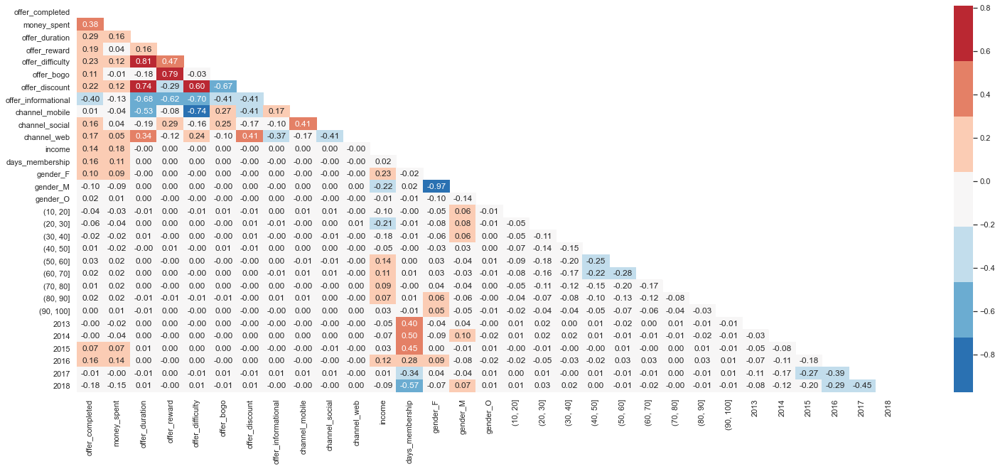

In [37]:

heatmap_vars = data

corr = heatmap_vars.corr()
mask = np.triu(corr)
cmap = sns.color_palette("RdBu_r", 7)

with sns.axes_style('white'):
    f, ax = plt.subplots(figsize = (26, 10))
    ax = sns.heatmap(corr, mask = mask, cmap = cmap, annot = True, fmt = '.2f')

figure = ax.get_figure()    

In [38]:
train = data[['money_spent', 'offer_duration', 'offer_reward', 'offer_difficulty', 
              'offer_discount', 'offer_informational', 'channel_social', 'channel_web',
              'days_membership', '2016', '2018']]
target = np.ravel(data[['offer_completed']])

In [39]:
model_opt = [LogisticRegression(),
             DecisionTreeClassifier(),
             AdaBoostClassifier(),
             RandomForestClassifier(),
             XGBClassifier()] 

model_cols = ['Model Name', 'Model Parameters', 'Model Test Accuracy']
model_df = pd.DataFrame(columns = model_cols)

counter = 0
for model in model_opt:
    
    model_name = model.__class__.__name__
    model_df.loc[counter, 'Model Name'] = model_name
    model_df.loc[counter, 'Model Parameters'] = str(model.get_params())
    
    accuracy = cross_val_score(model, train, target, cv = 10)
    
    model_df.loc[counter, 'Model Test Accuracy'] = np.mean(accuracy)
    
    counter += 1
    
model_df.sort_values(by = ['Model Test Accuracy'], ascending = False, inplace = True)

In [40]:
def plot_learning_curve(model_str, train_sizes, train_scores, validation_scores):
    '''
    Plotting the learning curve of a machine learning model given the input
    parameters

    Args:
        model_str (str): string model's name
        train_sizes (list): list of training sizes to be calculated
        train_scores (list): training scores of model (metrics)
        validation_scores (list): validation scores of model (metrics)
    Returns:
        None
        *this function plots learning curves with their std bounds
    '''
    figure, ax = plt.subplots(figsize = (8, 6))
    
    train_scores_mean = train_scores.mean(axis = 1)
    train_scores_std = train_scores.std(axis = 1)
    validation_scores_mean = validation_scores.mean(axis = 1)
    validation_scores_std = validation_scores.std(axis = 1)
    
    plt.plot(train_sizes, train_scores_mean, label = 'Training Score', marker = 'o', color = 'r')
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color = "r")
    plt.plot(train_sizes, validation_scores_mean, label = 'Validation Score', marker = 'o', color = 'g')
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std,
                         validation_scores_mean + validation_scores_std, alpha=0.1,
                         color = "g")
    
    plt.ylabel('Accuracy')
    plt.xlabel('Training set size')
    plt.title('Learning curves for ' + str(model_str))
    plt.legend()
    plt.show()
    
    figure = ax.get_figure() 
    
    return

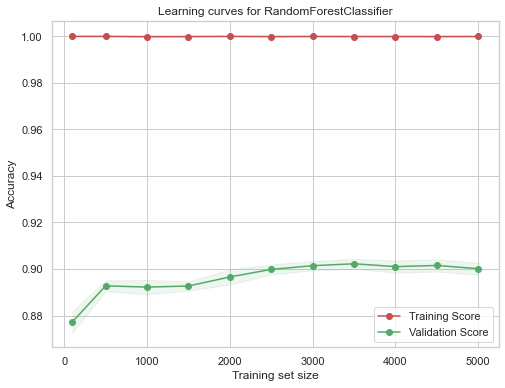

In [41]:
train_sizes = [100, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000]

model = RandomForestClassifier()
                   
model.fit(train, target)
                   
train_sizes, train_scores, validation_scores = learning_curve(estimator = model, 
                                                              X = train, y = target, 
                                                              train_sizes = train_sizes, cv = 10)
plot_learning_curve('RandomForestClassifier', train_sizes, train_scores, validation_scores)

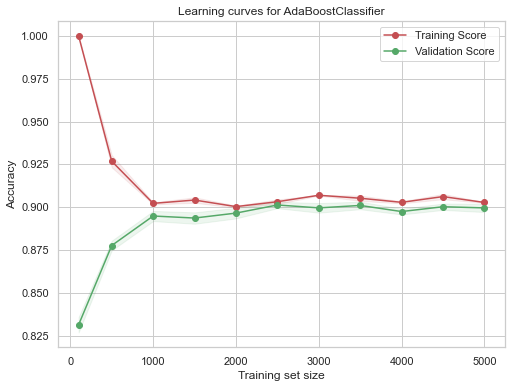

In [42]:
model = AdaBoostClassifier()                
model.fit(train, target)
                   
train_sizes, train_scores, validation_scores = learning_curve(estimator = model, 
                                                              X = train, y = target, 
                                                              train_sizes = train_sizes, cv = 10)
plot_learning_curve('AdaBoostClassifier', train_sizes, train_scores, validation_scores)

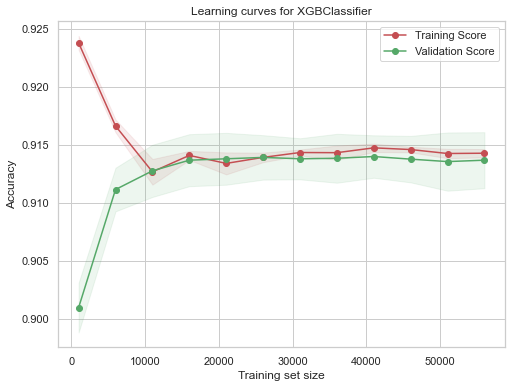

In [43]:
train_sizes = list(range(1000, 59000, 5000))
model = XGBClassifier()
                   
fit = model.fit(train, target)
                   
train_sizes, train_scores, validation_scores = learning_curve(estimator = model, 
                                                              X = train, y = target, 
                                                              train_sizes = train_sizes, cv = 10)
plot_learning_curve('XGBClassifier', train_sizes, train_scores, validation_scores)

In [44]:
model = XGBClassifier()

hyperparameters = {
                    'max_depth': [6], # 'max_depth': [3, 5, 6]
                    'booster': ['gbtree'], # 'booster': ['gbtree', 'gblinear']
                    'num_parallel_tree': [1] # 'num_parallel_tree': [1, 2]
}

grid = GridSearchCV(model, param_grid = hyperparameters, cv = 10, scoring =  ['accuracy', 'precision', 'f1'], refit = 'accuracy')
grid.fit(train, target)

best_params = grid.best_params_
best_score = grid.best_score_
tuned_model = grid.best_estimator_

In [45]:
print('Best parameters of XGB Classifier:', str(best_params))
print('The model accuracy is: ' + str(round(best_score*100,2)) + '%')

Best parameters of XGB Classifier: {'booster': 'gbtree', 'max_depth': 6, 'num_parallel_tree': 1}
The model accuracy is: 91.45%


In [48]:
fit_var = tuned_model.fit(train, target)

In [49]:
important_feature = fit_var.feature_importances_
feature_names = train.columns.tolist()
df_feature = pd.DataFrame(data = important_feature, columns = ['values'])
df_feature['feature_names'] = feature_names
df_feature = df_feature.sort_values(by = ['values'], ascending = False)
df_feature.head()

,values,feature_names
1,0.415591,offer_duration
0,0.286335,money_spent
6,0.099435,channel_social
3,0.075800,offer_difficulty
2,0.070569,offer_reward


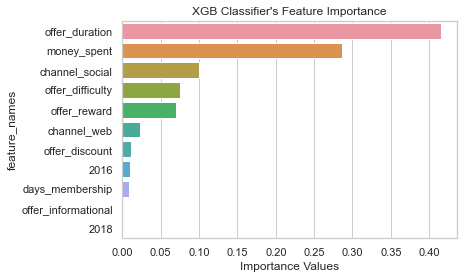

In [50]:
sns.barplot(data = df_feature, x = 'values', y = 'feature_names')
plt.title('XGB Classifier\'s Feature Importance')
plt.xlabel('Importance Values')
plt.show()